In [1]:
import numpy as np
from numpy import genfromtxt
from itertools import combinations
import torch
import math 
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt

In [2]:
data = genfromtxt('small_file_correct_coord.txt', delimiter=',')
#data = genfromtxt('test_output_false_negative.txt', delimiter=',')
#data = genfromtxt('small_file.txt', delimiter=',')
data[:,4] =(data[:,4]-np.min(data[:,4]))/(np.max(data[:,4])-np.min(data[:,4]))
print(data)

[[ 0.          1.128016    0.913283   -2.69977     0.27121927]
 [ 1.          0.952915    0.519144    0.878809    0.95261156]
 [ 1.          0.434082    0.56767    -2.311936    0.93668561]
 [ 2.          2.209619    1.105468    2.333682    0.52416023]
 [ 3.          1.71197     1.189179    1.119164    0.78435412]
 [ 3.          0.461599    0.777167   -0.144536    0.75403444]
 [ 4.          2.029792    1.287946    1.30295     0.        ]
 [ 5.          0.756178    1.33176    -2.309371    0.68407621]
 [ 6.          2.1872      0.476108    2.85122     0.8842718 ]
 [ 7.          1.921325    1.287711   -2.407052    1.        ]
 [ 7.          0.24677     0.972258    1.512456    0.95922116]
 [ 8.          2.12424     1.190137    0.532672    0.63181968]
 [ 9.          2.165567    0.780356    1.333373    0.52338727]
 [10.          1.927867    0.979187   -1.390222    0.83159162]
 [10.          0.155214    1.058012   -2.217043    0.81032574]
 [11.          2.17151     0.581699   -0.050691    0.75

### reshape data

In [3]:
ll = []
true_vals = []
print(int(np.max(data,axis=0)[0]))
for i in range(int(np.min(data,axis=0)[0]),int(np.max(data,axis=0)[0])+1,3):
    mask = ((data[:,0] == i) | (data[:,0] == i+1) | (data[:,0] == i+2))
    #print("This is mask:")
    #print(mask)
    evt = data[mask]
    #print(evt)
    #print(evt.shape[0])
    pair_indices = list(combinations(range(evt.shape[0]), 2))
    print("pair indices...")
    print(pair_indices)
    for i, (idx1, idx2) in enumerate(pair_indices):
        l = []
        #print("this are the pairs to be compared")
        #print(evt[idx1,1:])
        #print(evt[idx2,1:])
        ### this is the new stuff....
        time_diff = abs(evt[idx1,4]-evt[idx2,4])
        ene_diff = abs(evt[idx1,1]-evt[idx2,1])
        min_theta = evt[idx1,2] if evt[idx2,2] > evt[idx1,2] else evt[idx2,2]
        max_theta = evt[idx2,2] if evt[idx2,2] > evt[idx1,2] else evt[idx1,2]
        theta_diff = abs(max_theta-min_theta) if (abs(max_theta-min_theta) < abs(max_theta-(min_theta+math.pi))) else abs(max_theta-(min_theta+math.pi)) 
        min_phi = evt[idx1,3] if evt[idx2,3] > evt[idx1,3] else evt[idx2,3]
        max_phi = evt[idx2,3] if evt[idx2,3] > evt[idx1,3] else evt[idx1,3]
        phi_diff = abs(max_phi-min_phi) if (abs(max_phi-min_phi) < abs(max_phi-(min_phi+math.pi))) else abs(max_phi-(min_phi+math.pi))
        #print("energy diff",ene_diff)
        #print("time_diff\t",time_diff)
        #print("theta_diff\t",theta_diff)
        #print("phi_diff\t",phi_diff)
        diff_arr = np.array([ene_diff,theta_diff,phi_diff,time_diff])
        #print("diff_arr\t",diff_arr)
        test_np = np.concatenate((evt[idx1,1:],evt[idx2,1:]))
        #print("fooooo", test_np)
        test_np = np.concatenate((test_np,diff_arr))
        #print("final_arr:\t",test_np)
        l.append(np.concatenate((evt[idx1,1:],evt[idx2,1:],diff_arr)))
        ### end of new stuff
        #l.append(np.concatenate((evt[idx1,1:],evt[idx2,1:])))
        print(l)
        ll.append(l)
        if (evt[idx1,0] == evt[idx2,0]):
            true_vals.append(1)
        else:
            true_vals.append(0)
#print(ll)
input_data = torch.FloatTensor(ll)
input_data = torch.squeeze(input_data)
input_data.shape
truth_class = torch.FloatTensor(true_vals)
print(input_data.shape)
print(truth_class.shape)

29
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
[array([ 1.128016  ,  0.913283  , -2.69977   ,  0.27121927,  0.952915  ,
        0.519144  ,  0.878809  ,  0.95261156,  0.175101  ,  0.394139  ,
        0.43698635,  0.68139229])]
[array([ 1.128016  ,  0.913283  , -2.69977   ,  0.27121927,  0.434082  ,
        0.56767   , -2.311936  ,  0.93668561,  0.693934  ,  0.345613  ,
        0.387834  ,  0.66546634])]
[array([ 1.128016  ,  0.913283  , -2.69977   ,  0.27121927,  2.209619  ,
        1.105468  ,  2.333682  ,  0.52416023,  1.081603  ,  0.192185  ,
        1.89185935,  0.25294096])]
[array([ 0.952915  ,  0.519144  ,  0.878809  ,  0.95261156,  0.434082  ,
        0.56767   , -2.311936  ,  0.93668561,  0.518833  ,  0.048526  ,
        0.04915235,  0.01592595])]
[array([0.952915  , 0.519144  , 0.878809  , 0.95261156, 2.209619  ,
       1.105468  , 2.333682  , 0.52416023, 1.256704  , 0.586324  ,
       1.454873  , 0.42845133])]
[array([ 0.434082  ,  0.56767   , -2.311936 

/home/tobiasjenegger/jupy/jup_notebook/lib/python3.6/site-packages/ipykernel_launcher.py:48: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)


In [4]:
class two_hidden_layer_model(nn.Module):
        def __init__(self,nodes,hidden_nodes):
                super().__init__()
                self.linear = torch.nn.Linear(12,nodes)
                self.another_linear = torch.nn.Linear(nodes,hidden_nodes)
                self.another_linear_two = torch.nn.Linear(hidden_nodes,hidden_nodes)
                self.activation = torch.nn.ReLU()
                self.linear_back = torch.nn.Linear(hidden_nodes,1)

        def forward(self, x):
                output_tensor = self.linear(x)
                #output_tensor = self.another_linear(output_tensor)
                output_tensor = self.activation(output_tensor)
                output_tensor = self.another_linear(output_tensor)
                output_tensor = self.another_linear_two(output_tensor)
                output_tensor = self.linear_back(output_tensor)
                output_tensor = torch.sigmoid(output_tensor)
                output_tensor = torch.squeeze(output_tensor)
                return output_tensor

In [5]:
def run_two_hidden_model(features,learning_rate,hidden_features):
    n_epochs = 10000
    model = two_hidden_layer_model(features,hidden_features)
    loss_fn = nn.BCELoss()  # binary cross entropy
    optimizer = optim.SGD(model.parameters(), lr=learning_rate)
    model.train()
    loss_val = []
    for epoch in range(n_epochs):
        y_pred = model(input_data)
        y_true = truth_class
        loss = loss_fn(y_pred,y_true)
        loss_val.append(loss.detach().item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        #print(f'Finished epoch {epoch}, latest loss {loss}')
    plt.plot(loss_val)
    print("this is latest loss val:\t",loss_val[-1])
    torch.save(model,"ff_scripted.pt")
    with torch.no_grad():
        model = torch.load("ff_scripted.pt")
        model.eval()
    eval_pred = model(input_data).detach().numpy()
    return eval_pred,loss_val[-1]

this is latest loss val:	 0.0011572036892175674


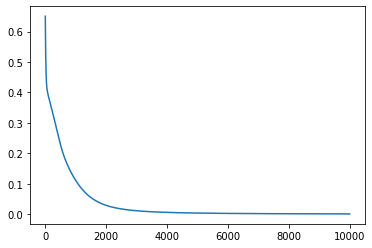

In [6]:
eval_pred_h2 = run_two_hidden_model(1000,5e-3,100)
eval_true = truth_class.detach().numpy()


30
1.128016
1.386997
2.209619
2.173569
2.029792
0.756178
2.1872
2.168095
2.12424
2.165567
2.083081
2.17151
2.145626
2.124236
2.11219
1.763002
1.702479
1.654359
2.126192
0.887473
2.10968
1.4561860000000002
2.154496
1.302665
2.104961
2.141112
2.075262
2.107771
2.133439
0.432454
(57,)
0.00019278128
[1.60259806e-04 1.92781285e-04 5.95348183e-07 9.92973924e-01
 4.58985405e-10 1.80209042e-07 9.92939234e-01 1.07518707e-11
 1.51175098e-03 5.40183731e-11 6.99626096e-03 2.16171903e-09
 1.74642717e-10 2.60160840e-03 5.62414481e-13 9.99999881e-01
 2.28429286e-07 1.14525023e-09 2.41906134e-10 7.75129127e-04
 1.09617060e-09 9.99650598e-01 1.51145071e-06 8.43368895e-08
 4.91696794e-10 9.41310407e-09 3.66581138e-04 1.10452667e-07
 1.06740440e-03 9.97824192e-01 9.98226225e-01 6.16190606e-04
 2.98018875e-07 8.78456467e-06 1.83582756e-07 1.16440475e-08
 9.99818504e-01 3.28740943e-03 5.77084720e-05 3.43083753e-04
 2.69766076e-09 1.32161804e-05 9.99948025e-01 5.31406727e-07
 2.79241562e-04 2.69312608e-07 7

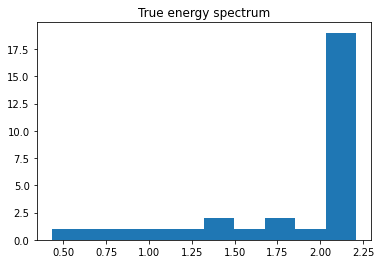

In [7]:
energy_spec = []
unique_ind = np.unique(data[:,0])
print(unique_ind.shape[0])
for i in range(unique_ind.shape[0]):
    ene = np.sum(data[data[:,0] == i,1])
    print (ene)
    energy_spec.append(ene)

plt.hist(energy_spec)
plt.title("True energy spectrum")

print(eval_pred_h2[0].shape)
print(eval_pred_h2[0][1])

print(eval_pred_h2[0])

[[ 0.          1.128016    0.913283   -2.69977     0.27121927]
 [ 1.          0.952915    0.519144    0.878809    0.95261156]
 [ 1.          0.434082    0.56767    -2.311936    0.93668561]
 [ 2.          2.209619    1.105468    2.333682    0.52416023]
 [ 3.          1.71197     1.189179    1.119164    0.78435412]
 [ 3.          0.461599    0.777167   -0.144536    0.75403444]
 [ 4.          2.029792    1.287946    1.30295     0.        ]
 [ 5.          0.756178    1.33176    -2.309371    0.68407621]
 [ 6.          2.1872      0.476108    2.85122     0.8842718 ]
 [ 7.          1.921325    1.287711   -2.407052    1.        ]
 [ 7.          0.24677     0.972258    1.512456    0.95922116]
 [ 8.          2.12424     1.190137    0.532672    0.63181968]
 [ 9.          2.165567    0.780356    1.333373    0.52338727]
 [10.          1.927867    0.979187   -1.390222    0.83159162]
 [10.          0.155214    1.058012   -2.217043    0.81032574]
 [11.          2.17151     0.581699   -0.050691    0.75

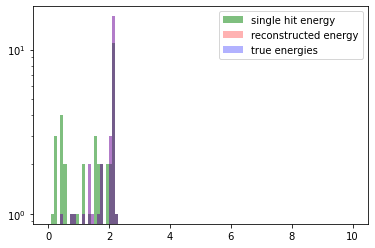

In [8]:
import networkx as nx
print(data)
ene_list = []
idx = 0
for i in range(int(np.min(data,axis=0)[0]),int(np.max(data,axis=0)[0])+1,3):
    mask = ((data[:,0] == i) | (data[:,0] == i+1) | (data[:,0] == i+2))
    evt = data[mask]
    print(evt)
    pair_indices = list(combinations(range(evt.shape[0]), 2))
    print("pair indices...")
    print(pair_indices)
    ##pair indices which belong together...
    pred_comb = []
    for m in range(evt.shape[0]):
        pred_comb.append((m,m))
    for j in range (len(pair_indices)):
        if eval_pred_h2[0][idx+j] > 0.75:
            pred_comb.append(pair_indices[j])
    G = nx.Graph()
    G.add_edges_from(pred_comb)
    connected_components = list(nx.connected_components(G))
    print("Connected components:", connected_components)
    print(type(connected_components))
    for k in range(len(connected_components)):
        print("this is type of k:")
        columns_to_sum = evt[list(connected_components[k]),1]
        ene = np.sum(columns_to_sum)
        ene_list.append(ene)
        print(ene)
        print(type(connected_components[k]))
    idx += len(pair_indices)
single_hit_energies = []
for i in range(data.shape[0]):
    single_hit_energies.append(data[i,1])
    
plt.hist(single_hit_energies,bins=100,range=(0,10),label="single hit energy",color="green",alpha=0.5)    
plt.hist(ene_list,bins=100,range=(0,10),label="reconstructed energy",color="red",alpha=0.3)
plt.hist(energy_spec,bins=100,range=(0,10),label="true energies",color="blue",alpha=0.3)
plt.legend()
plt.yscale('log')
plt.savefig("epoch100.png")
print(eval_pred_h2[0][1])

### hits belonging together and indep.

these are the features... 10
these are the features... 609
these are the features... 1208
these are the features... 1807
these are the features... 2406
these are the features... 3005
these are the features... 3604
these are the features... 4203
these are the features... 4802
these are the features... 5401


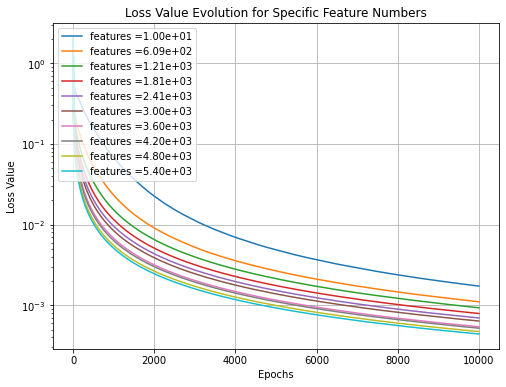

In [9]:
class feed_forward_model(nn.Module):
        def __init__(self,nodes):
                super().__init__()
                self.linear = torch.nn.Linear(12,nodes)
                #self.another_linear = torch.nn.Linear(100,100)
                self.activation = torch.nn.ReLU()
                self.linear_back = torch.nn.Linear(nodes,1)

        def forward(self, x):
                output_tensor = self.linear(x)
                #output_tensor = self.another_linear(output_tensor)
                output_tensor = self.activation(output_tensor)
                output_tensor = self.linear_back(output_tensor)
                output_tensor = torch.sigmoid(output_tensor)
                output_tensor = torch.squeeze(output_tensor)
                return output_tensor


def run_out_features(min_val,max_val,stepsize):
    n_epochs = 10000                                             ##set default n_epochs = 1000
    loss_fn = nn.BCELoss()  # binary cross entropy
    loss_step_vals =[]
    for i in range(stepsize):
            features = ((max_val - min_val)/stepsize)*i+min_val
            print("these are the features...",int(features))
            model = feed_forward_model(int(features))
            #optimizer = optim.SGD(model.parameters(), lr=9e-3)  ##set default lr
            optimizer = optim.SGD(model.parameters(), lr=5e-2)
            model.train()
            loss_val = []
            for epoch in range(n_epochs):
                y_pred = model(input_data)
                y_true = truth_class
                loss = loss_fn(y_pred,y_true)
                loss_val.append(loss.detach().item())
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
            loss_step_vals.append(loss_val)
    return loss_step_vals


min_val = 10
max_val = 6000
#max_val = 2010
stepsize = 10
assert ((max_val-min_val) % stepsize == 0), "Wrong step size!"
test = run_out_features(min_val,max_val,stepsize)

lable_targets = [((max_val - min_val)/stepsize)*i+min_val for i in range(stepsize)]
formatted_labels = [f'{label:.2e}' for label in lable_targets]

plt.figure(figsize=(8, 6))

for y,label in zip(test,formatted_labels):
    plt.plot(y,label="features ="+label)
    
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss Value")
plt.legend(loc='upper left')  # Add a legend to identify the lines
plt.title("Loss Value Evolution for Specific Feature Numbers")

#plt.ylim(0, 0.2)
plt.grid(True)

## fully normalize data

(array([ 664.,  860., 1100., 1170., 1313., 1526., 1391., 1844., 1476.,
        1725.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

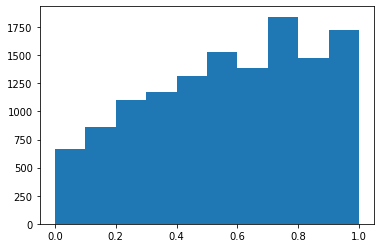

In [10]:
#data = genfromtxt('small_file_correct_coord.txt', delimiter=',')
data = genfromtxt('test_output_false_negative.txt', delimiter=',')
#data = genfromtxt('small_file.txt', delimiter=',')

#data[:,1] =(data[:,1]-np.min(data[:,1]))/(np.max(data[:,1])-np.min(data[:,1]))
data[:,2] =((data[:,2]-np.min(data[:,2]))/(np.max(data[:,2])-np.min(data[:,2])))
data[:,3] =((data[:,3]-np.min(data[:,3]))/(np.max(data[:,3])-np.min(data[:,3])))
data[:,4] =(data[:,4]-np.min(data[:,4]))/(np.max(data[:,4])-np.min(data[:,4]))


plt.hist(data[:,2])

### again reshape data...

In [11]:
ll = []
true_vals = []
print(int(np.max(data,axis=0)[0]))
for i in range(int(np.min(data,axis=0)[0]),int(np.max(data,axis=0)[0])+1,3):
    mask = ((data[:,0] == i) | (data[:,0] == i+1) | (data[:,0] == i+2))
    #print("This is mask:")
    #print(mask)
    evt = data[mask]
    #print(evt)
    #print(evt.shape[0])
    pair_indices = list(combinations(range(evt.shape[0]), 2))
    print("pair indices...")
    print(pair_indices)
    for i, (idx1, idx2) in enumerate(pair_indices):
        l = []
        print("this are the pairs to be compared")
        print(evt[idx1,1:])
        print(evt[idx2,1:])
        ### this is the new stuff....
        time_diff = abs(evt[idx1,4]-evt[idx2,4])
        ene_diff = abs(evt[idx1,1]-evt[idx2,1])
        min_theta = evt[idx1,2] if evt[idx2,2] > evt[idx1,2] else evt[idx2,2]
        max_theta = evt[idx2,2] if evt[idx2,2] > evt[idx1,2] else evt[idx1,2]
        theta_diff = abs(max_theta-min_theta) if (abs(max_theta-min_theta) < abs(max_theta-(min_theta+1))) else abs(max_theta-(min_theta+1)) 
        min_phi = evt[idx1,3] if evt[idx2,3] > evt[idx1,3] else evt[idx2,3]
        max_phi = evt[idx2,3] if evt[idx2,3] > evt[idx1,3] else evt[idx1,3]
        phi_diff = abs(max_phi-min_phi) if (abs(max_phi-min_phi) < abs(max_phi-(min_phi+1))) else abs(max_phi-(min_phi+1))
        print("energy diff",ene_diff)
        print("time_diff\t",time_diff)
        print("theta_diff\t",theta_diff)
        print("phi_diff\t",phi_diff)
        diff_arr = np.array([ene_diff,theta_diff,phi_diff,time_diff])
        print("diff_arr\t",diff_arr)
        test_np = np.concatenate((evt[idx1,1:],evt[idx2,1:]))
        print("fooooo", test_np)
        test_np = np.concatenate((test_np,diff_arr))
        print("final_arr:\t",test_np)
        l.append(np.concatenate((evt[idx1,1:],evt[idx2,1:],diff_arr)))
        ### end of new stuff
        #l.append(np.concatenate((evt[idx1,1:],evt[idx2,1:])))
        print(l)
        ll.append(l)
        if (evt[idx1,0] == evt[idx2,0]):
            true_vals.append(1)
        else:
            true_vals.append(0)
#print(ll)
input_data = torch.FloatTensor(ll)
input_data = torch.squeeze(input_data)
input_data.shape
truth_class = torch.FloatTensor(true_vals)
print(input_data.shape)
print(truth_class.shape)

9719
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.128016   0.50784677 0.07030022 0.32053203]
[0.952915   0.16248464 0.63993945 0.9308782 ]
energy diff 0.17510099999999995
time_diff	 0.6103461713689728
theta_diff	 0.34536212555882484
phi_diff	 0.43036077415739915
diff_arr	 [0.175101   0.34536213 0.43036077 0.61034617]
fooooo [1.128016   0.50784677 0.07030022 0.32053203 0.952915   0.16248464
 0.63993945 0.9308782 ]
final_arr:	 [1.128016   0.50784677 0.07030022 0.32053203 0.952915   0.16248464
 0.63993945 0.9308782  0.175101   0.34536213 0.43036077 0.61034617]
[array([1.128016  , 0.50784677, 0.07030022, 0.32053203, 0.952915  ,
       0.16248464, 0.63993945, 0.9308782 , 0.175101  , 0.34536213,
       0.43036077, 0.61034617])]
this are the pairs to be compared
[1.128016   0.50784677 0.07030022 0.32053203]
[0.434082   0.20500528 0.13203575 0.91661279]
energy diff 0.6939339999999998
time_diff	 0.5960807615792838
theta_diff	 0.3028414856

[0.432454   0.79227047 0.10147807 0.92561445]
[0.396494   0.2803702  0.02291002 0.89415011]
energy diff 0.03595999999999999
time_diff	 0.03146434045202584
theta_diff	 0.488099723632489
phi_diff	 0.078568045990368
diff_arr	 [0.03596    0.48809972 0.07856805 0.03146434]
fooooo [0.432454   0.79227047 0.10147807 0.92561445 0.396494   0.2803702
 0.02291002 0.89415011]
final_arr:	 [0.432454   0.79227047 0.10147807 0.92561445 0.396494   0.2803702
 0.02291002 0.89415011 0.03596    0.48809972 0.07856805 0.03146434]
[array([0.432454  , 0.79227047, 0.10147807, 0.92561445, 0.396494  ,
       0.2803702 , 0.02291002, 0.89415011, 0.03596   , 0.48809972,
       0.07856805, 0.03146434])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.648968   0.80470351 0.06758572 0.16416242]
[1.87284    0.38760412 0.63233047 0.55113563]
energy diff 0.22387200000000007
time_diff	 0.38697321315971556
theta_diff	 0.41709938540211733
phi_diff	 0.4352552495668306
diff_

       0.28007071, 0.42307495])]
this are the pairs to be compared
[2.13347    0.90390139 0.41510955 0.93707246]
[2.224161   0.52264303 0.80297508 0.1239975 ]
energy diff 0.09069100000000008
time_diff	 0.8130749592976818
theta_diff	 0.3812583571817876
phi_diff	 0.3878655276786659
diff_arr	 [0.090691   0.38125836 0.38786553 0.81307496]
fooooo [2.13347    0.90390139 0.41510955 0.93707246 2.224161   0.52264303
 0.80297508 0.1239975 ]
final_arr:	 [2.13347    0.90390139 0.41510955 0.93707246 2.224161   0.52264303
 0.80297508 0.1239975  0.090691   0.38125836 0.38786553 0.81307496]
[array([2.13347   , 0.90390139, 0.41510955, 0.93707246, 2.224161  ,
       0.52264303, 0.80297508, 0.1239975 , 0.090691  , 0.38125836,
       0.38786553, 0.81307496])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.099168   0.16681767 0.73405256 0.42165761]
[0.934505   0.672239   0.53946915 0.56840943]
energy diff 1.164663
time_diff	 0.14675182436140238
theta_d

[0.506601   0.48868856 0.22586727 0.88949534]
energy diff 1.1146820000000002
time_diff	 0.003739046162620663
theta_diff	 0.11825795586181276
phi_diff	 0.44046490194096466
diff_arr	 [1.114682   0.11825796 0.4404649  0.00373905]
fooooo [1.621283   0.60694652 0.78540237 0.89323438 0.506601   0.48868856
 0.22586727 0.88949534]
final_arr:	 [1.621283   0.60694652 0.78540237 0.89323438 0.506601   0.48868856
 0.22586727 0.88949534 1.114682   0.11825796 0.4404649  0.00373905]
[array([1.621283  , 0.60694652, 0.78540237, 0.89323438, 0.506601  ,
       0.48868856, 0.22586727, 0.88949534, 1.114682  , 0.11825796,
       0.4404649 , 0.00373905])]
this are the pairs to be compared
[1.621283   0.60694652 0.78540237 0.89323438]
[2.070601   0.06988663 0.83920754 0.36746155]
energy diff 0.4493179999999999
time_diff	 0.5257728327790849
theta_diff	 0.46294011569932203
phi_diff	 0.05380516492271403
diff_arr	 [0.449318   0.46294012 0.05380516 0.52577283]
fooooo [1.621283   0.60694652 0.78540237 0.89323438 2.0

 1.64265800e+00 1.07778072e-04 3.45721433e-01 1.84839082e-02]
[array([1.90497000e+00, 7.08627678e-02, 7.74381843e-02, 6.42047966e-01,
       2.62312000e-01, 7.07549898e-02, 4.23159617e-01, 6.60531874e-01,
       1.64265800e+00, 1.07778072e-04, 3.45721433e-01, 1.84839082e-02])]
this are the pairs to be compared
[1.90497    0.07086277 0.07743818 0.64204797]
[2.10826    0.97931012 0.18638865 0.44791648]
energy diff 0.20328999999999997
time_diff	 0.19413148126898067
theta_diff	 0.09155265265493318
phi_diff	 0.10895046866655471
diff_arr	 [0.20329    0.09155265 0.10895047 0.19413148]
fooooo [1.90497    0.07086277 0.07743818 0.64204797 2.10826    0.97931012
 0.18638865 0.44791648]
final_arr:	 [1.90497    0.07086277 0.07743818 0.64204797 2.10826    0.97931012
 0.18638865 0.44791648 0.20329    0.09155265 0.10895047 0.19413148]
[array([1.90497   , 0.07086277, 0.07743818, 0.64204797, 2.10826   ,
       0.97931012, 0.18638865, 0.44791648, 0.20329   , 0.09155265,
       0.10895047, 0.19413148])]
th

[2.1615     0.95910129 0.61611875 0.53985032]
energy diff 0.04149100000000017
time_diff	 0.4314838821092719
theta_diff	 0.2773252461808885
phi_diff	 0.06214716694907907
diff_arr	 [0.041491   0.27732525 0.06214717 0.43148388]
fooooo [2.120009   0.23642653 0.55397159 0.10836644 2.1615     0.95910129
 0.61611875 0.53985032]
final_arr:	 [2.120009   0.23642653 0.55397159 0.10836644 2.1615     0.95910129
 0.61611875 0.53985032 0.041491   0.27732525 0.06214717 0.43148388]
[array([2.120009  , 0.23642653, 0.55397159, 0.10836644, 2.1615    ,
       0.95910129, 0.61611875, 0.53985032, 0.041491  , 0.27732525,
       0.06214717, 0.43148388])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.765225   0.99938663 0.75748454 0.46779239]
[2.152194   0.75911951 0.27387    0.06999322]
energy diff 0.3869690000000001
time_diff	 0.39779917765979556
theta_diff	 0.2402671143691829
phi_diff	 0.4836145385721687
diff_arr	 [0.386969   0.24026711 0.48361454 0.397

 0.50411728 0.47567749 0.409288   0.11968448 0.07438718 0.32145284]
[array([1.75426   , 0.56176472, 0.4297301 , 0.79713033, 2.163548  ,
       0.6814492 , 0.50411728, 0.47567749, 0.409288  , 0.11968448,
       0.07438718, 0.32145284])]
this are the pairs to be compared
[0.393066   0.06854247 0.70158392 0.7963782 ]
[2.163548   0.6814492  0.50411728 0.47567749]
energy diff 1.770482
time_diff	 0.32070071611084655
theta_diff	 0.3870932692156034
phi_diff	 0.19746664576098916
diff_arr	 [1.770482   0.38709327 0.19746665 0.32070072]
fooooo [0.393066   0.06854247 0.70158392 0.7963782  2.163548   0.6814492
 0.50411728 0.47567749]
final_arr:	 [0.393066   0.06854247 0.70158392 0.7963782  2.163548   0.6814492
 0.50411728 0.47567749 1.770482   0.38709327 0.19746665 0.32070072]
[array([0.393066  , 0.06854247, 0.70158392, 0.7963782 , 2.163548  ,
       0.6814492 , 0.50411728, 0.47567749, 1.770482  , 0.38709327,
       0.19746665, 0.32070072])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (

       0.47946073, 0.19615279])]
this are the pairs to be compared
[0.498851   0.4542837  0.13273582 0.74314537]
[1.134022   0.86148415 0.70548909 0.94138639]
energy diff 0.6351710000000002
time_diff	 0.1982410236192742
theta_diff	 0.40720045144115946
phi_diff	 0.42724673023796667
diff_arr	 [0.635171   0.40720045 0.42724673 0.19824102]
fooooo [0.498851   0.4542837  0.13273582 0.74314537 1.134022   0.86148415
 0.70548909 0.94138639]
final_arr:	 [0.498851   0.4542837  0.13273582 0.74314537 1.134022   0.86148415
 0.70548909 0.94138639 0.635171   0.40720045 0.42724673 0.19824102]
[array([0.498851  , 0.4542837 , 0.13273582, 0.74314537, 1.134022  ,
       0.86148415, 0.70548909, 0.94138639, 0.635171  , 0.40720045,
       0.42724673, 0.19824102])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.93668    0.35373727 0.38390608 0.9178012 ]
[0.267799   0.85478351 0.65075177 0.91860445]
energy diff 1.6688809999999998
time_diff	 0.00080325300424

 0.30527149 0.86025329 0.380417   0.30624745 0.07052403 0.74379638]
[array([2.084327  , 0.94025502, 0.23474746, 0.11645692, 1.70391   ,
       0.63400757, 0.30527149, 0.86025329, 0.380417  , 0.30624745,
       0.07052403, 0.74379638])]
this are the pairs to be compared
[2.084327   0.94025502 0.23474746 0.11645692]
[0.387254   0.31481274 0.38394221 0.85651993]
energy diff 1.697073
time_diff	 0.7400630104831901
theta_diff	 0.3745577155955745
phi_diff	 0.1491947467322277
diff_arr	 [1.697073   0.37455772 0.14919475 0.74006301]
fooooo [2.084327   0.94025502 0.23474746 0.11645692 0.387254   0.31481274
 0.38394221 0.85651993]
final_arr:	 [2.084327   0.94025502 0.23474746 0.11645692 0.387254   0.31481274
 0.38394221 0.85651993 1.697073   0.37455772 0.14919475 0.74006301]
[array([2.084327  , 0.94025502, 0.23474746, 0.11645692, 0.387254  ,
       0.31481274, 0.38394221, 0.85651993, 1.697073  , 0.37455772,
       0.14919475, 0.74006301])]
this are the pairs to be compared
[1.70391    0.63400757 0

 0.05400382 0.74174677 1.684052   0.24252958 0.32117679 0.03468758]
[array([2.150175  , 0.14589909, 0.73282703, 0.77643435, 0.466123  ,
       0.38842867, 0.05400382, 0.74174677, 1.684052  , 0.24252958,
       0.32117679, 0.03468758])]
this are the pairs to be compared
[1.0883     0.99948126 0.24066674 0.74388386]
[0.466123   0.38842867 0.05400382 0.74174677]
energy diff 0.622177
time_diff	 0.002137084725581606
theta_diff	 0.38894740254846916
phi_diff	 0.1866629206239549
diff_arr	 [0.622177   0.3889474  0.18666292 0.00213708]
fooooo [1.0883     0.99948126 0.24066674 0.74388386 0.466123   0.38842867
 0.05400382 0.74174677]
final_arr:	 [1.0883     0.99948126 0.24066674 0.74388386 0.466123   0.38842867
 0.05400382 0.74174677 0.622177   0.3889474  0.18666292 0.00213708]
[array([1.0883    , 0.99948126, 0.24066674, 0.74388386, 0.466123  ,
       0.38842867, 0.05400382, 0.74174677, 0.622177  , 0.3889474 ,
       0.18666292, 0.00213708])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3)

       0.46078602, 0.72182224])]
this are the pairs to be compared
[1.8951     0.1630139  0.89219579 0.94600027]
[2.096706   0.84765964 0.44727161 0.62790526]
energy diff 0.20160600000000017
time_diff	 0.3180950065385021
theta_diff	 0.3153542568833384
phi_diff	 0.4449241784506506
diff_arr	 [0.201606   0.31535426 0.44492418 0.31809501]
fooooo [1.8951     0.1630139  0.89219579 0.94600027 2.096706   0.84765964
 0.44727161 0.62790526]
final_arr:	 [1.8951     0.1630139  0.89219579 0.94600027 2.096706   0.84765964
 0.44727161 0.62790526 0.201606   0.31535426 0.44492418 0.31809501]
[array([1.8951    , 0.1630139 , 0.89219579, 0.94600027, 2.096706  ,
       0.84765964, 0.44727161, 0.62790526, 0.201606  , 0.31535426,
       0.44492418, 0.31809501])]
this are the pairs to be compared
[0.268694   0.49095102 0.02269067 0.92776858]
[2.12212    0.79191121 0.3529818  0.22417803]
energy diff 1.8534259999999998
time_diff	 0.7035905522904071
theta_diff	 0.3009601887080126
phi_diff	 0.33029113278262257
di

[0.489526   0.87484425 0.07026488 0.80081711]
energy diff 1.185914
time_diff	 0.12208991207390374
theta_diff	 0.24839165324552182
phi_diff	 0.06953042611766444
diff_arr	 [1.185914   0.24839165 0.06953043 0.12208991]
fooooo [1.67544    0.1232359  0.13979531 0.6787272  0.489526   0.87484425
 0.07026488 0.80081711]
final_arr:	 [1.67544    0.1232359  0.13979531 0.6787272  0.489526   0.87484425
 0.07026488 0.80081711 1.185914   0.24839165 0.06953043 0.12208991]
[array([1.67544   , 0.1232359 , 0.13979531, 0.6787272 , 0.489526  ,
       0.87484425, 0.07026488, 0.80081711, 1.185914  , 0.24839165,
       0.06953043, 0.12208991])]
this are the pairs to be compared
[0.341658   0.07086277 0.57751881 0.63547424]
[2.087147   0.42525547 0.86936265 0.18216915]
energy diff 1.7454889999999998
time_diff	 0.4533050963960412
theta_diff	 0.35439270123392747
phi_diff	 0.29184384095660987
diff_arr	 [1.745489   0.3543927  0.29184384 0.4533051 ]
fooooo [0.341658   0.07086277 0.57751881 0.63547424 2.087147   0.4

 1.76374500e+00 3.41691537e-02 2.77090216e-01 5.30578717e-04]
[array([3.77891000e-01, 4.55113500e-01, 4.60543266e-01, 6.38442984e-01,
       2.14163600e+00, 4.20944346e-01, 1.83453050e-01, 6.37912406e-01,
       1.76374500e+00, 3.41691537e-02, 2.77090216e-01, 5.30578717e-04])]
this are the pairs to be compared
[0.377891   0.4551135  0.46054327 0.63844298]
[2.142735   0.42823821 0.0732102  0.57446405]
energy diff 1.764844
time_diff	 0.06397893136674593
theta_diff	 0.026875294637208502
phi_diff	 0.38733306962466085
diff_arr	 [1.764844   0.02687529 0.38733307 0.06397893]
fooooo [0.377891   0.4551135  0.46054327 0.63844298 2.142735   0.42823821
 0.0732102  0.57446405]
final_arr:	 [0.377891   0.4551135  0.46054327 0.63844298 2.142735   0.42823821
 0.0732102  0.57446405 1.764844   0.02687529 0.38733307 0.06397893]
[array([0.377891  , 0.4551135 , 0.46054327, 0.63844298, 2.142735  ,
       0.42823821, 0.0732102 , 0.57446405, 1.764844  , 0.02687529,
       0.38733307, 0.06397893])]
this are the

[0.70553    0.32078084 0.56113916 0.52538404]
energy diff 1.032449
time_diff	 0.011446184889072675
theta_diff	 0.11496152410460961
phi_diff	 0.42665521629815106
diff_arr	 [1.032449   0.11496152 0.42665522 0.01144618]
fooooo [1.737979   0.20581931 0.98779437 0.53683023 0.70553    0.32078084
 0.56113916 0.52538404]
final_arr:	 [1.737979   0.20581931 0.98779437 0.53683023 0.70553    0.32078084
 0.56113916 0.52538404 1.032449   0.11496152 0.42665522 0.01144618]
[array([1.737979  , 0.20581931, 0.98779437, 0.53683023, 0.70553   ,
       0.32078084, 0.56113916, 0.52538404, 1.032449  , 0.11496152,
       0.42665522, 0.01144618])]
this are the pairs to be compared
[0.403743   0.45255048 0.24047238 0.51758533]
[2.082534   0.29178065 0.03902098 0.20386152]
energy diff 1.678791
time_diff	 0.31372381048682574
theta_diff	 0.16076983335582362
phi_diff	 0.20145140584048388
diff_arr	 [1.678791   0.16076983 0.20145141 0.31372381]
fooooo [0.403743   0.45255048 0.24047238 0.51758533 2.082534   0.29178065


diff_arr	 [1.335789   0.4747256  0.12419803 0.38176461]
fooooo [0.511571   0.40027111 0.36767797 0.48120665 1.84736    0.87499671
 0.491876   0.09944204]
final_arr:	 [0.511571   0.40027111 0.36767797 0.48120665 1.84736    0.87499671
 0.491876   0.09944204 1.335789   0.4747256  0.12419803 0.38176461]
[array([0.511571  , 0.40027111, 0.36767797, 0.48120665, 1.84736   ,
       0.87499671, 0.491876  , 0.09944204, 1.335789  , 0.4747256 ,
       0.12419803, 0.38176461])]
this are the pairs to be compared
[0.511571   0.40027111 0.36767797 0.48120665]
[2.150299   0.56544758 0.61610713 0.70057068]
energy diff 1.638728
time_diff	 0.2193640326709242
theta_diff	 0.1651764668770821
phi_diff	 0.24842916915054225
diff_arr	 [1.638728   0.16517647 0.24842917 0.21936403]
fooooo [0.511571   0.40027111 0.36767797 0.48120665 2.150299   0.56544758
 0.61610713 0.70057068]
final_arr:	 [0.511571   0.40027111 0.36767797 0.48120665 2.150299   0.56544758
 0.61610713 0.70057068 1.638728   0.16517647 0.24842917 0.21

 0.31543229 0.73919841]
final_arr:	 [1.099535   0.59267512 0.41522161 0.34322876 2.065741   0.74332784
 0.31543229 0.73919841 0.966206   0.15065271 0.09978932 0.39596965]
[array([1.099535  , 0.59267512, 0.41522161, 0.34322876, 2.065741  ,
       0.74332784, 0.31543229, 0.73919841, 0.966206  , 0.15065271,
       0.09978932, 0.39596965])]
this are the pairs to be compared
[0.327997   0.07075499 0.92323961 0.37804892]
[2.201873   0.85378809 0.54343147 0.72418087]
energy diff 1.873876
time_diff	 0.3461319448152688
theta_diff	 0.2169668972357991
phi_diff	 0.3798081400022444
diff_arr	 [1.873876   0.2169669  0.37980814 0.34613194]
fooooo [0.327997   0.07075499 0.92323961 0.37804892 2.201873   0.85378809
 0.54343147 0.72418087]
final_arr:	 [0.327997   0.07075499 0.92323961 0.37804892 2.201873   0.85378809
 0.54343147 0.72418087 1.873876   0.2169669  0.37980814 0.34613194]
[array([0.327997  , 0.07075499, 0.92323961, 0.37804892, 2.201873  ,
       0.85378809, 0.54343147, 0.72418087, 1.873876  , 

diff_arr	 [0.66861    0.20400111 0.06472971 0.61278547]
fooooo [1.68262    0.87411434 0.30528821 0.65715753 1.01401    0.67011323
 0.2405585  0.04437206]
final_arr:	 [1.68262    0.87411434 0.30528821 0.65715753 1.01401    0.67011323
 0.2405585  0.04437206 0.66861    0.20400111 0.06472971 0.61278547]
[array([1.68262   , 0.87411434, 0.30528821, 0.65715753, 1.01401   ,
       0.67011323, 0.2405585 , 0.04437206, 0.66861   , 0.20400111,
       0.06472971, 0.61278547])]
this are the pairs to be compared
[1.68262    0.87411434 0.30528821 0.65715753]
[2.10256    0.91501918 0.96082605 0.86394576]
energy diff 0.41994
time_diff	 0.20678822637873784
theta_diff	 0.040904845106262244
phi_diff	 0.3444621576728478
diff_arr	 [0.41994    0.04090485 0.34446216 0.20678823]
fooooo [1.68262    0.87411434 0.30528821 0.65715753 2.10256    0.91501918
 0.96082605 0.86394576]
final_arr:	 [1.68262    0.87411434 0.30528821 0.65715753 2.10256    0.91501918
 0.96082605 0.86394576 0.41994    0.04090485 0.34446216 0.2

[1.87008    0.3515379  0.74080802 0.58004842]
[1.82681    0.35300911 0.16334619 0.89068601]
energy diff 0.04326999999999992
time_diff	 0.31063759201337005
theta_diff	 0.0014712144923827997
phi_diff	 0.42253817740165234
diff_arr	 [0.04327    0.00147121 0.42253818 0.31063759]
fooooo [1.87008    0.3515379  0.74080802 0.58004842 1.82681    0.35300911
 0.16334619 0.89068601]
final_arr:	 [1.87008000e+00 3.51537897e-01 7.40808015e-01 5.80048422e-01
 1.82681000e+00 3.53009111e-01 1.63346192e-01 8.90686014e-01
 4.32700000e-02 1.47121449e-03 4.22538177e-01 3.10637592e-01]
[array([1.87008000e+00, 3.51537897e-01, 7.40808015e-01, 5.80048422e-01,
       1.82681000e+00, 3.53009111e-01, 1.63346192e-01, 8.90686014e-01,
       4.32700000e-02, 1.47121449e-03, 4.22538177e-01, 3.10637592e-01])]
this are the pairs to be compared
[1.87008    0.3515379  0.74080802 0.58004842]
[0.307579   0.49097643 0.99180046 0.84915886]
energy diff 1.562501
time_diff	 0.26911043422244096
theta_diff	 0.13943853758300223
phi_d

[2.17622    0.56073864 0.83648969 0.95730489]
[1.841079   0.53855651 0.77997496 0.48233357]
energy diff 0.3351409999999999
time_diff	 0.4749713180734198
theta_diff	 0.022182129168952236
phi_diff	 0.0565147317374447
diff_arr	 [0.335141   0.02218213 0.05651473 0.47497132]
fooooo [2.17622    0.56073864 0.83648969 0.95730489 1.841079   0.53855651
 0.77997496 0.48233357]
final_arr:	 [2.17622    0.56073864 0.83648969 0.95730489 1.841079   0.53855651
 0.77997496 0.48233357 0.335141   0.02218213 0.05651473 0.47497132]
[array([2.17622   , 0.56073864, 0.83648969, 0.95730489, 1.841079  ,
       0.53855651, 0.77997496, 0.48233357, 0.335141  , 0.02218213,
       0.05651473, 0.47497132])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.168583   0.51453514 0.91918576 0.16127321]
[1.74252    0.91400274 0.75944532 0.79275391]
energy diff 0.42606299999999986
time_diff	 0.631480700909255
theta_diff	 0.3994675938501657
phi_diff	 0.15974044062694737
dif

[1.589433   0.32789332 0.50808532 0.5595941 ]
energy diff 0.4406629999999998
time_diff	 0.2508381893972876
theta_diff	 0.45388062395617373
phi_diff	 0.39657921567098076
diff_arr	 [0.440663   0.45388062 0.39657922 0.25083819]
fooooo [2.030096   0.78177394 0.90466454 0.30875591 1.589433   0.32789332
 0.50808532 0.5595941 ]
final_arr:	 [2.030096   0.78177394 0.90466454 0.30875591 1.589433   0.32789332
 0.50808532 0.5595941  0.440663   0.45388062 0.39657922 0.25083819]
[array([2.030096  , 0.78177394, 0.90466454, 0.30875591, 1.589433  ,
       0.32789332, 0.50808532, 0.5595941 , 0.440663  , 0.45388062,
       0.39657922, 0.25083819])]
this are the pairs to be compared
[2.030096   0.78177394 0.90466454 0.30875591]
[0.425248   0.07189849 0.90737156 0.52416485]
energy diff 1.6048479999999998
time_diff	 0.21540893758144714
theta_diff	 0.29012454939127286
phi_diff	 0.0027070199301675313
diff_arr	 [1.604848   0.29012455 0.00270702 0.21540894]
fooooo [2.030096   0.78177394 0.90466454 0.30875591 0.

 0.15078862 0.91466545 0.421633   0.49794871 0.23333745 0.13578952]
[array([1.669805  , 0.8492325 , 0.38412606, 0.77887592, 2.091438  ,
       0.34718121, 0.15078862, 0.91466545, 0.421633  , 0.49794871,
       0.23333745, 0.13578952])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.145495   0.46164853 0.17457063 0.51554902]
[0.645961   0.75032377 0.89853849 0.92597461]
energy diff 1.499534
time_diff	 0.41042558775510674
theta_diff	 0.28867524101104586
phi_diff	 0.27603214486679395
diff_arr	 [1.499534   0.28867524 0.27603214 0.41042559]
fooooo [2.145495   0.46164853 0.17457063 0.51554902 0.645961   0.75032377
 0.89853849 0.92597461]
final_arr:	 [2.145495   0.46164853 0.17457063 0.51554902 0.645961   0.75032377
 0.89853849 0.92597461 1.499534   0.28867524 0.27603214 0.41042559]
[array([2.145495  , 0.46164853, 0.17457063, 0.51554902, 0.645961  ,
       0.75032377, 0.89853849, 0.92597461, 1.499534  , 0.28867524,
       0.27603214, 0.41

diff_arr	 [1.926573   0.12881232 0.18697714 0.02572443]
fooooo [0.225407   0.95923711 0.53930074 0.60364066 2.15198    0.83042479
 0.72627788 0.57791622]
final_arr:	 [0.225407   0.95923711 0.53930074 0.60364066 2.15198    0.83042479
 0.72627788 0.57791622 1.926573   0.12881232 0.18697714 0.02572443]
[array([0.225407  , 0.95923711, 0.53930074, 0.60364066, 2.15198   ,
       0.83042479, 0.72627788, 0.57791622, 1.926573  , 0.12881232,
       0.18697714, 0.02572443])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.18284    0.89989958 0.94622699 0.55646085]
[2.172709   0.18771873 0.69703105 0.82676321]
energy diff 0.010131000000000334
time_diff	 0.27030236170016964
theta_diff	 0.28781915014799775
phi_diff	 0.24919594058436667
diff_arr	 [0.010131   0.28781915 0.24919594 0.27030236]
fooooo [2.18284    0.89989958 0.94622699 0.55646085 2.172709   0.18771873
 0.69703105 0.82676321]
final_arr:	 [2.18284    0.89989958 0.94622699 0.55646085 2.1

[1.581918   0.9149263  0.51091093 0.49293498]
[1.652625   0.20519543 0.41035388 0.5882474 ]
energy diff 0.07070700000000008
time_diff	 0.0953124222452228
theta_diff	 0.2902691297315011
phi_diff	 0.10055705140806903
diff_arr	 [0.070707   0.29026913 0.10055705 0.09531242]
fooooo [1.581918   0.9149263  0.51091093 0.49293498 1.652625   0.20519543
 0.41035388 0.5882474 ]
final_arr:	 [1.581918   0.9149263  0.51091093 0.49293498 1.652625   0.20519543
 0.41035388 0.5882474  0.070707   0.29026913 0.10055705 0.09531242]
[array([1.581918  , 0.9149263 , 0.51091093, 0.49293498, 1.652625  ,
       0.20519543, 0.41035388, 0.5882474 , 0.070707  , 0.29026913,
       0.10055705, 0.09531242])]
this are the pairs to be compared
[1.581918   0.9149263  0.51091093 0.49293498]
[0.499493   0.7116735  0.66373913 0.57336449]
energy diff 1.082425
time_diff	 0.08042951880941313
theta_diff	 0.20325279478178881
phi_diff	 0.1528281959222786
diff_arr	 [1.082425   0.20325279 0.1528282  0.08042952]
fooooo [1.581918   0.

 0.29887881 0.31595451]
final_arr:	 [0.259014   0.28040262 0.4919844  0.64129811 2.22937    0.12213534
 0.29887881 0.31595451 1.970356   0.15826728 0.19310558 0.3253436 ]
[array([0.259014  , 0.28040262, 0.4919844 , 0.64129811, 2.22937   ,
       0.12213534, 0.29887881, 0.31595451, 1.970356  , 0.15826728,
       0.19310558, 0.3253436 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.122952   0.86545091 0.38899857 0.4648958 ]
[2.125545   0.53628704 0.90958082 0.33548026]
energy diff 0.0025929999999996234
time_diff	 0.1294155340269107
theta_diff	 0.32916386998634817
phi_diff	 0.4794177503527832
diff_arr	 [0.002593   0.32916387 0.47941775 0.12941553]
fooooo [2.122952   0.86545091 0.38899857 0.4648958  2.125545   0.53628704
 0.90958082 0.33548026]
final_arr:	 [2.122952   0.86545091 0.38899857 0.4648958  2.125545   0.53628704
 0.90958082 0.33548026 0.002593   0.32916387 0.47941775 0.12941553]
[array([2.122952  , 0.86545091, 0.38899857, 

diff_arr	 [0.25438    0.28500378 0.45293827 0.45136604]
fooooo [2.12926    0.49108246 0.00806614 0.4721545  1.87488    0.20607868
 0.46100441 0.92352054]
final_arr:	 [2.12926    0.49108246 0.00806614 0.4721545  1.87488    0.20607868
 0.46100441 0.92352054 0.25438    0.28500378 0.45293827 0.45136604]
[array([2.12926   , 0.49108246, 0.00806614, 0.4721545 , 1.87488   ,
       0.20607868, 0.46100441, 0.92352054, 0.25438   , 0.28500378,
       0.45293827, 0.45136604])]
this are the pairs to be compared
[2.12926    0.49108246 0.00806614 0.4721545 ]
[0.259831   0.53714663 0.25935769 0.88527911]
energy diff 1.869429
time_diff	 0.41312460874080154
theta_diff	 0.04606417264119367
phi_diff	 0.2512915490390684
diff_arr	 [1.869429   0.04606417 0.25129155 0.41312461]
fooooo [2.12926    0.49108246 0.00806614 0.4721545  0.259831   0.53714663
 0.25935769 0.88527911]
final_arr:	 [2.12926    0.49108246 0.00806614 0.4721545  0.259831   0.53714663
 0.25935769 0.88527911 1.869429   0.04606417 0.25129155 0.4

[0.22496    0.79110069 0.22608392 0.72874021]
[2.097674   0.83507326 0.5576824  0.68250715]
energy diff 1.872714
time_diff	 0.04623306153008899
theta_diff	 0.04397257705255875
phi_diff	 0.3315984804649975
diff_arr	 [1.872714   0.04397258 0.33159848 0.04623306]
fooooo [0.22496    0.79110069 0.22608392 0.72874021 2.097674   0.83507326
 0.5576824  0.68250715]
final_arr:	 [0.22496    0.79110069 0.22608392 0.72874021 2.097674   0.83507326
 0.5576824  0.68250715 1.872714   0.04397258 0.33159848 0.04623306]
[array([0.22496   , 0.79110069, 0.22608392, 0.72874021, 2.097674  ,
       0.83507326, 0.5576824 , 0.68250715, 1.872714  , 0.04397258,
       0.33159848, 0.04623306])]
this are the pairs to be compared
[0.22496    0.79110069 0.22608392 0.72874021]
[0.459776   0.91441282 0.32177133 0.32867363]
energy diff 0.23481600000000002
time_diff	 0.4000665779717804
theta_diff	 0.12331213405839647
phi_diff	 0.09568740812312915
diff_arr	 [0.234816   0.12331213 0.09568741 0.40006658]
fooooo [0.22496    0

[2.14195    0.67189639 0.50345748 0.88418273]
energy diff 1.811864
time_diff	 0.34580212254209686
theta_diff	 0.03877644724920559
phi_diff	 0.2628184302117814
diff_arr	 [1.811864   0.03877645 0.26281843 0.34580212]
fooooo [0.330086   0.71067283 0.24063905 0.53838061 2.14195    0.67189639
 0.50345748 0.88418273]
final_arr:	 [0.330086   0.71067283 0.24063905 0.53838061 2.14195    0.67189639
 0.50345748 0.88418273 1.811864   0.03877645 0.26281843 0.34580212]
[array([0.330086  , 0.71067283, 0.24063905, 0.53838061, 2.14195   ,
       0.67189639, 0.50345748, 0.88418273, 1.811864  , 0.03877645,
       0.26281843, 0.34580212])]
this are the pairs to be compared
[0.330086   0.71067283 0.24063905 0.53838061]
[2.034139   0.53211962 0.31636716 0.81597099]
energy diff 1.704053
time_diff	 0.27759037732440617
theta_diff	 0.17855321520389333
phi_diff	 0.07572811052205561
diff_arr	 [1.704053   0.17855322 0.07572811 0.27759038]
fooooo [0.330086   0.71067283 0.24063905 0.53838061 2.034139   0.53211962
 0

[1.29103    0.56187075 0.44613825 0.67173424]
[2.148249   0.32258152 0.11606567 0.12372709]
energy diff 0.857219
time_diff	 0.5480071486108948
theta_diff	 0.23928922552254844
phi_diff	 0.3300725782510384
diff_arr	 [0.857219   0.23928923 0.33007258 0.54800715]
fooooo [1.29103    0.56187075 0.44613825 0.67173424 2.148249   0.32258152
 0.11606567 0.12372709]
final_arr:	 [1.29103    0.56187075 0.44613825 0.67173424 2.148249   0.32258152
 0.11606567 0.12372709 0.857219   0.23928923 0.33007258 0.54800715]
[array([1.29103   , 0.56187075, 0.44613825, 0.67173424, 2.148249  ,
       0.32258152, 0.11606567, 0.12372709, 0.857219  , 0.23928923,
       0.33007258, 0.54800715])]
this are the pairs to be compared
[1.29103    0.56187075 0.44613825 0.67173424]
[2.112627   0.64422546 0.10140246 0.55745065]
energy diff 0.8215969999999999
time_diff	 0.11428358807549899
theta_diff	 0.08235471428296037
phi_diff	 0.3447357885831123
diff_arr	 [0.821597   0.08235471 0.34473579 0.11428359]
fooooo [1.29103    0.5

[0.313046   0.49070743 0.42960499 0.87623769]
[2.0788     0.16081627 0.7328767  0.56830389]
energy diff 1.7657540000000003
time_diff	 0.3079337992276501
theta_diff	 0.3298911529099203
phi_diff	 0.30327171199192626
diff_arr	 [1.765754   0.32989115 0.30327171 0.3079338 ]
fooooo [0.313046   0.49070743 0.42960499 0.87623769 2.0788     0.16081627
 0.7328767  0.56830389]
final_arr:	 [0.313046   0.49070743 0.42960499 0.87623769 2.0788     0.16081627
 0.7328767  0.56830389 1.765754   0.32989115 0.30327171 0.3079338 ]
[array([0.313046  , 0.49070743, 0.42960499, 0.87623769, 2.0788    ,
       0.16081627, 0.7328767 , 0.56830389, 1.765754  , 0.32989115,
       0.30327171, 0.3079338 ])]
this are the pairs to be compared
[0.313046   0.49070743 0.42960499 0.87623769]
[2.115568   0.37584667 0.89395123 0.61152549]
energy diff 1.8025220000000002
time_diff	 0.2647121979706216
theta_diff	 0.114860755988693
phi_diff	 0.4643462425891628
diff_arr	 [1.802522   0.11486076 0.46434624 0.2647122 ]
fooooo [0.31304

       0.31366714, 0.28292002])]
this are the pairs to be compared
[0.262833   0.55952329 0.74080356 0.91741718]
[2.18073    0.96285424 0.16359817 0.63222601]
energy diff 1.917897
time_diff	 0.28519117307886754
theta_diff	 0.4033309557899607
phi_diff	 0.42279461684111497
diff_arr	 [1.917897   0.40333096 0.42279462 0.28519117]
fooooo [0.262833   0.55952329 0.74080356 0.91741718 2.18073    0.96285424
 0.16359817 0.63222601]
final_arr:	 [0.262833   0.55952329 0.74080356 0.91741718 2.18073    0.96285424
 0.16359817 0.63222601 1.917897   0.40333096 0.42279462 0.28519117]
[array([0.262833  , 0.55952329, 0.74080356, 0.91741718, 2.18073   ,
       0.96285424, 0.16359817, 0.63222601, 1.917897  , 0.40333096,
       0.42279462, 0.28519117])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.156133   0.81027204 0.5394623  0.62649417]
[2.096165   0.4499051  0.16383599 0.82066894]
energy diff 0.05996800000000002
time_diff	 0.1941747683120666
theta_

 0.91516773 0.28100903 0.010565   0.44683825 0.35873156 0.21556857]
[array([2.192447  , 0.69795765, 0.27389929, 0.4965776 , 2.181882  ,
       0.2511194 , 0.91516773, 0.28100903, 0.010565  , 0.44683825,
       0.35873156, 0.21556857])]
this are the pairs to be compared
[2.192447   0.69795765 0.27389929 0.4965776 ]
[1.76124    0.79216795 0.38409789 0.87240207]
energy diff 0.4312070000000001
time_diff	 0.375824470472215
theta_diff	 0.09421030218167348
phi_diff	 0.11019860128283387
diff_arr	 [0.431207   0.0942103  0.1101986  0.37582447]
fooooo [2.192447   0.69795765 0.27389929 0.4965776  1.76124    0.79216795
 0.38409789 0.87240207]
final_arr:	 [2.192447   0.69795765 0.27389929 0.4965776  1.76124    0.79216795
 0.38409789 0.87240207 0.431207   0.0942103  0.1101986  0.37582447]
[array([2.192447  , 0.69795765, 0.27389929, 0.4965776 , 1.76124   ,
       0.79216795, 0.38409789, 0.87240207, 0.431207  , 0.0942103 ,
       0.1101986 , 0.37582447])]
this are the pairs to be compared
[2.192447   0

diff_arr	 [1.665601   0.43576427 0.38019352 0.04454703]
fooooo [1.942208   0.72672037 0.75966563 0.90706238 0.276607   0.16248464
 0.13985914 0.86251535]
final_arr:	 [1.942208   0.72672037 0.75966563 0.90706238 0.276607   0.16248464
 0.13985914 0.86251535 1.665601   0.43576427 0.38019352 0.04454703]
[array([1.942208  , 0.72672037, 0.75966563, 0.90706238, 0.276607  ,
       0.16248464, 0.13985914, 0.86251535, 1.665601  , 0.43576427,
       0.38019352, 0.04454703])]
this are the pairs to be compared
[1.778318   0.63103623 0.83934348 0.27188126]
[0.362009   0.48961212 0.33629032 0.2549675 ]
energy diff 1.416309
time_diff	 0.016913758803687007
theta_diff	 0.14142410758880308
phi_diff	 0.4969468425396577
diff_arr	 [1.416309   0.14142411 0.49694684 0.01691376]
fooooo [1.778318   0.63103623 0.83934348 0.27188126 0.362009   0.48961212
 0.33629032 0.2549675 ]
final_arr:	 [1.778318   0.63103623 0.83934348 0.27188126 0.362009   0.48961212
 0.33629032 0.2549675  1.416309   0.14142411 0.49694684 0.

fooooo [2.040099   0.47408069 0.45849493 0.83219511 0.341009   0.91502444
 0.50830563 0.78988515]
final_arr:	 [2.040099   0.47408069 0.45849493 0.83219511 0.341009   0.91502444
 0.50830563 0.78988515 1.69909    0.44094375 0.04981069 0.04230996]
[array([2.040099  , 0.47408069, 0.45849493, 0.83219511, 0.341009  ,
       0.91502444, 0.50830563, 0.78988515, 1.69909   , 0.44094375,
       0.04981069, 0.04230996])]
this are the pairs to be compared
[2.040099   0.47408069 0.45849493 0.83219511]
[0.491163   0.98382891 0.61609169 0.77573449]
energy diff 1.548936
time_diff	 0.05646061958414905
theta_diff	 0.4902517800906736
phi_diff	 0.15759675972611437
diff_arr	 [1.548936   0.49025178 0.15759676 0.05646062]
fooooo [2.040099   0.47408069 0.45849493 0.83219511 0.491163   0.98382891
 0.61609169 0.77573449]
final_arr:	 [2.040099   0.47408069 0.45849493 0.83219511 0.491163   0.98382891
 0.61609169 0.77573449 1.548936   0.49025178 0.15759676 0.05646062]
[array([2.040099  , 0.47408069, 0.45849493, 0.8

[0.377159   0.71213791 0.92312945 0.64252401]
[2.089908   0.87380853 0.07982764 0.61808558]
energy diff 1.7127489999999999
time_diff	 0.024438432986317316
theta_diff	 0.1616706126876697
phi_diff	 0.15669818701614158
diff_arr	 [1.712749   0.16167061 0.15669819 0.02443843]
fooooo [0.377159   0.71213791 0.92312945 0.64252401 2.089908   0.87380853
 0.07982764 0.61808558]
final_arr:	 [0.377159   0.71213791 0.92312945 0.64252401 2.089908   0.87380853
 0.07982764 0.61808558 1.712749   0.16167061 0.15669819 0.02443843]
[array([0.377159  , 0.71213791, 0.92312945, 0.64252401, 2.089908  ,
       0.87380853, 0.07982764, 0.61808558, 1.712749  , 0.16167061,
       0.15669819, 0.02443843])]
this are the pairs to be compared
[1.575002   0.95886207 0.14130529 0.17775523]
[2.089908   0.87380853 0.07982764 0.61808558]
energy diff 0.5149059999999999
time_diff	 0.4403303448988889
theta_diff	 0.08505354730055337
phi_diff	 0.06147765466951392
diff_arr	 [0.514906   0.08505355 0.06147765 0.44033034]
fooooo [1.

fooooo [2.161052   0.42007686 0.19155692 0.28241785 2.04954    0.34604735
 0.78578186 0.4919213 ]
final_arr:	 [2.161052   0.42007686 0.19155692 0.28241785 2.04954    0.34604735
 0.78578186 0.4919213  0.111512   0.07402952 0.40577506 0.20950345]
[array([2.161052  , 0.42007686, 0.19155692, 0.28241785, 2.04954   ,
       0.34604735, 0.78578186, 0.4919213 , 0.111512  , 0.07402952,
       0.40577506, 0.20950345])]
this are the pairs to be compared
[1.783392   0.21733492 0.41099124 0.55222076]
[0.302656   0.95910129 0.11603877 0.48540611]
energy diff 1.480736
time_diff	 0.06681465306173462
theta_diff	 0.25823363131487487
phi_diff	 0.29495247274634534
diff_arr	 [1.480736   0.25823363 0.29495247 0.06681465]
fooooo [1.783392   0.21733492 0.41099124 0.55222076 0.302656   0.95910129
 0.11603877 0.48540611]
final_arr:	 [1.783392   0.21733492 0.41099124 0.55222076 0.302656   0.95910129
 0.11603877 0.48540611 1.480736   0.25823363 0.29495247 0.06681465]
[array([1.783392  , 0.21733492, 0.41099124, 0.

[2.10584    0.92984524 0.877304   0.88389529]
[0.490032   0.20435161 0.54345677 0.2998406 ]
energy diff 1.6158080000000001
time_diff	 0.5840546893728604
theta_diff	 0.2745063676686814
phi_diff	 0.3338472203540648
diff_arr	 [1.615808   0.27450637 0.33384722 0.58405469]
fooooo [2.10584    0.92984524 0.877304   0.88389529 0.490032   0.20435161
 0.54345677 0.2998406 ]
final_arr:	 [2.10584    0.92984524 0.877304   0.88389529 0.490032   0.20435161
 0.54345677 0.2998406  1.615808   0.27450637 0.33384722 0.58405469]
[array([2.10584   , 0.92984524, 0.877304  , 0.88389529, 0.490032  ,
       0.20435161, 0.54345677, 0.2998406 , 1.615808  , 0.27450637,
       0.33384722, 0.58405469])]
this are the pairs to be compared
[1.602327   0.64572033 0.3475762  0.29048901]
[0.490032   0.20435161 0.54345677 0.2998406 ]
energy diff 1.112295
time_diff	 0.009351591906572698
theta_diff	 0.4413687289372733
phi_diff	 0.19588057339922332
diff_arr	 [1.112295   0.44136873 0.19588057 0.00935159]
fooooo [1.602327   0.6

 0.03902098 0.75761415 1.51864    0.07182138 0.18618697 0.01073087]
[array([1.84882   , 0.38738068, 0.85283401, 0.74688328, 0.33018   ,
       0.3155593 , 0.03902098, 0.75761415, 1.51864   , 0.07182138,
       0.18618697, 0.01073087])]
this are the pairs to be compared
[1.84882    0.38738068 0.85283401 0.74688328]
[2.107923   0.92194589 0.63259439 0.80450844]
energy diff 0.2591030000000001
time_diff	 0.057625166018875906
theta_diff	 0.46543478375162317
phi_diff	 0.2202396140833166
diff_arr	 [0.259103   0.46543478 0.22023961 0.05762517]
fooooo [1.84882    0.38738068 0.85283401 0.74688328 2.107923   0.92194589
 0.63259439 0.80450844]
final_arr:	 [1.84882    0.38738068 0.85283401 0.74688328 2.107923   0.92194589
 0.63259439 0.80450844 0.259103   0.46543478 0.22023961 0.05762517]
[array([1.84882   , 0.38738068, 0.85283401, 0.74688328, 2.107923  ,
       0.92194589, 0.63259439, 0.80450844, 0.259103  , 0.46543478,
       0.22023961, 0.05762517])]
this are the pairs to be compared
[0.33018   

fooooo [0.479511   0.2803737  0.97717036 0.39964132 2.11243    0.83030211
 0.24050836 0.27987402]
final_arr:	 [0.479511   0.2803737  0.97717036 0.39964132 2.11243    0.83030211
 0.24050836 0.27987402 1.632919   0.45007159 0.26333799 0.1197673 ]
[array([0.479511  , 0.2803737 , 0.97717036, 0.39964132, 2.11243   ,
       0.83030211, 0.24050836, 0.27987402, 1.632919  , 0.45007159,
       0.26333799, 0.1197673 ])]
this are the pairs to be compared
[0.479511   0.2803737  0.97717036 0.39964132]
[1.80592    0.91402815 0.7407402  0.21390048]
energy diff 1.326409
time_diff	 0.1857408389960587
theta_diff	 0.3663455522706123
phi_diff	 0.23643015925191624
diff_arr	 [1.326409   0.36634555 0.23643016 0.18574084]
fooooo [0.479511   0.2803737  0.97717036 0.39964132 1.80592    0.91402815
 0.7407402  0.21390048]
final_arr:	 [0.479511   0.2803737  0.97717036 0.39964132 1.80592    0.91402815
 0.7407402  0.21390048 1.326409   0.36634555 0.23643016 0.18574084]
[array([0.479511  , 0.2803737 , 0.97717036, 0.39

 0.52301532 0.81450991 0.299619   0.25849826 0.4381224  0.00702932]
[array([0.42765   , 0.57411977, 0.08489292, 0.80748059, 0.128031  ,
       0.31562151, 0.52301532, 0.81450991, 0.299619  , 0.25849826,
       0.4381224 , 0.00702932])]
this are the pairs to be compared
[0.42765    0.57411977 0.08489292 0.80748059]
[2.11091    0.71109694 0.20941742 0.7972269 ]
energy diff 1.6832600000000002
time_diff	 0.010253689339912442
theta_diff	 0.13697716682117766
phi_diff	 0.12452450859056208
diff_arr	 [1.68326    0.13697717 0.12452451 0.01025369]
fooooo [0.42765    0.57411977 0.08489292 0.80748059 2.11091    0.71109694
 0.20941742 0.7972269 ]
final_arr:	 [0.42765    0.57411977 0.08489292 0.80748059 2.11091    0.71109694
 0.20941742 0.7972269  1.68326    0.13697717 0.12452451 0.01025369]
[array([0.42765   , 0.57411977, 0.08489292, 0.80748059, 2.11091   ,
       0.71109694, 0.20941742, 0.7972269 , 1.68326   , 0.13697717,
       0.12452451, 0.01025369])]
this are the pairs to be compared
[0.128031 

 0.60791667 0.433123  ]
final_arr:	 [0.307393   0.49036657 0.38387838 0.80934955 2.102907   0.70496761
 0.60791667 0.433123   1.795514   0.21460104 0.22403829 0.37622655]
[array([0.307393  , 0.49036657, 0.38387838, 0.80934955, 2.102907  ,
       0.70496761, 0.60791667, 0.433123  , 1.795514  , 0.21460104,
       0.22403829, 0.37622655])]
this are the pairs to be compared
[2.14678    0.06926625 0.83019714 0.68207541]
[2.102907   0.70496761 0.60791667 0.433123  ]
energy diff 0.04387300000000005
time_diff	 0.2489524194730342
theta_diff	 0.36429864515077537
phi_diff	 0.22228046451990824
diff_arr	 [0.043873   0.36429865 0.22228046 0.24895242]
fooooo [2.14678    0.06926625 0.83019714 0.68207541 2.102907   0.70496761
 0.60791667 0.433123  ]
final_arr:	 [2.14678    0.06926625 0.83019714 0.68207541 2.102907   0.70496761
 0.60791667 0.433123   0.043873   0.36429865 0.22228046 0.24895242]
[array([2.14678   , 0.06926625, 0.83019714, 0.68207541, 2.102907  ,
       0.70496761, 0.60791667, 0.433123  ,

 0.10145164 0.36284086]
final_arr:	 [2.115807   0.79334037 0.44852054 0.4809967  0.676702   0.75159345
 0.10145164 0.36284086 1.439105   0.04174692 0.34706889 0.11815585]
[array([2.115807  , 0.79334037, 0.44852054, 0.4809967 , 0.676702  ,
       0.75159345, 0.10145164, 0.36284086, 1.439105  , 0.04174692,
       0.34706889, 0.11815585])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.132051   0.73708547 0.60093471 0.67679008]
[2.161059   0.54976718 0.43006215 0.25199876]
energy diff 0.0290079999999997
time_diff	 0.42479131895961125
theta_diff	 0.18731828879966772
phi_diff	 0.17087255469235618
diff_arr	 [0.029008   0.18731829 0.17087255 0.42479132]
fooooo [2.132051   0.73708547 0.60093471 0.67679008 2.161059   0.54976718
 0.43006215 0.25199876]
final_arr:	 [2.132051   0.73708547 0.60093471 0.67679008 2.161059   0.54976718
 0.43006215 0.25199876 0.029008   0.18731829 0.17087255 0.42479132]
[array([2.132051  , 0.73708547, 0.60093471, 0

[array([2.085285  , 0.97325965, 0.7906316 , 0.7332098 , 2.119766  ,
       0.30565335, 0.36783046, 0.39794881, 0.034481  , 0.33239371,
       0.42280114, 0.33526099])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.1272     0.20473891 0.6470131  0.76539445]
[1.80547    0.75043768 0.91534394 0.20976719]
energy diff 0.3217300000000003
time_diff	 0.5556272587940297
theta_diff	 0.45430122130956474
phi_diff	 0.2683308434883722
diff_arr	 [0.32173    0.45430122 0.26833084 0.55562726]
fooooo [2.1272     0.20473891 0.6470131  0.76539445 1.80547    0.75043768
 0.91534394 0.20976719]
final_arr:	 [2.1272     0.20473891 0.6470131  0.76539445 1.80547    0.75043768
 0.91534394 0.20976719 0.32173    0.45430122 0.26833084 0.55562726]
[array([2.1272    , 0.20473891, 0.6470131 , 0.76539445, 1.80547   ,
       0.75043768, 0.91534394, 0.20976719, 0.32173   , 0.45430122,
       0.26833084, 0.55562726])]
this are the pairs to be compared
[2.1272     0.20

diff_arr	 [1.738699   0.03130559 0.1290629  0.34127755]
fooooo [0.482313   0.6719218  0.50395221 0.85054381 2.221012   0.64061621
 0.37488931 0.50926627]
final_arr:	 [0.482313   0.6719218  0.50395221 0.85054381 2.221012   0.64061621
 0.37488931 0.50926627 1.738699   0.03130559 0.1290629  0.34127755]
[array([0.482313  , 0.6719218 , 0.50395221, 0.85054381, 2.221012  ,
       0.64061621, 0.37488931, 0.50926627, 1.738699  , 0.03130559,
       0.1290629 , 0.34127755])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.058792   0.45585393 0.30502524 0.50778008]
[1.64542    0.24129144 0.61603105 0.90798038]
energy diff 0.41337199999999985
time_diff	 0.4002003019867729
theta_diff	 0.21456248236557976
phi_diff	 0.3110058045090999
diff_arr	 [0.413372   0.21456248 0.3110058  0.4002003 ]
fooooo [2.058792   0.45585393 0.30502524 0.50778008 1.64542    0.24129144
 0.61603105 0.90798038]
final_arr:	 [2.058792   0.45585393 0.30502524 0.50778008 1.6454

[1.204895   0.21813143 0.54855516 0.85304106]
energy diff 0.7224030000000001
time_diff	 0.2540835814858704
theta_diff	 0.12003410343540416
phi_diff	 0.3469643125759588
diff_arr	 [0.722403   0.1200341  0.34696431 0.25408358]
fooooo [0.482492   0.09809732 0.20159085 0.59895748 1.204895   0.21813143
 0.54855516 0.85304106]
final_arr:	 [0.482492   0.09809732 0.20159085 0.59895748 1.204895   0.21813143
 0.54855516 0.85304106 0.722403   0.1200341  0.34696431 0.25408358]
[array([0.482492  , 0.09809732, 0.20159085, 0.59895748, 1.204895  ,
       0.21813143, 0.54855516, 0.85304106, 0.722403  , 0.1200341 ,
       0.34696431, 0.25408358])]
this are the pairs to be compared
[2.159626   0.83099172 0.62750603 0.70207721]
[1.204895   0.21813143 0.54855516 0.85304106]
energy diff 0.9547309999999998
time_diff	 0.15096384679795183
theta_diff	 0.38713971017337356
phi_diff	 0.07895087457628203
diff_arr	 [0.954731   0.38713971 0.07895087 0.15096385]
fooooo [2.159626   0.83099172 0.62750603 0.70207721 1.204

final_arr:	 [1.96928    0.24215893 0.47709595 0.79518412 0.250807   0.9585659
 0.72604452 0.79126897 1.718473   0.28359302 0.24894857 0.00391515]
[array([1.96928   , 0.24215893, 0.47709595, 0.79518412, 0.250807  ,
       0.9585659 , 0.72604452, 0.79126897, 1.718473  , 0.28359302,
       0.24894857, 0.00391515])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.025776   0.75694993 0.35304182 0.47129069]
[2.092709   0.67767347 0.46301565 0.34626794]
energy diff 0.06693300000000013
time_diff	 0.1250227512608345
theta_diff	 0.0792764674028289
phi_diff	 0.10997383872012684
diff_arr	 [0.066933   0.07927647 0.10997384 0.12502275]
fooooo [2.025776   0.75694993 0.35304182 0.47129069 2.092709   0.67767347
 0.46301565 0.34626794]
final_arr:	 [2.025776   0.75694993 0.35304182 0.47129069 2.092709   0.67767347
 0.46301565 0.34626794 0.066933   0.07927647 0.10997384 0.12502275]
[array([2.025776  , 0.75694993, 0.35304182, 0.47129069, 2.092709  ,
   

 0.07751395 0.60427349 1.574886   0.28326794 0.11722896 0.11666256]
[array([0.1183    , 0.87408892, 0.19474291, 0.72093605, 1.693186  ,
       0.15735686, 0.07751395, 0.60427349, 1.574886  , 0.28326794,
       0.11722896, 0.11666256])]
this are the pairs to be compared
[2.107325   0.96851215 0.77412731 0.09717089]
[1.693186   0.15735686 0.07751395 0.60427349]
energy diff 0.4141389999999998
time_diff	 0.5071025971089709
theta_diff	 0.1888447066946829
phi_diff	 0.3033866401578431
diff_arr	 [0.414139   0.18884471 0.30338664 0.5071026 ]
fooooo [2.107325   0.96851215 0.77412731 0.09717089 1.693186   0.15735686
 0.07751395 0.60427349]
final_arr:	 [2.107325   0.96851215 0.77412731 0.09717089 1.693186   0.15735686
 0.07751395 0.60427349 0.414139   0.18884471 0.30338664 0.5071026 ]
[array([2.107325  , 0.96851215, 0.77412731, 0.09717089, 1.693186  ,
       0.15735686, 0.07751395, 0.60427349, 0.414139  , 0.18884471,
       0.30338664, 0.5071026 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2),

[2.096384   0.59045998 0.6761735  0.43873384]
energy diff 1.552127
time_diff	 0.45108870889861175
theta_diff	 0.3863248028011783
phi_diff	 0.14586405844463357
diff_arr	 [1.552127   0.3863248  0.14586406 0.45108871]
fooooo [0.544257   0.20413517 0.82203756 0.88982255 2.096384   0.59045998
 0.6761735  0.43873384]
final_arr:	 [0.544257   0.20413517 0.82203756 0.88982255 2.096384   0.59045998
 0.6761735  0.43873384 1.552127   0.3863248  0.14586406 0.45108871]
[array([0.544257  , 0.20413517, 0.82203756, 0.88982255, 2.096384  ,
       0.59045998, 0.6761735 , 0.43873384, 1.552127  , 0.3863248 ,
       0.14586406, 0.45108871])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.77675    0.3857053  0.74086882 0.70620709]
[0.275826   0.56073864 0.3364097  0.67215462]
energy diff 1.500924
time_diff	 0.034052473894277346
theta_diff	 0.17503334110270113
phi_diff	 0.40445911732940054
diff_arr	 [1.500924   0.17503334 0.40445912 0.03405247]
fooooo [1.

diff_arr	 [0.479994   0.49889418 0.39161359 0.17278347]
fooooo [2.09019    0.07367989 0.73270526 0.78320008 1.610196   0.57257407
 0.34109167 0.95598355]
final_arr:	 [2.09019    0.07367989 0.73270526 0.78320008 1.610196   0.57257407
 0.34109167 0.95598355 0.479994   0.49889418 0.39161359 0.17278347]
[array([2.09019   , 0.07367989, 0.73270526, 0.78320008, 1.610196  ,
       0.57257407, 0.34109167, 0.95598355, 0.479994  , 0.49889418,
       0.39161359, 0.17278347])]
this are the pairs to be compared
[2.09019    0.07367989 0.73270526 0.78320008]
[0.491214   0.63502577 0.61610825 0.94261002]
energy diff 1.5989760000000002
time_diff	 0.1594099328425953
theta_diff	 0.4386541235189275
phi_diff	 0.11659701202686656
diff_arr	 [1.598976   0.43865412 0.11659701 0.15940993]
fooooo [2.09019    0.07367989 0.73270526 0.78320008 0.491214   0.63502577
 0.61610825 0.94261002]
final_arr:	 [2.09019    0.07367989 0.73270526 0.78320008 0.491214   0.63502577
 0.61610825 0.94261002 1.598976   0.43865412 0.116

       0.44970802, 0.25179164])]
this are the pairs to be compared
[2.136953   0.46457256 0.72251709 0.7639186 ]
[1.931878   0.87476626 0.58415201 0.82329116]
energy diff 0.20507500000000012
time_diff	 0.059372553742397804
theta_diff	 0.4101937026061265
phi_diff	 0.13836507520870522
diff_arr	 [0.205075   0.4101937  0.13836508 0.05937255]
fooooo [2.136953   0.46457256 0.72251709 0.7639186  1.931878   0.87476626
 0.58415201 0.82329116]
final_arr:	 [2.136953   0.46457256 0.72251709 0.7639186  1.931878   0.87476626
 0.58415201 0.82329116 0.205075   0.4101937  0.13836508 0.05937255]
[array([2.136953  , 0.46457256, 0.72251709, 0.7639186 , 1.931878  ,
       0.87476626, 0.58415201, 0.82329116, 0.205075  , 0.4101937 ,
       0.13836508, 0.05937255])]
this are the pairs to be compared
[2.136953   0.46457256 0.72251709 0.7639186 ]
[0.132701   0.20547933 0.10099193 0.82527373]
energy diff 2.004252
time_diff	 0.061355123038591364
theta_diff	 0.2590932271558682
phi_diff	 0.37847484593338143
diff_ar

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.89       0.79239139 0.08483657 0.57964555]
[0.276527   0.07685015 0.5158737  0.57608828]
energy diff 1.613473
time_diff	 0.003557263304517
theta_diff	 0.28445875254329944
phi_diff	 0.43103713118922793
diff_arr	 [1.613473   0.28445875 0.43103713 0.00355726]
fooooo [1.89       0.79239139 0.08483657 0.57964555 0.276527   0.07685015
 0.5158737  0.57608828]
final_arr:	 [1.89       0.79239139 0.08483657 0.57964555 0.276527   0.07685015
 0.5158737  0.57608828 1.613473   0.28445875 0.43103713 0.00355726]
[array([1.89      , 0.79239139, 0.08483657, 0.57964555, 0.276527  ,
       0.07685015, 0.5158737 , 0.57608828, 1.613473  , 0.28445875,
       0.43103713, 0.00355726])]
this are the pairs to be compared
[1.89       0.79239139 0.08483657 0.57964555]
[2.05577    0.93492132 0.80535212 0.84306118]
energy diff 0.16576999999999997
time_diff	 0.2634156317351969
theta_diff	 0.1425299281304272
phi_diff	

       0.23880051, 0.12230123])]
this are the pairs to be compared
[0.459494   0.90138745 0.38793413 0.61720961]
[0.265059   0.3145744  0.36782298 0.70451537]
energy diff 0.19443500000000002
time_diff	 0.08730576217575903
theta_diff	 0.41318695377109316
phi_diff	 0.020111155593157515
diff_arr	 [0.194435   0.41318695 0.02011116 0.08730576]
fooooo [0.459494   0.90138745 0.38793413 0.61720961 0.265059   0.3145744
 0.36782298 0.70451537]
final_arr:	 [0.459494   0.90138745 0.38793413 0.61720961 0.265059   0.3145744
 0.36782298 0.70451537 0.194435   0.41318695 0.02011116 0.08730576]
[array([0.459494  , 0.90138745, 0.38793413, 0.61720961, 0.265059  ,
       0.3145744 , 0.36782298, 0.70451537, 0.194435  , 0.41318695,
       0.02011116, 0.08730576])]
this are the pairs to be compared
[1.825463   0.8309777  0.14913362 0.73951085]
[0.265059   0.3145744  0.36782298 0.70451537]
energy diff 1.5604040000000001
time_diff	 0.03499547247069035
theta_diff	 0.48359670321774484
phi_diff	 0.2186893572857214

[1.67855    0.67012462 0.25947262 0.79829147]
[0.480542   0.21832245 0.09100719 0.81805013]
energy diff 1.198008
time_diff	 0.01975866053301012
theta_diff	 0.4518021720348324
phi_diff	 0.1684654304195117
diff_arr	 [1.198008   0.45180217 0.16846543 0.01975866]
fooooo [1.67855    0.67012462 0.25947262 0.79829147 0.480542   0.21832245
 0.09100719 0.81805013]
final_arr:	 [1.67855    0.67012462 0.25947262 0.79829147 0.480542   0.21832245
 0.09100719 0.81805013 1.198008   0.45180217 0.16846543 0.01975866]
[array([1.67855   , 0.67012462, 0.25947262, 0.79829147, 0.480542  ,
       0.21832245, 0.09100719, 0.81805013, 1.198008  , 0.45180217,
       0.16846543, 0.01975866])]
this are the pairs to be compared
[1.67855    0.67012462 0.25947262 0.79829147]
[1.353293   0.26999634 0.18143719 0.5419848 ]
energy diff 0.3252569999999999
time_diff	 0.2563066722261923
theta_diff	 0.40012828219278435
phi_diff	 0.07803542875607766
diff_arr	 [0.325257   0.40012828 0.07803543 0.25630667]
fooooo [1.67855    0.6

 0.29062197 0.84076503 0.25438    0.24308775 0.17462221 0.3685527 ]
[array([2.06705   , 0.27953426, 0.11599977, 0.47221233, 1.81267   ,
       0.522622  , 0.29062197, 0.84076503, 0.25438   , 0.24308775,
       0.17462221, 0.3685527 ])]
this are the pairs to be compared
[2.06705    0.27953426 0.11599977 0.47221233]
[0.288257   0.35410266 0.58510391 0.89896736]
energy diff 1.778793
time_diff	 0.4267550282842765
theta_diff	 0.07456840577830659
phi_diff	 0.46910414131388994
diff_arr	 [1.778793   0.07456841 0.46910414 0.42675503]
fooooo [2.06705    0.27953426 0.11599977 0.47221233 0.288257   0.35410266
 0.58510391 0.89896736]
final_arr:	 [2.06705    0.27953426 0.11599977 0.47221233 0.288257   0.35410266
 0.58510391 0.89896736 1.778793   0.07456841 0.46910414 0.42675503]
[array([2.06705   , 0.27953426, 0.11599977, 0.47221233, 0.288257  ,
       0.35410266, 0.58510391, 0.89896736, 1.778793  , 0.07456841,
       0.46910414, 0.42675503])]
this are the pairs to be compared
[1.81267    0.522622  

 0.13951738 0.51859116]
final_arr:	 [2.08702    0.24170153 0.91516614 0.67065377 0.418863   0.07543852
 0.13951738 0.51859116 1.668157   0.16626301 0.22435124 0.15206261]
[array([2.08702   , 0.24170153, 0.91516614, 0.67065377, 0.418863  ,
       0.07543852, 0.13951738, 0.51859116, 1.668157  , 0.16626301,
       0.22435124, 0.15206261])]
this are the pairs to be compared
[2.130328   0.75384365 0.85930564 0.74107645]
[1.65398    0.17421405 0.7079583  0.57048119]
energy diff 0.476348
time_diff	 0.17059525933028918
theta_diff	 0.4203704060692197
phi_diff	 0.1513473417290322
diff_arr	 [0.476348   0.42037041 0.15134734 0.17059526]
fooooo [2.130328   0.75384365 0.85930564 0.74107645 1.65398    0.17421405
 0.7079583  0.57048119]
final_arr:	 [2.130328   0.75384365 0.85930564 0.74107645 1.65398    0.17421405
 0.7079583  0.57048119 0.476348   0.42037041 0.15134734 0.17059526]
[array([2.130328  , 0.75384365, 0.85930564, 0.74107645, 1.65398   ,
       0.17421405, 0.7079583 , 0.57048119, 0.476348  ,

 0.03939044 0.81238078]
final_arr:	 [2.13371    0.98040542 0.3364027  0.43815474 1.82527    0.672239
 0.03939044 0.81238078 0.30844    0.30816642 0.29701227 0.37422603]
[array([2.13371   , 0.98040542, 0.3364027 , 0.43815474, 1.82527   ,
       0.672239  , 0.03939044, 0.81238078, 0.30844   , 0.30816642,
       0.29701227, 0.37422603])]
this are the pairs to be compared
[2.13371    0.98040542 0.3364027  0.43815474]
[0.274149   0.38817631 0.58514116 0.80432211]
energy diff 1.8595610000000002
time_diff	 0.3661673697497418
theta_diff	 0.4077708866016959
phi_diff	 0.2487384564446924
diff_arr	 [1.859561   0.40777089 0.24873846 0.36616737]
fooooo [2.13371    0.98040542 0.3364027  0.43815474 0.274149   0.38817631
 0.58514116 0.80432211]
final_arr:	 [2.13371    0.98040542 0.3364027  0.43815474 0.274149   0.38817631
 0.58514116 0.80432211 1.859561   0.40777089 0.24873846 0.36616737]
[array([2.13371   , 0.98040542, 0.3364027 , 0.43815474, 0.274149  ,
       0.38817631, 0.58514116, 0.80432211, 1.85

[1.987194   0.32552658 0.95052295 0.96119504]
[0.262423   0.83113104 0.85314791 0.33254902]
energy diff 1.7247709999999998
time_diff	 0.6286460244657006
theta_diff	 0.4943955402660628
phi_diff	 0.09737503750685461
diff_arr	 [1.724771   0.49439554 0.09737504 0.62864602]
fooooo [1.987194   0.32552658 0.95052295 0.96119504 0.262423   0.83113104
 0.85314791 0.33254902]
final_arr:	 [1.987194   0.32552658 0.95052295 0.96119504 0.262423   0.83113104
 0.85314791 0.33254902 1.724771   0.49439554 0.09737504 0.62864602]
[array([1.987194  , 0.32552658, 0.95052295, 0.96119504, 0.262423  ,
       0.83113104, 0.85314791, 0.33254902, 1.724771  , 0.49439554,
       0.09737504, 0.62864602])]
this are the pairs to be compared
[2.163829   0.65984364 0.82766442 0.91566525]
[1.814      0.95918366 0.07028144 0.34372412]
energy diff 0.3498289999999997
time_diff	 0.5719411341659744
theta_diff	 0.2993400126529705
phi_diff	 0.2426170193969137
diff_arr	 [0.349829   0.29934001 0.24261702 0.57194113]
fooooo [2.1638

[0.277983   0.63517123 0.39866687 0.78732428]
[2.159278   0.66838002 0.50592795 0.61325583]
energy diff 1.8812950000000002
time_diff	 0.1740684480629333
theta_diff	 0.03320878978369035
phi_diff	 0.10726108829969183
diff_arr	 [1.881295   0.03320879 0.10726109 0.17406845]
fooooo [0.277983   0.63517123 0.39866687 0.78732428 2.159278   0.66838002
 0.50592795 0.61325583]
final_arr:	 [0.277983   0.63517123 0.39866687 0.78732428 2.159278   0.66838002
 0.50592795 0.61325583 1.881295   0.03320879 0.10726109 0.17406845]
[array([0.277983  , 0.63517123, 0.39866687, 0.78732428, 2.159278  ,
       0.66838002, 0.50592795, 0.61325583, 1.881295  , 0.03320879,
       0.10726109, 0.17406845])]
this are the pairs to be compared
[1.926161   0.91484656 0.06862851 0.54158203]
[2.159278   0.66838002 0.50592795 0.61325583]
energy diff 0.23311700000000002
time_diff	 0.07167379975027577
theta_diff	 0.24646654410927127
phi_diff	 0.4372994427894116
diff_arr	 [0.233117   0.24646654 0.43729944 0.0716738 ]
fooooo [1.

diff_arr	 [1.968711   0.23808351 0.2927327  0.02944314]
fooooo [0.175416   0.07685015 0.5158737  0.81350329 2.144127   0.83876663
 0.8086064  0.78406014]
final_arr:	 [0.175416   0.07685015 0.5158737  0.81350329 2.144127   0.83876663
 0.8086064  0.78406014 1.968711   0.23808351 0.2927327  0.02944314]
[array([0.175416  , 0.07685015, 0.5158737 , 0.81350329, 2.144127  ,
       0.83876663, 0.8086064 , 0.78406014, 1.968711  , 0.23808351,
       0.2927327 , 0.02944314])]
this are the pairs to be compared
[0.949677   0.92571813 0.72609196 0.07398108]
[2.144127   0.83876663 0.8086064  0.78406014]
energy diff 1.1944500000000002
time_diff	 0.7100790641818464
theta_diff	 0.0869514928577313
phi_diff	 0.08251444362112859
diff_arr	 [1.19445    0.08695149 0.08251444 0.71007906]
fooooo [0.949677   0.92571813 0.72609196 0.07398108 2.144127   0.83876663
 0.8086064  0.78406014]
final_arr:	 [0.949677   0.92571813 0.72609196 0.07398108 2.144127   0.83876663
 0.8086064  0.78406014 1.19445    0.08695149 0.082

[0.198359   0.38860304 0.00799945 0.87840545]
energy diff 1.405661
time_diff	 0.051243451556572395
theta_diff	 0.42940886794469835
phi_diff	 0.42296955597455344
diff_arr	 [1.405661   0.42940887 0.42296956 0.05124345]
fooooo [1.60402    0.95919417 0.58502989 0.9296489  0.198359   0.38860304
 0.00799945 0.87840545]
final_arr:	 [1.60402    0.95919417 0.58502989 0.9296489  0.198359   0.38860304
 0.00799945 0.87840545 1.405661   0.42940887 0.42296956 0.05124345]
[array([1.60402   , 0.95919417, 0.58502989, 0.9296489 , 0.198359  ,
       0.38860304, 0.00799945, 0.87840545, 1.405661  , 0.42940887,
       0.42296956, 0.05124345])]
this are the pairs to be compared
[1.60402    0.95919417 0.58502989 0.9296489 ]
[2.105087   0.81461996 0.70080601 0.36583459]
energy diff 0.5010670000000002
time_diff	 0.5638143042658754
theta_diff	 0.14457420651680553
phi_diff	 0.11577611929607301
diff_arr	 [0.501067   0.14457421 0.11577612 0.5638143 ]
fooooo [1.60402    0.95919417 0.58502989 0.9296489  2.105087   0.

[2.133132   0.59600135 0.85478253 0.57580482]
[0.181624   0.31433431 0.14715199 0.6959284 ]
energy diff 1.9515079999999998
time_diff	 0.12012358962065328
theta_diff	 0.28166703761016576
phi_diff	 0.29236945425835115
diff_arr	 [1.951508   0.28166704 0.29236945 0.12012359]
fooooo [2.133132   0.59600135 0.85478253 0.57580482 0.181624   0.31433431
 0.14715199 0.6959284 ]
final_arr:	 [2.133132   0.59600135 0.85478253 0.57580482 0.181624   0.31433431
 0.14715199 0.6959284  1.951508   0.28166704 0.29236945 0.12012359]
[array([2.133132  , 0.59600135, 0.85478253, 0.57580482, 0.181624  ,
       0.31433431, 0.14715199, 0.6959284 , 1.951508  , 0.28166704,
       0.29236945, 0.12012359])]
this are the pairs to be compared
[1.82545    0.71272675 0.00823551 0.73301211]
[0.181624   0.31433431 0.14715199 0.6959284 ]
energy diff 1.643826
time_diff	 0.03708370305315678
theta_diff	 0.39839244186555967
phi_diff	 0.13891647571664958
diff_arr	 [1.643826   0.39839244 0.13891648 0.0370837 ]
fooooo [1.82545    

[2.074473   0.36746189 0.10114872 0.40603031]
energy diff 1.6830119999999997
time_diff	 0.3930950917492169
theta_diff	 0.19369121494803
phi_diff	 0.26639377859773317
diff_arr	 [1.683012   0.19369121 0.26639378 0.39309509]
fooooo [0.391461   0.5611531  0.3675425  0.7991254  2.074473   0.36746189
 0.10114872 0.40603031]
final_arr:	 [0.391461   0.5611531  0.3675425  0.7991254  2.074473   0.36746189
 0.10114872 0.40603031 1.683012   0.19369121 0.26639378 0.39309509]
[array([0.391461  , 0.5611531 , 0.3675425 , 0.7991254 , 2.074473  ,
       0.36746189, 0.10114872, 0.40603031, 1.683012  , 0.19369121,
       0.26639378, 0.39309509])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.139517   0.6179907  0.95499273 0.75485559]
[1.8617     0.5226553  0.70925323 0.49585582]
energy diff 0.2778170000000002
time_diff	 0.2589997739075701
theta_diff	 0.09533540010199493
phi_diff	 0.24573949987146193
diff_arr	 [0.277817   0.0953354  0.2457395  0.25899

[2.066881   0.56789493 0.18849795 0.54849217]
[0.49689    0.38817631 0.58514116 0.91329185]
energy diff 1.569991
time_diff	 0.36479968097108406
theta_diff	 0.17971862037058134
phi_diff	 0.3966432061456324
diff_arr	 [1.569991   0.17971862 0.39664321 0.36479968]
fooooo [2.066881   0.56789493 0.18849795 0.54849217 0.49689    0.38817631
 0.58514116 0.91329185]
final_arr:	 [2.066881   0.56789493 0.18849795 0.54849217 0.49689    0.38817631
 0.58514116 0.91329185 1.569991   0.17971862 0.39664321 0.36479968]
[array([2.066881  , 0.56789493, 0.18849795, 0.54849217, 0.49689   ,
       0.38817631, 0.58514116, 0.91329185, 1.569991  , 0.17971862,
       0.39664321, 0.36479968])]
this are the pairs to be compared
[2.08365    0.9999483  0.4296911  0.91993033]
[0.814583   0.79147221 0.65747125 0.93431958]
energy diff 1.2690670000000002
time_diff	 0.014389249361771772
theta_diff	 0.20847608816421537
phi_diff	 0.2277801433736829
diff_arr	 [1.269067   0.20847609 0.22778014 0.01438925]
fooooo [2.08365    0

[2.06259    0.33022938 0.47605984 0.79931172]
energy diff 0.05024600000000001
time_diff	 0.42171930227194476
theta_diff	 0.4596042529402381
phi_diff	 0.3263238825345003
diff_arr	 [0.050246   0.45960425 0.32632388 0.4217193 ]
fooooo [2.112836   0.87062513 0.14973596 0.37759242 2.06259    0.33022938
 0.47605984 0.79931172]
final_arr:	 [2.112836   0.87062513 0.14973596 0.37759242 2.06259    0.33022938
 0.47605984 0.79931172 0.050246   0.45960425 0.32632388 0.4217193 ]
[array([2.112836  , 0.87062513, 0.14973596, 0.37759242, 2.06259   ,
       0.33022938, 0.47605984, 0.79931172, 0.050246  , 0.45960425,
       0.32632388, 0.4217193 ])]
this are the pairs to be compared
[1.238719   0.96538571 0.33642308 0.28340288]
[0.286645   0.07086277 0.57751881 0.29550394]
energy diff 0.9520739999999999
time_diff	 0.012101057635391321
theta_diff	 0.10547705378563899
phi_diff	 0.24109573341122553
diff_arr	 [0.952074   0.10547705 0.24109573 0.01210106]
fooooo [1.238719   0.96538571 0.33642308 0.28340288 0.2

this are the pairs to be compared
[1.696162   0.15986204 0.7524893  0.8962622 ]
[0.396472   0.06926625 0.33011715 0.88327836]
energy diff 1.29969
time_diff	 0.01298384064005742
theta_diff	 0.09059579367596832
phi_diff	 0.42237215236418535
diff_arr	 [1.29969    0.09059579 0.42237215 0.01298384]
fooooo [1.696162   0.15986204 0.7524893  0.8962622  0.396472   0.06926625
 0.33011715 0.88327836]
final_arr:	 [1.696162   0.15986204 0.7524893  0.8962622  0.396472   0.06926625
 0.33011715 0.88327836 1.29969    0.09059579 0.42237215 0.01298384]
[array([1.696162  , 0.15986204, 0.7524893 , 0.8962622 , 0.396472  ,
       0.06926625, 0.33011715, 0.88327836, 1.29969   , 0.09059579,
       0.42237215, 0.01298384])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.61761    0.24185399 0.42999959 0.91009702]
[0.228404   0.99997108 0.05383445 0.91318164]
energy diff 1.389206
time_diff	 0.00308462787344721
theta_diff	 0.24188290920179367
phi_diff	 0.37616

[0.240694   0.91430855 0.69490424 0.75356493]
energy diff 1.6447260000000001
time_diff	 0.02859330743685029
theta_diff	 0.12285035321415227
phi_diff	 0.3897605689740114
diff_arr	 [1.644726   0.12285035 0.38976057 0.02859331]
fooooo [1.88542    0.79145819 0.30514367 0.78215824 0.240694   0.91430855
 0.69490424 0.75356493]
final_arr:	 [1.88542    0.79145819 0.30514367 0.78215824 0.240694   0.91430855
 0.69490424 0.75356493 1.644726   0.12285035 0.38976057 0.02859331]
[array([1.88542   , 0.79145819, 0.30514367, 0.78215824, 0.240694  ,
       0.91430855, 0.69490424, 0.75356493, 1.644726  , 0.12285035,
       0.38976057, 0.02859331])]
this are the pairs to be compared
[1.88542    0.79145819 0.30514367 0.78215824]
[2.24163    0.20413517 0.82203756 0.67171947]
energy diff 0.3562099999999997
time_diff	 0.11043876701231914
theta_diff	 0.4126769794801065
phi_diff	 0.4831061167412293
diff_arr	 [0.35621    0.41267698 0.48310612 0.11043877]
fooooo [1.88542    0.79145819 0.30514367 0.78215824 2.2416

diff_arr	 [1.836966   0.32754632 0.18903264 0.29944863]
fooooo [0.277817   0.87421686 0.3217102  0.94999722 2.114783   0.54667053
 0.13267756 0.65054859]
final_arr:	 [0.277817   0.87421686 0.3217102  0.94999722 2.114783   0.54667053
 0.13267756 0.65054859 1.836966   0.32754632 0.18903264 0.29944863]
[array([0.277817  , 0.87421686, 0.3217102 , 0.94999722, 2.114783  ,
       0.54667053, 0.13267756, 0.65054859, 1.836966  , 0.32754632,
       0.18903264, 0.29944863])]
this are the pairs to be compared
[0.87996    0.79177539 0.33631245 0.25014798]
[2.114783   0.54667053 0.13267756 0.65054859]
energy diff 1.234823
time_diff	 0.40040060397354593
theta_diff	 0.2451048601776673
phi_diff	 0.20363488181261777
diff_arr	 [1.234823   0.24510486 0.20363488 0.4004006 ]
fooooo [0.87996    0.79177539 0.33631245 0.25014798 2.114783   0.54667053
 0.13267756 0.65054859]
final_arr:	 [0.87996    0.79177539 0.33631245 0.25014798 2.114783   0.54667053
 0.13267756 0.65054859 1.234823   0.24510486 0.20363488 0.4

energy diff 1.8786829999999999
time_diff	 0.47638652034661455
theta_diff	 0.48797792564890263
phi_diff	 0.12008512961652673
diff_arr	 [1.878683   0.48797793 0.12008513 0.47638652]
fooooo [2.08179    0.12223435 0.70173292 0.93127358 0.203107   0.63425643
 0.82181805 0.45488706]
final_arr:	 [2.08179    0.12223435 0.70173292 0.93127358 0.203107   0.63425643
 0.82181805 0.45488706 1.878683   0.48797793 0.12008513 0.47638652]
[array([2.08179   , 0.12223435, 0.70173292, 0.93127358, 0.203107  ,
       0.63425643, 0.82181805, 0.45488706, 1.878683  , 0.48797793,
       0.12008513, 0.47638652])]
this are the pairs to be compared
[1.8713     0.74902868 0.22617831 0.42431198]
[0.203107   0.63425643 0.82181805 0.45488706]
energy diff 1.668193
time_diff	 0.030575081433039664
theta_diff	 0.11477225529558344
phi_diff	 0.40436026637228917
diff_arr	 [1.668193   0.11477226 0.40436027 0.03057508]
fooooo [1.8713     0.74902868 0.22617831 0.42431198 0.203107   0.63425643
 0.82181805 0.45488706]
final_arr:	 

energy diff 1.0873819999999998
time_diff	 0.01357236264316819
theta_diff	 0.001885678134370336
phi_diff	 0.23155192023157534
diff_arr	 [1.087382   0.00188568 0.23155192 0.01357236]
fooooo [1.595518   0.07179422 0.96425718 0.67271814 0.508136   0.07367989
 0.73270526 0.65914578]
final_arr:	 [1.595518   0.07179422 0.96425718 0.67271814 0.508136   0.07367989
 0.73270526 0.65914578 1.087382   0.00188568 0.23155192 0.01357236]
[array([1.595518  , 0.07179422, 0.96425718, 0.67271814, 0.508136  ,
       0.07367989, 0.73270526, 0.65914578, 1.087382  , 0.00188568,
       0.23155192, 0.01357236])]
this are the pairs to be compared
[1.595518   0.07179422 0.96425718 0.67271814]
[2.085094   0.99964863 0.17625285 0.15177619]
energy diff 0.4895759999999998
time_diff	 0.5209419533249788
theta_diff	 0.07214558977387597
phi_diff	 0.21199566711263684
diff_arr	 [0.489576   0.07214559 0.21199567 0.52094195]
fooooo [1.595518   0.07179422 0.96425718 0.67271814 2.085094   0.99964863
 0.17625285 0.15177619]
fin

 0.0364881  0.81296248 0.305254   0.29810451 0.07440994 0.09484293]
[array([1.770071  , 0.50085171, 0.96207816, 0.71811955, 2.075325  ,
       0.79895622, 0.0364881 , 0.81296248, 0.305254  , 0.29810451,
       0.07440994, 0.09484293])]
this are the pairs to be compared
[1.770071   0.50085171 0.96207816 0.71811955]
[1.14986    0.16150588 0.20176897 0.26291141]
energy diff 0.6202109999999998
time_diff	 0.45520813569181445
theta_diff	 0.33934583091635906
phi_diff	 0.2396908082140211
diff_arr	 [0.620211   0.33934583 0.23969081 0.45520814]
fooooo [1.770071   0.50085171 0.96207816 0.71811955 1.14986    0.16150588
 0.20176897 0.26291141]
final_arr:	 [1.770071   0.50085171 0.96207816 0.71811955 1.14986    0.16150588
 0.20176897 0.26291141 0.620211   0.33934583 0.23969081 0.45520814]
[array([1.770071  , 0.50085171, 0.96207816, 0.71811955, 1.14986   ,
       0.16150588, 0.20176897, 0.26291141, 0.620211  , 0.33934583,
       0.23969081, 0.45520814])]
this are the pairs to be compared
[0.372468   

       0.20856756, 0.02253994])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.09617    0.94550811 0.76849074 0.79898565]
[2.101426   0.63990119 0.61608883 0.31937885]
energy diff 0.0052560000000001494
time_diff	 0.4796068036779216
theta_diff	 0.30560691321849864
phi_diff	 0.1524019111185041
diff_arr	 [0.005256   0.30560691 0.15240191 0.4796068 ]
fooooo [2.09617    0.94550811 0.76849074 0.79898565 2.101426   0.63990119
 0.61608883 0.31937885]
final_arr:	 [2.09617    0.94550811 0.76849074 0.79898565 2.101426   0.63990119
 0.61608883 0.31937885 0.005256   0.30560691 0.15240191 0.4796068 ]
[array([2.09617   , 0.94550811, 0.76849074, 0.79898565, 2.101426  ,
       0.63990119, 0.61608883, 0.31937885, 0.005256  , 0.30560691,
       0.15240191, 0.4796068 ])]
this are the pairs to be compared
[2.09617    0.94550811 0.76849074 0.79898565]
[1.618668   0.60853164 0.49577798 0.66343017]
energy diff 0.47750199999999987
time_diff	 0.13555547728

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.853733   0.48814616 0.73849449 0.46298662]
[2.12054    0.54185908 0.36033593 0.86830059]
energy diff 0.266807
time_diff	 0.40531396739951664
theta_diff	 0.053712910761509025
phi_diff	 0.3781585547066825
diff_arr	 [0.266807   0.05371291 0.37815855 0.40531397]
fooooo [1.853733   0.48814616 0.73849449 0.46298662 2.12054    0.54185908
 0.36033593 0.86830059]
final_arr:	 [1.853733   0.48814616 0.73849449 0.46298662 2.12054    0.54185908
 0.36033593 0.86830059 0.266807   0.05371291 0.37815855 0.40531397]
[array([1.853733  , 0.48814616, 0.73849449, 0.46298662, 2.12054   ,
       0.54185908, 0.36033593, 0.86830059, 0.266807  , 0.05371291,
       0.37815855, 0.40531397])]
this are the pairs to be compared
[1.853733   0.48814616 0.73849449 0.46298662]
[1.204789   0.90728457 0.08637313 0.73417552]
energy diff 0.648944
time_diff	 0.2711888939762841
theta_diff	 0.4191384063215781
phi_diff	 0.347878

 0.0228212  0.68798449 1.253187   0.22743714 0.1218003  0.03970592]
[array([1.587326  , 0.86307453, 0.9010209 , 0.72769041, 0.334139  ,
       0.63563739, 0.0228212 , 0.68798449, 1.253187  , 0.22743714,
       0.1218003 , 0.03970592])]
this are the pairs to be compared
[1.587326   0.86307453 0.9010209  0.72769041]
[0.20295    0.7116735  0.66373913 0.73448682]
energy diff 1.384376
time_diff	 0.006796406607352479
theta_diff	 0.1514010273090357
phi_diff	 0.23728177377775417
diff_arr	 [1.384376   0.15140103 0.23728177 0.00679641]
fooooo [1.587326   0.86307453 0.9010209  0.72769041 0.20295    0.7116735
 0.66373913 0.73448682]
final_arr:	 [1.587326   0.86307453 0.9010209  0.72769041 0.20295    0.7116735
 0.66373913 0.73448682 1.384376   0.15140103 0.23728177 0.00679641]
[array([1.587326  , 0.86307453, 0.9010209 , 0.72769041, 0.20295   ,
       0.7116735 , 0.66373913, 0.73448682, 1.384376  , 0.15140103,
       0.23728177, 0.00679641])]
this are the pairs to be compared
[1.587326   0.86307453 

 0.00567366 0.77350878 0.900275   0.26153883 0.14152273 0.62816316]
[array([0.33816   , 0.35327549, 0.1471964 , 0.14534562, 1.238435  ,
       0.09173666, 0.00567366, 0.77350878, 0.900275  , 0.26153883,
       0.14152273, 0.62816316])]
this are the pairs to be compared
[0.33816    0.35327549 0.1471964  0.14534562]
[0.554692   0.06926625 0.83019714 0.69652488]
energy diff 0.21653199999999995
time_diff	 0.5511792594848045
theta_diff	 0.2840092391218628
phi_diff	 0.31699926060757533
diff_arr	 [0.216532   0.28400924 0.31699926 0.55117926]
fooooo [0.33816    0.35327549 0.1471964  0.14534562 0.554692   0.06926625
 0.83019714 0.69652488]
final_arr:	 [0.33816    0.35327549 0.1471964  0.14534562 0.554692   0.06926625
 0.83019714 0.69652488 0.216532   0.28400924 0.31699926 0.55117926]
[array([0.33816   , 0.35327549, 0.1471964 , 0.14534562, 0.554692  ,
       0.06926625, 0.83019714, 0.69652488, 0.216532  , 0.28400924,
       0.31699926, 0.55117926])]
this are the pairs to be compared
[2.153591   

final_arr:	 [0.403932   0.07578989 0.86112985 0.93809044 1.903169   0.83058952
 0.0594306  0.45007606 1.499237   0.24520037 0.19830075 0.48801437]
[array([0.403932  , 0.07578989, 0.86112985, 0.93809044, 1.903169  ,
       0.83058952, 0.0594306 , 0.45007606, 1.499237  , 0.24520037,
       0.19830075, 0.48801437])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.090326   0.87324335 0.24066197 0.49986639]
[1.963935   0.72777099 0.00828788 0.77676724]
energy diff 0.12639100000000014
time_diff	 0.27690085222076155
theta_diff	 0.1454723571151929
phi_diff	 0.2323740864046506
diff_arr	 [0.126391   0.14547236 0.23237409 0.27690085]
fooooo [2.090326   0.87324335 0.24066197 0.49986639 1.963935   0.72777099
 0.00828788 0.77676724]
final_arr:	 [2.090326   0.87324335 0.24066197 0.49986639 1.963935   0.72777099
 0.00828788 0.77676724 0.126391   0.14547236 0.23237409 0.27690085]
[array([2.090326  , 0.87324335, 0.24066197, 0.49986639, 1.963935  ,
  

this are the pairs to be compared
[1.9077     0.35454604 0.00801043 0.5652722 ]
[0.241737   0.91412804 0.77407685 0.54747998]
energy diff 1.6659629999999999
time_diff	 0.017792224465473128
theta_diff	 0.44041800366971184
phi_diff	 0.23393357565878747
diff_arr	 [1.665963   0.440418   0.23393358 0.01779222]
fooooo [1.9077     0.35454604 0.00801043 0.5652722  0.241737   0.91412804
 0.77407685 0.54747998]
final_arr:	 [1.9077     0.35454604 0.00801043 0.5652722  0.241737   0.91412804
 0.77407685 0.54747998 1.665963   0.440418   0.23393358 0.01779222]
[array([1.9077    , 0.35454604, 0.00801043, 0.5652722 , 0.241737  ,
       0.91412804, 0.77407685, 0.54747998, 1.665963  , 0.440418  ,
       0.23393358, 0.01779222])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.63792    0.91475017 0.88411675 0.65049178]
[0.524282   0.91433483 0.30520209 0.65600548]
energy diff 1.113638
time_diff	 0.005513701314858177
theta_diff	 0.00041533988647390885
p

[1.626161   0.15731305 0.04670652 0.9447755 ]
[2.169486   0.60347834 0.88419793 0.89909802]
energy diff 0.5433250000000001
time_diff	 0.045677487670009786
theta_diff	 0.4461652912549049
phi_diff	 0.1625085857866333
diff_arr	 [0.543325   0.44616529 0.16250859 0.04567749]
fooooo [1.626161   0.15731305 0.04670652 0.9447755  2.169486   0.60347834
 0.88419793 0.89909802]
final_arr:	 [1.626161   0.15731305 0.04670652 0.9447755  2.169486   0.60347834
 0.88419793 0.89909802 0.543325   0.44616529 0.16250859 0.04567749]
[array([1.626161  , 0.15731305, 0.04670652, 0.9447755 , 2.169486  ,
       0.60347834, 0.88419793, 0.89909802, 0.543325  , 0.44616529,
       0.16250859, 0.04567749])]
this are the pairs to be compared
[0.17301    0.9999851  0.96083449 0.91377471]
[2.169486   0.60347834 0.88419793 0.89909802]
energy diff 1.996476
time_diff	 0.014676693506148197
theta_diff	 0.3965067637311893
phi_diff	 0.0766365524097109
diff_arr	 [1.996476   0.39650676 0.07663655 0.01467669]
fooooo [0.17301    0.

diff_arr	 [1.817929   0.49955399 0.1071885  0.07109755]
fooooo [0.285369   0.71260758 0.55389439 0.68047913 2.103298   0.21305359
 0.66108289 0.60938159]
final_arr:	 [0.285369   0.71260758 0.55389439 0.68047913 2.103298   0.21305359
 0.66108289 0.60938159 1.817929   0.49955399 0.1071885  0.07109755]
[array([0.285369  , 0.71260758, 0.55389439, 0.68047913, 2.103298  ,
       0.21305359, 0.66108289, 0.60938159, 1.817929  , 0.49955399,
       0.1071885 , 0.07109755])]
this are the pairs to be compared
[0.285369   0.71260758 0.55389439 0.68047913]
[2.138207   0.78479085 0.36401284 0.24983782]
energy diff 1.852838
time_diff	 0.4306413185619612
theta_diff	 0.07218326828678445
phi_diff	 0.18988154599076595
diff_arr	 [1.852838   0.07218327 0.18988155 0.43064132]
fooooo [0.285369   0.71260758 0.55389439 0.68047913 2.138207   0.78479085
 0.36401284 0.24983782]
final_arr:	 [0.285369   0.71260758 0.55389439 0.68047913 2.138207   0.78479085
 0.36401284 0.24983782 1.852838   0.07218327 0.18988155 0.4

[2.12532    0.91462049 0.64718486 0.83088513]
energy diff 0.3366279999999999
time_diff	 0.5077002082549867
theta_diff	 0.25333279590338176
phi_diff	 0.27974438829802056
diff_arr	 [0.336628   0.2533328  0.27974439 0.50770021]
fooooo [1.788692   0.66128769 0.36744047 0.32318493 2.12532    0.91462049
 0.64718486 0.83088513]
final_arr:	 [1.788692   0.66128769 0.36744047 0.32318493 2.12532    0.91462049
 0.64718486 0.83088513 0.336628   0.2533328  0.27974439 0.50770021]
[array([1.788692  , 0.66128769, 0.36744047, 0.32318493, 2.12532   ,
       0.91462049, 0.64718486, 0.83088513, 0.336628  , 0.2533328 ,
       0.27974439, 0.50770021])]
this are the pairs to be compared
[0.29415    0.87399692 0.70958385 0.36042315]
[2.12532    0.91462049 0.64718486 0.83088513]
energy diff 1.8311699999999997
time_diff	 0.4704619897724419
theta_diff	 0.040623570626181826
phi_diff	 0.06239899016027062
diff_arr	 [1.83117    0.04062357 0.06239899 0.47046199]
fooooo [0.29415    0.87399692 0.70958385 0.36042315 2.12

phi_diff	 0.1744756004479333
diff_arr	 [1.55942    0.20839022 0.1744756  0.05243754]
fooooo [1.86507    0.2799312  0.91513271 0.9073555  0.30565    0.48832141
 0.74065711 0.85491796]
final_arr:	 [1.86507    0.2799312  0.91513271 0.9073555  0.30565    0.48832141
 0.74065711 0.85491796 1.55942    0.20839022 0.1744756  0.05243754]
[array([1.86507   , 0.2799312 , 0.91513271, 0.9073555 , 0.30565   ,
       0.48832141, 0.74065711, 0.85491796, 1.55942   , 0.20839022,
       0.1744756 , 0.05243754])]
this are the pairs to be compared
[1.86507    0.2799312  0.91513271 0.9073555 ]
[2.22336    0.45464383 0.39839451 0.90462422]
energy diff 0.35829
time_diff	 0.0027312874430081013
theta_diff	 0.17471263562074035
phi_diff	 0.4832617950601583
diff_arr	 [0.35829    0.17471264 0.4832618  0.00273129]
fooooo [1.86507    0.2799312  0.91513271 0.9073555  2.22336    0.45464383
 0.39839451 0.90462422]
final_arr:	 [1.86507    0.2799312  0.91513271 0.9073555  2.22336    0.45464383
 0.39839451 0.90462422 0.3582

energy diff 1.643956
time_diff	 0.06373602402260464
theta_diff	 0.2812797375472516
phi_diff	 0.46890293743339295
diff_arr	 [1.643956   0.28127974 0.46890294 0.06373602]
fooooo [1.90063    0.35436729 0.94610713 0.37331871 0.256674   0.63564703
 0.47720419 0.43705473]
final_arr:	 [1.90063    0.35436729 0.94610713 0.37331871 0.256674   0.63564703
 0.47720419 0.43705473 1.643956   0.28127974 0.46890294 0.06373602]
[array([1.90063   , 0.35436729, 0.94610713, 0.37331871, 0.256674  ,
       0.63564703, 0.47720419, 0.43705473, 1.643956  , 0.28127974,
       0.46890294, 0.06373602])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.81599    0.75069004 0.97747328 0.39071101]
[0.240535   0.56201708 0.5082523  0.35362447]
energy diff 1.575455
time_diff	 0.03708654341031453
theta_diff	 0.1886729627753817
phi_diff	 0.4692209796432293
diff_arr	 [1.575455   0.18867296 0.46922098 0.03708654]
fooooo [1.81599    0.75069004 0.97747328 0.39071101 0.24053

       0.27995928, 0.18983925])]
this are the pairs to be compared
[2.119809   0.69626825 0.42960626 0.60478134]
[0.529659   0.63401634 0.1947539  0.7868187 ]
energy diff 1.59015
time_diff	 0.18203735410505462
theta_diff	 0.06225191327983581
phi_diff	 0.23485236426498102
diff_arr	 [1.59015    0.06225191 0.23485236 0.18203735]
fooooo [2.119809   0.69626825 0.42960626 0.60478134 0.529659   0.63401634
 0.1947539  0.7868187 ]
final_arr:	 [2.119809   0.69626825 0.42960626 0.60478134 0.529659   0.63401634
 0.1947539  0.7868187  1.59015    0.06225191 0.23485236 0.18203735]
[array([2.119809  , 0.69626825, 0.42960626, 0.60478134, 0.529659  ,
       0.63401634, 0.1947539 , 0.7868187 , 1.59015   , 0.06225191,
       0.23485236, 0.18203735])]
this are the pairs to be compared
[1.894607   0.98749424 0.26360494 0.00638285]
[1.11171    0.95869559 0.70956554 0.79462059]
energy diff 0.782897
time_diff	 0.7882377401663994
theta_diff	 0.02879865128448711
phi_diff	 0.44596060128760934
diff_arr	 [0.782897 

fooooo [0.160196   0.06926625 0.33011715 0.85409653 0.118822   0.2797393
 0.10107805 0.52572455]
final_arr:	 [0.160196   0.06926625 0.33011715 0.85409653 0.118822   0.2797393
 0.10107805 0.52572455 0.041374   0.21047305 0.2290391  0.32837199]
[array([0.160196  , 0.06926625, 0.33011715, 0.85409653, 0.118822  ,
       0.2797393 , 0.10107805, 0.52572455, 0.041374  , 0.21047305,
       0.2290391 , 0.32837199])]
this are the pairs to be compared
[2.149432   0.28469359 0.70632909 0.9080974 ]
[1.81467    0.42291064 0.42973281 0.54450703]
energy diff 0.334762
time_diff	 0.36359037050754917
theta_diff	 0.1382170527691955
phi_diff	 0.2765962797975546
diff_arr	 [0.334762   0.13821705 0.27659628 0.36359037]
fooooo [2.149432   0.28469359 0.70632909 0.9080974  1.81467    0.42291064
 0.42973281 0.54450703]
final_arr:	 [2.149432   0.28469359 0.70632909 0.9080974  1.81467    0.42291064
 0.42973281 0.54450703 0.334762   0.13821705 0.27659628 0.36359037]
[array([2.149432  , 0.28469359, 0.70632909, 0.9080

diff_arr	 [0.482911   0.06715976 0.23635932 0.45285064]
fooooo [1.62615    0.3515379  0.74080802 0.85548376 2.109061   0.28437814
 0.97716734 0.40263312]
final_arr:	 [1.62615    0.3515379  0.74080802 0.85548376 2.109061   0.28437814
 0.97716734 0.40263312 0.482911   0.06715976 0.23635932 0.45285064]
[array([1.62615   , 0.3515379 , 0.74080802, 0.85548376, 2.109061  ,
       0.28437814, 0.97716734, 0.40263312, 0.482911  , 0.06715976,
       0.23635932, 0.45285064])]
this are the pairs to be compared
[0.48039    0.91452673 0.336368   0.8209382 ]
[2.109061   0.28437814 0.97716734 0.40263312]
energy diff 1.6286710000000002
time_diff	 0.4183050793538982
theta_diff	 0.3698514064600247
phi_diff	 0.3592006602798231
diff_arr	 [1.628671   0.36985141 0.35920066 0.41830508]
fooooo [0.48039    0.91452673 0.336368   0.8209382  2.109061   0.28437814
 0.97716734 0.40263312]
final_arr:	 [0.48039    0.91452673 0.336368   0.8209382  2.109061   0.28437814
 0.97716734 0.40263312 1.628671   0.36985141 0.3592

diff_arr	 [0.051671   0.1256482  0.35796415 0.12655382]
fooooo [2.131033   0.38135474 0.08800425 0.74900786 2.079362   0.50700295
 0.73004011 0.87556168]
final_arr:	 [2.131033   0.38135474 0.08800425 0.74900786 2.079362   0.50700295
 0.73004011 0.87556168 0.051671   0.1256482  0.35796415 0.12655382]
[array([2.131033  , 0.38135474, 0.08800425, 0.74900786, 2.079362  ,
       0.50700295, 0.73004011, 0.87556168, 0.051671  , 0.1256482 ,
       0.35796415, 0.12655382])]
this are the pairs to be compared
[1.834583   0.79064416 0.15935427 0.33643803]
[0.330963   0.45333472 0.80506814 0.2828155 ]
energy diff 1.5036200000000002
time_diff	 0.05362253471200484
theta_diff	 0.3373094387303568
phi_diff	 0.3542861281544559
diff_arr	 [1.50362    0.33730944 0.35428613 0.05362253]
fooooo [1.834583   0.79064416 0.15935427 0.33643803 0.330963   0.45333472
 0.80506814 0.2828155 ]
final_arr:	 [1.834583   0.79064416 0.15935427 0.33643803 0.330963   0.45333472
 0.80506814 0.2828155  1.50362    0.33730944 0.354

[array([0.198725  , 0.7112862 , 0.19482616, 0.89494314, 1.19496   ,
       0.20526465, 0.88420573, 0.86080887, 0.996235  , 0.49397845,
       0.31062043, 0.03413428])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.040081   0.79657196 0.92974069 0.32111942]
[1.65269    0.91400274 0.25936422 0.455424  ]
energy diff 0.3873909999999998
time_diff	 0.13430458399560996
theta_diff	 0.11743078106681015
phi_diff	 0.3296235306664801
diff_arr	 [0.387391   0.11743078 0.32962353 0.13430458]
fooooo [2.040081   0.79657196 0.92974069 0.32111942 1.65269    0.91400274
 0.25936422 0.455424  ]
final_arr:	 [2.040081   0.79657196 0.92974069 0.32111942 1.65269    0.91400274
 0.25936422 0.455424   0.387391   0.11743078 0.32962353 0.13430458]
[array([2.040081  , 0.79657196, 0.92974069, 0.32111942, 1.65269   ,
       0.91400274, 0.25936422, 0.455424  , 0.387391  , 0.11743078,
       0.32962353, 0.13430458])]
this are the pairs to be compared
[2.040081   0.7

theta_diff	 0.17065299491602953
phi_diff	 0.36619217676652316
diff_arr	 [1.112411   0.17065299 0.36619218 0.00170762]
fooooo [1.588405   0.64785837 0.50830818 0.511826   0.475994   0.47720538
 0.87450035 0.51011837]
final_arr:	 [1.588405   0.64785837 0.50830818 0.511826   0.475994   0.47720538
 0.87450035 0.51011837 1.112411   0.17065299 0.36619218 0.00170762]
[array([1.588405  , 0.64785837, 0.50830818, 0.511826  , 0.475994  ,
       0.47720538, 0.87450035, 0.51011837, 1.112411  , 0.17065299,
       0.36619218, 0.00170762])]
this are the pairs to be compared
[1.588405   0.64785837 0.50830818 0.511826  ]
[2.1448     0.38787576 0.01559601 0.85316035]
energy diff 0.556395
time_diff	 0.34133435434705306
theta_diff	 0.2599826153093933
phi_diff	 0.49271216941239393
diff_arr	 [0.556395   0.25998262 0.49271217 0.34133435]
fooooo [1.588405   0.64785837 0.50830818 0.511826   2.1448     0.38787576
 0.01559601 0.85316035]
final_arr:	 [1.588405   0.64785837 0.50830818 0.511826   2.1448     0.387875

[array([2.089214  , 0.88571143, 0.58722626, 0.87564689, 1.80974   ,
       0.87499671, 0.491876  , 0.52290157, 0.279474  , 0.01071472,
       0.09535026, 0.35274532])]
this are the pairs to be compared
[2.089214   0.88571143 0.58722626 0.87564689]
[0.228656   0.74923635 0.70938376 0.44168008]
energy diff 1.8605580000000002
time_diff	 0.43396680872239596
theta_diff	 0.13647507873056686
phi_diff	 0.12215749774958873
diff_arr	 [1.860558   0.13647508 0.1221575  0.43396681]
fooooo [2.089214   0.88571143 0.58722626 0.87564689 0.228656   0.74923635
 0.70938376 0.44168008]
final_arr:	 [2.089214   0.88571143 0.58722626 0.87564689 0.228656   0.74923635
 0.70938376 0.44168008 1.860558   0.13647508 0.1221575  0.43396681]
[array([2.089214  , 0.88571143, 0.58722626, 0.87564689, 0.228656  ,
       0.74923635, 0.70938376, 0.44168008, 1.860558  , 0.13647508,
       0.1221575 , 0.43396681])]
this are the pairs to be compared
[1.80974    0.87499671 0.491876   0.52290157]
[0.228656   0.74923635 0.70938376

time_diff	 0.06176640675505096
theta_diff	 0.47206357328996496
phi_diff	 0.1307616697056836
diff_arr	 [0.493854   0.47206357 0.13076167 0.06176641]
fooooo [2.072936   0.61432625 0.9608582  0.61919332 1.579082   0.08638982
 0.83009653 0.68095972]
final_arr:	 [2.072936   0.61432625 0.9608582  0.61919332 1.579082   0.08638982
 0.83009653 0.68095972 0.493854   0.47206357 0.13076167 0.06176641]
[array([2.072936  , 0.61432625, 0.9608582 , 0.61919332, 1.579082  ,
       0.08638982, 0.83009653, 0.68095972, 0.493854  , 0.47206357,
       0.13076167, 0.06176641])]
this are the pairs to be compared
[2.072936   0.61432625 0.9608582  0.61919332]
[0.249253   0.07086277 0.57751881 0.66411527]
energy diff 1.823683
time_diff	 0.04492195266601595
theta_diff	 0.4565365209939416
phi_diff	 0.3833393954491948
diff_arr	 [1.823683   0.45653652 0.3833394  0.04492195]
fooooo [2.072936   0.61432625 0.9608582  0.61919332 0.249253   0.07086277
 0.57751881 0.66411527]
final_arr:	 [2.072936   0.61432625 0.9608582  0

theta_diff	 0.4511931821169016
phi_diff	 0.18672579683661017
diff_arr	 [0.370246   0.45119318 0.1867258  0.04930519]
fooooo [0.52732    0.65717723 0.75950358 0.93937542 0.157074   0.20598405
 0.94622938 0.89007022]
final_arr:	 [0.52732    0.65717723 0.75950358 0.93937542 0.157074   0.20598405
 0.94622938 0.89007022 0.370246   0.45119318 0.1867258  0.04930519]
[array([0.52732   , 0.65717723, 0.75950358, 0.93937542, 0.157074  ,
       0.20598405, 0.94622938, 0.89007022, 0.370246  , 0.45119318,
       0.1867258 , 0.04930519])]
this are the pairs to be compared
[0.52732    0.65717723 0.75950358 0.93937542]
[2.098336   0.93282622 0.68392462 0.04040919]
energy diff 1.5710160000000002
time_diff	 0.8989662236088214
theta_diff	 0.2756489904787276
phi_diff	 0.07557895859482022
diff_arr	 [1.571016   0.27564899 0.07557896 0.89896622]
fooooo [0.52732    0.65717723 0.75950358 0.93937542 2.098336   0.93282622
 0.68392462 0.04040919]
final_arr:	 [0.52732    0.65717723 0.75950358 0.93937542 2.098336   

       0.47649791, 0.05517791])]
this are the pairs to be compared
[1.582847   0.97692673 0.19480499 0.88200361]
[0.127966   0.99993866 0.53934244 0.8539477 ]
energy diff 1.4548809999999999
time_diff	 0.028055911862581273
theta_diff	 0.02301193269741353
phi_diff	 0.34453744994774904
diff_arr	 [1.454881   0.02301193 0.34453745 0.02805591]
fooooo [1.582847   0.97692673 0.19480499 0.88200361 0.127966   0.99993866
 0.53934244 0.8539477 ]
final_arr:	 [1.582847   0.97692673 0.19480499 0.88200361 0.127966   0.99993866
 0.53934244 0.8539477  1.454881   0.02301193 0.34453745 0.02805591]
[array([1.582847  , 0.97692673, 0.19480499, 0.88200361, 0.127966  ,
       0.99993866, 0.53934244, 0.8539477 , 1.454881  , 0.02301193,
       0.34453745, 0.02805591])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.78252    0.91483955 0.39860287 0.60416101]
[0.369352   0.20618296 0.49197596 0.60860901]
energy diff 1.4131680000000002
time_diff	 0.004447999309

[array([2.133634  , 0.51017232, 0.89007996, 0.10227104, 2.063822  ,
       0.63934215, 0.27247797, 0.67853406, 0.069812  , 0.12916983,
       0.382398  , 0.57626302])]
this are the pairs to be compared
[2.133634   0.51017232 0.89007996 0.10227104]
[1.628775   0.79757438 0.62374811 0.44280998]
energy diff 0.5048589999999997
time_diff	 0.3405389407285629
theta_diff	 0.28740205777255157
phi_diff	 0.266331857466789
diff_arr	 [0.504859   0.28740206 0.26633186 0.34053894]
fooooo [2.133634   0.51017232 0.89007996 0.10227104 1.628775   0.79757438
 0.62374811 0.44280998]
final_arr:	 [2.133634   0.51017232 0.89007996 0.10227104 1.628775   0.79757438
 0.62374811 0.44280998 0.504859   0.28740206 0.26633186 0.34053894]
[array([2.133634  , 0.51017232, 0.89007996, 0.10227104, 1.628775  ,
       0.79757438, 0.62374811, 0.44280998, 0.504859  , 0.28740206,
       0.26633186, 0.34053894])]
this are the pairs to be compared
[2.133634   0.51017232 0.89007996 0.10227104]
[0.502991   0.99973537 0.33637644 0.

[2.10688    0.90596144 0.52289498 0.85577802]
energy diff 1.896369
time_diff	 0.27539887135567975
theta_diff	 0.34419496790316473
phi_diff	 0.04747790776616734
diff_arr	 [1.896369   0.34419497 0.04747791 0.27539887]
fooooo [0.210511   0.56176647 0.57037289 0.58037915 2.10688    0.90596144
 0.52289498 0.85577802]
final_arr:	 [0.210511   0.56176647 0.57037289 0.58037915 2.10688    0.90596144
 0.52289498 0.85577802 1.896369   0.34419497 0.04747791 0.27539887]
[array([0.210511  , 0.56176647, 0.57037289, 0.58037915, 2.10688   ,
       0.90596144, 0.52289498, 0.85577802, 1.896369  , 0.34419497,
       0.04747791, 0.27539887])]
this are the pairs to be compared
[0.210511   0.56176647 0.57037289 0.58037915]
[2.150875   0.15052741 0.9466633  0.17798814]
energy diff 1.9403640000000002
time_diff	 0.40239101265549526
theta_diff	 0.4112390622782006
phi_diff	 0.3762904148795363
diff_arr	 [1.940364   0.41123906 0.37629041 0.40239101]
fooooo [0.210511   0.56176647 0.57037289 0.58037915 2.150875   0.15

diff_arr	 [0.217022   0.39120987 0.02485919 0.34237665]
fooooo [2.141607   0.10590378 0.62624708 0.35862918 1.924585   0.49711365
 0.60138789 0.70100583]
final_arr:	 [2.141607   0.10590378 0.62624708 0.35862918 1.924585   0.49711365
 0.60138789 0.70100583 0.217022   0.39120987 0.02485919 0.34237665]
[array([2.141607  , 0.10590378, 0.62624708, 0.35862918, 1.924585  ,
       0.49711365, 0.60138789, 0.70100583, 0.217022  , 0.39120987,
       0.02485919, 0.34237665])]
this are the pairs to be compared
[2.141607   0.10590378 0.62624708 0.35862918]
[0.186133   0.42153581 0.17827364 0.67711274]
energy diff 1.9554740000000002
time_diff	 0.3184835673976988
theta_diff	 0.31563202638547405
phi_diff	 0.4479734359940053
diff_arr	 [1.955474   0.31563203 0.44797344 0.31848357]
fooooo [2.141607   0.10590378 0.62624708 0.35862918 0.186133   0.42153581
 0.17827364 0.67711274]
final_arr:	 [2.141607   0.10590378 0.62624708 0.35862918 0.186133   0.42153581
 0.17827364 0.67711274 1.955474   0.31563203 0.447

 0.10830977 0.95498943 0.359443   0.28721367 0.28517705 0.77847373]
[array([2.148073  , 0.36353719, 0.39348682, 0.1765157 , 1.78863   ,
       0.07632352, 0.10830977, 0.95498943, 0.359443  , 0.28721367,
       0.28517705, 0.77847373])]
this are the pairs to be compared
[2.148073   0.36353719 0.39348682 0.1765157 ]
[0.290893   0.07632352 0.60839087 0.90426065]
energy diff 1.85718
time_diff	 0.7277449495609375
theta_diff	 0.2872136652080117
phi_diff	 0.21490405010358654
diff_arr	 [1.85718    0.28721367 0.21490405 0.72774495]
fooooo [2.148073   0.36353719 0.39348682 0.1765157  0.290893   0.07632352
 0.60839087 0.90426065]
final_arr:	 [2.148073   0.36353719 0.39348682 0.1765157  0.290893   0.07632352
 0.60839087 0.90426065 1.85718    0.28721367 0.21490405 0.72774495]
[array([2.148073  , 0.36353719, 0.39348682, 0.1765157 , 0.290893  ,
       0.07632352, 0.60839087, 0.90426065, 1.85718   , 0.28721367,
       0.21490405, 0.72774495])]
this are the pairs to be compared
[1.78863    0.07632352 0

[array([1.81426   , 0.71109518, 0.79068811, 0.9101027 , 0.106799  ,
       0.07367989, 0.73270526, 0.89940932, 1.707461  , 0.36258471,
       0.05798285, 0.01069338])]
this are the pairs to be compared
[1.81426    0.71109518 0.79068811 0.9101027 ]
[1.289884   0.55473111 0.96086139 0.45298448]
energy diff 0.524376
time_diff	 0.45711821907333916
theta_diff	 0.15636407607905134
phi_diff	 0.17017327569945795
diff_arr	 [0.524376   0.15636408 0.17017328 0.45711822]
fooooo [1.81426    0.71109518 0.79068811 0.9101027  1.289884   0.55473111
 0.96086139 0.45298448]
final_arr:	 [1.81426    0.71109518 0.79068811 0.9101027  1.289884   0.55473111
 0.96086139 0.45298448 0.524376   0.15636408 0.17017328 0.45711822]
[array([1.81426   , 0.71109518, 0.79068811, 0.9101027 , 1.289884  ,
       0.55473111, 0.96086139, 0.45298448, 0.524376  , 0.15636408,
       0.17017328, 0.45711822])]
this are the pairs to be compared
[1.81426    0.71109518 0.79068811 0.9101027 ]
[2.106311   0.61002126 0.86596431 0.0948179

 0.46097942 0.64323978]
final_arr:	 [2.094429   0.72494423 0.71951335 0.22461772 0.277081   0.2803036
 0.46097942 0.64323978 1.817348   0.44464063 0.25853393 0.41862206]
[array([2.094429  , 0.72494423, 0.71951335, 0.22461772, 0.277081  ,
       0.2803036 , 0.46097942, 0.64323978, 1.817348  , 0.44464063,
       0.25853393, 0.41862206])]
this are the pairs to be compared
[2.094429   0.72494423 0.71951335 0.22461772]
[2.143799   0.7817494  0.06036164 0.22953494]
energy diff 0.049370000000000136
time_diff	 0.004917226311705297
theta_diff	 0.056805177553420294
phi_diff	 0.3408482876578771
diff_arr	 [0.04937    0.05680518 0.34084829 0.00491723]
fooooo [2.094429   0.72494423 0.71951335 0.22461772 2.143799   0.7817494
 0.06036164 0.22953494]
final_arr:	 [2.094429   0.72494423 0.71951335 0.22461772 2.143799   0.7817494
 0.06036164 0.22953494 0.04937    0.05680518 0.34084829 0.00491723]
[array([2.094429  , 0.72494423, 0.71951335, 0.22461772, 2.143799  ,
       0.7817494 , 0.06036164, 0.22953494,

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.85558    0.06854247 0.70158392 0.8503609 ]
[0.290381   0.07335218 0.26794897 0.76739861]
energy diff 1.565199
time_diff	 0.08296228800994343
theta_diff	 0.0048097059849250695
phi_diff	 0.43363495344374603
diff_arr	 [1.565199   0.00480971 0.43363495 0.08296229]
fooooo [1.85558    0.06854247 0.70158392 0.8503609  0.290381   0.07335218
 0.26794897 0.76739861]
final_arr:	 [1.85558    0.06854247 0.70158392 0.8503609  0.290381   0.07335218
 0.26794897 0.76739861 1.565199   0.00480971 0.43363495 0.08296229]
[array([1.85558   , 0.06854247, 0.70158392, 0.8503609 , 0.290381  ,
       0.07335218, 0.26794897, 0.76739861, 1.565199  , 0.00480971,
       0.43363495, 0.08296229])]
this are the pairs to be compared
[1.85558    0.06854247 0.70158392 0.8503609 ]
[2.129154   0.70322213 0.86172757 0.89420919]
energy diff 0.2735740000000002
time_diff	 0.04384829766034093
theta_diff	 0.3653203462217214
phi_d

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.77208    0.63353002 0.27406929 0.74464735]
[0.358776   0.10130876 0.57753791 0.79423771]
energy diff 1.4133040000000001
time_diff	 0.04959036369069192
theta_diff	 0.46777873775229273
phi_diff	 0.3034686180047228
diff_arr	 [1.413304   0.46777874 0.30346862 0.04959036]
fooooo [1.77208    0.63353002 0.27406929 0.74464735 0.358776   0.10130876
 0.57753791 0.79423771]
final_arr:	 [1.77208    0.63353002 0.27406929 0.74464735 0.358776   0.10130876
 0.57753791 0.79423771 1.413304   0.46777874 0.30346862 0.04959036]
[array([1.77208   , 0.63353002, 0.27406929, 0.74464735, 0.358776  ,
       0.10130876, 0.57753791, 0.79423771, 1.413304  , 0.46777874,
       0.30346862, 0.04959036])]
this are the pairs to be compared
[1.77208    0.63353002 0.27406929 0.74464735]
[0.947102   0.91499026 0.55390855 0.75836514]
energy diff 0.8249780000000001
time_diff	 0.013717788929651253
theta_diff	 0.28146024391141

 0.86743354 0.63397226 0.396684   0.09209592 0.14472162 0.13055304]
[array([2.158684  , 0.8421612 , 0.01215517, 0.7645253 , 1.762     ,
       0.75006528, 0.86743354, 0.63397226, 0.396684  , 0.09209592,
       0.14472162, 0.13055304])]
this are the pairs to be compared
[2.158684   0.8421612  0.01215517 0.7645253 ]
[0.231801   0.74885168 0.25949761 0.63169657]
energy diff 1.9268830000000001
time_diff	 0.13282873441638043
theta_diff	 0.09330952284982741
phi_diff	 0.24734244534345934
diff_arr	 [1.926883   0.09330952 0.24734245 0.13282873]
fooooo [2.158684   0.8421612  0.01215517 0.7645253  0.231801   0.74885168
 0.25949761 0.63169657]
final_arr:	 [2.158684   0.8421612  0.01215517 0.7645253  0.231801   0.74885168
 0.25949761 0.63169657 1.926883   0.09330952 0.24734245 0.13282873]
[array([2.158684  , 0.8421612 , 0.01215517, 0.7645253 , 0.231801  ,
       0.74885168, 0.25949761, 0.63169657, 1.926883  , 0.09330952,
       0.24734245, 0.13282873])]
this are the pairs to be compared
[1.762     

[1.79672    0.20618559 0.50809997 0.65971158]
[1.02652    0.91483955 0.89868302 0.36468254]
energy diff 0.7702
time_diff	 0.2950290341308677
theta_diff	 0.29134603420507976
phi_diff	 0.390583053507657
diff_arr	 [0.7702     0.29134603 0.39058305 0.29502903]
fooooo [1.79672    0.20618559 0.50809997 0.65971158 1.02652    0.91483955
 0.89868302 0.36468254]
final_arr:	 [1.79672    0.20618559 0.50809997 0.65971158 1.02652    0.91483955
 0.89868302 0.36468254 0.7702     0.29134603 0.39058305 0.29502903]
[array([1.79672   , 0.20618559, 0.50809997, 0.65971158, 1.02652   ,
       0.91483955, 0.89868302, 0.36468254, 0.7702    , 0.29134603,
       0.39058305, 0.29502903])]
this are the pairs to be compared
[0.308743   0.95918366 0.57036238 0.67892944]
[1.02652    0.91483955 0.89868302 0.36468254]
energy diff 0.7177770000000001
time_diff	 0.3142468906610192
theta_diff	 0.04434410471472128
phi_diff	 0.3283206400320907
diff_arr	 [0.717777   0.0443441  0.32832064 0.31424689]
fooooo [0.308743   0.95918

time_diff	 0.5816540195030283
theta_diff	 0.044691097531268764
phi_diff	 0.3181017432628934
diff_arr	 [0.066696   0.0446911  0.31810174 0.58165402]
fooooo [1.716699   0.79333336 0.19490846 0.22983716 1.650003   0.83802445
 0.5130102  0.81149118]
final_arr:	 [1.716699   0.79333336 0.19490846 0.22983716 1.650003   0.83802445
 0.5130102  0.81149118 0.066696   0.0446911  0.31810174 0.58165402]
[array([1.716699  , 0.79333336, 0.19490846, 0.22983716, 1.650003  ,
       0.83802445, 0.5130102 , 0.81149118, 0.066696  , 0.0446911 ,
       0.31810174, 0.58165402])]
this are the pairs to be compared
[1.716699   0.79333336 0.19490846 0.22983716]
[0.424083   0.81617355 0.44631223 0.80290875]
energy diff 1.292616
time_diff	 0.573071596314807
theta_diff	 0.022840188778112114
phi_diff	 0.25140377114013673
diff_arr	 [1.292616   0.02284019 0.25140377 0.5730716 ]
fooooo [1.716699   0.79333336 0.19490846 0.22983716 0.424083   0.81617355
 0.44631223 0.80290875]
final_arr:	 [1.716699   0.79333336 0.19490846 

 0.20936394 0.11869625 0.419265   0.29162643 0.31702648 0.43329773]
[array([1.73983   , 0.07599318, 0.89233746, 0.55199399, 2.159095  ,
       0.78436675, 0.20936394, 0.11869625, 0.419265  , 0.29162643,
       0.31702648, 0.43329773])]
this are the pairs to be compared
[0.371076   0.07335218 0.26794897 0.56951808]
[2.082923   0.89307539 0.72603035 0.28558314]
energy diff 1.7118470000000001
time_diff	 0.28393493991508467
theta_diff	 0.18027678810831083
phi_diff	 0.4580813841044159
diff_arr	 [1.711847   0.18027679 0.45808138 0.28393494]
fooooo [0.371076   0.07335218 0.26794897 0.56951808 2.082923   0.89307539
 0.72603035 0.28558314]
final_arr:	 [0.371076   0.07335218 0.26794897 0.56951808 2.082923   0.89307539
 0.72603035 0.28558314 1.711847   0.18027679 0.45808138 0.28393494]
[array([0.371076  , 0.07335218, 0.26794897, 0.56951808, 2.082923  ,
       0.89307539, 0.72603035, 0.28558314, 1.711847  , 0.18027679,
       0.45808138, 0.28393494])]
this are the pairs to be compared
[0.371076   

 0.70185039 0.8501723  0.02804    0.41157905 0.34879632 0.13098591]
[array([2.12113   , 0.74992683, 0.35305407, 0.71918639, 2.09309   ,
       0.16150588, 0.70185039, 0.8501723 , 0.02804   , 0.41157905,
       0.34879632, 0.13098591])]
this are the pairs to be compared
[2.12113    0.74992683 0.35305407 0.71918639]
[1.58227    0.86964549 0.93924534 0.52917308]
energy diff 0.5388599999999999
time_diff	 0.1900133042329274
theta_diff	 0.11971865542036064
phi_diff	 0.41380873056110234
diff_arr	 [0.53886    0.11971866 0.41380873 0.1900133 ]
fooooo [2.12113    0.74992683 0.35305407 0.71918639 1.58227    0.86964549
 0.93924534 0.52917308]
final_arr:	 [2.12113    0.74992683 0.35305407 0.71918639 1.58227    0.86964549
 0.93924534 0.52917308 0.53886    0.11971866 0.41380873 0.1900133 ]
[array([2.12113   , 0.74992683, 0.35305407, 0.71918639, 1.58227   ,
       0.86964549, 0.93924534, 0.52917308, 0.53886   , 0.11971866,
       0.41380873, 0.1900133 ])]
this are the pairs to be compared
[2.12113    

[0.217183   0.59678997 0.91532166 0.63170111]
[2.115074   0.58461543 0.54285078 0.08337471]
energy diff 1.897891
time_diff	 0.5483264047554396
theta_diff	 0.012174540891701446
phi_diff	 0.37247088393608285
diff_arr	 [1.897891   0.01217454 0.37247088 0.5483264 ]
fooooo [0.217183   0.59678997 0.91532166 0.63170111 2.115074   0.58461543
 0.54285078 0.08337471]
final_arr:	 [0.217183   0.59678997 0.91532166 0.63170111 2.115074   0.58461543
 0.54285078 0.08337471 1.897891   0.01217454 0.37247088 0.5483264 ]
[array([0.217183  , 0.59678997, 0.91532166, 0.63170111, 2.115074  ,
       0.58461543, 0.54285078, 0.08337471, 1.897891  , 0.01217454,
       0.37247088, 0.5483264 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.021346   0.58024822 0.08490422 0.8210325 ]
[2.13298    0.45504953 0.94647101 0.7182752 ]
energy diff 0.11163400000000001
time_diff	 0.10275730511457426
theta_diff	 0.12519868843725296
phi_diff	 0.13843320437077222
diff_arr	

diff_arr	 [1.844876   0.06212135 0.48969093 0.3995026 ]
fooooo [0.306786   0.8743518  0.33645412 0.04442319 2.151662   0.93647315
 0.82614504 0.44392578]
final_arr:	 [0.306786   0.8743518  0.33645412 0.04442319 2.151662   0.93647315
 0.82614504 0.44392578 1.844876   0.06212135 0.48969093 0.3995026 ]
[array([0.306786  , 0.8743518 , 0.33645412, 0.04442319, 2.151662  ,
       0.93647315, 0.82614504, 0.44392578, 1.844876  , 0.06212135,
       0.48969093, 0.3995026 ])]
this are the pairs to be compared
[0.306786   0.8743518  0.33645412 0.04442319]
[1.84819    0.20413342 0.17804028 0.84717742]
energy diff 1.541404
time_diff	 0.8027542375288437
theta_diff	 0.32978162234914143
phi_diff	 0.15841383213006305
diff_arr	 [1.541404   0.32978162 0.15841383 0.80275424]
fooooo [0.306786   0.8743518  0.33645412 0.04442319 1.84819    0.20413342
 0.17804028 0.84717742]
final_arr:	 [0.306786   0.8743518  0.33645412 0.04442319 1.84819    0.20413342
 0.17804028 0.84717742 1.541404   0.32978162 0.15841383 0.8

diff_arr	 [1.886026   0.36992852 0.03306763 0.32740786]
fooooo [2.088505   0.83622377 0.44405887 0.25226121 0.202479   0.20615229
 0.47712651 0.57966906]
final_arr:	 [2.088505   0.83622377 0.44405887 0.25226121 0.202479   0.20615229
 0.47712651 0.57966906 1.886026   0.36992852 0.03306763 0.32740786]
[array([2.088505  , 0.83622377, 0.44405887, 0.25226121, 0.202479  ,
       0.20615229, 0.47712651, 0.57966906, 1.886026  , 0.36992852,
       0.03306763, 0.32740786])]
this are the pairs to be compared
[2.11502    0.91462049 0.14710471 0.76508769]
[1.990735   0.23019556 0.64507556 0.6119879 ]
energy diff 0.12428499999999998
time_diff	 0.1530997953806703
theta_diff	 0.3155750704938689
phi_diff	 0.49797084931437074
diff_arr	 [0.124285   0.31557507 0.49797085 0.1530998 ]
fooooo [2.11502    0.91462049 0.14710471 0.76508769 1.990735   0.23019556
 0.64507556 0.6119879 ]
final_arr:	 [2.11502    0.91462049 0.14710471 0.76508769 1.990735   0.23019556
 0.64507556 0.6119879  0.124285   0.31557507 0.49

energy diff 0.916289
time_diff	 0.017676110664859412
theta_diff	 0.11973004659868192
phi_diff	 0.07184745434908402
diff_arr	 [0.916289   0.11973005 0.07184745 0.01767611]
fooooo [1.508631   0.79196904 0.6113166  0.84103203 0.592342   0.672239
 0.53946915 0.85870814]
final_arr:	 [1.508631   0.79196904 0.6113166  0.84103203 0.592342   0.672239
 0.53946915 0.85870814 0.916289   0.11973005 0.07184745 0.01767611]
[array([1.508631  , 0.79196904, 0.6113166 , 0.84103203, 0.592342  ,
       0.672239  , 0.53946915, 0.85870814, 0.916289  , 0.11973005,
       0.07184745, 0.01767611])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.116643   0.8399075  0.58486641 0.24420141]
[2.060443   0.28559875 0.25226446 0.59766034]
energy diff 0.05620000000000003
time_diff	 0.35345893013971147
theta_diff	 0.4456912429878537
phi_diff	 0.33260195298291917
diff_arr	 [0.0562     0.44569124 0.33260195 0.35345893]
fooooo [2.116643   0.8399075  0.58486641 0.244201

       0.07729269, 0.6567008 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.568655   0.43381725 0.96367124 0.90833372]
[0.452639   0.76692948 0.29063741 0.8857756 ]
energy diff 1.116016
time_diff	 0.02255811654780726
theta_diff	 0.3331122276413076
phi_diff	 0.3269661749852958
diff_arr	 [1.116016   0.33311223 0.32696617 0.02255812]
fooooo [1.568655   0.43381725 0.96367124 0.90833372 0.452639   0.76692948
 0.29063741 0.8857756 ]
final_arr:	 [1.568655   0.43381725 0.96367124 0.90833372 0.452639   0.76692948
 0.29063741 0.8857756  1.116016   0.33311223 0.32696617 0.02255812]
[array([1.568655  , 0.43381725, 0.96367124, 0.90833372, 0.452639  ,
       0.76692948, 0.29063741, 0.8857756 , 1.116016  , 0.33311223,
       0.32696617, 0.02255812])]
this are the pairs to be compared
[1.568655   0.43381725 0.96367124 0.90833372]
[2.138097   0.6901766  0.85530671 0.36544149]
energy diff 0.5694420000000002
time_diff	 0.5428922334410018
theta_di

       0.49557105, 0.17941741])]
this are the pairs to be compared
[2.083033   0.48766423 0.25133787 0.65634632]
[0.507719   0.9145942  0.35292068 0.81451672]
energy diff 1.5753139999999999
time_diff	 0.15817040097890067
theta_diff	 0.42692997229314955
phi_diff	 0.10158280916591916
diff_arr	 [1.575314   0.42692997 0.10158281 0.1581704 ]
fooooo [2.083033   0.48766423 0.25133787 0.65634632 0.507719   0.9145942
 0.35292068 0.81451672]
final_arr:	 [2.083033   0.48766423 0.25133787 0.65634632 0.507719   0.9145942
 0.35292068 0.81451672 1.575314   0.42692997 0.10158281 0.1581704 ]
[array([2.083033  , 0.48766423, 0.25133787, 0.65634632, 0.507719  ,
       0.9145942 , 0.35292068, 0.81451672, 1.575314  , 0.42692997,
       0.10158281, 0.1581704 ])]
this are the pairs to be compared
[2.083033   0.48766423 0.25133787 0.65634632]
[2.13941    0.24215893 0.97717593 0.46689859]
energy diff 0.0563769999999999
time_diff	 0.1894477323156522
theta_diff	 0.24550530390787514
phi_diff	 0.2741619356959403
di

diff_arr	 [0.531158   0.12749883 0.41510716 0.39579979]
fooooo [1.664188   0.28998961 0.39421045 0.79093267 2.195346   0.16249078
 0.80931762 0.39513288]
final_arr:	 [1.664188   0.28998961 0.39421045 0.79093267 2.195346   0.16249078
 0.80931762 0.39513288 0.531158   0.12749883 0.41510716 0.39579979]
[array([1.664188  , 0.28998961, 0.39421045, 0.79093267, 2.195346  ,
       0.16249078, 0.80931762, 0.39513288, 0.531158  , 0.12749883,
       0.41510716, 0.39579979])]
this are the pairs to be compared
[1.664188   0.28998961 0.39421045 0.79093267]
[0.962012   0.95921608 0.44614382 0.45482253]
energy diff 0.702176
time_diff	 0.33611014223372504
theta_diff	 0.3307735311075556
phi_diff	 0.05193336394900816
diff_arr	 [0.702176   0.33077353 0.05193336 0.33611014]
fooooo [1.664188   0.28998961 0.39421045 0.79093267 0.962012   0.95921608
 0.44614382 0.45482253]
final_arr:	 [1.664188   0.28998961 0.39421045 0.79093267 0.962012   0.95921608
 0.44614382 0.45482253 0.702176   0.33077353 0.05193336 0.3

[0.523224   0.16332934 0.10835418 0.88634481]
energy diff 1.5885000000000002
time_diff	 0.07936639584807947
theta_diff	 0.40745806732011147
phi_diff	 0.3714072412703542
diff_arr	 [1.5885     0.40745807 0.37140724 0.0793664 ]
fooooo [2.111724   0.75587128 0.73694694 0.80697842 0.523224   0.16332934
 0.10835418 0.88634481]
final_arr:	 [2.111724   0.75587128 0.73694694 0.80697842 0.523224   0.16332934
 0.10835418 0.88634481 1.5885     0.40745807 0.37140724 0.0793664 ]
[array([2.111724  , 0.75587128, 0.73694694, 0.80697842, 0.523224  ,
       0.16332934, 0.10835418, 0.88634481, 1.5885    , 0.40745807,
       0.37140724, 0.0793664 ])]
this are the pairs to be compared
[2.111724   0.75587128 0.73694694 0.80697842]
[2.094366   0.07968129 0.07744423 0.19137531]
energy diff 0.017358000000000207
time_diff	 0.6156031043967592
theta_diff	 0.3238100161754732
phi_diff	 0.34049729512900373
diff_arr	 [0.017358   0.32381002 0.3404973  0.6156031 ]
fooooo [2.111724   0.75587128 0.73694694 0.80697842 2.09

diff_arr	 [1.528173   0.32145642 0.28267808 0.01779654]
fooooo [1.79602    0.2803036  0.46097942 0.70521637 0.267847   0.95884718
 0.17830134 0.72301291]
final_arr:	 [1.79602    0.2803036  0.46097942 0.70521637 0.267847   0.95884718
 0.17830134 0.72301291 1.528173   0.32145642 0.28267808 0.01779654]
[array([1.79602   , 0.2803036 , 0.46097942, 0.70521637, 0.267847  ,
       0.95884718, 0.17830134, 0.72301291, 1.528173  , 0.32145642,
       0.28267808, 0.01779654])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.125718   0.49365774 0.75953796 0.19819444]
[1.88366    0.20346485 0.70927488 0.62003406]
energy diff 0.2420580000000001
time_diff	 0.42183961980115225
theta_diff	 0.2901928964611991
phi_diff	 0.050263085216369796
diff_arr	 [0.242058   0.2901929  0.05026309 0.42183962]
fooooo [2.125718   0.49365774 0.75953796 0.19819444 1.88366    0.20346485
 0.70927488 0.62003406]
final_arr:	 [2.125718   0.49365774 0.75953796 0.19819444 1.883

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.63561    0.68135457 0.1579893  0.93762689]
[0.506638   0.42126505 0.19476233 0.85994426]
energy diff 1.128972
time_diff	 0.07768263212489401
theta_diff	 0.26008951713671347
phi_diff	 0.03677303358624426
diff_arr	 [1.128972   0.26008952 0.03677303 0.07768263]
fooooo [1.63561    0.68135457 0.1579893  0.93762689 0.506638   0.42126505
 0.19476233 0.85994426]
final_arr:	 [1.63561    0.68135457 0.1579893  0.93762689 0.506638   0.42126505
 0.19476233 0.85994426 1.128972   0.26008952 0.03677303 0.07768263]
[array([1.63561   , 0.68135457, 0.1579893 , 0.93762689, 0.506638  ,
       0.42126505, 0.19476233, 0.85994426, 1.128972  , 0.26008952,
       0.03677303, 0.07768263])]
this are the pairs to be compared
[1.63561    0.68135457 0.1579893  0.93762689]
[1.91081    0.46341504 0.01901918 0.51176953]
energy diff 0.2751999999999999
time_diff	 0.4258573618081032
theta_diff	 0.21793952861551624
phi_dif

 0.57045439 0.15910658]
final_arr:	 [0.255565   0.48886731 0.20935343 0.68891727 2.109974   0.70205584
 0.57045439 0.15910658 1.854409   0.21318853 0.36110095 0.52981068]
[array([0.255565  , 0.48886731, 0.20935343, 0.68891727, 2.109974  ,
       0.70205584, 0.57045439, 0.15910658, 1.854409  , 0.21318853,
       0.36110095, 0.52981068])]
this are the pairs to be compared
[0.255565   0.48886731 0.20935343 0.68891727]
[2.092746   0.41983414 0.83235323 0.31110886]
energy diff 1.837181
time_diff	 0.3778084031398443
theta_diff	 0.0690331693587819
phi_diff	 0.3770001997712581
diff_arr	 [1.837181   0.06903317 0.3770002  0.3778084 ]
fooooo [0.255565   0.48886731 0.20935343 0.68891727 2.092746   0.41983414
 0.83235323 0.31110886]
final_arr:	 [0.255565   0.48886731 0.20935343 0.68891727 2.092746   0.41983414
 0.83235323 0.31110886 1.837181   0.06903317 0.3770002  0.3778084 ]
[array([0.255565  , 0.48886731, 0.20935343, 0.68891727, 2.092746  ,
       0.41983414, 0.83235323, 0.31110886, 1.837181  , 

       0.38431581, 0.6889559 ])]
this are the pairs to be compared
[1.605095   0.82371626 0.79654945 0.93291076]
[2.083551   0.57353619 0.74974535 0.39877978]
energy diff 0.478456
time_diff	 0.5341309813661209
theta_diff	 0.2501800682419205
phi_diff	 0.0468040976189017
diff_arr	 [0.478456   0.25018007 0.0468041  0.53413098]
fooooo [1.605095   0.82371626 0.79654945 0.93291076 2.083551   0.57353619
 0.74974535 0.39877978]
final_arr:	 [1.605095   0.82371626 0.79654945 0.93291076 2.083551   0.57353619
 0.74974535 0.39877978 0.478456   0.25018007 0.0468041  0.53413098]
[array([1.605095  , 0.82371626, 0.79654945, 0.93291076, 2.083551  ,
       0.57353619, 0.74974535, 0.39877978, 0.478456  , 0.25018007,
       0.0468041 , 0.53413098])]
this are the pairs to be compared
[0.486066   0.79205492 0.86752523 0.90325857]
[1.79839    0.71713601 0.18086526 0.24395487]
energy diff 1.3123239999999998
time_diff	 0.659303703484891
theta_diff	 0.07491890357279918
phi_diff	 0.31334002421132134
diff_arr	 [1.

diff_arr	 [0.370464   0.10614563 0.43770121 0.14726956]
fooooo [1.812681   0.35917174 0.94610315 0.39708693 2.183145   0.46531737
 0.50840193 0.24981737]
final_arr:	 [1.812681   0.35917174 0.94610315 0.39708693 2.183145   0.46531737
 0.50840193 0.24981737 0.370464   0.10614563 0.43770121 0.14726956]
[array([1.812681  , 0.35917174, 0.94610315, 0.39708693, 2.183145  ,
       0.46531737, 0.50840193, 0.24981737, 0.370464  , 0.10614563,
       0.43770121, 0.14726956])]
this are the pairs to be compared
[0.393306   0.74940459 0.1949734  0.38220721]
[2.130493   0.71132213 0.65722706 0.82331388]
energy diff 1.737187
time_diff	 0.44110667131727804
theta_diff	 0.038082461616110286
phi_diff	 0.46225365855988
diff_arr	 [1.737187   0.03808246 0.46225366 0.44110667]
fooooo [0.393306   0.74940459 0.1949734  0.38220721 2.130493   0.71132213
 0.65722706 0.82331388]
final_arr:	 [0.393306   0.74940459 0.1949734  0.38220721 2.130493   0.71132213
 0.65722706 0.82331388 1.737187   0.03808246 0.46225366 0.44

       0.14037138, 0.03811305])]
this are the pairs to be compared
[1.864958   0.58481258 0.92967956 0.89916959]
[2.139785   0.27941772 0.59775444 0.39002432]
energy diff 0.27482699999999993
time_diff	 0.509145268362625
theta_diff	 0.30539486205283073
phi_diff	 0.33192511841023464
diff_arr	 [0.274827   0.30539486 0.33192512 0.50914527]
fooooo [1.864958   0.58481258 0.92967956 0.89916959 2.139785   0.27941772
 0.59775444 0.39002432]
final_arr:	 [1.864958   0.58481258 0.92967956 0.89916959 2.139785   0.27941772
 0.59775444 0.39002432 0.274827   0.30539486 0.33192512 0.50914527]
[array([1.864958  , 0.58481258, 0.92967956, 0.89916959, 2.139785  ,
       0.27941772, 0.59775444, 0.39002432, 0.274827  , 0.30539486,
       0.33192512, 0.50914527])]
this are the pairs to be compared
[1.864958   0.58481258 0.92967956 0.89916959]
[2.093773   0.90865852 0.23874353 0.31271537]
energy diff 0.2288150000000002
time_diff	 0.5864542230998293
theta_diff	 0.32384594219940877
phi_diff	 0.3090639642099047
d

[1.62527    0.91462049 0.14710471 0.83291201]
[0.239595   0.9999483  0.92977125 0.9313622 ]
energy diff 1.385675
time_diff	 0.09845018752037948
theta_diff	 0.08532781182474425
phi_diff	 0.21733345961635975
diff_arr	 [1.385675   0.08532781 0.21733346 0.09845019]
fooooo [1.62527    0.91462049 0.14710471 0.83291201 0.239595   0.9999483
 0.92977125 0.9313622 ]
final_arr:	 [1.62527    0.91462049 0.14710471 0.83291201 0.239595   0.9999483
 0.92977125 0.9313622  1.385675   0.08532781 0.21733346 0.09845019]
[array([1.62527   , 0.91462049, 0.14710471, 0.83291201, 0.239595  ,
       0.9999483 , 0.92977125, 0.9313622 , 1.385675  , 0.08532781,
       0.21733346, 0.09845019])]
this are the pairs to be compared
[1.62527    0.91462049 0.14710471 0.83291201]
[2.138313   0.87431412 0.35629132 0.16798554]
energy diff 0.5130430000000001
time_diff	 0.6649264745146114
theta_diff	 0.04030637012216598
phi_diff	 0.20918661261965385
diff_arr	 [0.513043   0.04030637 0.20918661 0.66492647]
fooooo [1.62527    0.9

 0.88417788 0.61787198 1.08215    0.19471905 0.46869919 0.01400978]
[array([1.61057   , 0.88706085, 0.35287706, 0.63188176, 0.52842   ,
       0.6923418 , 0.88417788, 0.61787198, 1.08215   , 0.19471905,
       0.46869919, 0.01400978])]
this are the pairs to be compared
[1.61057    0.88706085 0.35287706 0.63188176]
[1.52452    0.46536907 0.14694999 0.73299507]
energy diff 0.08604999999999996
time_diff	 0.10111330639159888
theta_diff	 0.42169178275445723
phi_diff	 0.20592707791954548
diff_arr	 [0.08605    0.42169178 0.20592708 0.10111331]
fooooo [1.61057    0.88706085 0.35287706 0.63188176 1.52452    0.46536907
 0.14694999 0.73299507]
final_arr:	 [1.61057    0.88706085 0.35287706 0.63188176 1.52452    0.46536907
 0.14694999 0.73299507 0.08605    0.42169178 0.20592708 0.10111331]
[array([1.61057   , 0.88706085, 0.35287706, 0.63188176, 1.52452   ,
       0.46536907, 0.14694999, 0.73299507, 0.08605   , 0.42169178,
       0.20592708, 0.10111331])]
this are the pairs to be compared
[1.61057  

fooooo [1.83177    0.12223435 0.70173292 0.85808439 0.123584   0.83028371
 0.75959208 0.83714301]
final_arr:	 [1.83177    0.12223435 0.70173292 0.85808439 0.123584   0.83028371
 0.75959208 0.83714301 1.708186   0.29195064 0.05785917 0.02094139]
[array([1.83177   , 0.12223435, 0.70173292, 0.85808439, 0.123584  ,
       0.83028371, 0.75959208, 0.83714301, 1.708186  , 0.29195064,
       0.05785917, 0.02094139])]
this are the pairs to be compared
[1.83177    0.12223435 0.70173292 0.85808439]
[2.12755    0.40295067 0.79057971 0.78180376]
energy diff 0.29577999999999993
time_diff	 0.07628063183176903
theta_diff	 0.2807163123426047
phi_diff	 0.08884679454680178
diff_arr	 [0.29578    0.28071631 0.08884679 0.07628063]
fooooo [1.83177    0.12223435 0.70173292 0.85808439 2.12755    0.40295067
 0.79057971 0.78180376]
final_arr:	 [1.83177    0.12223435 0.70173292 0.85808439 2.12755    0.40295067
 0.79057971 0.78180376 0.29578    0.28071631 0.08884679 0.07628063]
[array([1.83177   , 0.12223435, 0.70

this are the pairs to be compared
[2.08664    0.87453493 0.13244405 0.36299651]
[1.421949   0.9323215  0.2033899  0.64464973]
energy diff 0.6646910000000001
time_diff	 0.2816532242030241
theta_diff	 0.057786571377999696
phi_diff	 0.07094585721369237
diff_arr	 [0.664691   0.05778657 0.07094586 0.28165322]
fooooo [2.08664    0.87453493 0.13244405 0.36299651 1.421949   0.9323215
 0.2033899  0.64464973]
final_arr:	 [2.08664    0.87453493 0.13244405 0.36299651 1.421949   0.9323215
 0.2033899  0.64464973 0.664691   0.05778657 0.07094586 0.28165322]
[array([2.08664   , 0.87453493, 0.13244405, 0.36299651, 1.421949  ,
       0.9323215 , 0.2033899 , 0.64464973, 0.664691  , 0.05778657,
       0.07094586, 0.28165322])]
this are the pairs to be compared
[1.71572    0.71109518 0.79068811 0.67078784]
[0.437302   0.15913564 0.78139262 0.67925324]
energy diff 1.2784179999999998
time_diff	 0.00846540047331712
theta_diff	 0.44804045445544005
phi_diff	 0.009295491934732891
diff_arr	 [1.278418   0.44804045

[0.456395   0.0813409  0.29904022 0.44742726]
energy diff 1.6176339999999998
time_diff	 0.16074206034963662
theta_diff	 0.146827031090907
phi_diff	 0.2329640085416141
diff_arr	 [1.617634   0.14682703 0.23296401 0.16074206]
fooooo [2.074029   0.93451387 0.53200423 0.2866852  0.456395   0.0813409
 0.29904022 0.44742726]
final_arr:	 [2.074029   0.93451387 0.53200423 0.2866852  0.456395   0.0813409
 0.29904022 0.44742726 1.617634   0.14682703 0.23296401 0.16074206]
[array([2.074029  , 0.93451387, 0.53200423, 0.2866852 , 0.456395  ,
       0.0813409 , 0.29904022, 0.44742726, 1.617634  , 0.14682703,
       0.23296401, 0.16074206])]
this are the pairs to be compared
[1.70229    0.71242883 0.08488384 0.47889017]
[0.456395   0.0813409  0.29904022 0.44742726]
energy diff 1.245895
time_diff	 0.031462908912018195
theta_diff	 0.3689120723707845
phi_diff	 0.21415638030398665
diff_arr	 [1.245895   0.36891207 0.21415638 0.03146291]
fooooo [1.70229    0.71242883 0.08488384 0.47889017 0.456395   0.08134

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.116723   0.65271627 0.74680386 0.1506764 ]
[2.127715   0.18198722 0.0471153  0.22181485]
energy diff 0.01099199999999989
time_diff	 0.07113844923316034
theta_diff	 0.4707290529374345
phi_diff	 0.3003114362280003
diff_arr	 [0.010992   0.47072905 0.30031144 0.07113845]
fooooo [2.116723   0.65271627 0.74680386 0.1506764  2.127715   0.18198722
 0.0471153  0.22181485]
final_arr:	 [2.116723   0.65271627 0.74680386 0.1506764  2.127715   0.18198722
 0.0471153  0.22181485 0.010992   0.47072905 0.30031144 0.07113845]
[array([2.116723  , 0.65271627, 0.74680386, 0.1506764 , 2.127715  ,
       0.18198722, 0.0471153 , 0.22181485, 0.010992  , 0.47072905,
       0.30031144, 0.07113845])]
this are the pairs to be compared
[2.116723   0.65271627 0.74680386 0.1506764 ]
[1.76476    0.38800632 0.60123779 0.6522778 ]
energy diff 0.3519629999999998
time_diff	 0.5016013933656073
theta_diff	 0.2647099543126125

fooooo [0.454675   0.06037587 0.54366514 0.68957509 2.151067   0.43018785
 0.01103549 0.3628988 ]
final_arr:	 [0.454675   0.06037587 0.54366514 0.68957509 2.151067   0.43018785
 0.01103549 0.3628988  1.696392   0.36981198 0.46737035 0.32667629]
[array([0.454675  , 0.06037587, 0.54366514, 0.68957509, 2.151067  ,
       0.43018785, 0.01103549, 0.3628988 , 1.696392  , 0.36981198,
       0.46737035, 0.32667629])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.933541   0.39791839 0.8085101  0.82931839]
[2.132898   0.58708819 0.71672467 0.43286225]
energy diff 0.199357
time_diff	 0.3964561431812682
theta_diff	 0.18916979339907514
phi_diff	 0.09178542179194027
diff_arr	 [0.199357   0.18916979 0.09178542 0.39645614]
fooooo [1.933541   0.39791839 0.8085101  0.82931839 2.132898   0.58708819
 0.71672467 0.43286225]
final_arr:	 [1.933541   0.39791839 0.8085101  0.82931839 2.132898   0.58708819
 0.71672467 0.43286225 0.199357   0.18916979 0.091

       0.41270227, 0.21813602])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.272932   0.83999425 0.80877847 0.50766067]
[1.982453   0.12402277 0.57971375 0.10766658]
energy diff 0.29047899999999993
time_diff	 0.39999409205711156
theta_diff	 0.28402851650055994
phi_diff	 0.2290647282752737
diff_arr	 [0.290479   0.28402852 0.22906473 0.39999409]
fooooo [2.272932   0.83999425 0.80877847 0.50766067 1.982453   0.12402277
 0.57971375 0.10766658]
final_arr:	 [2.272932   0.83999425 0.80877847 0.50766067 1.982453   0.12402277
 0.57971375 0.10766658 0.290479   0.28402852 0.22906473 0.39999409]
[array([2.272932  , 0.83999425, 0.80877847, 0.50766067, 1.982453  ,
       0.12402277, 0.57971375, 0.10766658, 0.290479  , 0.28402852,
       0.22906473, 0.39999409])]
this are the pairs to be compared
[2.272932   0.83999425 0.80877847 0.50766067]
[1.86866    0.55976951 0.72606649 0.69012499]
energy diff 0.40427199999999996
time_diff	 0.182464316593

theta_diff	 0.0315299053480706
phi_diff	 0.10891258375867635
diff_arr	 [1.870389   0.03152991 0.10891258 0.35645119]
fooooo [0.247589   0.20500528 0.13203575 0.6906817  2.117978   0.23653519
 0.24094833 0.33423051]
final_arr:	 [0.247589   0.20500528 0.13203575 0.6906817  2.117978   0.23653519
 0.24094833 0.33423051 1.870389   0.03152991 0.10891258 0.35645119]
[array([0.247589  , 0.20500528, 0.13203575, 0.6906817 , 2.117978  ,
       0.23653519, 0.24094833, 0.33423051, 1.870389  , 0.03152991,
       0.10891258, 0.35645119])]
this are the pairs to be compared
[2.145075   0.28572493 0.68197021 0.78948068]
[2.117978   0.23653519 0.24094833 0.33423051]
energy diff 0.027096999999999927
time_diff	 0.45525017297775083
theta_diff	 0.04918973672358168
phi_diff	 0.4410218737588913
diff_arr	 [0.027097   0.04918974 0.44102187 0.45525017]
fooooo [2.145075   0.28572493 0.68197021 0.78948068 2.117978   0.23653519
 0.24094833 0.33423051]
final_arr:	 [2.145075   0.28572493 0.68197021 0.78948068 2.117978

theta_diff	 0.31973197433655154
phi_diff	 0.25180092595171905
diff_arr	 [0.62864    0.31973197 0.25180093 0.02478496]
fooooo [0.941818   0.35244656 0.19450398 0.53998803 0.313178   0.67217854
 0.44630491 0.51520307]
final_arr:	 [0.941818   0.35244656 0.19450398 0.53998803 0.313178   0.67217854
 0.44630491 0.51520307 0.62864    0.31973197 0.25180093 0.02478496]
[array([0.941818  , 0.35244656, 0.19450398, 0.53998803, 0.313178  ,
       0.67217854, 0.44630491, 0.51520307, 0.62864   , 0.31973197,
       0.25180093, 0.02478496])]
this are the pairs to be compared
[0.941818   0.35244656 0.19450398 0.53998803]
[1.609662   0.96776384 0.29054668 0.38991037]
energy diff 0.6678439999999999
time_diff	 0.15007765536469625
theta_diff	 0.38468272063398024
phi_diff	 0.09604269851970293
diff_arr	 [0.667844   0.38468272 0.0960427  0.15007766]
fooooo [0.941818   0.35244656 0.19450398 0.53998803 1.609662   0.96776384
 0.29054668 0.38991037]
final_arr:	 [0.941818   0.35244656 0.19450398 0.53998803 1.609662

theta_diff	 0.45017235729044147
phi_diff	 0.0018619317960232307
diff_arr	 [0.263856   0.45017236 0.00186193 0.34396612]
fooooo [2.018256   0.71189695 0.67273679 0.87494135 1.7544     0.1620693
 0.67087486 0.53097523]
final_arr:	 [2.01825600e+00 7.11896947e-01 6.72736795e-01 8.74941347e-01
 1.75440000e+00 1.62069304e-01 6.70874863e-01 5.30975231e-01
 2.63856000e-01 4.50172357e-01 1.86193180e-03 3.43966116e-01]
[array([2.01825600e+00, 7.11896947e-01, 6.72736795e-01, 8.74941347e-01,
       1.75440000e+00, 1.62069304e-01, 6.70874863e-01, 5.30975231e-01,
       2.63856000e-01, 4.50172357e-01, 1.86193180e-03, 3.43966116e-01])]
this are the pairs to be compared
[2.018256   0.71189695 0.67273679 0.87494135]
[0.29952    0.31519478 0.9150856  0.5578474 ]
energy diff 1.718736
time_diff	 0.3170939510617823
theta_diff	 0.396702166251619
phi_diff	 0.24234880061634612
diff_arr	 [1.718736   0.39670217 0.2423488  0.31709395]
fooooo [2.018256   0.71189695 0.67273679 0.87494135 0.29952    0.31519478
 0.9

final_arr:	 [2.15702    0.71266541 0.96081777 0.35168507 2.178288   0.18782914
 0.79506971 0.47567073 0.021268   0.47516373 0.16574806 0.12398566]
[array([2.15702   , 0.71266541, 0.96081777, 0.35168507, 2.178288  ,
       0.18782914, 0.79506971, 0.47567073, 0.021268  , 0.47516373,
       0.16574806, 0.12398566])]
this are the pairs to be compared
[1.655521   0.79177014 0.63699382 0.36346233]
[0.530399   0.71201699 0.36749793 0.38375452]
energy diff 1.1251220000000002
time_diff	 0.020292193221544463
theta_diff	 0.07975314440333892
phi_diff	 0.2694958839957753
diff_arr	 [1.125122   0.07975314 0.26949588 0.02029219]
fooooo [1.655521   0.79177014 0.63699382 0.36346233 0.530399   0.71201699
 0.36749793 0.38375452]
final_arr:	 [1.655521   0.79177014 0.63699382 0.36346233 0.530399   0.71201699
 0.36749793 0.38375452 1.125122   0.07975314 0.26949588 0.02029219]
[array([1.655521  , 0.79177014, 0.63699382, 0.36346233, 0.530399  ,
       0.71201699, 0.36749793, 0.38375452, 1.125122  , 0.07975314,

fooooo [1.54605    0.87411434 0.8053682  0.49891226 2.165738   0.31474176
 0.58900351 0.65970363]
final_arr:	 [1.54605    0.87411434 0.8053682  0.49891226 2.165738   0.31474176
 0.58900351 0.65970363 0.619688   0.44062743 0.21636469 0.16079137]
[array([1.54605   , 0.87411434, 0.8053682 , 0.49891226, 2.165738  ,
       0.31474176, 0.58900351, 0.65970363, 0.619688  , 0.44062743,
       0.21636469, 0.16079137])]
this are the pairs to be compared
[0.618654   0.21462908 0.80580737 0.53194004]
[2.165738   0.31474176 0.58900351 0.65970363]
energy diff 1.5470840000000001
time_diff	 0.12776358230389318
theta_diff	 0.1001126850409294
phi_diff	 0.2168038668074881
diff_arr	 [1.547084   0.10011269 0.21680387 0.12776358]
fooooo [0.618654   0.21462908 0.80580737 0.53194004 2.165738   0.31474176
 0.58900351 0.65970363]
final_arr:	 [0.618654   0.21462908 0.80580737 0.53194004 2.165738   0.31474176
 0.58900351 0.65970363 1.547084   0.10011269 0.21680387 0.12776358]
[array([0.618654  , 0.21462908, 0.8058

diff_arr	 [1.479354   0.36117571 0.34810197 0.00959813]
fooooo [1.78813    0.71217647 0.61605094 0.86763595 0.308776   0.07335218
 0.26794897 0.87723408]
final_arr:	 [1.78813    0.71217647 0.61605094 0.86763595 0.308776   0.07335218
 0.26794897 0.87723408 1.479354   0.36117571 0.34810197 0.00959813]
[array([1.78813   , 0.71217647, 0.61605094, 0.86763595, 0.308776  ,
       0.07335218, 0.26794897, 0.87723408, 1.479354  , 0.36117571,
       0.34810197, 0.00959813])]
this are the pairs to be compared
[1.78813    0.71217647 0.61605094 0.86763595]
[2.115421   0.22090649 0.61492506 0.66791339]
energy diff 0.327291
time_diff	 0.19972255391281923
theta_diff	 0.49126997618367496
phi_diff	 0.0011258821572430744
diff_arr	 [0.327291   0.49126998 0.00112588 0.19972255]
fooooo [1.78813    0.71217647 0.61605094 0.86763595 2.115421   0.22090649
 0.61492506 0.66791339]
final_arr:	 [1.78813000e+00 7.12176469e-01 6.16050944e-01 8.67635948e-01
 2.11542100e+00 2.20906492e-01 6.14925062e-01 6.67913394e-01
 

       0.36886625, 0.27234617])]
this are the pairs to be compared
[1.509996   0.96119464 0.87166169 0.48431361]
[0.718636   0.66228048 0.15147309 0.76736112]
energy diff 0.7913599999999998
time_diff	 0.2830475032692511
theta_diff	 0.2989141578326616
phi_diff	 0.27981140319809117
diff_arr	 [0.79136    0.29891416 0.2798114  0.2830475 ]
fooooo [1.509996   0.96119464 0.87166169 0.48431361 0.718636   0.66228048
 0.15147309 0.76736112]
final_arr:	 [1.509996   0.96119464 0.87166169 0.48431361 0.718636   0.66228048
 0.15147309 0.76736112 0.79136    0.29891416 0.2798114  0.2830475 ]
[array([1.509996  , 0.96119464, 0.87166169, 0.48431361, 0.718636  ,
       0.66228048, 0.15147309, 0.76736112, 0.79136   , 0.29891416,
       0.2798114 , 0.2830475 ])]
this are the pairs to be compared
[1.509996   0.96119464 0.87166169 0.48431361]
[2.05999    0.42278534 0.58500824 0.75426593]
energy diff 0.5499940000000001
time_diff	 0.2699523206286051
theta_diff	 0.4615906991905254
phi_diff	 0.2866534493969852
dif

diff_arr	 [1.893585   0.42653829 0.29382086 0.72010439]
fooooo [2.176295   0.91712655 0.29107627 0.09475318 0.28271    0.49058826
 0.58489713 0.81485757]
final_arr:	 [2.176295   0.91712655 0.29107627 0.09475318 0.28271    0.49058826
 0.58489713 0.81485757 1.893585   0.42653829 0.29382086 0.72010439]
[array([2.176295  , 0.91712655, 0.29107627, 0.09475318, 0.28271   ,
       0.49058826, 0.58489713, 0.81485757, 1.893585  , 0.42653829,
       0.29382086, 0.72010439])]
this are the pairs to be compared
[1.81758    0.67076515 0.30509082 0.81737867]
[0.28271    0.49058826 0.58489713 0.81485757]
energy diff 1.53487
time_diff	 0.0025211010133256995
theta_diff	 0.18017689623688038
phi_diff	 0.2798063094289646
diff_arr	 [1.53487    0.1801769  0.27980631 0.0025211 ]
fooooo [1.81758    0.67076515 0.30509082 0.81737867 0.28271    0.49058826
 0.58489713 0.81485757]
final_arr:	 [1.81758    0.67076515 0.30509082 0.81737867 0.28271    0.49058826
 0.58489713 0.81485757 1.53487    0.1801769  0.27980631 0.

 0.29069408 0.94845888 0.690448   0.30069644 0.22338072 0.84024582]
[array([1.091362  , 0.97127057, 0.06731336, 0.10821306, 1.78181   ,
       0.67057413, 0.29069408, 0.94845888, 0.690448  , 0.30069644,
       0.22338072, 0.84024582])]
this are the pairs to be compared
[1.091362   0.97127057 0.06731336 0.10821306]
[0.285094   0.20443572 0.66319935 0.93563751]
energy diff 0.806268
time_diff	 0.8274244436592435
theta_diff	 0.23316515280827577
phi_diff	 0.40411401447107964
diff_arr	 [0.806268   0.23316515 0.40411401 0.82742444]
fooooo [1.091362   0.97127057 0.06731336 0.10821306 0.285094   0.20443572
 0.66319935 0.93563751]
final_arr:	 [1.091362   0.97127057 0.06731336 0.10821306 0.285094   0.20443572
 0.66319935 0.93563751 0.806268   0.23316515 0.40411401 0.82742444]
[array([1.091362  , 0.97127057, 0.06731336, 0.10821306, 0.285094  ,
       0.20443572, 0.66319935, 0.93563751, 0.806268  , 0.23316515,
       0.40411401, 0.82742444])]
this are the pairs to be compared
[1.763101   0.23993677

[2.175904   0.68780811 0.20285681 0.20368542]
energy diff 1.842678
time_diff	 0.5693109634377863
theta_diff	 0.3879817811246423
phi_diff	 0.34172696283219917
diff_arr	 [1.842678   0.38798178 0.34172696 0.56931096]
fooooo [0.333226   0.07578989 0.86112985 0.77299638 2.175904   0.68780811
 0.20285681 0.20368542]
final_arr:	 [0.333226   0.07578989 0.86112985 0.77299638 2.175904   0.68780811
 0.20285681 0.20368542 1.842678   0.38798178 0.34172696 0.56931096]
[array([0.333226  , 0.07578989, 0.86112985, 0.77299638, 2.175904  ,
       0.68780811, 0.20285681, 0.20368542, 1.842678  , 0.38798178,
       0.34172696, 0.56931096])]
this are the pairs to be compared
[0.333226   0.07578989 0.86112985 0.77299638]
[2.124273   0.55616114 0.96082191 0.31339138]
energy diff 1.791047
time_diff	 0.4596050085721977
theta_diff	 0.48037124726392666
phi_diff	 0.09969206573827416
diff_arr	 [1.791047   0.48037125 0.09969207 0.45960501]
fooooo [0.333226   0.07578989 0.86112985 0.77299638 2.124273   0.55616114
 0.9

       0.42662593, 0.15706607])]
this are the pairs to be compared
[2.162235   0.81723906 0.18607125 0.70496188]
[1.71256    0.95925989 0.00816881 0.23777198]
energy diff 0.4496749999999998
time_diff	 0.4671898983265752
theta_diff	 0.14202083008392652
phi_diff	 0.17790243362779037
diff_arr	 [0.449675   0.14202083 0.17790243 0.4671899 ]
fooooo [2.162235   0.81723906 0.18607125 0.70496188 1.71256    0.95925989
 0.00816881 0.23777198]
final_arr:	 [2.162235   0.81723906 0.18607125 0.70496188 1.71256    0.95925989
 0.00816881 0.23777198 0.449675   0.14202083 0.17790243 0.4671899 ]
[array([2.162235  , 0.81723906, 0.18607125, 0.70496188, 1.71256   ,
       0.95925989, 0.00816881, 0.23777198, 0.449675  , 0.14202083,
       0.17790243, 0.4671899 ])]
this are the pairs to be compared
[1.63341    0.99990186 0.07032585 0.8541238 ]
[0.486865   0.91400274 0.75944532 0.86202795]
energy diff 1.1465450000000001
time_diff	 0.007904145898921855
theta_diff	 0.08589912322976734
phi_diff	 0.3108805296246448

final_arr:	 [1.77757    0.06843995 0.29909832 0.78490543 2.13447    0.87383481
 0.22594495 0.61525772 0.3569     0.19460514 0.07315337 0.16964772]
[array([1.77757   , 0.06843995, 0.29909832, 0.78490543, 2.13447   ,
       0.87383481, 0.22594495, 0.61525772, 0.3569    , 0.19460514,
       0.07315337, 0.16964772])]
this are the pairs to be compared
[0.351113   0.52335717 0.83613408 0.78863993]
[0.293151   0.99995444 0.00821052 0.70891225]
energy diff 0.057962000000000014
time_diff	 0.07972768927856055
theta_diff	 0.4765972622617274
phi_diff	 0.172076435189349
diff_arr	 [0.057962   0.47659726 0.17207644 0.07972769]
fooooo [0.351113   0.52335717 0.83613408 0.78863993 0.293151   0.99995444
 0.00821052 0.70891225]
final_arr:	 [0.351113   0.52335717 0.83613408 0.78863993 0.293151   0.99995444
 0.00821052 0.70891225 0.057962   0.47659726 0.17207644 0.07972769]
[array([0.351113  , 0.52335717, 0.83613408, 0.78863993, 0.293151  ,
       0.99995444, 0.00821052, 0.70891225, 0.057962  , 0.47659726,


[2.069864   0.57661268 0.25932474 0.140567  ]
[0.517839   0.79239139 0.58491767 0.90245532]
energy diff 1.552025
time_diff	 0.7618883148842667
theta_diff	 0.21577870971246915
phi_diff	 0.3255929266648466
diff_arr	 [1.552025   0.21577871 0.32559293 0.76188831]
fooooo [2.069864   0.57661268 0.25932474 0.140567   0.517839   0.79239139
 0.58491767 0.90245532]
final_arr:	 [2.069864   0.57661268 0.25932474 0.140567   0.517839   0.79239139
 0.58491767 0.90245532 1.552025   0.21577871 0.32559293 0.76188831]
[array([2.069864  , 0.57661268, 0.25932474, 0.140567  , 0.517839  ,
       0.79239139, 0.58491767, 0.90245532, 1.552025  , 0.21577871,
       0.32559293, 0.76188831])]
this are the pairs to be compared
[2.069864   0.57661268 0.25932474 0.140567  ]
[0.331547   0.79145819 0.30514367 0.92924784]
energy diff 1.738317
time_diff	 0.7886808358830273
theta_diff	 0.21484550933463253
phi_diff	 0.04581893083377836
diff_arr	 [1.738317   0.21484551 0.04581893 0.78868084]
fooooo [2.069864   0.57661268 0.

fooooo [1.71181    0.71087349 0.77407606 0.71898529 2.11864    0.63438261
 0.86143484 0.81806035]
final_arr:	 [1.71181    0.71087349 0.77407606 0.71898529 2.11864    0.63438261
 0.86143484 0.81806035 0.40683    0.07649089 0.08735878 0.09907507]
[array([1.71181   , 0.71087349, 0.77407606, 0.71898529, 2.11864   ,
       0.63438261, 0.86143484, 0.81806035, 0.40683   , 0.07649089,
       0.08735878, 0.09907507])]
this are the pairs to be compared
[0.371842   0.07578989 0.86112985 0.72399795]
[2.11864    0.63438261 0.86143484 0.81806035]
energy diff 1.746798
time_diff	 0.0940624037829012
theta_diff	 0.4414072836946673
phi_diff	 0.0003049894264494091
diff_arr	 [1.74679800e+00 4.41407284e-01 3.04989426e-04 9.40624038e-02]
fooooo [0.371842   0.07578989 0.86112985 0.72399795 2.11864    0.63438261
 0.86143484 0.81806035]
final_arr:	 [3.71842000e-01 7.57898906e-02 8.61129846e-01 7.23997950e-01
 2.11864000e+00 6.34382607e-01 8.61434835e-01 8.18060354e-01
 1.74679800e+00 4.41407284e-01 3.04989426e-

diff_arr	 [0.698603   0.07887077 0.29711494 0.66340632]
fooooo [1.069177   0.9210679  0.33637755 0.92850935 1.76778    0.99993866
 0.03926261 0.26510303]
final_arr:	 [1.069177   0.9210679  0.33637755 0.92850935 1.76778    0.99993866
 0.03926261 0.26510303 0.698603   0.07887077 0.29711494 0.66340632]
[array([1.069177  , 0.9210679 , 0.33637755, 0.92850935, 1.76778   ,
       0.99993866, 0.03926261, 0.26510303, 0.698603  , 0.07887077,
       0.29711494, 0.66340632])]
this are the pairs to be compared
[1.030745   0.8994159  0.38955045 0.86086454]
[1.76778    0.99993866 0.03926261 0.26510303]
energy diff 0.7370349999999999
time_diff	 0.5957615054347394
theta_diff	 0.1005227674604855
phi_diff	 0.35028783775071887
diff_arr	 [0.737035   0.10052277 0.35028784 0.59576151]
fooooo [1.030745   0.8994159  0.38955045 0.86086454 1.76778    0.99993866
 0.03926261 0.26510303]
final_arr:	 [1.030745   0.8994159  0.38955045 0.86086454 1.76778    0.99993866
 0.03926261 0.26510303 0.737035   0.10052277 0.350

 0.88406677 0.50345819 1.500325   0.18148688 0.23183494 0.17094712]
[array([0.298375  , 0.77756709, 0.11590171, 0.67440531, 1.7987    ,
       0.95905397, 0.88406677, 0.50345819, 1.500325  , 0.18148688,
       0.23183494, 0.17094712])]
this are the pairs to be compared
[0.298375   0.77756709 0.11590171 0.67440531]
[2.162543   0.57668103 0.20646845 0.34699962]
energy diff 1.8641679999999998
time_diff	 0.3274056973020015
theta_diff	 0.20088605842447738
phi_diff	 0.09056673752842362
diff_arr	 [1.864168   0.20088606 0.09056674 0.3274057 ]
fooooo [0.298375   0.77756709 0.11590171 0.67440531 2.162543   0.57668103
 0.20646845 0.34699962]
final_arr:	 [0.298375   0.77756709 0.11590171 0.67440531 2.162543   0.57668103
 0.20646845 0.34699962 1.864168   0.20088606 0.09056674 0.3274057 ]
[array([0.298375  , 0.77756709, 0.11590171, 0.67440531, 2.162543  ,
       0.57668103, 0.20646845, 0.34699962, 1.864168  , 0.20088606,
       0.09056674, 0.3274057 ])]
this are the pairs to be compared
[1.7987     

[0.288628   0.48972253 0.1634963  0.89577025]
energy diff 0.968573
time_diff	 0.03219033574157759
theta_diff	 0.2750023220478886
phi_diff	 0.1266384227780621
diff_arr	 [0.968573   0.27500232 0.12663842 0.03219034]
fooooo [1.257201   0.21472021 0.03685788 0.92796059 0.288628   0.48972253
 0.1634963  0.89577025]
final_arr:	 [1.257201   0.21472021 0.03685788 0.92796059 0.288628   0.48972253
 0.1634963  0.89577025 0.968573   0.27500232 0.12663842 0.03219034]
[array([1.257201  , 0.21472021, 0.03685788, 0.92796059, 0.288628  ,
       0.48972253, 0.1634963 , 0.89577025, 0.968573  , 0.27500232,
       0.12663842, 0.03219034])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.23065    0.67012462 0.75955149 0.79393436]
[0.537561   0.18988306 0.51096617 0.82037695]
energy diff 0.6930890000000001
time_diff	 0.026442588996910876
theta_diff	 0.48024156307996435
phi_diff	 0.24858532501032682
diff_arr	 [0.693089   0.48024156 0.24858533 0.02644259]
f

fooooo [1.10977    0.07104152 0.54669944 0.34132004 1.725921   0.83161648
 0.02443577 0.93659755]
final_arr:	 [1.10977    0.07104152 0.54669944 0.34132004 1.725921   0.83161648
 0.02443577 0.93659755 0.616151   0.23942504 0.47773633 0.59527751]
[array([1.10977   , 0.07104152, 0.54669944, 0.34132004, 1.725921  ,
       0.83161648, 0.02443577, 0.93659755, 0.616151  , 0.23942504,
       0.47773633, 0.59527751])]
this are the pairs to be compared
[1.10977    0.07104152 0.54669944 0.34132004]
[0.334553   0.87432551 0.16357684 0.92826735]
energy diff 0.7752169999999999
time_diff	 0.5869473091024356
theta_diff	 0.1967160109145012
phi_diff	 0.3831225919007478
diff_arr	 [0.775217   0.19671601 0.38312259 0.58694731]
fooooo [1.10977    0.07104152 0.54669944 0.34132004 0.334553   0.87432551
 0.16357684 0.92826735]
final_arr:	 [1.10977    0.07104152 0.54669944 0.34132004 0.334553   0.87432551
 0.16357684 0.92826735 0.775217   0.19671601 0.38312259 0.58694731]
[array([1.10977   , 0.07104152, 0.54669

phi_diff	 0.4999021837147426
diff_arr	 [1.125547   0.02925255 0.49990218 0.01923831]
fooooo [1.632533   0.10557607 0.60840758 0.43609458 0.506986   0.07632352
 0.10830977 0.45533288]
final_arr:	 [1.632533   0.10557607 0.60840758 0.43609458 0.506986   0.07632352
 0.10830977 0.45533288 1.125547   0.02925255 0.49990218 0.01923831]
[array([1.632533  , 0.10557607, 0.60840758, 0.43609458, 0.506986  ,
       0.07632352, 0.10830977, 0.45533288, 1.125547  , 0.02925255,
       0.49990218, 0.01923831])]
this are the pairs to be compared
[1.632533   0.10557607 0.60840758 0.43609458]
[2.11806    0.91501918 0.46074606 0.34929917]
energy diff 0.4855269999999998
time_diff	 0.08679540680163284
theta_diff	 0.19055688842077956
phi_diff	 0.14766152222514933
diff_arr	 [0.485527   0.19055689 0.14766152 0.08679541]
fooooo [1.632533   0.10557607 0.60840758 0.43609458 2.11806    0.91501918
 0.46074606 0.34929917]
final_arr:	 [1.632533   0.10557607 0.60840758 0.43609458 2.11806    0.91501918
 0.46074606 0.34929

       0.29692106, 0.28419174])]
this are the pairs to be compared
[2.176813   0.68685914 0.38411031 0.77311909]
[2.1322     0.20615054 0.52294942 0.75973532]
energy diff 0.044613000000000014
time_diff	 0.013383762927885567
theta_diff	 0.4807086013911258
phi_diff	 0.13883911409804073
diff_arr	 [0.044613   0.4807086  0.13883911 0.01338376]
fooooo [2.176813   0.68685914 0.38411031 0.77311909 2.1322     0.20615054
 0.52294942 0.75973532]
final_arr:	 [2.176813   0.68685914 0.38411031 0.77311909 2.1322     0.20615054
 0.52294942 0.75973532 0.044613   0.4807086  0.13883911 0.01338376]
[array([2.176813  , 0.68685914, 0.38411031, 0.77311909, 2.1322    ,
       0.20615054, 0.52294942, 0.75973532, 0.044613  , 0.4807086 ,
       0.13883911, 0.01338376])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.927505   0.47307301 0.94849961 0.81776837]
[2.088531   0.71907689 0.86154451 0.77512211]
energy diff 0.1610260000000001
time_diff	 0.04264625851

[1.80977    0.95919417 0.08495054 0.81244326]
[2.200608   0.96192192 0.19822896 0.917182  ]
energy diff 0.3908379999999998
time_diff	 0.1047387382679047
theta_diff	 0.0027277490856387754
phi_diff	 0.11327842144094771
diff_arr	 [0.390838   0.00272775 0.11327842 0.10473874]
fooooo [1.80977    0.95919417 0.08495054 0.81244326 2.200608   0.96192192
 0.19822896 0.917182  ]
final_arr:	 [1.80977    0.95919417 0.08495054 0.81244326 2.200608   0.96192192
 0.19822896 0.917182   0.390838   0.00272775 0.11327842 0.10473874]
[array([1.80977   , 0.95919417, 0.08495054, 0.81244326, 2.200608  ,
       0.96192192, 0.19822896, 0.917182  , 0.390838  , 0.00272775,
       0.11327842, 0.10473874])]
this are the pairs to be compared
[1.80977    0.95919417 0.08495054 0.81244326]
[2.24635    0.35339466 0.88136198 0.12652314]
energy diff 0.43657999999999997
time_diff	 0.6859201223398634
theta_diff	 0.39420048824342757
phi_diff	 0.20358856034962358
diff_arr	 [0.43658    0.39420049 0.20358856 0.68592012]
fooooo [

       2.77875000e-01, 3.00947921e-01, 4.68464396e-01, 5.14672717e-04])]
this are the pairs to be compared
[1.86911    0.20346835 0.79088247 0.91345432]
[2.10363    0.07578989 0.3610497  0.62605789]
energy diff 0.23451999999999984
time_diff	 0.2873964263762382
theta_diff	 0.12767846033328836
phi_diff	 0.4298327731513797
diff_arr	 [0.23452    0.12767846 0.42983277 0.28739643]
fooooo [1.86911    0.20346835 0.79088247 0.91345432 2.10363    0.07578989
 0.3610497  0.62605789]
final_arr:	 [1.86911    0.20346835 0.79088247 0.91345432 2.10363    0.07578989
 0.3610497  0.62605789 0.23452    0.12767846 0.42983277 0.28739643]
[array([1.86911   , 0.20346835, 0.79088247, 0.91345432, 2.10363   ,
       0.07578989, 0.3610497 , 0.62605789, 0.23452   , 0.12767846,
       0.42983277, 0.28739643])]
this are the pairs to be compared
[0.272373   0.48985747 0.14702146 0.91558345]
[2.146985   0.90252043 0.25934687 0.91293964]
energy diff 1.874612
time_diff	 0.0026438044425458607
theta_diff	 0.412662959568327

       0.32826493, 0.43493255])]
this are the pairs to be compared
[0.327002   0.71201436 0.63260744 0.45961717]
[2.121731   0.52459005 0.6326404  0.89977175]
energy diff 1.794729
time_diff	 0.44015458359795995
theta_diff	 0.18742431438250173
phi_diff	 3.295031903705059e-05
diff_arr	 [1.79472900e+00 1.87424314e-01 3.29503190e-05 4.40154584e-01]
fooooo [0.327002   0.71201436 0.63260744 0.45961717 2.121731   0.52459005
 0.6326404  0.89977175]
final_arr:	 [3.27002000e-01 7.12014363e-01 6.32607445e-01 4.59617165e-01
 2.12173100e+00 5.24590049e-01 6.32640395e-01 8.99771749e-01
 1.79472900e+00 1.87424314e-01 3.29503190e-05 4.40154584e-01]
[array([3.27002000e-01, 7.12014363e-01, 6.32607445e-01, 4.59617165e-01,
       2.12173100e+00, 5.24590049e-01, 6.32640395e-01, 8.99771749e-01,
       1.79472900e+00, 1.87424314e-01, 3.29503190e-05, 4.40154584e-01])]
this are the pairs to be compared
[0.327002   0.71201436 0.63260744 0.45961717]
[2.105195   0.24611429 0.30567151 0.92851389]
energy diff 1.778

       0.42044575, 0.40216276])]
this are the pairs to be compared
[2.113316   0.91479486 0.9175427  0.15316569]
[1.74216    0.71149563 0.32179075 0.67265225]
energy diff 0.37115600000000026
time_diff	 0.5194865543172861
theta_diff	 0.20329923573955933
phi_diff	 0.4042480442712211
diff_arr	 [0.371156   0.20329924 0.40424804 0.51948655]
fooooo [2.113316   0.91479486 0.9175427  0.15316569 1.74216    0.71149563
 0.32179075 0.67265225]
final_arr:	 [2.113316   0.91479486 0.9175427  0.15316569 1.74216    0.71149563
 0.32179075 0.67265225 0.371156   0.20329924 0.40424804 0.51948655]
[array([2.113316  , 0.91479486, 0.9175427 , 0.15316569, 1.74216   ,
       0.71149563, 0.32179075, 0.67265225, 0.371156  , 0.20329924,
       0.40424804, 0.51948655])]
this are the pairs to be compared
[2.113316   0.91479486 0.9175427  0.15316569]
[0.340832   0.07685015 0.01579514 0.64705949]
energy diff 1.7724840000000002
time_diff	 0.49389380018201
theta_diff	 0.162055284017125
phi_diff	 0.09825243923889548
diff

 0.41497775 0.89872195 1.817593   0.37994311 0.13879916 0.77879298]
[array([2.12433   , 0.73404753, 0.55377691, 0.11992897, 0.306737  ,
       0.35410442, 0.41497775, 0.89872195, 1.817593  , 0.37994311,
       0.13879916, 0.77879298])]
this are the pairs to be compared
[1.88013    0.91400274 0.75944532 0.46571098]
[0.268318   0.07104152 0.04661945 0.4680186 ]
energy diff 1.611812
time_diff	 0.002307619769340241
theta_diff	 0.15703878433344953
phi_diff	 0.2871741281098852
diff_arr	 [1.611812   0.15703878 0.28717413 0.00230762]
fooooo [1.88013    0.91400274 0.75944532 0.46571098 0.268318   0.07104152
 0.04661945 0.4680186 ]
final_arr:	 [1.88013    0.91400274 0.75944532 0.46571098 0.268318   0.07104152
 0.04661945 0.4680186  1.611812   0.15703878 0.28717413 0.00230762]
[array([1.88013   , 0.91400274, 0.75944532, 0.46571098, 0.268318  ,
       0.07104152, 0.04661945, 0.4680186 , 1.611812  , 0.15703878,
       0.28717413, 0.00230762])]
this are the pairs to be compared
[1.88013    0.9140027

diff_arr	 [1.114395   0.457135   0.17965517 0.05145387]
fooooo [1.651505   0.61971515 0.33621853 0.43304449 0.53711    0.07685015
 0.5158737  0.38159062]
final_arr:	 [1.651505   0.61971515 0.33621853 0.43304449 0.53711    0.07685015
 0.5158737  0.38159062 1.114395   0.457135   0.17965517 0.05145387]
[array([1.651505  , 0.61971515, 0.33621853, 0.43304449, 0.53711   ,
       0.07685015, 0.5158737 , 0.38159062, 1.114395  , 0.457135  ,
       0.17965517, 0.05145387])]
this are the pairs to be compared
[1.651505   0.61971515 0.33621853 0.43304449]
[2.07117    0.16281499 0.86069083 0.9085939 ]
energy diff 0.41966499999999995
time_diff	 0.47554941028504677
theta_diff	 0.45690016245572773
phi_diff	 0.4755277025429846
diff_arr	 [0.419665   0.45690016 0.4755277  0.47554941]
fooooo [1.651505   0.61971515 0.33621853 0.43304449 2.07117    0.16281499
 0.86069083 0.9085939 ]
final_arr:	 [1.651505   0.61971515 0.33621853 0.43304449 2.07117    0.16281499
 0.86069083 0.9085939  0.419665   0.45690016 0.4

diff_arr	 [1.67061    0.136157   0.3250818  0.77467106]
fooooo [2.178897   0.51845634 0.16150082 0.12216149 0.508287   0.65461334
 0.83641902 0.89683255]
final_arr:	 [2.178897   0.51845634 0.16150082 0.12216149 0.508287   0.65461334
 0.83641902 0.89683255 1.67061    0.136157   0.3250818  0.77467106]
[array([2.178897  , 0.51845634, 0.16150082, 0.12216149, 0.508287  ,
       0.65461334, 0.83641902, 0.89683255, 1.67061   , 0.136157  ,
       0.3250818 , 0.77467106])]
this are the pairs to be compared
[2.109093   0.31466903 0.89605352 0.49117161]
[1.609989   0.92797095 0.10914706 0.93558752]
energy diff 0.4991040000000002
time_diff	 0.44441590327334124
theta_diff	 0.3866980829523129
phi_diff	 0.21309353353968408
diff_arr	 [0.499104   0.38669808 0.21309353 0.4444159 ]
fooooo [2.109093   0.31466903 0.89605352 0.49117161 1.609989   0.92797095
 0.10914706 0.93558752]
final_arr:	 [2.109093   0.31466903 0.89605352 0.49117161 1.609989   0.92797095
 0.10914706 0.93558752 0.499104   0.38669808 0.21

[2.033431   0.90759827 0.47429469 0.23389205]
[2.107288   0.53299236 0.9773644  0.70785563]
energy diff 0.07385699999999984
time_diff	 0.47396358207666467
theta_diff	 0.3746059090423175
phi_diff	 0.4969302877899965
diff_arr	 [0.073857   0.37460591 0.49693029 0.47396358]
fooooo [2.033431   0.90759827 0.47429469 0.23389205 2.107288   0.53299236
 0.9773644  0.70785563]
final_arr:	 [2.033431   0.90759827 0.47429469 0.23389205 2.107288   0.53299236
 0.9773644  0.70785563 0.073857   0.37460591 0.49693029 0.47396358]
[array([2.033431  , 0.90759827, 0.47429469, 0.23389205, 2.107288  ,
       0.53299236, 0.9773644 , 0.70785563, 0.073857  , 0.37460591,
       0.49693029, 0.47396358])]
this are the pairs to be compared
[2.033431   0.90759827 0.47429469 0.23389205]
[1.89578    0.52375148 0.63268449 0.49260953]
energy diff 0.1376510000000002
time_diff	 0.2587174764903638
theta_diff	 0.3838467833941157
phi_diff	 0.15838979590699742
diff_arr	 [0.137651   0.38384678 0.1583898  0.25871748]
fooooo [2.03

 0.66385056 0.02540643]
final_arr:	 [1.82721    0.83174616 0.50846322 0.51092185 2.1281     0.67118575
 0.66385056 0.02540643 0.30089    0.16056041 0.15538734 0.48551543]
[array([1.82721   , 0.83174616, 0.50846322, 0.51092185, 2.1281    ,
       0.67118575, 0.66385056, 0.02540643, 0.30089   , 0.16056041,
       0.15538734, 0.48551543])]
this are the pairs to be compared
[1.82721    0.83174616 0.50846322 0.51092185]
[0.410609   0.83028371 0.25951146 0.95845807]
energy diff 1.416601
time_diff	 0.4475362173941202
theta_diff	 0.0014624520475206015
phi_diff	 0.2489517580268648
diff_arr	 [1.416601   0.00146245 0.24895176 0.44753622]
fooooo [1.82721    0.83174616 0.50846322 0.51092185 0.410609   0.83028371
 0.25951146 0.95845807]
final_arr:	 [1.82721000e+00 8.31746162e-01 5.08463218e-01 5.10921855e-01
 4.10609000e-01 8.30283710e-01 2.59511460e-01 9.58458072e-01
 1.41660100e+00 1.46245205e-03 2.48951758e-01 4.47536217e-01]
[array([1.82721000e+00, 8.31746162e-01, 5.08463218e-01, 5.10921855e-01,

[array([1.63785   , 0.59548699, 0.3050297 , 0.86952876, 0.113324  ,
       0.24185399, 0.42999959, 0.87725681, 1.524526  , 0.353633  ,
       0.1249699 , 0.00772804])]
this are the pairs to be compared
[1.63785    0.59548699 0.3050297  0.86952876]
[0.111204   0.07367989 0.73270526 0.87962226]
energy diff 1.526646
time_diff	 0.010093493196208558
theta_diff	 0.47819290347115473
phi_diff	 0.42767556192630435
diff_arr	 [1.526646   0.4781929  0.42767556 0.01009349]
fooooo [1.63785    0.59548699 0.3050297  0.86952876 0.111204   0.07367989
 0.73270526 0.87962226]
final_arr:	 [1.63785    0.59548699 0.3050297  0.86952876 0.111204   0.07367989
 0.73270526 0.87962226 1.526646   0.4781929  0.42767556 0.01009349]
[array([1.63785   , 0.59548699, 0.3050297 , 0.86952876, 0.111204  ,
       0.07367989, 0.73270526, 0.87962226, 1.526646  , 0.4781929 ,
       0.42767556, 0.01009349])]
this are the pairs to be compared
[1.63785    0.59548699 0.3050297  0.86952876]
[2.070979   0.90002839 0.94625182 0.739893

       0.4403409 , 0.16126344])]
this are the pairs to be compared
[2.165153   0.92413125 0.240672   0.95680839]
[1.877573   0.56696961 0.02536808 0.4220923 ]
energy diff 0.28758000000000017
time_diff	 0.5347160949406422
theta_diff	 0.3571616338104193
phi_diff	 0.21530391098001728
diff_arr	 [0.28758    0.35716163 0.21530391 0.53471609]
fooooo [2.165153   0.92413125 0.240672   0.95680839 1.877573   0.56696961
 0.02536808 0.4220923 ]
final_arr:	 [2.165153   0.92413125 0.240672   0.95680839 1.877573   0.56696961
 0.02536808 0.4220923  0.28758    0.35716163 0.21530391 0.53471609]
[array([2.165153  , 0.92413125, 0.240672  , 0.95680839, 1.877573  ,
       0.56696961, 0.02536808, 0.4220923 , 0.28758   , 0.35716163,
       0.21530391, 0.53471609])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.666591   0.34603859 0.11608748 0.54631384]
[1.843246   0.95392005 0.26866385 0.67074353]
energy diff 0.176655
time_diff	 0.12442968468627114
theta_

[1.8038     0.99993866 0.53934244 0.52740513]
[2.058971   0.64787765 0.16628148 0.91945429]
energy diff 0.25517100000000004
time_diff	 0.3920491586294026
theta_diff	 0.3520610146560652
phi_diff	 0.3730609652533315
diff_arr	 [0.255171   0.35206101 0.37306097 0.39204916]
fooooo [1.8038     0.99993866 0.53934244 0.52740513 2.058971   0.64787765
 0.16628148 0.91945429]
final_arr:	 [1.8038     0.99993866 0.53934244 0.52740513 2.058971   0.64787765
 0.16628148 0.91945429 0.255171   0.35206101 0.37306097 0.39204916]
[array([1.8038    , 0.99993866, 0.53934244, 0.52740513, 2.058971  ,
       0.64787765, 0.16628148, 0.91945429, 0.255171  , 0.35206101,
       0.37306097, 0.39204916])]
this are the pairs to be compared
[1.8038     0.99993866 0.53934244 0.52740513]
[1.583958   0.26084834 0.49199283 0.50479748]
energy diff 0.2198420000000001
time_diff	 0.02260765237664042
theta_diff	 0.2609096819758262
phi_diff	 0.047349608456293546
diff_arr	 [0.219842   0.26090968 0.04734961 0.02260765]
fooooo [1.8

       0.02463999, 0.05755245])]
this are the pairs to be compared
[1.741641   0.3237776  0.89258498 0.79854937]
[1.8604     0.71260583 0.9462905  0.75404325]
energy diff 0.11875900000000006
time_diff	 0.04450612437810375
theta_diff	 0.38882823329834193
phi_diff	 0.053705518064176894
diff_arr	 [0.118759   0.38882823 0.05370552 0.04450612]
fooooo [1.741641   0.3237776  0.89258498 0.79854937 1.8604     0.71260583
 0.9462905  0.75404325]
final_arr:	 [1.741641   0.3237776  0.89258498 0.79854937 1.8604     0.71260583
 0.9462905  0.75404325 0.118759   0.38882823 0.05370552 0.04450612]
[array([1.741641  , 0.3237776 , 0.89258498, 0.79854937, 1.8604    ,
       0.71260583, 0.9462905 , 0.75404325, 0.118759  , 0.38882823,
       0.05370552, 0.04450612])]
this are the pairs to be compared
[1.741641   0.3237776  0.89258498 0.79854937]
[0.252388   0.56073864 0.3364097  0.75176415]
energy diff 1.489253
time_diff	 0.04678522696157905
theta_diff	 0.23696104392263118
phi_diff	 0.44382472022075126
diff_a

diff_arr	 [0.473389   0.00951426 0.4069514  0.76839955]
fooooo [0.738409   0.75043856 0.08476159 0.82946155 1.211798   0.75995282
 0.49171299 0.061062  ]
final_arr:	 [0.738409   0.75043856 0.08476159 0.82946155 1.211798   0.75995282
 0.49171299 0.061062   0.473389   0.00951426 0.4069514  0.76839955]
[array([0.738409  , 0.75043856, 0.08476159, 0.82946155, 1.211798  ,
       0.75995282, 0.49171299, 0.061062  , 0.473389  , 0.00951426,
       0.4069514 , 0.76839955])]
this are the pairs to be compared
[1.76665    0.52395039 0.88415846 0.91618788]
[0.295477   0.07685015 0.5158737  0.87690006]
energy diff 1.471173
time_diff	 0.03928782020766419
theta_diff	 0.44710024412171384
phi_diff	 0.36828476079580585
diff_arr	 [1.471173   0.44710024 0.36828476 0.03928782]
fooooo [1.76665    0.52395039 0.88415846 0.91618788 0.295477   0.07685015
 0.5158737  0.87690006]
final_arr:	 [1.76665    0.52395039 0.88415846 0.91618788 0.295477   0.07685015
 0.5158737  0.87690006 1.471173   0.44710024 0.36828476 0.

time_diff	 0.07987652399363299
theta_diff	 0.10864555384785246
phi_diff	 0.4387562607595922
diff_arr	 [0.766832   0.10864555 0.43875626 0.07987652]
fooooo [1.00565    0.71260583 0.9462905  0.8954101  1.772482   0.82125138
 0.38504676 0.97528662]
final_arr:	 [1.00565    0.71260583 0.9462905  0.8954101  1.772482   0.82125138
 0.38504676 0.97528662 0.766832   0.10864555 0.43875626 0.07987652]
[array([1.00565   , 0.71260583, 0.9462905 , 0.8954101 , 1.772482  ,
       0.82125138, 0.38504676, 0.97528662, 0.766832  , 0.10864555,
       0.43875626, 0.07987652])]
this are the pairs to be compared
[1.00565    0.71260583 0.9462905  0.8954101 ]
[0.264064   0.95928267 0.46080448 0.9258201 ]
energy diff 0.7415859999999999
time_diff	 0.03040999987502424
theta_diff	 0.2466768427859668
phi_diff	 0.48548602118530426
diff_arr	 [0.741586   0.24667684 0.48548602 0.03041   ]
fooooo [1.00565    0.71260583 0.9462905  0.8954101  0.264064   0.95928267
 0.46080448 0.9258201 ]
final_arr:	 [1.00565    0.71260583 0

 0.3984585  0.47091724]
final_arr:	 [2.10947    0.71109694 0.20941742 0.64463496 2.13249    0.75032377
 0.3984585  0.47091724 0.02302    0.03922684 0.18904107 0.17371772]
[array([2.10947   , 0.71109694, 0.20941742, 0.64463496, 2.13249   ,
       0.75032377, 0.3984585 , 0.47091724, 0.02302   , 0.03922684,
       0.18904107, 0.17371772])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.758796   0.53065278 0.1636819  0.79522388]
[0.360324   0.06843995 0.29909832 0.81003919]
energy diff 1.398472
time_diff	 0.014815302935452301
theta_diff	 0.4622128327757498
phi_diff	 0.13541641960559897
diff_arr	 [1.398472   0.46221283 0.13541642 0.0148153 ]
fooooo [1.758796   0.53065278 0.1636819  0.79522388 0.360324   0.06843995
 0.29909832 0.81003919]
final_arr:	 [1.758796   0.53065278 0.1636819  0.79522388 0.360324   0.06843995
 0.29909832 0.81003919 1.398472   0.46221283 0.13541642 0.0148153 ]
[array([1.758796  , 0.53065278, 0.1636819 , 0.79522388,

 0.78782462 0.31837223 1.599153   0.09331128 0.37276362 0.43493367]
[array([0.514491  , 0.87478729, 0.415061  , 0.75330589, 2.113644  ,
       0.78147602, 0.78782462, 0.31837223, 1.599153  , 0.09331128,
       0.37276362, 0.43493367])]
this are the pairs to be compared
[0.514491   0.87478729 0.415061   0.75330589]
[2.110663   0.20709337 0.12247904 0.52376209]
energy diff 1.5961720000000001
time_diff	 0.22954380455616008
theta_diff	 0.33230608271397455
phi_diff	 0.29258195993909764
diff_arr	 [1.596172   0.33230608 0.29258196 0.2295438 ]
fooooo [0.514491   0.87478729 0.415061   0.75330589 2.110663   0.20709337
 0.12247904 0.52376209]
final_arr:	 [0.514491   0.87478729 0.415061   0.75330589 2.110663   0.20709337
 0.12247904 0.52376209 1.596172   0.33230608 0.29258196 0.2295438 ]
[array([0.514491  , 0.87478729, 0.415061  , 0.75330589, 2.110663  ,
       0.20709337, 0.12247904, 0.52376209, 1.596172  , 0.33230608,
       0.29258196, 0.2295438 ])]
this are the pairs to be compared
[2.113644  

diff_arr	 [0.31421    0.08204014 0.42124914 0.0972194 ]
fooooo [2.07689    0.87456122 0.36758405 0.43083708 1.76268    0.79252108
 0.94633491 0.52805648]
final_arr:	 [2.07689    0.87456122 0.36758405 0.43083708 1.76268    0.79252108
 0.94633491 0.52805648 0.31421    0.08204014 0.42124914 0.0972194 ]
[array([2.07689   , 0.87456122, 0.36758405, 0.43083708, 1.76268   ,
       0.79252108, 0.94633491, 0.52805648, 0.31421   , 0.08204014,
       0.42124914, 0.0972194 ])]
this are the pairs to be compared
[2.07689    0.87456122 0.36758405 0.43083708]
[0.345712   0.35244306 0.80557927 0.47919004]
energy diff 1.731178
time_diff	 0.0483529677755799
theta_diff	 0.47788183667854256
phi_diff	 0.4379952198160353
diff_arr	 [1.731178   0.47788184 0.43799522 0.04835297]
fooooo [2.07689    0.87456122 0.36758405 0.43083708 0.345712   0.35244306
 0.80557927 0.47919004]
final_arr:	 [2.07689    0.87456122 0.36758405 0.43083708 0.345712   0.35244306
 0.80557927 0.47919004 1.731178   0.47788184 0.43799522 0.04

phi_diff	 0.45165877795703235
diff_arr	 [1.846052   0.39938347 0.45165878 0.14814621]
fooooo [0.289219   0.91430855 0.19482346 0.26724807 2.135271   0.31369202
 0.64648224 0.11910186]
final_arr:	 [0.289219   0.91430855 0.19482346 0.26724807 2.135271   0.31369202
 0.64648224 0.11910186 1.846052   0.39938347 0.45165878 0.14814621]
[array([0.289219  , 0.91430855, 0.19482346, 0.26724807, 2.135271  ,
       0.31369202, 0.64648224, 0.11910186, 1.846052  , 0.39938347,
       0.45165878, 0.14814621])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.59385    0.95919417 0.58502989 0.81997362]
[0.481087   0.07543852 0.13951738 0.81747297]
energy diff 1.112763
time_diff	 0.002500650441789154
theta_diff	 0.11624434603245248
phi_diff	 0.4455125087847619
diff_arr	 [1.112763   0.11624435 0.44551251 0.00250065]
fooooo [1.59385    0.95919417 0.58502989 0.81997362 0.481087   0.07543852
 0.13951738 0.81747297]
final_arr:	 [1.59385    0.95919417 0.58502

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.44313    0.06854247 0.20150505 0.92172089]
[1.24202    0.07578989 0.86112985 0.35139195]
energy diff 0.20111000000000012
time_diff	 0.5703289474431673
theta_diff	 0.007247418145621298
phi_diff	 0.34037520385025266
diff_arr	 [0.20111    0.00724742 0.3403752  0.57032895]
fooooo [1.44313    0.06854247 0.20150505 0.92172089 1.24202    0.07578989
 0.86112985 0.35139195]
final_arr:	 [1.44313    0.06854247 0.20150505 0.92172089 1.24202    0.07578989
 0.86112985 0.35139195 0.20111    0.00724742 0.3403752  0.57032895]
[array([1.44313   , 0.06854247, 0.20150505, 0.92172089, 1.24202   ,
       0.07578989, 0.86112985, 0.35139195, 0.20111   , 0.00724742,
       0.3403752 , 0.57032895])]
this are the pairs to be compared
[1.44313    0.06854247 0.20150505 0.92172089]
[0.268422   0.99948652 0.72609116 0.32765906]
energy diff 1.174708
time_diff	 0.5940618357114698
theta_diff	 0.06905595171542378
phi_di

 0.85303457 0.56659467]
final_arr:	 [1.01937    0.74959912 0.67819923 0.53564444 0.749533   0.58138384
 0.85303457 0.56659467 0.269837   0.16821528 0.17483535 0.03095024]
[array([1.01937   , 0.74959912, 0.67819923, 0.53564444, 0.749533  ,
       0.58138384, 0.85303457, 0.56659467, 0.269837  , 0.16821528,
       0.17483535, 0.03095024])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.144005  0.3205977 0.7593982 0.4250949]
[1.923213   0.12894989 0.17071831 0.92694488]
energy diff 0.22079199999999988
time_diff	 0.5018499814240641
theta_diff	 0.19164781280613793
phi_diff	 0.411320105982234
diff_arr	 [0.220792   0.19164781 0.41132011 0.50184998]
fooooo [2.144005   0.3205977  0.7593982  0.4250949  1.923213   0.12894989
 0.17071831 0.92694488]
final_arr:	 [2.144005   0.3205977  0.7593982  0.4250949  1.923213   0.12894989
 0.17071831 0.92694488 0.220792   0.19164781 0.41132011 0.50184998]
[array([2.144005  , 0.3205977 , 0.7593982 , 0.42509

       1.95084400e+00, 4.08329931e-04, 2.96999850e-01, 1.95090499e-01])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.603432   0.27333395 0.18578488 0.82617696]
[0.522181   0.52213481 0.24039725 0.81176612]
energy diff 1.081251
time_diff	 0.014410836076171551
theta_diff	 0.2488008594205921
phi_diff	 0.05461236814898002
diff_arr	 [1.081251   0.24880086 0.05461237 0.01441084]
fooooo [1.603432   0.27333395 0.18578488 0.82617696 0.522181   0.52213481
 0.24039725 0.81176612]
final_arr:	 [1.603432   0.27333395 0.18578488 0.82617696 0.522181   0.52213481
 0.24039725 0.81176612 1.081251   0.24880086 0.05461237 0.01441084]
[array([1.603432  , 0.27333395, 0.18578488, 0.82617696, 0.522181  ,
       0.52213481, 0.24039725, 0.81176612, 1.081251  , 0.24880086,
       0.05461237, 0.01441084])]
this are the pairs to be compared
[1.603432   0.27333395 0.18578488 0.82617696]
[2.109549   0.35996211 0.53839612 0.59147143]
energy diff 0.5061169999999

 0.33681434 0.84074799]
final_arr:	 [2.1344     0.75006265 0.13267199 0.27027362 2.113467   0.24516182
 0.33681434 0.84074799 0.020933   0.49509916 0.20414235 0.57047437]
[array([2.1344    , 0.75006265, 0.13267199, 0.27027362, 2.113467  ,
       0.24516182, 0.33681434, 0.84074799, 0.020933  , 0.49509916,
       0.20414235, 0.57047437])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.103834   0.18293444 0.77401716 0.05527789]
[1.589355   0.711054   0.31675333 0.92523157]
energy diff 0.5144789999999999
time_diff	 0.8699536794554694
theta_diff	 0.4718804381923427
phi_diff	 0.45726383415961164
diff_arr	 [0.514479   0.47188044 0.45726383 0.86995368]
fooooo [2.103834   0.18293444 0.77401716 0.05527789 1.589355   0.711054
 0.31675333 0.92523157]
final_arr:	 [2.103834   0.18293444 0.77401716 0.05527789 1.589355   0.711054
 0.31675333 0.92523157 0.514479   0.47188044 0.45726383 0.86995368]
[array([2.103834  , 0.18293444, 0.77401716, 0.05527

this are the pairs to be compared
[1.712601   0.91474316 0.57666242 0.60043219]
[0.115171   0.16398653 0.45377826 0.60610041]
energy diff 1.5974300000000001
time_diff	 0.005668216744246335
theta_diff	 0.24924336288613902
phi_diff	 0.12288415575154182
diff_arr	 [1.59743    0.24924336 0.12288416 0.00566822]
fooooo [1.712601   0.91474316 0.57666242 0.60043219 0.115171   0.16398653
 0.45377826 0.60610041]
final_arr:	 [1.712601   0.91474316 0.57666242 0.60043219 0.115171   0.16398653
 0.45377826 0.60610041 1.59743    0.24924336 0.12288416 0.00566822]
[array([1.712601  , 0.91474316, 0.57666242, 0.60043219, 0.115171  ,
       0.16398653, 0.45377826, 0.60610041, 1.59743   , 0.24924336,
       0.12288416, 0.00566822])]
this are the pairs to be compared
[0.234722   0.63400757 0.30527149 0.56131229]
[0.115171   0.16398653 0.45377826 0.60610041]
energy diff 0.11955099999999999
time_diff	 0.044788115036737186
theta_diff	 0.47002104739255923
phi_diff	 0.14850676953957898
diff_arr	 [0.119551   0.4700

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.135435   0.59120478 0.9774319  0.94679216]
[2.029345   0.55098779 0.32746759 0.94001507]
energy diff 0.10609000000000002
time_diff	 0.006777092178678945
theta_diff	 0.04021699318457039
phi_diff	 0.3500356961789568
diff_arr	 [0.10609    0.04021699 0.3500357  0.00677709]
fooooo [2.135435   0.59120478 0.9774319  0.94679216 2.029345   0.55098779
 0.32746759 0.94001507]
final_arr:	 [2.135435   0.59120478 0.9774319  0.94679216 2.029345   0.55098779
 0.32746759 0.94001507 0.10609    0.04021699 0.3500357  0.00677709]
[array([2.135435  , 0.59120478, 0.9774319 , 0.94679216, 2.029345  ,
       0.55098779, 0.32746759, 0.94001507, 0.10609   , 0.04021699,
       0.3500357 , 0.00677709])]
this are the pairs to be compared
[2.135435   0.59120478 0.9774319  0.94679216]
[1.899688   0.61461891 0.4793146  0.44451953]
energy diff 0.23574700000000015
time_diff	 0.5022726265691555
theta_diff	 0.0234141289165

 0.91516614 0.79846416]
final_arr:	 [1.990036   0.15563679 0.82979552 0.84823404 0.175483   0.63532457
 0.91516614 0.79846416 1.814553   0.47968778 0.08537062 0.04976987]
[array([1.990036  , 0.15563679, 0.82979552, 0.84823404, 0.175483  ,
       0.63532457, 0.91516614, 0.79846416, 1.814553  , 0.47968778,
       0.08537062, 0.04976987])]
this are the pairs to be compared
[1.990036   0.15563679 0.82979552 0.84823404]
[2.10168    0.87465936 0.61613786 0.5712307 ]
energy diff 0.11164400000000008
time_diff	 0.27700333230701757
theta_diff	 0.28097743319950164
phi_diff	 0.21365766847044454
diff_arr	 [0.111644   0.28097743 0.21365767 0.27700333]
fooooo [1.990036   0.15563679 0.82979552 0.84823404 2.10168    0.87465936
 0.61613786 0.5712307 ]
final_arr:	 [1.990036   0.15563679 0.82979552 0.84823404 2.10168    0.87465936
 0.61613786 0.5712307  0.111644   0.28097743 0.21365767 0.27700333]
[array([1.990036  , 0.15563679, 0.82979552, 0.84823404, 2.10168   ,
       0.87465936, 0.61613786, 0.5712307 

 0.46390245 0.3822013 ]
final_arr:	 [0.299222   0.16415038 0.4845666  0.88786156 2.048071   0.89391746
 0.46390245 0.3822013  1.748849   0.27023292 0.02066415 0.50566026]
[array([0.299222  , 0.16415038, 0.4845666 , 0.88786156, 2.048071  ,
       0.89391746, 0.46390245, 0.3822013 , 1.748849  , 0.27023292,
       0.02066415, 0.50566026])]
this are the pairs to be compared
[0.299222   0.16415038 0.4845666  0.88786156]
[1.93685    0.5615001  0.89872743 0.46942924]
energy diff 1.6376279999999999
time_diff	 0.41843232735457087
theta_diff	 0.39734971092694404
phi_diff	 0.4141608373519723
diff_arr	 [1.637628   0.39734971 0.41416084 0.41843233]
fooooo [0.299222   0.16415038 0.4845666  0.88786156 1.93685    0.5615001
 0.89872743 0.46942924]
final_arr:	 [0.299222   0.16415038 0.4845666  0.88786156 1.93685    0.5615001
 0.89872743 0.46942924 1.637628   0.39734971 0.41416084 0.41843233]
[array([0.299222  , 0.16415038, 0.4845666 , 0.88786156, 1.93685   ,
       0.5615001 , 0.89872743, 0.46942924, 1.

       0.01451581, 0.34223668])]
this are the pairs to be compared
[1.75765    0.48972253 0.66357549 0.89784371]
[0.402402   0.42177415 0.83650641 0.90140098]
energy diff 1.355248
time_diff	 0.003557263304517
theta_diff	 0.06794837868482723
phi_diff	 0.17293091496032031
diff_arr	 [1.355248   0.06794838 0.17293091 0.00355726]
fooooo [1.75765    0.48972253 0.66357549 0.89784371 0.402402   0.42177415
 0.83650641 0.90140098]
final_arr:	 [1.75765    0.48972253 0.66357549 0.89784371 0.402402   0.42177415
 0.83650641 0.90140098 1.355248   0.06794838 0.17293091 0.00355726]
[array([1.75765   , 0.48972253, 0.66357549, 0.89784371, 0.402402  ,
       0.42177415, 0.83650641, 0.90140098, 1.355248  , 0.06794838,
       0.17293091, 0.00355726])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.15651    0.63466476 0.14714084 0.28974711]
[1.80848    0.83175054 0.02260997 0.571471  ]
energy diff 0.34802999999999984
time_diff	 0.281723892289112
theta_di

[array([0.531295  , 0.07104152, 0.54669944, 0.89679733, 2.149617  ,
       0.65675313, 0.85698113, 0.83513317, 1.618322  , 0.41428839,
       0.31028169, 0.06166415])]
this are the pairs to be compared
[2.14048    0.40273248 0.31277271 0.31756443]
[2.149617   0.65675313 0.85698113 0.83513317]
energy diff 0.00913699999999995
time_diff	 0.5175687451642919
theta_diff	 0.25402064782507366
phi_diff	 0.4557915757017663
diff_arr	 [0.009137   0.25402065 0.45579158 0.51756875]
fooooo [2.14048    0.40273248 0.31277271 0.31756443 2.149617   0.65675313
 0.85698113 0.83513317]
final_arr:	 [2.14048    0.40273248 0.31277271 0.31756443 2.149617   0.65675313
 0.85698113 0.83513317 0.009137   0.25402065 0.45579158 0.51756875]
[array([2.14048   , 0.40273248, 0.31277271, 0.31756443, 2.149617  ,
       0.65675313, 0.85698113, 0.83513317, 0.009137  , 0.25402065,
       0.45579158, 0.51756875])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.119139   0.4

 0.53997073 0.55705153 0.021733   0.25089508 0.45508561 0.36871199]
[array([2.052497  , 0.83629212, 0.08488512, 0.18833954, 2.07423   ,
       0.0871872 , 0.53997073, 0.55705153, 0.021733  , 0.25089508,
       0.45508561, 0.36871199])]
this are the pairs to be compared
[2.052497   0.83629212 0.08488512 0.18833954]
[1.636968   0.85138017 0.88416705 0.8468559 ]
energy diff 0.4155289999999998
time_diff	 0.6585163564807293
theta_diff	 0.015088053808421265
phi_diff	 0.2007180622665522
diff_arr	 [0.415529   0.01508805 0.20071806 0.65851636]
fooooo [2.052497   0.83629212 0.08488512 0.18833954 1.636968   0.85138017
 0.88416705 0.8468559 ]
final_arr:	 [2.052497   0.83629212 0.08488512 0.18833954 1.636968   0.85138017
 0.88416705 0.8468559  0.415529   0.01508805 0.20071806 0.65851636]
[array([2.052497  , 0.83629212, 0.08488512, 0.18833954, 1.636968  ,
       0.85138017, 0.88416705, 0.8468559 , 0.415529  , 0.01508805,
       0.20071806, 0.65851636])]
this are the pairs to be compared
[2.052497   

 0.16386846 0.42264833 0.37244    0.14294877 0.25137321 0.29584615]
[array([1.86745   , 0.59678997, 0.41524167, 0.71849447, 1.49501   ,
       0.45384119, 0.16386846, 0.42264833, 0.37244   , 0.14294877,
       0.25137321, 0.29584615])]
this are the pairs to be compared
[1.86745    0.59678997 0.41524167 0.71849447]
[2.060977   0.11514729 0.76441684 0.64365788]
energy diff 0.19352699999999978
time_diff	 0.07483659425270761
theta_diff	 0.4816426780134486
phi_diff	 0.3491751675571477
diff_arr	 [0.193527   0.48164268 0.34917517 0.07483659]
fooooo [1.86745    0.59678997 0.41524167 0.71849447 2.060977   0.11514729
 0.76441684 0.64365788]
final_arr:	 [1.86745    0.59678997 0.41524167 0.71849447 2.060977   0.11514729
 0.76441684 0.64365788 0.193527   0.48164268 0.34917517 0.07483659]
[array([1.86745   , 0.59678997, 0.41524167, 0.71849447, 2.060977  ,
       0.11514729, 0.76441684, 0.64365788, 0.193527  , 0.48164268,
       0.34917517, 0.07483659])]
this are the pairs to be compared
[0.244475   

       0.37306463, 0.6512155 ])]
this are the pairs to be compared
[1.83092    0.35424199 0.92999904 0.27857087]
[0.184598   0.9589129  0.33643199 0.29065829]
energy diff 1.646322
time_diff	 0.012087423921033458
theta_diff	 0.3953290911416939
phi_diff	 0.40643295286592174
diff_arr	 [1.646322   0.39532909 0.40643295 0.01208742]
fooooo [1.83092    0.35424199 0.92999904 0.27857087 0.184598   0.9589129
 0.33643199 0.29065829]
final_arr:	 [1.83092    0.35424199 0.92999904 0.27857087 0.184598   0.9589129
 0.33643199 0.29065829 1.646322   0.39532909 0.40643295 0.01208742]
[array([1.83092   , 0.35424199, 0.92999904, 0.27857087, 0.184598  ,
       0.9589129 , 0.33643199, 0.29065829, 1.646322  , 0.39532909,
       0.40643295, 0.01208742])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.086361   0.38228707 0.05399857 0.63304971]
[1.63804    0.95869559 0.70956554 0.68478171]
energy diff 0.4483210000000002
time_diff	 0.05173199298772624
theta_d

       0.08116889, 0.35698438])]
this are the pairs to be compared
[0.285544   0.07367989 0.23262384 0.90283138]
[1.60443    0.95886733 0.66367434 0.75975691]
energy diff 1.318886
time_diff	 0.1430744707562508
theta_diff	 0.11481256254195016
phi_diff	 0.431050502333185
diff_arr	 [1.318886   0.11481256 0.4310505  0.14307447]
fooooo [0.285544   0.07367989 0.23262384 0.90283138 1.60443    0.95886733
 0.66367434 0.75975691]
final_arr:	 [0.285544   0.07367989 0.23262384 0.90283138 1.60443    0.95886733
 0.66367434 0.75975691 1.318886   0.11481256 0.4310505  0.14307447]
[array([0.285544  , 0.07367989, 0.23262384, 0.90283138, 1.60443   ,
       0.95886733, 0.66367434, 0.75975691, 1.318886  , 0.11481256,
       0.4310505 , 0.14307447])]
this are the pairs to be compared
[0.285544   0.07367989 0.23262384 0.90283138]
[2.150329   0.31745637 0.66619019 0.52972513]
energy diff 1.8647850000000001
time_diff	 0.37310624867213293
theta_diff	 0.24377647353654036
phi_diff	 0.4335663467408235
diff_arr	 [1

 0.58498468 0.19869775 1.831222   0.08548729 0.09334841 0.68072909]
[array([0.234108  , 0.91443823, 0.6783331 , 0.87942684, 2.06533   ,
       0.99992552, 0.58498468, 0.19869775, 1.831222  , 0.08548729,
       0.09334841, 0.68072909])]
this are the pairs to be compared
[0.234108   0.91443823 0.6783331  0.87942684]
[2.137816   0.06183307 0.20098867 0.57035974]
energy diff 1.903708
time_diff	 0.3090671017336404
theta_diff	 0.14739483751798454
phi_diff	 0.4773444271380102
diff_arr	 [1.903708   0.14739484 0.47734443 0.3090671 ]
fooooo [0.234108   0.91443823 0.6783331  0.87942684 2.137816   0.06183307
 0.20098867 0.57035974]
final_arr:	 [0.234108   0.91443823 0.6783331  0.87942684 2.137816   0.06183307
 0.20098867 0.57035974 1.903708   0.14739484 0.47734443 0.3090671 ]
[array([0.234108  , 0.91443823, 0.6783331 , 0.87942684, 2.137816  ,
       0.06183307, 0.20098867, 0.57035974, 1.903708  , 0.14739484,
       0.47734443, 0.3090671 ])]
this are the pairs to be compared
[2.06533    0.99992552 

[2.113991   0.45598449 0.67821912 0.81806603]
[1.626199   0.21159552 0.0979925  0.81027891]
energy diff 0.487792
time_diff	 0.007787123184017641
theta_diff	 0.24438896843241611
phi_diff	 0.4197733750279561
diff_arr	 [0.487792   0.24438897 0.41977338 0.00778712]
fooooo [2.113991   0.45598449 0.67821912 0.81806603 1.626199   0.21159552
 0.0979925  0.81027891]
final_arr:	 [2.113991   0.45598449 0.67821912 0.81806603 1.626199   0.21159552
 0.0979925  0.81027891 0.487792   0.24438897 0.41977338 0.00778712]
[array([2.113991  , 0.45598449, 0.67821912, 0.81806603, 1.626199  ,
       0.21159552, 0.0979925 , 0.81027891, 0.487792  , 0.24438897,
       0.41977338, 0.00778712])]
this are the pairs to be compared
[2.113991   0.45598449 0.67821912 0.81806603]
[0.493376   0.31433518 0.35284841 0.79570674]
energy diff 1.620615
time_diff	 0.0223592915467562
theta_diff	 0.1416493024217645
phi_diff	 0.3253707109867028
diff_arr	 [1.620615   0.1416493  0.32537071 0.02235929]
fooooo [2.113991   0.45598449 0.

[2.09401    0.18498047 0.23543719 0.94036272]
[2.11888    0.31519478 0.41500545 0.44258241]
energy diff 0.024869999999999948
time_diff	 0.4977803176882674
theta_diff	 0.13021431187644253
phi_diff	 0.17956825531244305
diff_arr	 [0.02487    0.13021431 0.17956826 0.49778032]
fooooo [2.09401    0.18498047 0.23543719 0.94036272 2.11888    0.31519478
 0.41500545 0.44258241]
final_arr:	 [2.09401    0.18498047 0.23543719 0.94036272 2.11888    0.31519478
 0.41500545 0.44258241 0.02487    0.13021431 0.17956826 0.49778032]
[array([2.09401   , 0.18498047, 0.23543719, 0.94036272, 2.11888   ,
       0.31519478, 0.41500545, 0.44258241, 0.02487   , 0.13021431,
       0.17956826, 0.49778032])]
this are the pairs to be compared
[2.09401    0.18498047 0.23543719 0.94036272]
[0.329552   0.56176647 0.57037289 0.8465071 ]
energy diff 1.7644579999999999
time_diff	 0.0938556257818084
theta_diff	 0.3767860053240615
phi_diff	 0.334935695144285
diff_arr	 [1.764458   0.37678601 0.3349357  0.09385563]
fooooo [2.09

[array([1.79502   , 0.31565218, 0.49199825, 0.54807804, 0.191842  ,
       0.87465936, 0.11605819, 0.52088151, 1.603178  , 0.44099282,
       0.37594006, 0.02719653])]
this are the pairs to be compared
[1.79502    0.31565218 0.49199825 0.54807804]
[2.067119   0.85923308 0.86757442 0.43711052]
energy diff 0.27209899999999987
time_diff	 0.11096752790082842
theta_diff	 0.45641910423278653
phi_diff	 0.375576172939829
diff_arr	 [0.272099   0.4564191  0.37557617 0.11096753]
fooooo [1.79502    0.31565218 0.49199825 0.54807804 2.067119   0.85923308
 0.86757442 0.43711052]
final_arr:	 [1.79502    0.31565218 0.49199825 0.54807804 2.067119   0.85923308
 0.86757442 0.43711052 0.272099   0.4564191  0.37557617 0.11096753]
[array([1.79502   , 0.31565218, 0.49199825, 0.54807804, 2.067119  ,
       0.85923308, 0.86757442, 0.43711052, 0.272099  , 0.4564191 ,
       0.37557617, 0.11096753])]
this are the pairs to be compared
[1.79502    0.31565218 0.49199825 0.54807804]
[2.07816    0.45361162 0.67814558 

 0.92955731 0.74684465 0.392087   0.22741962 0.17008923 0.30312916]
[array([1.712043  , 0.68234648, 0.75946808, 0.44371548, 2.10413   ,
       0.45492686, 0.92955731, 0.74684465, 0.392087  , 0.22741962,
       0.17008923, 0.30312916])]
this are the pairs to be compared
[0.377957   0.52451031 0.55362824 0.35504692]
[2.137548   0.63853951 0.1414164  0.57188739]
energy diff 1.759591
time_diff	 0.21684047758901387
theta_diff	 0.11402919997125927
phi_diff	 0.41221183393994276
diff_arr	 [1.759591   0.1140292  0.41221183 0.21684048]
fooooo [0.377957   0.52451031 0.55362824 0.35504692 2.137548   0.63853951
 0.1414164  0.57188739]
final_arr:	 [0.377957   0.52451031 0.55362824 0.35504692 2.137548   0.63853951
 0.1414164  0.57188739 1.759591   0.1140292  0.41221183 0.21684048]
[array([0.377957  , 0.52451031, 0.55362824, 0.35504692, 2.137548  ,
       0.63853951, 0.1414164 , 0.57188739, 1.759591  , 0.1140292 ,
       0.41221183, 0.21684048])]
this are the pairs to be compared
[0.377957   0.5245103

       0.26525214, 0.00708419])]
this are the pairs to be compared
[1.86643    0.67077392 0.19493727 0.42725641]
[2.147229   0.11243005 0.76277346 0.88293638]
energy diff 0.2807989999999998
time_diff	 0.4556799758228798
theta_diff	 0.44165613712875695
phi_diff	 0.432163809247897
diff_arr	 [0.280799   0.44165614 0.43216381 0.45567998]
fooooo [1.86643    0.67077392 0.19493727 0.42725641 2.147229   0.11243005
 0.76277346 0.88293638]
final_arr:	 [1.86643    0.67077392 0.19493727 0.42725641 2.147229   0.11243005
 0.76277346 0.88293638 0.280799   0.44165614 0.43216381 0.45567998]
[array([1.86643   , 0.67077392, 0.19493727, 0.42725641, 2.147229  ,
       0.11243005, 0.76277346, 0.88293638, 0.280799  , 0.44165614,
       0.43216381, 0.45567998])]
this are the pairs to be compared
[0.282573   0.49070743 0.92968513 0.4343406 ]
[2.147229   0.11243005 0.76277346 0.88293638]
energy diff 1.8646559999999999
time_diff	 0.4485957842282919
theta_diff	 0.3782773734396277
phi_diff	 0.16691167165564202
dif

[array([0.145947  , 0.12377917, 0.8923209 , 0.54626396, 2.067697  ,
       0.56648242, 0.83645451, 0.63009347, 1.92175   , 0.44270325,
       0.05586639, 0.08382951])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.183677   0.550519   0.26259192 0.65049746]
[1.640608   0.68552549 0.89861075 0.61230829]
energy diff 0.5430689999999998
time_diff	 0.03818917005899991
theta_diff	 0.1350064929716429
phi_diff	 0.36398116260504887
diff_arr	 [0.543069   0.13500649 0.36398116 0.03818917]
fooooo [2.183677   0.550519   0.26259192 0.65049746 1.640608   0.68552549
 0.89861075 0.61230829]
final_arr:	 [2.183677   0.550519   0.26259192 0.65049746 1.640608   0.68552549
 0.89861075 0.61230829 0.543069   0.13500649 0.36398116 0.03818917]
[array([2.183677  , 0.550519  , 0.26259192, 0.65049746, 1.640608  ,
       0.68552549, 0.89861075, 0.61230829, 0.543069  , 0.13500649,
       0.36398116, 0.03818917])]
this are the pairs to be compared
[2.183677   0.5

[0.485971   0.81709185 0.57054464 0.32907356]
[2.136247   0.81048497 0.17653826 0.89903894]
energy diff 1.650276
time_diff	 0.5699653817269598
theta_diff	 0.006606883426186094
phi_diff	 0.3940063847212395
diff_arr	 [1.650276   0.00660688 0.39400638 0.56996538]
fooooo [0.485971   0.81709185 0.57054464 0.32907356 2.136247   0.81048497
 0.17653826 0.89903894]
final_arr:	 [0.485971   0.81709185 0.57054464 0.32907356 2.136247   0.81048497
 0.17653826 0.89903894 1.650276   0.00660688 0.39400638 0.56996538]
[array([0.485971  , 0.81709185, 0.57054464, 0.32907356, 2.136247  ,
       0.81048497, 0.17653826, 0.89903894, 1.650276  , 0.00660688,
       0.39400638, 0.56996538])]
this are the pairs to be compared
[0.485971   0.81709185 0.57054464 0.32907356]
[2.178974   0.38026645 0.42991475 0.05034931]
energy diff 1.6930030000000003
time_diff	 0.27872424790182815
theta_diff	 0.4368254012761626
phi_diff	 0.14062989230657802
diff_arr	 [1.693003   0.4368254  0.14062989 0.27872425]
fooooo [0.485971   0.

 0.53930074 0.86375716]
final_arr:	 [1.80465000e+00 9.59229220e-01 4.29743951e-01 8.55488309e-01
 3.14259000e-01 9.59237107e-01 5.39300737e-01 8.63757156e-01
 1.49039100e+00 7.88620038e-06 1.09556786e-01 8.26884776e-03]
[array([1.80465000e+00, 9.59229220e-01, 4.29743951e-01, 8.55488309e-01,
       3.14259000e-01, 9.59237107e-01, 5.39300737e-01, 8.63757156e-01,
       1.49039100e+00, 7.88620038e-06, 1.09556786e-01, 8.26884776e-03])]
this are the pairs to be compared
[1.80465    0.95922922 0.42974395 0.85548831]
[1.7113     0.95865002 0.29053856 0.58549998]
energy diff 0.09335000000000004
time_diff	 0.26998833181279547
theta_diff	 0.0005791976053987069
phi_diff	 0.13920538793429355
diff_arr	 [0.09335    0.0005792  0.13920539 0.26998833]
fooooo [1.80465    0.95922922 0.42974395 0.85548831 1.7113     0.95865002
 0.29053856 0.58549998]
final_arr:	 [1.80465000e+00 9.59229220e-01 4.29743951e-01 8.55488309e-01
 1.71130000e+00 9.58650023e-01 2.90538563e-01 5.85499977e-01
 9.33500000e-02 5.79197

       0.41036821, 0.24332851])]
this are the pairs to be compared
[2.087947   0.76659914 0.01937574 0.31041014]
[0.277448   0.522622   0.79070196 0.55656219]
energy diff 1.8104990000000003
time_diff	 0.2461520545439465
theta_diff	 0.24397713352388728
phi_diff	 0.22867378149481432
diff_arr	 [1.810499   0.24397713 0.22867378 0.24615205]
fooooo [2.087947   0.76659914 0.01937574 0.31041014 0.277448   0.522622
 0.79070196 0.55656219]
final_arr:	 [2.087947   0.76659914 0.01937574 0.31041014 0.277448   0.522622
 0.79070196 0.55656219 1.810499   0.24397713 0.22867378 0.24615205]
[array([2.087947  , 0.76659914, 0.01937574, 0.31041014, 0.277448  ,
       0.522622  , 0.79070196, 0.55656219, 1.810499  , 0.24397713,
       0.22867378, 0.24615205])]
this are the pairs to be compared
[1.9247     0.63542183 0.42974395 0.55373865]
[0.277448   0.522622   0.79070196 0.55656219]
energy diff 1.6472520000000002
time_diff	 0.0028235422434959023
theta_diff	 0.1127998289570763
phi_diff	 0.3609580106284676
dif

       0.48319032, 0.03997746])]
this are the pairs to be compared
[1.609162   0.80460975 0.39851198 0.50939613]
[0.169926   0.91462049 0.14710471 0.53552287]
energy diff 1.439236
time_diff	 0.0261267412809556
theta_diff	 0.11001074275740108
phi_diff	 0.2514072731064112
diff_arr	 [1.439236   0.11001074 0.25140727 0.02612674]
fooooo [1.609162   0.80460975 0.39851198 0.50939613 0.169926   0.91462049
 0.14710471 0.53552287]
final_arr:	 [1.609162   0.80460975 0.39851198 0.50939613 0.169926   0.91462049
 0.14710471 0.53552287 1.439236   0.11001074 0.25140727 0.02612674]
[array([1.609162  , 0.80460975, 0.39851198, 0.50939613, 0.169926  ,
       0.91462049, 0.14710471, 0.53552287, 1.439236  , 0.11001074,
       0.25140727, 0.02612674])]
this are the pairs to be compared
[1.609162   0.80460975 0.39851198 0.50939613]
[2.068777   0.59515752 0.8166918  0.9132305 ]
energy diff 0.4596149999999999
time_diff	 0.4038343685488388
theta_diff	 0.20945222452187717
phi_diff	 0.4181798211927856
diff_arr	 [0

time_diff	 0.38789167105028455
theta_diff	 0.27201520459432516
phi_diff	 0.18893283149095425
diff_arr	 [1.060507   0.2720152  0.18893283 0.38789167]
fooooo [1.5537     0.62417436 0.10156132 0.17370602 0.493193   0.35215915
 0.29049415 0.56159769]
final_arr:	 [1.5537     0.62417436 0.10156132 0.17370602 0.493193   0.35215915
 0.29049415 0.56159769 1.060507   0.2720152  0.18893283 0.38789167]
[array([1.5537    , 0.62417436, 0.10156132, 0.17370602, 0.493193  ,
       0.35215915, 0.29049415, 0.56159769, 1.060507  , 0.2720152 ,
       0.18893283, 0.38789167])]
this are the pairs to be compared
[1.60746    0.71252171 0.42967725 0.5516953 ]
[0.493193   0.35215915 0.29049415 0.56159769]
energy diff 1.1142670000000001
time_diff	 0.009902393966626954
theta_diff	 0.36036255491862323
phi_diff	 0.13918310269436507
diff_arr	 [1.114267   0.36036255 0.1391831  0.00990239]
fooooo [1.60746    0.71252171 0.42967725 0.5516953  0.493193   0.35215915
 0.29049415 0.56159769]
final_arr:	 [1.60746    0.7125217

[2.13159    0.38760149 0.86783086 0.75004289]
[0.702256   0.31436147 0.93715148 0.36255114]
energy diff 1.429334
time_diff	 0.38749174876245635
theta_diff	 0.07324001913717965
phi_diff	 0.06932062650176651
diff_arr	 [1.429334   0.07324002 0.06932063 0.38749175]
fooooo [2.13159    0.38760149 0.86783086 0.75004289 0.702256   0.31436147
 0.93715148 0.36255114]
final_arr:	 [2.13159    0.38760149 0.86783086 0.75004289 0.702256   0.31436147
 0.93715148 0.36255114 1.429334   0.07324002 0.06932063 0.38749175]
[array([2.13159   , 0.38760149, 0.86783086, 0.75004289, 0.702256  ,
       0.31436147, 0.93715148, 0.36255114, 1.429334  , 0.07324002,
       0.06932063, 0.38749175])]
this are the pairs to be compared
[2.13159    0.38760149 0.86783086 0.75004289]
[2.095108   0.31205432 0.49601214 0.83046476]
energy diff 0.0364819999999999
time_diff	 0.0804218725679442
theta_diff	 0.07554717086942742
phi_diff	 0.3718187223076048
diff_arr	 [0.036482   0.07554717 0.37181872 0.08042187]
fooooo [2.13159    0.

[2.15064    0.35806504 0.50978059 0.447365  ]
[2.04994    0.28040612 0.008016   0.39537272]
energy diff 0.10070000000000023
time_diff	 0.05199228331767358
theta_diff	 0.07765892008124536
phi_diff	 0.49823540694837853
diff_arr	 [0.1007     0.07765892 0.49823541 0.05199228]
fooooo [2.15064    0.35806504 0.50978059 0.447365   2.04994    0.28040612
 0.008016   0.39537272]
final_arr:	 [2.15064    0.35806504 0.50978059 0.447365   2.04994    0.28040612
 0.008016   0.39537272 0.1007     0.07765892 0.49823541 0.05199228]
[array([2.15064   , 0.35806504, 0.50978059, 0.447365  , 2.04994   ,
       0.28040612, 0.008016  , 0.39537272, 0.1007    , 0.07765892,
       0.49823541, 0.05199228])]
this are the pairs to be compared
[2.15064    0.35806504 0.50978059 0.447365  ]
[1.82287    0.95872187 0.69484073 0.62030219]
energy diff 0.3277700000000001
time_diff	 0.17293719061409651
theta_diff	 0.3993431671331207
phi_diff	 0.18506013433224267
diff_arr	 [0.32777    0.39934317 0.18506013 0.17293719]
fooooo [2

       0.48125326, 0.16099224])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.16191    0.75032377 0.3984585  0.15536526]
[2.1017     0.59548699 0.80510985 0.37953182]
energy diff 0.0602100000000001
time_diff	 0.22416655399916607
theta_diff	 0.15483678193954953
phi_diff	 0.4066513482172206
diff_arr	 [0.06021    0.15483678 0.40665135 0.22416655]
fooooo [2.16191    0.75032377 0.3984585  0.15536526 2.1017     0.59548699
 0.80510985 0.37953182]
final_arr:	 [2.16191    0.75032377 0.3984585  0.15536526 2.1017     0.59548699
 0.80510985 0.37953182 0.06021    0.15483678 0.40665135 0.22416655]
[array([2.16191   , 0.75032377, 0.3984585 , 0.15536526, 2.1017    ,
       0.59548699, 0.80510985, 0.37953182, 0.06021   , 0.15483678,
       0.40665135, 0.22416655])]
this are the pairs to be compared
[2.16191    0.75032377 0.3984585  0.15536526]
[1.554861   0.26868723 0.65411429 0.89396833]
energy diff 0.6070490000000002
time_diff	 0.73860306690404

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.11148    0.38831125 0.42991348 0.00353909]
[1.603942   0.07033439 0.44940494 0.93536824]
energy diff 0.5075379999999998
time_diff	 0.9318291559253826
theta_diff	 0.3179768566306297
phi_diff	 0.019491466742861008
diff_arr	 [0.507538   0.31797686 0.01949147 0.93182916]
fooooo [2.11148    0.38831125 0.42991348 0.00353909 1.603942   0.07033439
 0.44940494 0.93536824]
final_arr:	 [2.11148    0.38831125 0.42991348 0.00353909 1.603942   0.07033439
 0.44940494 0.93536824 0.507538   0.31797686 0.01949147 0.93182916]
[array([2.11148   , 0.38831125, 0.42991348, 0.00353909, 1.603942  ,
       0.07033439, 0.44940494, 0.93536824, 0.507538  , 0.31797686,
       0.01949147, 0.93182916])]
this are the pairs to be compared
[2.11148    0.38831125 0.42991348 0.00353909]
[0.50469    0.63531318 0.58502129 0.8814185 ]
energy diff 1.6067899999999997
time_diff	 0.877879412068791
theta_diff	 0.2470019294903586


 0.19475947 0.24248697 0.030164   0.18798599 0.14394785 0.23216656]
[array([2.093986  , 0.77073589, 0.33870731, 0.47465353, 2.12415   ,
       0.95872187, 0.19475947, 0.24248697, 0.030164  , 0.18798599,
       0.14394785, 0.23216656])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.58999    0.59689336 0.42953288 0.75837309]
[0.497335   0.52335717 0.83613408 0.76215304]
energy diff 1.092655
time_diff	 0.003779947305694087
theta_diff	 0.07353618977352594
phi_diff	 0.4066012064273815
diff_arr	 [1.092655   0.07353619 0.40660121 0.00377995]
fooooo [1.58999    0.59689336 0.42953288 0.75837309 0.497335   0.52335717
 0.83613408 0.76215304]
final_arr:	 [1.58999    0.59689336 0.42953288 0.75837309 0.497335   0.52335717
 0.83613408 0.76215304 1.092655   0.07353619 0.40660121 0.00377995]
[array([1.58999   , 0.59689336, 0.42953288, 0.75837309, 0.497335  ,
       0.52335717, 0.83613408, 0.76215304, 1.092655  , 0.07353619,
       0.40660121, 0.00

diff_arr	 [1.428887   0.2942061  0.3303061  0.00719428]
fooooo [1.7084     0.89099431 0.91516821 0.53871509 0.279513   0.59678821
 0.58486211 0.53152081]
final_arr:	 [1.7084     0.89099431 0.91516821 0.53871509 0.279513   0.59678821
 0.58486211 0.53152081 1.428887   0.2942061  0.3303061  0.00719428]
[array([1.7084    , 0.89099431, 0.91516821, 0.53871509, 0.279513  ,
       0.59678821, 0.58486211, 0.53152081, 1.428887  , 0.2942061 ,
       0.3303061 , 0.00719428])]
this are the pairs to be compared
[1.7084     0.89099431 0.91516821 0.53871509]
[0.773031   0.2904435  0.94614899 0.90814626]
energy diff 0.9353689999999999
time_diff	 0.36943116735270776
theta_diff	 0.3994491927159547
phi_diff	 0.030980781368265986
diff_arr	 [0.935369   0.39944919 0.03098078 0.36943117]
fooooo [1.7084     0.89099431 0.91516821 0.53871509 0.773031   0.2904435
 0.94614899 0.90814626]
final_arr:	 [1.7084     0.89099431 0.91516821 0.53871509 0.773031   0.2904435
 0.94614899 0.90814626 0.935369   0.39944919 0.030

 0.22561927 0.6284222  0.074382   0.26059161 0.12293032 0.26280007]
[array([2.178596  , 0.56247623, 0.10268895, 0.36562213, 2.104214  ,
       0.30188463, 0.22561927, 0.6284222 , 0.074382  , 0.26059161,
       0.12293032, 0.26280007])]
this are the pairs to be compared
[1.602734   0.21465887 0.3219278  0.26063913]
[0.447968   0.59631679 0.86741683 0.22411668]
energy diff 1.1547660000000002
time_diff	 0.036522448478761516
theta_diff	 0.38165792466750914
phi_diff	 0.4545109703073056
diff_arr	 [1.154766   0.38165792 0.45451097 0.03652245]
fooooo [1.602734   0.21465887 0.3219278  0.26063913 0.447968   0.59631679
 0.86741683 0.22411668]
final_arr:	 [1.602734   0.21465887 0.3219278  0.26063913 0.447968   0.59631679
 0.86741683 0.22411668 1.154766   0.38165792 0.45451097 0.03652245]
[array([1.602734  , 0.21465887, 0.3219278 , 0.26063913, 0.447968  ,
       0.59631679, 0.86741683, 0.22411668, 1.154766  , 0.38165792,
       0.45451097, 0.03652245])]
this are the pairs to be compared
[1.602734  

diff_arr	 [0.23084    0.42321207 0.32944127 0.08681836]
fooooo [1.88658    0.91402815 0.7407402  0.77563792 2.11742    0.49081608
 0.07018147 0.86245627]
final_arr:	 [1.88658    0.91402815 0.7407402  0.77563792 2.11742    0.49081608
 0.07018147 0.86245627 0.23084    0.42321207 0.32944127 0.08681836]
[array([1.88658   , 0.91402815, 0.7407402 , 0.77563792, 2.11742   ,
       0.49081608, 0.07018147, 0.86245627, 0.23084   , 0.42321207,
       0.32944127, 0.08681836])]
this are the pairs to be compared
[0.215836   0.07086277 0.07743818 0.77790907]
[2.15705    0.75059979 0.44633547 0.08539136]
energy diff 1.941214
time_diff	 0.692517703946165
theta_diff	 0.3202629784952078
phi_diff	 0.36889728653326825
diff_arr	 [1.941214   0.32026298 0.36889729 0.6925177 ]
fooooo [0.215836   0.07086277 0.07743818 0.77790907 2.15705    0.75059979
 0.44633547 0.08539136]
final_arr:	 [0.215836   0.07086277 0.07743818 0.77790907 2.15705    0.75059979
 0.44633547 0.08539136 1.941214   0.32026298 0.36889729 0.692

[2.152492   0.47568597 0.77692379 0.90499914]
[1.85571    0.56096646 0.85293684 0.42011711]
energy diff 0.2967820000000001
time_diff	 0.4848820286058049
theta_diff	 0.0852804946224876
phi_diff	 0.07601304323256952
diff_arr	 [0.296782   0.08528049 0.07601304 0.48488203]
fooooo [2.152492   0.47568597 0.77692379 0.90499914 1.85571    0.56096646
 0.85293684 0.42011711]
final_arr:	 [2.152492   0.47568597 0.77692379 0.90499914 1.85571    0.56096646
 0.85293684 0.42011711 0.296782   0.08528049 0.07601304 0.48488203]
[array([2.152492  , 0.47568597, 0.77692379, 0.90499914, 1.85571   ,
       0.56096646, 0.85293684, 0.42011711, 0.296782  , 0.08528049,
       0.07601304, 0.48488203])]
this are the pairs to be compared
[2.152492   0.47568597 0.77692379 0.90499914]
[0.292565   0.42278534 0.58500824 0.43735956]
energy diff 1.859927
time_diff	 0.46763958367180913
theta_diff	 0.052900632122772406
phi_diff	 0.191915551675094
diff_arr	 [1.859927   0.05290063 0.19191555 0.46763958]
fooooo [2.152492   0.4

fooooo [2.173036   0.86690985 0.60146653 0.10365145 0.299561   0.06926625
 0.83019714 0.85941255]
final_arr:	 [2.173036   0.86690985 0.60146653 0.10365145 0.299561   0.06926625
 0.83019714 0.85941255 1.873475   0.2023564  0.22873061 0.7557611 ]
[array([2.173036  , 0.86690985, 0.60146653, 0.10365145, 0.299561  ,
       0.06926625, 0.83019714, 0.85941255, 1.873475  , 0.2023564 ,
       0.22873061, 0.7557611 ])]
this are the pairs to be compared
[1.931426   0.54529746 0.33626549 0.73553662]
[1.8381     0.49100097 0.53919902 0.85581438]
energy diff 0.09332600000000002
time_diff	 0.1202777642071825
theta_diff	 0.05429648958933925
phi_diff	 0.2029335334760119
diff_arr	 [0.093326   0.05429649 0.20293353 0.12027776]
fooooo [1.931426   0.54529746 0.33626549 0.73553662 1.8381     0.49100097
 0.53919902 0.85581438]
final_arr:	 [1.931426   0.54529746 0.33626549 0.73553662 1.8381     0.49100097
 0.53919902 0.85581438 0.093326   0.05429649 0.20293353 0.12027776]
[array([1.931426  , 0.54529746, 0.336

 0.96066225 0.94284179]
final_arr:	 [2.188929   0.21286082 0.21108118 0.95209567 0.221097   0.83171812
 0.96066225 0.94284179 1.967832   0.38114269 0.25041892 0.00925388]
[array([2.188929  , 0.21286082, 0.21108118, 0.95209567, 0.221097  ,
       0.83171812, 0.96066225, 0.94284179, 1.967832  , 0.38114269,
       0.25041892, 0.00925388])]
this are the pairs to be compared
[2.188929   0.21286082 0.21108118 0.95209567]
[2.106665   0.85424549 0.87638346 0.07070558]
energy diff 0.08226399999999989
time_diff	 0.8813900935159191
theta_diff	 0.35861532341307734
phi_diff	 0.33469772061790615
diff_arr	 [0.082264   0.35861532 0.33469772 0.88139009]
fooooo [2.188929   0.21286082 0.21108118 0.95209567 2.106665   0.85424549
 0.87638346 0.07070558]
final_arr:	 [2.188929   0.21286082 0.21108118 0.95209567 2.106665   0.85424549
 0.87638346 0.07070558 0.082264   0.35861532 0.33469772 0.88139009]
[array([2.188929  , 0.21286082, 0.21108118, 0.95209567, 2.106665  ,
       0.85424549, 0.87638346, 0.07070558,

[array([2.169246  , 0.79214166, 0.92150979, 0.95677658, 0.333451  ,
       0.29958799, 0.09444373, 0.87965066, 1.835795  , 0.49255367,
       0.17293394, 0.07712592])]
this are the pairs to be compared
[1.496122   0.42592755 0.14251491 0.92131415]
[0.333451   0.29958799 0.09444373 0.87965066]
energy diff 1.162671
time_diff	 0.04166349493450705
theta_diff	 0.1263395587583266
phi_diff	 0.04807117268912013
diff_arr	 [1.162671   0.12633956 0.04807117 0.04166349]
fooooo [1.496122   0.42592755 0.14251491 0.92131415 0.333451   0.29958799
 0.09444373 0.87965066]
final_arr:	 [1.496122   0.42592755 0.14251491 0.92131415 0.333451   0.29958799
 0.09444373 0.87965066 1.162671   0.12633956 0.04807117 0.04166349]
[array([1.496122  , 0.42592755, 0.14251491, 0.92131415, 0.333451  ,
       0.29958799, 0.09444373, 0.87965066, 1.162671  , 0.12633956,
       0.04807117, 0.04166349])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.117398   0.73067487 0.

diff_arr	 [0.869034   0.42767303 0.22891574 0.34326262]
fooooo [1.638604   0.15023387 0.51952179 0.89350138 0.76957    0.5779069
 0.29060606 0.55023876]
final_arr:	 [1.638604   0.15023387 0.51952179 0.89350138 0.76957    0.5779069
 0.29060606 0.55023876 0.869034   0.42767303 0.22891574 0.34326262]
[array([1.638604  , 0.15023387, 0.51952179, 0.89350138, 0.76957   ,
       0.5779069 , 0.29060606, 0.55023876, 0.869034  , 0.42767303,
       0.22891574, 0.34326262])]
this are the pairs to be compared
[1.638604   0.15023387 0.51952179 0.89350138]
[2.151436   0.80822776 0.10146581 0.07828706]
energy diff 0.512832
time_diff	 0.8152143163089899
theta_diff	 0.3420061091765577
phi_diff	 0.41805597893089746
diff_arr	 [0.512832   0.34200611 0.41805598 0.81521432]
fooooo [1.638604   0.15023387 0.51952179 0.89350138 2.151436   0.80822776
 0.10146581 0.07828706]
final_arr:	 [1.638604   0.15023387 0.51952179 0.89350138 2.151436   0.80822776
 0.10146581 0.07828706 0.512832   0.34200611 0.41805598 0.8152

fooooo [2.12586    0.79144067 0.19487901 0.36635267 0.531772   0.28040262
 0.4919844  0.90637274]
final_arr:	 [2.12586    0.79144067 0.19487901 0.36635267 0.531772   0.28040262
 0.4919844  0.90637274 1.594088   0.48896195 0.29710539 0.54002006]
[array([2.12586   , 0.79144067, 0.19487901, 0.36635267, 0.531772  ,
       0.28040262, 0.4919844 , 0.90637274, 1.594088  , 0.48896195,
       0.29710539, 0.54002006])]
this are the pairs to be compared
[2.12586    0.79144067 0.19487901 0.36635267]
[2.080607   0.29214254 0.9206265  0.06274349]
energy diff 0.045252999999999766
time_diff	 0.30360918503336276
theta_diff	 0.49929812816652863
phi_diff	 0.274252509278221
diff_arr	 [0.045253   0.49929813 0.27425251 0.30360919]
fooooo [2.12586    0.79144067 0.19487901 0.36635267 2.080607   0.29214254
 0.9206265  0.06274349]
final_arr:	 [2.12586    0.79144067 0.19487901 0.36635267 2.080607   0.29214254
 0.9206265  0.06274349 0.045253   0.49929813 0.27425251 0.30360919]
[array([2.12586   , 0.79144067, 0.19

final_arr:	 [2.215932   0.32626262 0.1121726  0.07826093 1.84456    0.63531318
 0.58502129 0.4770614  0.371372   0.30905055 0.4728487  0.39880047]
[array([2.215932  , 0.32626262, 0.1121726 , 0.07826093, 1.84456   ,
       0.63531318, 0.58502129, 0.4770614 , 0.371372  , 0.30905055,
       0.4728487 , 0.39880047])]
this are the pairs to be compared
[2.215932   0.32626262 0.1121726  0.07826093]
[0.235912   0.95876919 0.30526592 0.4751148 ]
energy diff 1.9800200000000001
time_diff	 0.39685387271337036
theta_diff	 0.3674934325475754
phi_diff	 0.1930933266053133
diff_arr	 [1.98002    0.36749343 0.19309333 0.39685387]
fooooo [2.215932   0.32626262 0.1121726  0.07826093 0.235912   0.95876919
 0.30526592 0.4751148 ]
final_arr:	 [2.215932   0.32626262 0.1121726  0.07826093 0.235912   0.95876919
 0.30526592 0.4751148  1.98002    0.36749343 0.19309333 0.39685387]
[array([2.215932  , 0.32626262, 0.1121726 , 0.07826093, 0.235912  ,
       0.95876919, 0.30526592, 0.4751148 , 1.98002   , 0.36749343,
 

diff_arr	 [0.322251   0.48718054 0.20153354 0.38830023]
fooooo [2.140281   0.71900504 0.20955241 0.38292264 1.81803    0.20618559
 0.00801887 0.77122286]
final_arr:	 [2.140281   0.71900504 0.20955241 0.38292264 1.81803    0.20618559
 0.00801887 0.77122286 0.322251   0.48718054 0.20153354 0.38830023]
[array([2.140281  , 0.71900504, 0.20955241, 0.38292264, 1.81803   ,
       0.20618559, 0.00801887, 0.77122286, 0.322251  , 0.48718054,
       0.20153354, 0.38830023])]
this are the pairs to be compared
[2.140281   0.71900504 0.20955241 0.38292264]
[0.300749   0.63531318 0.0849421  0.75598605]
energy diff 1.839532
time_diff	 0.3730634160861923
theta_diff	 0.08369186336894985
phi_diff	 0.12461030676428664
diff_arr	 [1.839532   0.08369186 0.12461031 0.37306342]
fooooo [2.140281   0.71900504 0.20955241 0.38292264 0.300749   0.63531318
 0.0849421  0.75598605]
final_arr:	 [2.140281   0.71900504 0.20955241 0.38292264 0.300749   0.63531318
 0.0849421  0.75598605 1.839532   0.08369186 0.12461031 0.3

[array([0.10004   , 0.83101187, 0.33619577, 0.71335911, 2.172912  ,
       0.63300778, 0.57056995, 0.90184067, 2.072872  , 0.19800409,
       0.23437419, 0.18848156])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.684557   0.59675404 0.44917254 0.74776492]
[0.522545   0.4904244  0.89860518 0.76767469]
energy diff 1.162012
time_diff	 0.019909767533808687
theta_diff	 0.10632963967074249
phi_diff	 0.44943264166846403
diff_arr	 [1.162012   0.10632964 0.44943264 0.01990977]
fooooo [1.684557   0.59675404 0.44917254 0.74776492 0.522545   0.4904244
 0.89860518 0.76767469]
final_arr:	 [1.684557   0.59675404 0.44917254 0.74776492 0.522545   0.4904244
 0.89860518 0.76767469 1.162012   0.10632964 0.44943264 0.01990977]
[array([1.684557  , 0.59675404, 0.44917254, 0.74776492, 0.522545  ,
       0.4904244 , 0.89860518, 0.76767469, 1.162012  , 0.10632964,
       0.44943264, 0.01990977])]
this are the pairs to be compared
[1.684557   0.59675404 0.

       0.23379875, 0.09552534])]
this are the pairs to be compared
[1.63366    0.59664276 0.39844449 0.47581751]
[0.357608   0.35392566 0.10114188 0.48580863]
energy diff 1.276052
time_diff	 0.0099911221796673
theta_diff	 0.24271709395268637
phi_diff	 0.2973026104770872
diff_arr	 [1.276052   0.24271709 0.29730261 0.00999112]
fooooo [1.63366    0.59664276 0.39844449 0.47581751 0.357608   0.35392566
 0.10114188 0.48580863]
final_arr:	 [1.63366    0.59664276 0.39844449 0.47581751 0.357608   0.35392566
 0.10114188 0.48580863 1.276052   0.24271709 0.29730261 0.00999112]
[array([1.63366   , 0.59664276, 0.39844449, 0.47581751, 0.357608  ,
       0.35392566, 0.10114188, 0.48580863, 1.276052  , 0.24271709,
       0.29730261, 0.00999112])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.885934   0.66203776 0.06969884 0.61144482]
[2.07302    0.3155593  0.03902098 0.00546485]
energy diff 0.18708600000000009
time_diff	 0.6059799743458941
theta_d

       0.21739156, 0.02000066])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.105347   0.46252215 0.34442698 0.66014899]
[1.625484   0.24762932 0.47709499 0.73960401]
energy diff 0.47986300000000015
time_diff	 0.07945501499140506
theta_diff	 0.21489282653688904
phi_diff	 0.13266801280127855
diff_arr	 [0.479863   0.21489283 0.13266801 0.07945501]
fooooo [2.105347   0.46252215 0.34442698 0.66014899 1.625484   0.24762932
 0.47709499 0.73960401]
final_arr:	 [2.105347   0.46252215 0.34442698 0.66014899 1.625484   0.24762932
 0.47709499 0.73960401 0.479863   0.21489283 0.13266801 0.07945501]
[array([2.105347  , 0.46252215, 0.34442698, 0.66014899, 1.625484  ,
       0.24762932, 0.47709499, 0.73960401, 0.479863  , 0.21489283,
       0.13266801, 0.07945501])]
this are the pairs to be compared
[2.105347   0.46252215 0.34442698 0.66014899]
[1.459468   0.91067914 0.29058329 0.88317497]
energy diff 0.6458790000000001
time_diff	 0.223025980178

 0.4461521  0.49038106]
final_arr:	 [2.132352   0.7487737  0.2705842  0.9091347  0.406194   0.63553049
 0.4461521  0.49038106 1.726158   0.11324321 0.1755679  0.41875364]
[array([2.132352  , 0.7487737 , 0.2705842 , 0.9091347 , 0.406194  ,
       0.63553049, 0.4461521 , 0.49038106, 1.726158  , 0.11324321,
       0.1755679 , 0.41875364])]
this are the pairs to be compared
[1.614748   0.77211948 0.01231339 0.5773836 ]
[0.406194   0.63553049 0.4461521  0.49038106]
energy diff 1.2085540000000001
time_diff	 0.08700253700701338
theta_diff	 0.13658899051377715
phi_diff	 0.4338387042088064
diff_arr	 [1.208554   0.13658899 0.4338387  0.08700254]
fooooo [1.614748   0.77211948 0.01231339 0.5773836  0.406194   0.63553049
 0.4461521  0.49038106]
final_arr:	 [1.614748   0.77211948 0.01231339 0.5773836  0.406194   0.63553049
 0.4461521  0.49038106 1.208554   0.13658899 0.4338387  0.08700254]
[array([1.614748  , 0.77211948, 0.01231339, 0.5773836 , 0.406194  ,
       0.63553049, 0.4461521 , 0.49038106, 

       0.08322487, 0.01410294])]
this are the pairs to be compared
[1.992862   0.39297637 0.40138821 0.88562563]
[0.264469   0.52429037 0.58470293 0.56497681]
energy diff 1.7283929999999998
time_diff	 0.3206488284662866
theta_diff	 0.13131399870666316
phi_diff	 0.18331472250498837
diff_arr	 [1.728393   0.131314   0.18331472 0.32064883]
fooooo [1.992862   0.39297637 0.40138821 0.88562563 0.264469   0.52429037
 0.58470293 0.56497681]
final_arr:	 [1.992862   0.39297637 0.40138821 0.88562563 0.264469   0.52429037
 0.58470293 0.56497681 1.728393   0.131314   0.18331472 0.32064883]
[array([1.992862  , 0.39297637, 0.40138821, 0.88562563, 0.264469  ,
       0.52429037, 0.58470293, 0.56497681, 1.728393  , 0.131314  ,
       0.18331472, 0.32064883])]
this are the pairs to be compared
[0.172903   0.71186102 0.85302009 0.85724819]
[2.200105   0.99956538 0.31816335 0.89972858]
energy diff 2.0272020000000004
time_diff	 0.04248038165311052
theta_diff	 0.28770436212030115
phi_diff	 0.46514325827717606

       0.0802501 , 0.37154133])]
this are the pairs to be compared
[1.09072    0.67057413 0.29069408 0.24079753]
[0.901691   0.2800013  0.47372881 0.54640871]
energy diff 0.1890289999999999
time_diff	 0.3056111823725162
theta_diff	 0.3905728360704292
phi_diff	 0.1830347243833157
diff_arr	 [0.189029   0.39057284 0.18303472 0.30561118]
fooooo [1.09072    0.67057413 0.29069408 0.24079753 0.901691   0.2800013
 0.47372881 0.54640871]
final_arr:	 [1.09072    0.67057413 0.29069408 0.24079753 0.901691   0.2800013
 0.47372881 0.54640871 0.189029   0.39057284 0.18303472 0.30561118]
[array([1.09072   , 0.67057413, 0.29069408, 0.24079753, 0.901691  ,
       0.2800013 , 0.47372881, 0.54640871, 0.189029  , 0.39057284,
       0.18303472, 0.30561118])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.123035   0.58893005 0.45969484 0.35126243]
[1.85491    0.7916755  0.33766452 0.59603532]
energy diff 0.2681249999999997
time_diff	 0.2447728907223709
t

 0.49185658 0.97304274]
final_arr:	 [2.13918    0.3515414  0.75935395 0.71383061 0.173518   0.95930721
 0.49185658 0.97304274 1.965662   0.3922342  0.26749738 0.25921213]
[array([2.13918   , 0.3515414 , 0.75935395, 0.71383061, 0.173518  ,
       0.95930721, 0.49185658, 0.97304274, 1.965662  , 0.3922342 ,
       0.26749738, 0.25921213])]
this are the pairs to be compared
[2.13918    0.3515414  0.75935395 0.71383061]
[2.094767   0.51735139 0.64708219 0.18167947]
energy diff 0.044413000000000036
time_diff	 0.5321511388127989
theta_diff	 0.16580999164062754
phi_diff	 0.11227176531732197
diff_arr	 [0.044413   0.16580999 0.11227177 0.53215114]
fooooo [2.13918    0.3515414  0.75935395 0.71383061 2.094767   0.51735139
 0.64708219 0.18167947]
final_arr:	 [2.13918    0.3515414  0.75935395 0.71383061 2.094767   0.51735139
 0.64708219 0.18167947 0.044413   0.16580999 0.11227177 0.53215114]
[array([2.13918   , 0.3515414 , 0.75935395, 0.71383061, 2.094767  ,
       0.51735139, 0.64708219, 0.18167947

 0.60152113 0.77682291]
final_arr:	 [2.120954   0.42777993 0.38406048 0.73592404 1.63284    0.57284571
 0.60152113 0.77682291 0.488114   0.14506578 0.21746064 0.04089887]
[array([2.120954  , 0.42777993, 0.38406048, 0.73592404, 1.63284   ,
       0.57284571, 0.60152113, 0.77682291, 0.488114  , 0.14506578,
       0.21746064, 0.04089887])]
this are the pairs to be compared
[2.120954   0.42777993 0.38406048 0.73592404]
[0.523934   0.20310383 0.72551413 0.76758948]
energy diff 1.5970199999999997
time_diff	 0.031665437738802926
theta_diff	 0.22467609622566453
phi_diff	 0.34145365028250524
diff_arr	 [1.59702    0.2246761  0.34145365 0.03166544]
fooooo [2.120954   0.42777993 0.38406048 0.73592404 0.523934   0.20310383
 0.72551413 0.76758948]
final_arr:	 [2.120954   0.42777993 0.38406048 0.73592404 0.523934   0.20310383
 0.72551413 0.76758948 1.59702    0.2246761  0.34145365 0.03166544]
[array([2.120954  , 0.42777993, 0.38406048, 0.73592404, 0.523934  ,
       0.20310383, 0.72551413, 0.76758948

diff_arr	 [0.70844    0.16881113 0.32804367 0.01013212]
fooooo [2.15102    0.35454604 0.00801043 0.93254379 1.44258    0.52335717
 0.3360541  0.92241167]
final_arr:	 [2.15102    0.35454604 0.00801043 0.93254379 1.44258    0.52335717
 0.3360541  0.92241167 0.70844    0.16881113 0.32804367 0.01013212]
[array([2.15102   , 0.35454604, 0.00801043, 0.93254379, 1.44258   ,
       0.52335717, 0.3360541 , 0.92241167, 0.70844   , 0.16881113,
       0.32804367, 0.01013212])]
this are the pairs to be compared
[2.15102    0.35454604 0.00801043 0.93254379]
[0.507809   0.38817631 0.58514116 0.91280785]
energy diff 1.643211
time_diff	 0.019735937675747328
theta_diff	 0.03363026338156777
phi_diff	 0.4228692723948754
diff_arr	 [1.643211   0.03363026 0.42286927 0.01973594]
fooooo [2.15102    0.35454604 0.00801043 0.93254379 0.507809   0.38817631
 0.58514116 0.91280785]
final_arr:	 [2.15102    0.35454604 0.00801043 0.93254379 0.507809   0.38817631
 0.58514116 0.91280785 1.643211   0.03363026 0.42286927 0.

[1.13259    0.91481326 0.10142251 0.41131178]
[2.234773   0.19625248 0.70809026 0.48338213]
energy diff 1.1021830000000001
time_diff	 0.07207034769380039
theta_diff	 0.2814392140437455
phi_diff	 0.3933322562134035
diff_arr	 [1.102183   0.28143921 0.39333226 0.07207035]
fooooo [1.13259    0.91481326 0.10142251 0.41131178 2.234773   0.19625248
 0.70809026 0.48338213]
final_arr:	 [1.13259    0.91481326 0.10142251 0.41131178 2.234773   0.19625248
 0.70809026 0.48338213 1.102183   0.28143921 0.39333226 0.07207035]
[array([1.13259   , 0.91481326, 0.10142251, 0.41131178, 2.234773  ,
       0.19625248, 0.70809026, 0.48338213, 1.102183  , 0.28143921,
       0.39333226, 0.07207035])]
this are the pairs to be compared
[0.50696    0.43157056 0.41524708 0.44152807]
[2.234773   0.19625248 0.70809026 0.48338213]
energy diff 1.7278130000000003
time_diff	 0.04185406017694282
theta_diff	 0.23531808551094702
phi_diff	 0.29284317478711636
diff_arr	 [1.727813   0.23531809 0.29284317 0.04185406]
fooooo [0.5

       0.05335548, 0.30183646])]
this are the pairs to be compared
[1.82372    0.27750137 0.22558664 0.83140435]
[0.291188   0.45512139 0.53956163 0.82766985]
energy diff 1.532532
time_diff	 0.00373450159116806
theta_diff	 0.17762001482605666
phi_diff	 0.31397499436899745
diff_arr	 [1.532532   0.17762001 0.31397499 0.0037345 ]
fooooo [1.82372    0.27750137 0.22558664 0.83140435 0.291188   0.45512139
 0.53956163 0.82766985]
final_arr:	 [1.82372    0.27750137 0.22558664 0.83140435 0.291188   0.45512139
 0.53956163 0.82766985 1.532532   0.17762001 0.31397499 0.0037345 ]
[array([1.82372   , 0.27750137, 0.22558664, 0.83140435, 0.291188  ,
       0.45512139, 0.53956163, 0.82766985, 1.532532  , 0.17762001,
       0.31397499, 0.0037345 ])]
this are the pairs to be compared
[1.82372    0.27750137 0.22558664 0.83140435]
[2.203708   0.70595864 0.4242005  0.42894881]
energy diff 0.37998799999999977
time_diff	 0.4024555455701221
theta_diff	 0.428457266432651
phi_diff	 0.19861385807644952
diff_arr	 

[1.644514   0.75619899 0.03115763 0.72409679]
[2.100818   0.7499575  0.21329155 0.74866816]
energy diff 0.4563039999999998
time_diff	 0.024571361701305694
theta_diff	 0.006241489475427464
phi_diff	 0.1821339231493501
diff_arr	 [0.456304   0.00624149 0.18213392 0.02457136]
fooooo [1.644514   0.75619899 0.03115763 0.72409679 2.100818   0.7499575
 0.21329155 0.74866816]
final_arr:	 [1.644514   0.75619899 0.03115763 0.72409679 2.100818   0.7499575
 0.21329155 0.74866816 0.456304   0.00624149 0.18213392 0.02457136]
[array([1.644514  , 0.75619899, 0.03115763, 0.72409679, 2.100818  ,
       0.7499575 , 0.21329155, 0.74866816, 0.456304  , 0.00624149,
       0.18213392, 0.02457136])]
this are the pairs to be compared
[0.9755     0.56165344 0.41506657 0.92825144]
[0.345596   0.38831388 0.57017009 0.93198708]
energy diff 0.629904
time_diff	 0.003735637734031183
theta_diff	 0.17333956051081556
phi_diff	 0.15510351891897478
diff_arr	 [0.629904   0.17333956 0.15510352 0.00373564]
fooooo [0.9755     

final_arr:	 [1.611626   0.64538123 0.65849111 0.72596234 2.21601    0.52311533
 0.32180746 0.2542665  0.604384   0.1222659  0.33668365 0.47169584]
[array([1.611626  , 0.64538123, 0.65849111, 0.72596234, 2.21601   ,
       0.52311533, 0.32180746, 0.2542665 , 0.604384  , 0.1222659 ,
       0.33668365, 0.47169584])]
this are the pairs to be compared
[1.611626   0.64538123 0.65849111 0.72596234]
[2.142014   0.70750696 0.96080568 0.560109  ]
energy diff 0.5303880000000001
time_diff	 0.16585333986236772
theta_diff	 0.062125734073818495
phi_diff	 0.3023145609369988
diff_arr	 [0.530388   0.06212573 0.30231456 0.16585334]
fooooo [1.611626   0.64538123 0.65849111 0.72596234 2.142014   0.70750696
 0.96080568 0.560109  ]
final_arr:	 [1.611626   0.64538123 0.65849111 0.72596234 2.142014   0.70750696
 0.96080568 0.560109   0.530388   0.06212573 0.30231456 0.16585334]
[array([1.611626  , 0.64538123, 0.65849111, 0.72596234, 2.142014  ,
       0.70750696, 0.96080568, 0.560109  , 0.530388  , 0.06212573,

       0.1246146 , 0.2501373 ])]
this are the pairs to be compared
[1.79876    0.9999483  0.4296911  0.43448875]
[0.291642   0.07116069 0.95405564 0.69183261]
energy diff 1.507118
time_diff	 0.25734385704596036
theta_diff	 0.07121238939603947
phi_diff	 0.47563546759606745
diff_arr	 [1.507118   0.07121239 0.47563547 0.25734386]
fooooo [1.79876    0.9999483  0.4296911  0.43448875 0.291642   0.07116069
 0.95405564 0.69183261]
final_arr:	 [1.79876    0.9999483  0.4296911  0.43448875 0.291642   0.07116069
 0.95405564 0.69183261 1.507118   0.07121239 0.47563547 0.25734386]
[array([1.79876   , 0.9999483 , 0.4296911 , 0.43448875, 0.291642  ,
       0.07116069, 0.95405564, 0.69183261, 1.507118  , 0.07121239,
       0.47563547, 0.25734386])]
this are the pairs to be compared
[2.07928    0.57811106 0.90696103 0.34733819]
[1.746715   0.81395314 0.3050765  0.68462606]
energy diff 0.3325649999999998
time_diff	 0.33728786792566445
theta_diff	 0.2358420797137134
phi_diff	 0.398115464603478
diff_arr	 [

diff_arr	 [0.011891   0.14316783 0.48328854 0.04440274]
fooooo [0.5268     0.12461248 0.51600916 0.30192656 0.514909   0.98144465
 0.9992977  0.34632929]
final_arr:	 [0.5268     0.12461248 0.51600916 0.30192656 0.514909   0.98144465
 0.9992977  0.34632929 0.011891   0.14316783 0.48328854 0.04440274]
[array([0.5268    , 0.12461248, 0.51600916, 0.30192656, 0.514909  ,
       0.98144465, 0.9992977 , 0.34632929, 0.011891  , 0.14316783,
       0.48328854, 0.04440274])]
this are the pairs to be compared
[0.5268     0.12461248 0.51600916 0.30192656]
[2.180757   0.71246563 0.00526059 0.75777661]
energy diff 1.6539569999999997
time_diff	 0.45585005640949305
theta_diff	 0.41214685156593645
phi_diff	 0.4892514308317887
diff_arr	 [1.653957   0.41214685 0.48925143 0.45585006]
fooooo [0.5268     0.12461248 0.51600916 0.30192656 2.180757   0.71246563
 0.00526059 0.75777661]
final_arr:	 [0.5268     0.12461248 0.51600916 0.30192656 2.180757   0.71246563
 0.00526059 0.75777661 1.653957   0.41214685 0.48

[1.80094    0.20608131 0.53907406 0.36192513]
[0.287763   0.3155593  0.03902098 0.36616862]
energy diff 1.513177
time_diff	 0.0042434935938584495
theta_diff	 0.10947798610977238
phi_diff	 0.4999469133748847
diff_arr	 [1.513177   0.10947799 0.49994691 0.00424349]
fooooo [1.80094    0.20608131 0.53907406 0.36192513 0.287763   0.3155593
 0.03902098 0.36616862]
final_arr:	 [1.80094    0.20608131 0.53907406 0.36192513 0.287763   0.3155593
 0.03902098 0.36616862 1.513177   0.10947799 0.49994691 0.00424349]
[array([1.80094   , 0.20608131, 0.53907406, 0.36192513, 0.287763  ,
       0.3155593 , 0.03902098, 0.36616862, 1.513177  , 0.10947799,
       0.49994691, 0.00424349])]
this are the pairs to be compared
[1.80094    0.20608131 0.53907406 0.36192513]
[2.100372   0.9590899  0.07386013 0.84790569]
energy diff 0.29943200000000014
time_diff	 0.4859805651401829
theta_diff	 0.24699141455652363
phi_diff	 0.46521393432380603
diff_arr	 [0.299432   0.24699141 0.46521393 0.48598057]
fooooo [1.80094    0

 0.11576227 0.37213337 1.692074   0.02491251 0.31384272 0.33354882]
[array([2.17185   , 0.49070743, 0.42960499, 0.70568219, 0.479776  ,
       0.51561993, 0.11576227, 0.37213337, 1.692074  , 0.02491251,
       0.31384272, 0.33354882])]
this are the pairs to be compared
[1.644259   0.27753116 0.29552711 0.41692739]
[0.479776   0.51561993 0.11576227 0.37213337]
energy diff 1.164483
time_diff	 0.044794022979625536
theta_diff	 0.2380887705764112
phi_diff	 0.1797648429646691
diff_arr	 [1.164483   0.23808877 0.17976484 0.04479402]
fooooo [1.644259   0.27753116 0.29552711 0.41692739 0.479776   0.51561993
 0.11576227 0.37213337]
final_arr:	 [1.644259   0.27753116 0.29552711 0.41692739 0.479776   0.51561993
 0.11576227 0.37213337 1.164483   0.23808877 0.17976484 0.04479402]
[array([1.644259  , 0.27753116, 0.29552711, 0.41692739, 0.479776  ,
       0.51561993, 0.11576227, 0.37213337, 1.164483  , 0.23808877,
       0.17976484, 0.04479402])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3),

       0.45544186, 0.42408123])]
this are the pairs to be compared
[0.242407   0.45334436 0.69511818 0.73568432]
[0.173479   0.83175054 0.52269123 0.75494648]
energy diff 0.06892800000000002
time_diff	 0.019262166101814304
theta_diff	 0.37840618137910376
phi_diff	 0.17242695017736664
diff_arr	 [0.068928   0.37840618 0.17242695 0.01926217]
fooooo [0.242407   0.45334436 0.69511818 0.73568432 0.173479   0.83175054
 0.52269123 0.75494648]
final_arr:	 [0.242407   0.45334436 0.69511818 0.73568432 0.173479   0.83175054
 0.52269123 0.75494648 0.068928   0.37840618 0.17242695 0.01926217]
[array([0.242407  , 0.45334436, 0.69511818, 0.73568432, 0.173479  ,
       0.83175054, 0.52269123, 0.75494648, 0.068928  , 0.37840618,
       0.17242695, 0.01926217])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.823934   0.11068983 0.10827889 0.85207306]
[0.269982   0.07543852 0.63959801 0.82640078]
energy diff 1.553952
time_diff	 0.025672284135696333
th

fooooo [2.109031   0.83020047 0.7214743  0.61224921 2.173876   0.7018289
 0.6437195  0.83378571]
final_arr:	 [2.109031   0.83020047 0.7214743  0.61224921 2.173876   0.7018289
 0.6437195  0.83378571 0.064845   0.12837157 0.07775479 0.2215365 ]
[array([2.109031  , 0.83020047, 0.7214743 , 0.61224921, 2.173876  ,
       0.7018289 , 0.6437195 , 0.83378571, 0.064845  , 0.12837157,
       0.07775479, 0.2215365 ])]
this are the pairs to be compared
[2.109031   0.83020047 0.7214743  0.61224921]
[1.590278   0.91491929 0.95853083 0.35736351]
energy diff 0.5187529999999998
time_diff	 0.254885698347253
theta_diff	 0.08471882190681335
phi_diff	 0.23705653367419155
diff_arr	 [0.518753   0.08471882 0.23705653 0.2548857 ]
fooooo [2.109031   0.83020047 0.7214743  0.61224921 1.590278   0.91491929
 0.95853083 0.35736351]
final_arr:	 [2.109031   0.83020047 0.7214743  0.61224921 1.590278   0.91491929
 0.95853083 0.35736351 0.518753   0.08471882 0.23705653 0.2548857 ]
[array([2.109031  , 0.83020047, 0.721474

 0.11592766 0.94555149]
final_arr:	 [2.033619   0.90955142 0.59139853 0.83823598 1.79568    0.79218635
 0.11592766 0.94555149 0.237939   0.11736506 0.47547088 0.10731551]
[array([2.033619  , 0.90955142, 0.59139853, 0.83823598, 1.79568   ,
       0.79218635, 0.11592766, 0.94555149, 0.237939  , 0.11736506,
       0.47547088, 0.10731551])]
this are the pairs to be compared
[2.033619   0.90955142 0.59139853 0.83823598]
[0.369317   0.45464383 0.39839451 0.94786468]
energy diff 1.6643019999999997
time_diff	 0.10962869715089452
theta_diff	 0.45490758249403723
phi_diff	 0.19300402646531423
diff_arr	 [1.664302   0.45490758 0.19300403 0.1096287 ]
fooooo [2.033619   0.90955142 0.59139853 0.83823598 0.369317   0.45464383
 0.39839451 0.94786468]
final_arr:	 [2.033619   0.90955142 0.59139853 0.83823598 0.369317   0.45464383
 0.39839451 0.94786468 1.664302   0.45490758 0.19300403 0.1096287 ]
[array([2.033619  , 0.90955142, 0.59139853, 0.83823598, 0.369317  ,
       0.45464383, 0.39839451, 0.94786468,

       0.08188122, 0.60252951])]
this are the pairs to be compared
[0.197699   0.07335218 0.76802864 0.76250979]
[2.099436   0.95913108 0.50278207 0.93033513]
energy diff 1.9017369999999998
time_diff	 0.1678253430299339
theta_diff	 0.11422109751374365
phi_diff	 0.26524656628227283
diff_arr	 [1.901737   0.1142211  0.26524657 0.16782534]
fooooo [0.197699   0.07335218 0.76802864 0.76250979 2.099436   0.95913108
 0.50278207 0.93033513]
final_arr:	 [0.197699   0.07335218 0.76802864 0.76250979 2.099436   0.95913108
 0.50278207 0.93033513 1.901737   0.1142211  0.26524657 0.16782534]
[array([0.197699  , 0.07335218, 0.76802864, 0.76250979, 2.099436  ,
       0.95913108, 0.50278207, 0.93033513, 1.901737  , 0.1142211 ,
       0.26524657, 0.16782534])]
this are the pairs to be compared
[1.413294   0.14577116 0.68614742 0.15998028]
[2.099436   0.95913108 0.50278207 0.93033513]
energy diff 0.6861419999999998
time_diff	 0.770354851500447
theta_diff	 0.18664007556732432
phi_diff	 0.18336534183568298
d

diff_arr	 [1.63010400e+00 4.12564820e-01 7.16756988e-02 1.53379287e-03]
fooooo [0.301121   0.12494283 0.48457758 0.7739212  1.931225   0.712378
 0.55625328 0.775455  ]
final_arr:	 [3.01121000e-01 1.24942825e-01 4.84577579e-01 7.73921204e-01
 1.93122500e+00 7.12378005e-01 5.56253278e-01 7.75454997e-01
 1.63010400e+00 4.12564820e-01 7.16756988e-02 1.53379287e-03]
[array([3.01121000e-01, 1.24942825e-01, 4.84577579e-01, 7.73921204e-01,
       1.93122500e+00, 7.12378005e-01, 5.56253278e-01, 7.75454997e-01,
       1.63010400e+00, 4.12564820e-01, 7.16756988e-02, 1.53379287e-03])]
this are the pairs to be compared
[0.301121   0.12494283 0.48457758 0.7739212 ]
[2.114522   0.43933146 0.79062746 0.52864921]
energy diff 1.813401
time_diff	 0.24527199828215196
theta_diff	 0.3143886354595114
phi_diff	 0.30604988550957984
diff_arr	 [1.813401   0.31438864 0.30604989 0.245272  ]
fooooo [0.301121   0.12494283 0.48457758 0.7739212  2.114522   0.43933146
 0.79062746 0.52864921]
final_arr:	 [0.301121   0.1

diff_arr	 [0.193398   0.18311144 0.26316497 0.05537185]
fooooo [1.94206    0.95884718 0.67838165 0.35784296 2.135458   0.77573574
 0.41521668 0.41321482]
final_arr:	 [1.94206    0.95884718 0.67838165 0.35784296 2.135458   0.77573574
 0.41521668 0.41321482 0.193398   0.18311144 0.26316497 0.05537185]
[array([1.94206   , 0.95884718, 0.67838165, 0.35784296, 2.135458  ,
       0.77573574, 0.41521668, 0.41321482, 0.193398  , 0.18311144,
       0.26316497, 0.05537185])]
this are the pairs to be compared
[1.94206    0.95884718 0.67838165 0.35784296]
[2.17463    0.6949863  0.03126205 0.85928416]
energy diff 0.23257000000000017
time_diff	 0.5014411972219035
theta_diff	 0.26386087340545417
phi_diff	 0.35288040705582546
diff_arr	 [0.23257    0.26386087 0.35288041 0.5014412 ]
fooooo [1.94206    0.95884718 0.67838165 0.35784296 2.17463    0.6949863
 0.03126205 0.85928416]
final_arr:	 [1.94206    0.95884718 0.67838165 0.35784296 2.17463    0.6949863
 0.03126205 0.85928416 0.23257    0.26386087 0.352

 0.97741932 0.50568742 1.140802   0.09607407 0.31331647 0.09799062]
[array([1.57806   , 0.83058689, 0.29073579, 0.4076968 , 0.437258  ,
       0.73451282, 0.97741932, 0.50568742, 1.140802  , 0.09607407,
       0.31331647, 0.09799062])]
this are the pairs to be compared
[1.57806    0.83058689 0.29073579 0.4076968 ]
[2.131528   0.49584047 0.97720729 0.87059219]
energy diff 0.5534679999999998
time_diff	 0.46289539191816126
theta_diff	 0.33474642360812956
phi_diff	 0.31352849366900226
diff_arr	 [0.553468   0.33474642 0.31352849 0.46289539]
fooooo [1.57806    0.83058689 0.29073579 0.4076968  2.131528   0.49584047
 0.97720729 0.87059219]
final_arr:	 [1.57806    0.83058689 0.29073579 0.4076968  2.131528   0.49584047
 0.97720729 0.87059219 0.553468   0.33474642 0.31352849 0.46289539]
[array([1.57806   , 0.83058689, 0.29073579, 0.4076968 , 2.131528  ,
       0.49584047, 0.97720729, 0.87059219, 0.553468  , 0.33474642,
       0.31352849, 0.46289539])]
this are the pairs to be compared
[0.437258  

fooooo [0.462088   0.59710892 0.47738199 0.89851972 1.830696   0.49033152
 0.58174473 0.36345778]
final_arr:	 [0.462088   0.59710892 0.47738199 0.89851972 1.830696   0.49033152
 0.58174473 0.36345778 1.368608   0.1067774  0.10436273 0.53506194]
[array([0.462088  , 0.59710892, 0.47738199, 0.89851972, 1.830696  ,
       0.49033152, 0.58174473, 0.36345778, 1.368608  , 0.1067774 ,
       0.10436273, 0.53506194])]
this are the pairs to be compared
[0.462088   0.59710892 0.47738199 0.89851972]
[0.284284   0.06854247 0.20150505 0.33933633]
energy diff 0.17780400000000002
time_diff	 0.5591833859556836
theta_diff	 0.47143355350436456
phi_diff	 0.27587694408872077
diff_arr	 [0.177804   0.47143355 0.27587694 0.55918339]
fooooo [0.462088   0.59710892 0.47738199 0.89851972 0.284284   0.06854247
 0.20150505 0.33933633]
final_arr:	 [0.462088   0.59710892 0.47738199 0.89851972 0.284284   0.06854247
 0.20150505 0.33933633 0.177804   0.47143355 0.27587694 0.55918339]
[array([0.462088  , 0.59710892, 0.47

fooooo [1.07683    0.91481326 0.10142251 0.73914501 0.507662   0.0755533
 0.49724833 0.74305561]
final_arr:	 [1.07683    0.91481326 0.10142251 0.73914501 0.507662   0.0755533
 0.49724833 0.74305561 0.569168   0.16074004 0.39582582 0.0039106 ]
[array([1.07683   , 0.91481326, 0.10142251, 0.73914501, 0.507662  ,
       0.0755533 , 0.49724833, 0.74305561, 0.569168  , 0.16074004,
       0.39582582, 0.0039106 ])]
this are the pairs to be compared
[1.07683    0.91481326 0.10142251 0.73914501]
[2.124156   0.42686688 0.20942682 0.45270703]
energy diff 1.0473260000000002
time_diff	 0.28643797625688644
theta_diff	 0.4879463808473986
phi_diff	 0.1080043010513062
diff_arr	 [1.047326   0.48794638 0.1080043  0.28643798]
fooooo [1.07683    0.91481326 0.10142251 0.73914501 2.124156   0.42686688
 0.20942682 0.45270703]
final_arr:	 [1.07683    0.91481326 0.10142251 0.73914501 2.124156   0.42686688
 0.20942682 0.45270703 1.047326   0.48794638 0.1080043  0.28643798]
[array([1.07683   , 0.91481326, 0.101422

 0.13951738 0.73452204]
final_arr:	 [2.05763    0.31481099 0.61613849 0.50704034 2.07869    0.07543852
 0.13951738 0.73452204 0.02106    0.23937247 0.47662111 0.22748171]
[array([2.05763   , 0.31481099, 0.61613849, 0.50704034, 2.07869   ,
       0.07543852, 0.13951738, 0.73452204, 0.02106   , 0.23937247,
       0.47662111, 0.22748171])]
this are the pairs to be compared
[2.05763    0.31481099 0.61613849 0.50704034]
[1.652133   0.8740749  0.95628304 0.77989391]
energy diff 0.405497
time_diff	 0.27285357049936876
theta_diff	 0.4407360804182139
phi_diff	 0.3401445516169932
diff_arr	 [0.405497   0.44073608 0.34014455 0.27285357]
fooooo [2.05763    0.31481099 0.61613849 0.50704034 1.652133   0.8740749
 0.95628304 0.77989391]
final_arr:	 [2.05763    0.31481099 0.61613849 0.50704034 1.652133   0.8740749
 0.95628304 0.77989391 0.405497   0.44073608 0.34014455 0.27285357]
[array([2.05763   , 0.31481099, 0.61613849, 0.50704034, 1.652133  ,
       0.8740749 , 0.95628304, 0.77989391, 0.405497  , 0

       0.08915751, 0.21236794])]
this are the pairs to be compared
[1.858629   0.73711789 0.36357589 0.1890769 ]
[0.333694   0.63424591 0.67836859 0.40517831]
energy diff 1.5249350000000002
time_diff	 0.216101416656536
theta_diff	 0.10287197892807276
phi_diff	 0.3147927034940869
diff_arr	 [1.524935   0.10287198 0.3147927  0.21610142]
fooooo [1.858629   0.73711789 0.36357589 0.1890769  0.333694   0.63424591
 0.67836859 0.40517831]
final_arr:	 [1.858629   0.73711789 0.36357589 0.1890769  0.333694   0.63424591
 0.67836859 0.40517831 1.524935   0.10287198 0.3147927  0.21610142]
[array([1.858629  , 0.73711789, 0.36357589, 0.1890769 , 0.333694  ,
       0.63424591, 0.67836859, 0.40517831, 1.524935  , 0.10287198,
       0.3147927 , 0.21610142])]
this are the pairs to be compared
[1.858629   0.73711789 0.36357589 0.1890769 ]
[2.11684    0.99969156 0.67833867 0.90593987]
energy diff 0.25821099999999975
time_diff	 0.7168629732177043
theta_diff	 0.26257367025517975
phi_diff	 0.3147627776004686
di

       0.29542858, 0.22312187])]
this are the pairs to be compared
[0.174729   0.35445491 0.53912102 0.3345918 ]
[2.133256   0.1297315  0.10278239 0.50051729]
energy diff 1.958527
time_diff	 0.16592548493417753
theta_diff	 0.224723413427921
phi_diff	 0.4363386305879244
diff_arr	 [1.958527   0.22472341 0.43633863 0.16592548]
fooooo [0.174729   0.35445491 0.53912102 0.3345918  2.133256   0.1297315
 0.10278239 0.50051729]
final_arr:	 [0.174729   0.35445491 0.53912102 0.3345918  2.133256   0.1297315
 0.10278239 0.50051729 1.958527   0.22472341 0.43633863 0.16592548]
[array([0.174729  , 0.35445491, 0.53912102, 0.3345918 , 2.133256  ,
       0.1297315 , 0.10278239, 0.50051729, 1.958527  , 0.22472341,
       0.43633863, 0.16592548])]
this are the pairs to be compared
[0.174729   0.35445491 0.53912102 0.3345918 ]
[2.093651   0.72868491 0.1495884  0.60065942]
energy diff 1.918922
time_diff	 0.2660676164063574
theta_diff	 0.3742300001577241
phi_diff	 0.38953262280560025
diff_arr	 [1.918922   0.3

       0.10463207, 0.07965157])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.124791   0.15515573 0.04670604 0.98376565]
[0.499763   0.42125541 0.80534034 0.95885118]
energy diff 1.6250280000000001
time_diff	 0.024914476845976585
theta_diff	 0.2660996780677758
phi_diff	 0.24136570317493033
diff_arr	 [1.625028   0.26609968 0.2413657  0.02491448]
fooooo [2.124791   0.15515573 0.04670604 0.98376565 0.499763   0.42125541
 0.80534034 0.95885118]
final_arr:	 [2.124791   0.15515573 0.04670604 0.98376565 0.499763   0.42125541
 0.80534034 0.95885118 1.625028   0.26609968 0.2413657  0.02491448]
[array([2.124791  , 0.15515573, 0.04670604, 0.98376565, 0.499763  ,
       0.42125541, 0.80534034, 0.95885118, 1.625028  , 0.26609968,
       0.2413657 , 0.02491448])]
this are the pairs to be compared
[2.124791   0.15515573 0.04670604 0.98376565]
[0.295849   0.5619943  0.97727877 0.92790605]
energy diff 1.828942
time_diff	 0.05585960000954371
theta

[2.109565   0.37249416 0.26170544 0.54461974]
[0.225717   0.87478729 0.91514115 0.83367209]
energy diff 1.883848
time_diff	 0.2890523545992767
theta_diff	 0.497706868179532
phi_diff	 0.3465642925192429
diff_arr	 [1.883848   0.49770687 0.34656429 0.28905235]
fooooo [2.109565   0.37249416 0.26170544 0.54461974 0.225717   0.87478729
 0.91514115 0.83367209]
final_arr:	 [2.109565   0.37249416 0.26170544 0.54461974 0.225717   0.87478729
 0.91514115 0.83367209 1.883848   0.49770687 0.34656429 0.28905235]
[array([2.109565  , 0.37249416, 0.26170544, 0.54461974, 0.225717  ,
       0.87478729, 0.91514115, 0.83367209, 1.883848  , 0.49770687,
       0.34656429, 0.28905235])]
this are the pairs to be compared
[2.175223   0.59687584 0.48885412 0.17363217]
[1.911799   0.50954756 0.1117799  0.84679113]
energy diff 0.2634239999999999
time_diff	 0.673158965700983
theta_diff	 0.08732827798681075
phi_diff	 0.37707421860387746
diff_arr	 [0.263424   0.08732828 0.37707422 0.67315897]
fooooo [2.175223   0.5968

diff_arr	 [2.002843   0.29352788 0.30253789 0.37421706]
fooooo [0.134518   0.52288137 0.30488532 0.72452285 2.137361   0.81640926
 0.60742321 0.35030579]
final_arr:	 [0.134518   0.52288137 0.30488532 0.72452285 2.137361   0.81640926
 0.60742321 0.35030579 2.002843   0.29352788 0.30253789 0.37421706]
[array([0.134518  , 0.52288137, 0.30488532, 0.72452285, 2.137361  ,
       0.81640926, 0.60742321, 0.35030579, 2.002843  , 0.29352788,
       0.30253789, 0.37421706])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.18605    0.78372534 0.72617967 0.40100344]
[1.619223   0.60939211 0.41518994 0.7584299 ]
energy diff 0.5668269999999997
time_diff	 0.35742645463211115
theta_diff	 0.1743332217582021
phi_diff	 0.3109897273002943
diff_arr	 [0.566827   0.17433322 0.31098973 0.35742645]
fooooo [2.18605    0.78372534 0.72617967 0.40100344 1.619223   0.60939211
 0.41518994 0.7584299 ]
final_arr:	 [2.18605    0.78372534 0.72617967 0.40100344 1.61922

fooooo [2.074073   0.85696623 0.62275196 0.76778376 1.85528    0.63329782
 0.74077379 0.33075732]
final_arr:	 [2.074073   0.85696623 0.62275196 0.76778376 1.85528    0.63329782
 0.74077379 0.33075732 0.218793   0.22366842 0.11802183 0.43702644]
[array([2.074073  , 0.85696623, 0.62275196, 0.76778376, 1.85528   ,
       0.63329782, 0.74077379, 0.33075732, 0.218793  , 0.22366842,
       0.11802183, 0.43702644])]
this are the pairs to be compared
[2.074073   0.85696623 0.62275196 0.76778376]
[0.261738   0.83099522 0.16382405 0.36892263]
energy diff 1.8123349999999998
time_diff	 0.39886113039398013
theta_diff	 0.025971010327417554
phi_diff	 0.4589279048611271
diff_arr	 [1.812335   0.02597101 0.4589279  0.39886113]
fooooo [2.074073   0.85696623 0.62275196 0.76778376 0.261738   0.83099522
 0.16382405 0.36892263]
final_arr:	 [2.074073   0.85696623 0.62275196 0.76778376 0.261738   0.83099522
 0.16382405 0.36892263 1.812335   0.02597101 0.4589279  0.39886113]
[array([2.074073  , 0.85696623, 0.62

[1.72217    0.67229595 0.99177277 0.79011692]
[0.302259   0.07367989 0.73270526 0.78178672]
energy diff 1.419911
time_diff	 0.008330199472602606
theta_diff	 0.4013839405415539
phi_diff	 0.2590675059712503
diff_arr	 [1.419911   0.40138394 0.25906751 0.0083302 ]
fooooo [1.72217    0.67229595 0.99177277 0.79011692 0.302259   0.07367989
 0.73270526 0.78178672]
final_arr:	 [1.72217    0.67229595 0.99177277 0.79011692 0.302259   0.07367989
 0.73270526 0.78178672 1.419911   0.40138394 0.25906751 0.0083302 ]
[array([1.72217   , 0.67229595, 0.99177277, 0.79011692, 0.302259  ,
       0.07367989, 0.73270526, 0.78178672, 1.419911  , 0.40138394,
       0.25906751, 0.0083302 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[0.544972   0.53750677 0.82747149 0.79513981]
[1.729688   0.65996982 0.02265183 0.69191328]
energy diff 1.1847159999999999
time_diff	 0.10322653211705457
theta_diff	 0.12246305315123807
phi_diff	 0.19518033932461398
diff_arr	 [

energy diff 1.7634339999999997
time_diff	 0.12611299395231157
theta_diff	 0.4471738486585574
phi_diff	 0.3328286257090487
diff_arr	 [1.763434   0.44717385 0.33282863 0.12611299]
fooooo [2.059582   0.18661028 0.04238    0.63185563 0.296148   0.63378413
 0.70955137 0.75796862]
final_arr:	 [2.059582   0.18661028 0.04238    0.63185563 0.296148   0.63378413
 0.70955137 0.75796862 1.763434   0.44717385 0.33282863 0.12611299]
[array([2.059582  , 0.18661028, 0.04238   , 0.63185563, 0.296148  ,
       0.63378413, 0.70955137, 0.75796862, 1.763434  , 0.44717385,
       0.33282863, 0.12611299])]
this are the pairs to be compared
[2.123485   0.69103619 0.23329685 0.4875879 ]
[1.04763    0.56096646 0.85293684 0.77054572]
energy diff 1.075855
time_diff	 0.28295782296849137
theta_diff	 0.13006973153621426
phi_diff	 0.38036001805104447
diff_arr	 [1.075855   0.13006973 0.38036002 0.28295782]
fooooo [2.123485   0.69103619 0.23329685 0.4875879  1.04763    0.56096646
 0.85293684 0.77054572]
final_arr:	 [2.

 0.06312533 0.92726868]
final_arr:	 [2.142024   0.13968564 0.82985872 0.10122919 2.124347   0.1003852
 0.06312533 0.92726868 0.017677   0.03930044 0.23326661 0.82603949]
[array([2.142024  , 0.13968564, 0.82985872, 0.10122919, 2.124347  ,
       0.1003852 , 0.06312533, 0.92726868, 0.017677  , 0.03930044,
       0.23326661, 0.82603949])]
this are the pairs to be compared
[2.142024   0.13968564 0.82985872 0.10122919]
[1.80685    0.31500989 0.60118064 0.82026447]
energy diff 0.3351740000000001
time_diff	 0.7190352783720435
theta_diff	 0.17532425427213003
phi_diff	 0.22867807936251483
diff_arr	 [0.335174   0.17532425 0.22867808 0.71903528]
fooooo [2.142024   0.13968564 0.82985872 0.10122919 1.80685    0.31500989
 0.60118064 0.82026447]
final_arr:	 [2.142024   0.13968564 0.82985872 0.10122919 1.80685    0.31500989
 0.60118064 0.82026447 0.335174   0.17532425 0.22867808 0.71903528]
[array([2.142024  , 0.13968564, 0.82985872, 0.10122919, 1.80685   ,
       0.31500989, 0.60118064, 0.82026447, 0

[0.248325   0.91469672 0.86758079 0.41121827]
energy diff 1.7932109999999999
time_diff	 0.24001426995436115
theta_diff	 0.19738721419095484
phi_diff	 0.08377371885737217
diff_arr	 [1.793211   0.19738721 0.08377372 0.24001427]
fooooo [2.041536   0.71730951 0.9513545  0.65123254 0.248325   0.91469672
 0.86758079 0.41121827]
final_arr:	 [2.041536   0.71730951 0.9513545  0.65123254 0.248325   0.91469672
 0.86758079 0.41121827 1.793211   0.19738721 0.08377372 0.24001427]
[array([2.041536  , 0.71730951, 0.9513545 , 0.65123254, 0.248325  ,
       0.91469672, 0.86758079, 0.41121827, 1.793211  , 0.19738721,
       0.08377372, 0.24001427])]
this are the pairs to be compared
[2.041536   0.71730951 0.9513545  0.65123254]
[2.118401   0.99983351 0.41311868 0.54145274]
energy diff 0.07686500000000018
time_diff	 0.1097798041516933
theta_diff	 0.28252400471770034
phi_diff	 0.4617641791828797
diff_arr	 [0.076865   0.282524   0.46176418 0.1097798 ]
fooooo [2.041536   0.71730951 0.9513545  0.65123254 2.11

 0.54030023 0.47358547]
final_arr:	 [0.453386   0.22545858 0.03899471 0.91021177 2.113701   0.85215302
 0.54030023 0.47358547 1.660315   0.37330556 0.49869448 0.43662629]
[array([0.453386  , 0.22545858, 0.03899471, 0.91021177, 2.113701  ,
       0.85215302, 0.54030023, 0.47358547, 1.660315  , 0.37330556,
       0.49869448, 0.43662629])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.105217   0.60774916 0.13261692 0.19286366]
[2.115529   0.60157601 0.7262384  0.76814733]
energy diff 0.010311999999999877
time_diff	 0.5752836664693565
theta_diff	 0.006173142405501375
phi_diff	 0.40637851320838203
diff_arr	 [0.010312   0.00617314 0.40637851 0.57528367]
fooooo [2.105217   0.60774916 0.13261692 0.19286366 2.115529   0.60157601
 0.7262384  0.76814733]
final_arr:	 [2.105217   0.60774916 0.13261692 0.19286366 2.115529   0.60157601
 0.7262384  0.76814733 0.010312   0.00617314 0.40637851 0.57528367]
[array([2.105217  , 0.60774916, 0.13261692,

 0.89825865 0.40226638]
final_arr:	 [0.522151   0.56027248 0.69486158 0.90268255 2.19836    0.21540105
 0.89825865 0.40226638 1.676209   0.34487143 0.20339707 0.50041617]
[array([0.522151  , 0.56027248, 0.69486158, 0.90268255, 2.19836   ,
       0.21540105, 0.89825865, 0.40226638, 1.676209  , 0.34487143,
       0.20339707, 0.50041617])]
this are the pairs to be compared
[2.13831    0.83145963 0.39843621 0.13722334]
[2.19836    0.21540105 0.89825865 0.40226638]
energy diff 0.06004999999999994
time_diff	 0.26504304277237034
theta_diff	 0.3839414177986282
phi_diff	 0.49982243439185564
diff_arr	 [0.06005    0.38394142 0.49982243 0.26504304]
fooooo [2.13831    0.83145963 0.39843621 0.13722334 2.19836    0.21540105
 0.89825865 0.40226638]
final_arr:	 [2.13831    0.83145963 0.39843621 0.13722334 2.19836    0.21540105
 0.89825865 0.40226638 0.06005    0.38394142 0.49982243 0.26504304]
[array([2.13831   , 0.83145963, 0.39843621, 0.13722334, 2.19836   ,
       0.21540105, 0.89825865, 0.40226638,

diff_arr	 [1.840642   0.28094326 0.07685654 0.22253835]
fooooo [0.296058   0.59650256 0.11587752 0.58946409 2.1367     0.3155593
 0.03902098 0.81200244]
final_arr:	 [0.296058   0.59650256 0.11587752 0.58946409 2.1367     0.3155593
 0.03902098 0.81200244 1.840642   0.28094326 0.07685654 0.22253835]
[array([0.296058  , 0.59650256, 0.11587752, 0.58946409, 2.1367    ,
       0.3155593 , 0.03902098, 0.81200244, 1.840642  , 0.28094326,
       0.07685654, 0.22253835])]
this are the pairs to be compared
[0.296058   0.59650256 0.11587752 0.58946409]
[2.139814   0.75489076 0.55384138 0.69626698]
energy diff 1.843756
time_diff	 0.10680288262167248
theta_diff	 0.15838820084224614
phi_diff	 0.43796386129985027
diff_arr	 [1.843756   0.1583882  0.43796386 0.10680288]
fooooo [0.296058   0.59650256 0.11587752 0.58946409 2.139814   0.75489076
 0.55384138 0.69626698]
final_arr:	 [0.296058   0.59650256 0.11587752 0.58946409 2.139814   0.75489076
 0.55384138 0.69626698 1.843756   0.1583882  0.43796386 0.10

phi_diff	 0.41013612302089153
diff_arr	 [1.312173   0.48059031 0.41013612 0.02040172]
fooooo [1.699019   0.59276187 0.17816476 0.95140944 0.386846   0.07335218
 0.76802864 0.93100772]
final_arr:	 [1.699019   0.59276187 0.17816476 0.95140944 0.386846   0.07335218
 0.76802864 0.93100772 1.312173   0.48059031 0.41013612 0.02040172]
[array([1.699019  , 0.59276187, 0.17816476, 0.95140944, 0.386846  ,
       0.07335218, 0.76802864, 0.93100772, 1.312173  , 0.48059031,
       0.41013612, 0.02040172])]
this are the pairs to be compared
[1.699019   0.59276187 0.17816476 0.95140944]
[1.48819    0.83166029 0.44634932 0.35686815]
energy diff 0.21082900000000016
time_diff	 0.5945412879997183
theta_diff	 0.23889842048168908
phi_diff	 0.2681845568062704
diff_arr	 [0.210829   0.23889842 0.26818456 0.59454129]
fooooo [1.699019   0.59276187 0.17816476 0.95140944 1.48819    0.83166029
 0.44634932 0.35686815]
final_arr:	 [1.699019   0.59276187 0.17816476 0.95140944 1.48819    0.83166029
 0.44634932 0.35686

final_arr:	 [1.42907    0.95899439 0.13246363 0.80146699 2.10419    0.53590237
 0.4916143  0.1408874  0.67512    0.42309202 0.35915068 0.66057959]
[array([1.42907   , 0.95899439, 0.13246363, 0.80146699, 2.10419   ,
       0.53590237, 0.4916143 , 0.1408874 , 0.67512   , 0.42309202,
       0.35915068, 0.66057959])]
this are the pairs to be compared
[0.186248   0.28030623 0.53910128 0.80973924]
[2.16647    0.79110069 0.22608392 0.75797885]
energy diff 1.980222
time_diff	 0.05176039655930498
theta_diff	 0.4892055441741132
phi_diff	 0.31301736577321426
diff_arr	 [1.980222   0.48920554 0.31301737 0.0517604 ]
fooooo [0.186248   0.28030623 0.53910128 0.80973924 2.16647    0.79110069
 0.22608392 0.75797885]
final_arr:	 [0.186248   0.28030623 0.53910128 0.80973924 2.16647    0.79110069
 0.22608392 0.75797885 1.980222   0.48920554 0.31301737 0.0517604 ]
[array([0.186248  , 0.28030623, 0.53910128, 0.80973924, 2.16647   ,
       0.79110069, 0.22608392, 0.75797885, 1.980222  , 0.48920554,
       0.3

energy diff 1.480272
time_diff	 0.008373145672829485
theta_diff	 0.4116763082768302
phi_diff	 0.1930463684211784
diff_arr	 [1.480272   0.41167631 0.19304637 0.00837315]
fooooo [1.8003     0.71242532 0.91522169 0.49960201 0.320028   0.12410163
 0.10826806 0.50797515]
final_arr:	 [1.8003     0.71242532 0.91522169 0.49960201 0.320028   0.12410163
 0.10826806 0.50797515 1.480272   0.41167631 0.19304637 0.00837315]
[array([1.8003    , 0.71242532, 0.91522169, 0.49960201, 0.320028  ,
       0.12410163, 0.10826806, 0.50797515, 1.480272  , 0.41167631,
       0.19304637, 0.00837315])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.129292   0.99992114 0.98820124 0.48301372]
[1.93583    0.71266278 0.53936664 0.71942384]
energy diff 0.19346200000000002
time_diff	 0.236410118033882
theta_diff	 0.2872583536768095
phi_diff	 0.4488346013369553
diff_arr	 [0.193462   0.28725835 0.4488346  0.23641012]
fooooo [2.129292   0.99992114 0.98820124 0.4830137

       0.36934204, 0.36753699])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.128973   0.74784488 0.29062754 0.4314932 ]
[1.918821   0.40587907 0.43489439 0.88914995]
energy diff 0.21015199999999967
time_diff	 0.45765675079047136
theta_diff	 0.3419658019301914
phi_diff	 0.14426684346290347
diff_arr	 [0.210152   0.3419658  0.14426684 0.45765675]
fooooo [2.128973   0.74784488 0.29062754 0.4314932  1.918821   0.40587907
 0.43489439 0.88914995]
final_arr:	 [2.128973   0.74784488 0.29062754 0.4314932  1.918821   0.40587907
 0.43489439 0.88914995 0.210152   0.3419658  0.14426684 0.45765675]
[array([2.128973  , 0.74784488, 0.29062754, 0.4314932 , 1.918821  ,
       0.40587907, 0.43489439, 0.88914995, 0.210152  , 0.3419658 ,
       0.14426684, 0.45765675])]
this are the pairs to be compared
[2.128973   0.74784488 0.29062754 0.4314932 ]
[0.208935   0.79110069 0.22608392 0.85609842]
energy diff 1.9200379999999997
time_diff	 0.4246052187586

       0.34468581, 0.04951027])]
this are the pairs to be compared
[1.694674   0.72981177 0.05378972 0.43534643]
[2.152395   0.2793853  0.06451625 0.43206468]
energy diff 0.4577209999999998
time_diff	 0.0032817486602035317
theta_diff	 0.450426468191449
phi_diff	 0.010726522698710717
diff_arr	 [0.457721   0.45042647 0.01072652 0.00328175]
fooooo [1.694674   0.72981177 0.05378972 0.43534643 2.152395   0.2793853
 0.06451625 0.43206468]
final_arr:	 [1.694674   0.72981177 0.05378972 0.43534643 2.152395   0.2793853
 0.06451625 0.43206468 0.457721   0.45042647 0.01072652 0.00328175]
[array([1.694674  , 0.72981177, 0.05378972, 0.43534643, 2.152395  ,
       0.2793853 , 0.06451625, 0.43206468, 0.457721  , 0.45042647,
       0.01072652, 0.00328175])]
this are the pairs to be compared
[1.694674   0.72981177 0.05378972 0.43534643]
[2.149515   0.71789134 0.26521775 0.53204957]
energy diff 0.45484100000000005
time_diff	 0.09670314063971658
theta_diff	 0.011920429990694426
phi_diff	 0.211428030215601

[1.649559   0.72161187 0.12139821 0.8412922 ]
energy diff 0.43852100000000016
time_diff	 0.5082989555438658
theta_diff	 0.10580827420143457
phi_diff	 0.07346711375102771
diff_arr	 [0.438521   0.10580827 0.07346711 0.50829896]
fooooo [2.08808    0.6158036  0.19486532 0.33299325 1.649559   0.72161187
 0.12139821 0.8412922 ]
final_arr:	 [2.08808    0.6158036  0.19486532 0.33299325 1.649559   0.72161187
 0.12139821 0.8412922  0.438521   0.10580827 0.07346711 0.50829896]
[array([2.08808   , 0.6158036 , 0.19486532, 0.33299325, 1.649559  ,
       0.72161187, 0.12139821, 0.8412922 , 0.438521  , 0.10580827,
       0.07346711, 0.50829896])]
this are the pairs to be compared
[2.08808    0.6158036  0.19486532 0.33299325]
[0.508918   0.42279235 0.91517442 0.82568728]
energy diff 1.5791620000000002
time_diff	 0.49269403331852557
theta_diff	 0.19301124922671414
phi_diff	 0.2796909037221922
diff_arr	 [1.579162   0.19301125 0.2796909  0.49269403]
fooooo [2.08808    0.6158036  0.19486532 0.33299325 0.50

fooooo [1.671548   0.71158325 0.76963127 0.7329553  0.457051   0.76977552
 0.99177643 0.74461213]
final_arr:	 [1.671548   0.71158325 0.76963127 0.7329553  0.457051   0.76977552
 0.99177643 0.74461213 1.214497   0.05819227 0.22214516 0.01165683]
[array([1.671548  , 0.71158325, 0.76963127, 0.7329553 , 0.457051  ,
       0.76977552, 0.99177643, 0.74461213, 1.214497  , 0.05819227,
       0.22214516, 0.01165683])]
this are the pairs to be compared
[1.671548   0.71158325 0.76963127 0.7329553 ]
[1.984395   0.36460007 0.70527277 0.17434794]
energy diff 0.3128469999999999
time_diff	 0.5586073615240674
theta_diff	 0.34698317785835336
phi_diff	 0.06435849947112349
diff_arr	 [0.312847   0.34698318 0.0643585  0.55860736]
fooooo [1.671548   0.71158325 0.76963127 0.7329553  1.984395   0.36460007
 0.70527277 0.17434794]
final_arr:	 [1.671548   0.71158325 0.76963127 0.7329553  1.984395   0.36460007
 0.70527277 0.17434794 0.312847   0.34698318 0.0643585  0.55860736]
[array([1.671548  , 0.71158325, 0.769

diff_arr	 [0.307372   0.16819776 0.37342024 0.09899735]
fooooo [0.501851   0.83123794 0.6327706  0.539649   0.194479   0.9994357
 0.25935037 0.63864635]
final_arr:	 [0.501851   0.83123794 0.6327706  0.539649   0.194479   0.9994357
 0.25935037 0.63864635 0.307372   0.16819776 0.37342024 0.09899735]
[array([0.501851  , 0.83123794, 0.6327706 , 0.539649  , 0.194479  ,
       0.9994357 , 0.25935037, 0.63864635, 0.307372  , 0.16819776,
       0.37342024, 0.09899735])]
this are the pairs to be compared
[2.13036    0.87424314 0.17832076 0.91365314]
[0.194479   0.9994357  0.25935037 0.63864635]
energy diff 1.935881
time_diff	 0.27500678845360726
theta_diff	 0.12519255472584945
phi_diff	 0.08102960992075206
diff_arr	 [1.935881   0.12519255 0.08102961 0.27500679]
fooooo [2.13036    0.87424314 0.17832076 0.91365314 0.194479   0.9994357
 0.25935037 0.63864635]
final_arr:	 [2.13036    0.87424314 0.17832076 0.91365314 0.194479   0.9994357
 0.25935037 0.63864635 1.935881   0.12519255 0.08102961 0.2750

       0.44950316, 0.51174601])]
this are the pairs to be compared
[2.10721    0.67207602 0.92965728 0.87396426]
[0.316962   0.23954684 0.79077694 0.3270819 ]
energy diff 1.7902479999999998
time_diff	 0.5468823671763782
theta_diff	 0.43252917456016926
phi_diff	 0.13888034179190845
diff_arr	 [1.790248   0.43252917 0.13888034 0.54688237]
fooooo [2.10721    0.67207602 0.92965728 0.87396426 0.316962   0.23954684
 0.79077694 0.3270819 ]
final_arr:	 [2.10721    0.67207602 0.92965728 0.87396426 0.316962   0.23954684
 0.79077694 0.3270819  1.790248   0.43252917 0.13888034 0.54688237]
[array([2.10721   , 0.67207602, 0.92965728, 0.87396426, 0.316962  ,
       0.23954684, 0.79077694, 0.3270819 , 1.790248  , 0.43252917,
       0.13888034, 0.54688237])]
this are the pairs to be compared
[2.10721    0.67207602 0.92965728 0.87396426]
[1.76699    0.9995426  0.2905747  0.80241908]
energy diff 0.34021999999999974
time_diff	 0.07154518837816748
theta_diff	 0.32746658441651766
phi_diff	 0.3609174196557408

diff_arr	 [0.060222   0.42561736 0.10790131 0.5849352 ]
fooooo [2.141077   0.85998402 0.60154835 0.72610436 2.080855   0.43436666
 0.70944966 0.14116916]
final_arr:	 [2.141077   0.85998402 0.60154835 0.72610436 2.080855   0.43436666
 0.70944966 0.14116916 0.060222   0.42561736 0.10790131 0.5849352 ]
[array([2.141077  , 0.85998402, 0.60154835, 0.72610436, 2.080855  ,
       0.43436666, 0.70944966, 0.14116916, 0.060222  , 0.42561736,
       0.10790131, 0.5849352 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.038514   0.91911124 0.67695762 0.50368406]
[1.88071    0.52285596 0.19490957 0.66619214]
energy diff 0.15780400000000006
time_diff	 0.16250808081611412
theta_diff	 0.39625528156364076
phi_diff	 0.4820480453854829
diff_arr	 [0.157804   0.39625528 0.48204805 0.16250808]
fooooo [2.038514   0.91911124 0.67695762 0.50368406 1.88071    0.52285596
 0.19490957 0.66619214]
final_arr:	 [2.038514   0.91911124 0.67695762 0.50368406 1.880

       0.05114558, 0.34684306])]
this are the pairs to be compared
[0.296987   0.35436554 0.05397342 0.72108602]
[2.085821   0.69135077 0.91899872 0.40416442]
energy diff 1.788834
time_diff	 0.3169215981894427
theta_diff	 0.336985228270451
phi_diff	 0.13497469431415976
diff_arr	 [1.788834   0.33698523 0.13497469 0.3169216 ]
fooooo [0.296987   0.35436554 0.05397342 0.72108602 2.085821   0.69135077
 0.91899872 0.40416442]
final_arr:	 [0.296987   0.35436554 0.05397342 0.72108602 2.085821   0.69135077
 0.91899872 0.40416442 1.788834   0.33698523 0.13497469 0.3169216 ]
[array([0.296987  , 0.35436554, 0.05397342, 0.72108602, 2.085821  ,
       0.69135077, 0.91899872, 0.40416442, 1.788834  , 0.33698523,
       0.13497469, 0.3169216 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.78175    0.79175699 0.16371294 0.92795945]
[0.366817   0.38657628 0.30546601 0.92416928]
energy diff 1.414933
time_diff	 0.003790172591462304
theta_diff	 0.405

[2.049824   0.52268159 0.39149229 0.36225688]
energy diff 0.5082760000000002
time_diff	 0.45907102142651823
theta_diff	 0.2180551928876988
phi_diff	 0.3957831550646789
diff_arr	 [0.508276   0.21805519 0.39578316 0.45907102]
fooooo [1.541548   0.74073678 0.78727545 0.8213279  2.049824   0.52268159
 0.39149229 0.36225688]
final_arr:	 [1.541548   0.74073678 0.78727545 0.8213279  2.049824   0.52268159
 0.39149229 0.36225688 0.508276   0.21805519 0.39578316 0.45907102]
[array([1.541548  , 0.74073678, 0.78727545, 0.8213279 , 2.049824  ,
       0.52268159, 0.39149229, 0.36225688, 0.508276  , 0.21805519,
       0.39578316, 0.45907102])]
this are the pairs to be compared
[1.541548   0.74073678 0.78727545 0.8213279 ]
[2.044108   0.64246947 0.64399393 0.46373966]
energy diff 0.5025600000000001
time_diff	 0.3575882413758235
theta_diff	 0.09826731415292578
phi_diff	 0.14328151749749496
diff_arr	 [0.50256    0.09826731 0.14328152 0.35758824]
fooooo [1.541548   0.74073678 0.78727545 0.8213279  2.0441

diff_arr	 [0.552164   0.11791885 0.32545715 0.04917794]
fooooo [1.575001   0.90983094 0.71126559 0.21562174 2.127165   0.79191209
 0.03672273 0.16644379]
final_arr:	 [1.575001   0.90983094 0.71126559 0.21562174 2.127165   0.79191209
 0.03672273 0.16644379 0.552164   0.11791885 0.32545715 0.04917794]
[array([1.575001  , 0.90983094, 0.71126559, 0.21562174, 2.127165  ,
       0.79191209, 0.03672273, 0.16644379, 0.552164  , 0.11791885,
       0.32545715, 0.04917794])]
this are the pairs to be compared
[1.575001   0.90983094 0.71126559 0.21562174]
[1.799269   0.93693581 0.93210802 0.51530578]
energy diff 0.2242679999999999
time_diff	 0.2996840386697585
theta_diff	 0.027104870692600813
phi_diff	 0.22084242982338154
diff_arr	 [0.224268   0.02710487 0.22084243 0.29968404]
fooooo [1.575001   0.90983094 0.71126559 0.21562174 1.799269   0.93693581
 0.93210802 0.51530578]
final_arr:	 [1.575001   0.90983094 0.71126559 0.21562174 1.799269   0.93693581
 0.93210802 0.51530578 0.224268   0.02710487 0.2

[2.08889    0.2404853  0.33682373 0.21417884]
[0.358549   0.07116069 0.95405564 0.55458667]
energy diff 1.7303410000000001
time_diff	 0.34040782984215556
theta_diff	 0.16932460827490242
phi_diff	 0.38276809740560025
diff_arr	 [1.730341   0.16932461 0.3827681  0.34040783]
fooooo [2.08889    0.2404853  0.33682373 0.21417884 0.358549   0.07116069
 0.95405564 0.55458667]
final_arr:	 [2.08889    0.2404853  0.33682373 0.21417884 0.358549   0.07116069
 0.95405564 0.55458667 1.730341   0.16932461 0.3827681  0.34040783]
[array([2.08889   , 0.2404853 , 0.33682373, 0.21417884, 0.358549  ,
       0.07116069, 0.95405564, 0.55458667, 1.730341  , 0.16932461,
       0.3827681 , 0.34040783])]
this are the pairs to be compared
[0.550822   0.7925386  0.55384838 0.94315196]
[1.793453   0.70043655 0.94470475 0.55596799]
energy diff 1.2426309999999998
time_diff	 0.3871839676608295
theta_diff	 0.09210205794780046
phi_diff	 0.3908563660573511
diff_arr	 [1.242631   0.09210206 0.39085637 0.38718397]
fooooo [0.5

final_arr:	 [1.826713   0.66087323 0.75702594 0.88421454 2.110036   0.64574662
 0.69264293 0.73122836 0.283323   0.01512661 0.06438301 0.15298618]
[array([1.826713  , 0.66087323, 0.75702594, 0.88421454, 2.110036  ,
       0.64574662, 0.69264293, 0.73122836, 0.283323  , 0.01512661,
       0.06438301, 0.15298618])]
this are the pairs to be compared
[1.826713   0.66087323 0.75702594 0.88421454]
[2.124535   0.18841359 0.1968304  0.4779155 ]
energy diff 0.2978219999999998
time_diff	 0.40629904870758055
theta_diff	 0.47245963579774186
phi_diff	 0.43980446293765607
diff_arr	 [0.297822   0.47245964 0.43980446 0.40629905]
fooooo [1.826713   0.66087323 0.75702594 0.88421454 2.124535   0.18841359
 0.1968304  0.4779155 ]
final_arr:	 [1.826713   0.66087323 0.75702594 0.88421454 2.124535   0.18841359
 0.1968304  0.4779155  0.297822   0.47245964 0.43980446 0.40629905]
[array([1.826713  , 0.66087323, 0.75702594, 0.88421454, 2.124535  ,
       0.18841359, 0.1968304 , 0.4779155 , 0.297822  , 0.47245964,

time_diff	 0.21352441741434336
theta_diff	 0.015331649775593648
phi_diff	 0.40798320966351687
diff_arr	 [0.969714   0.01533165 0.40798321 0.21352442]
fooooo [1.144459   0.82126628 0.91535604 0.81875567 2.114173   0.83659793
 0.50737283 0.60523126]
final_arr:	 [1.144459   0.82126628 0.91535604 0.81875567 2.114173   0.83659793
 0.50737283 0.60523126 0.969714   0.01533165 0.40798321 0.21352442]
[array([1.144459  , 0.82126628, 0.91535604, 0.81875567, 2.114173  ,
       0.83659793, 0.50737283, 0.60523126, 0.969714  , 0.01533165,
       0.40798321, 0.21352442])]
this are the pairs to be compared
[1.144459   0.82126628 0.91535604 0.81875567]
[1.236123   0.48275463 0.30494295 0.4320006 ]
energy diff 0.09166400000000019
time_diff	 0.386755073729991
theta_diff	 0.3385116461654667
phi_diff	 0.3895869032828545
diff_arr	 [0.091664   0.33851165 0.3895869  0.38675507]
fooooo [1.144459   0.82126628 0.91535604 0.81875567 1.236123   0.48275463
 0.30494295 0.4320006 ]
final_arr:	 [1.144459   0.82126628 0

final_arr:	 [2.13401000e+00 6.32791347e-01 9.74183345e-05 9.08574584e-01
 2.07432000e+00 9.15024438e-01 8.22436780e-03 2.55680998e-01
 5.96900000e-02 2.82233092e-01 8.12694946e-03 6.52893585e-01]
[array([2.13401000e+00, 6.32791347e-01, 9.74183345e-05, 9.08574584e-01,
       2.07432000e+00, 9.15024438e-01, 8.22436780e-03, 2.55680998e-01,
       5.96900000e-02, 2.82233092e-01, 8.12694946e-03, 6.52893585e-01])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.65056    0.68238416 0.26402199 0.59060035]
[0.533674   0.73876786 0.15518566 0.59354398]
energy diff 1.116886
time_diff	 0.0029436325441306588
theta_diff	 0.05638370395554282
phi_diff	 0.10883633640206397
diff_arr	 [1.116886   0.0563837  0.10883634 0.00294363]
fooooo [1.65056    0.68238416 0.26402199 0.59060035 0.533674   0.73876786
 0.15518566 0.59354398]
final_arr:	 [1.65056    0.68238416 0.26402199 0.59060035 0.533674   0.73876786
 0.15518566 0.59354398 1.116886   0.0563837  0.1

diff_arr	 [0.21762    0.16561547 0.28799789 0.2088192 ]
fooooo [1.85598    0.75006265 0.13267199 0.59041107 2.0736     0.91567812
 0.84467411 0.38159187]
final_arr:	 [1.85598    0.75006265 0.13267199 0.59041107 2.0736     0.91567812
 0.84467411 0.38159187 0.21762    0.16561547 0.28799789 0.2088192 ]
[array([1.85598   , 0.75006265, 0.13267199, 0.59041107, 2.0736    ,
       0.91567812, 0.84467411, 0.38159187, 0.21762   , 0.16561547,
       0.28799789, 0.2088192 ])]
this are the pairs to be compared
[1.85598    0.75006265 0.13267199 0.59041107]
[2.089627   0.45022668 0.65151138 0.21413793]
energy diff 0.23364700000000016
time_diff	 0.37627313328887224
theta_diff	 0.2998359670321775
phi_diff	 0.4811606152954744
diff_arr	 [0.233647   0.29983597 0.48116062 0.37627313]
fooooo [1.85598    0.75006265 0.13267199 0.59041107 2.089627   0.45022668
 0.65151138 0.21413793]
final_arr:	 [1.85598    0.75006265 0.13267199 0.59041107 2.089627   0.45022668
 0.65151138 0.21413793 0.233647   0.29983597 0.48

[2.18015    0.49081608 0.07018147 0.47334086]
[2.156889   0.46851916 0.53393939 0.23325808]
energy diff 0.023260999999999754
time_diff	 0.240082779369009
theta_diff	 0.022296917196648502
phi_diff	 0.46375791225505136
diff_arr	 [0.023261   0.02229692 0.46375791 0.24008278]
fooooo [2.18015    0.49081608 0.07018147 0.47334086 2.156889   0.46851916
 0.53393939 0.23325808]
final_arr:	 [2.18015    0.49081608 0.07018147 0.47334086 2.156889   0.46851916
 0.53393939 0.23325808 0.023261   0.02229692 0.46375791 0.24008278]
[array([2.18015   , 0.49081608, 0.07018147, 0.47334086, 2.156889  ,
       0.46851916, 0.53393939, 0.23325808, 0.023261  , 0.02229692,
       0.46375791, 0.24008278])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.107371   0.8651968  0.58502002 0.48583109]
[1.8117     0.87478729 0.415061   0.86745871]
energy diff 0.295671
time_diff	 0.38162761781517446
theta_diff	 0.009590495901804608
phi_diff	 0.16995901903557442
diff_arr

[array([1.718561  , 0.73170358, 0.6160328 , 0.83544675, 0.406844  ,
       0.16382793, 0.51598274, 0.82221864, 1.311717  , 0.43212435,
       0.10005006, 0.01322811])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.13599    0.52234599 0.72619558 0.32812828]
[1.698936   0.40015369 0.6671284  0.84284417]
energy diff 0.43705400000000005
time_diff	 0.5147158904349269
theta_diff	 0.12219229360499251
phi_diff	 0.05906718761067997
diff_arr	 [0.437054   0.12219229 0.05906719 0.51471589]
fooooo [2.13599    0.52234599 0.72619558 0.32812828 1.698936   0.40015369
 0.6671284  0.84284417]
final_arr:	 [2.13599    0.52234599 0.72619558 0.32812828 1.698936   0.40015369
 0.6671284  0.84284417 0.437054   0.12219229 0.05906719 0.51471589]
[array([2.13599   , 0.52234599, 0.72619558, 0.32812828, 1.698936  ,
       0.40015369, 0.6671284 , 0.84284417, 0.437054  , 0.12219229,
       0.05906719, 0.51471589])]
this are the pairs to be compared
[2.13599    0.

final_arr:	 [2.223226   0.27977172 0.42720566 0.94443807 0.494952   0.67197788
 0.08479486 0.59318201 1.728274   0.39220616 0.3424108  0.35125606]
[array([2.223226  , 0.27977172, 0.42720566, 0.94443807, 0.494952  ,
       0.67197788, 0.08479486, 0.59318201, 1.728274  , 0.39220616,
       0.3424108 , 0.35125606])]
this are the pairs to be compared
[2.097258   0.88492632 0.01186641 0.15886458]
[1.579418   0.31522633 0.51296515 0.60836247]
energy diff 0.5178400000000001
time_diff	 0.4494978816616316
theta_diff	 0.43030000858719597
phi_diff	 0.4989012580813842
diff_arr	 [0.51784    0.43030001 0.49890126 0.44949788]
fooooo [2.097258   0.88492632 0.01186641 0.15886458 1.579418   0.31522633
 0.51296515 0.60836247]
final_arr:	 [2.097258   0.88492632 0.01186641 0.15886458 1.579418   0.31522633
 0.51296515 0.60836247 0.51784    0.43030001 0.49890126 0.44949788]
[array([2.097258  , 0.88492632, 0.01186641, 0.15886458, 1.579418  ,
       0.31522633, 0.51296515, 0.60836247, 0.51784   , 0.43030001,
 

 0.8870081  0.52205265 0.026287   0.1673846  0.38693989 0.38012341]
[array([2.102347  , 0.55038231, 0.273948  , 0.14192924, 2.07606   ,
       0.3829977 , 0.8870081 , 0.52205265, 0.026287  , 0.1673846 ,
       0.38693989, 0.38012341])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.104612   0.73905176 0.38413832 0.04888936]
[1.85842    0.87370951 0.25930309 0.40910562]
energy diff 0.24619199999999997
time_diff	 0.3602162534325716
theta_diff	 0.13465774766612293
phi_diff	 0.12483522850727896
diff_arr	 [0.246192   0.13465775 0.12483523 0.36021625]
fooooo [2.104612   0.73905176 0.38413832 0.04888936 1.85842    0.87370951
 0.25930309 0.40910562]
final_arr:	 [2.104612   0.73905176 0.38413832 0.04888936 1.85842    0.87370951
 0.25930309 0.40910562 0.246192   0.13465775 0.12483523 0.36021625]
[array([2.104612  , 0.73905176, 0.38413832, 0.04888936, 1.85842   ,
       0.87370951, 0.25930309, 0.40910562, 0.246192  , 0.13465775,
       0.1248

 0.04573409 0.58682358]
final_arr:	 [0.509883   0.26953894 0.60114435 0.60876012 2.164066   0.6502917
 0.04573409 0.58682358 1.654183   0.38075276 0.44458974 0.02193653]
[array([0.509883  , 0.26953894, 0.60114435, 0.60876012, 2.164066  ,
       0.6502917 , 0.04573409, 0.58682358, 1.654183  , 0.38075276,
       0.44458974, 0.02193653])]
this are the pairs to be compared
[0.509883   0.26953894 0.60114435 0.60876012]
[2.089307   0.83053782 0.31388426 0.79702694]
energy diff 1.579424
time_diff	 0.188266825423696
theta_diff	 0.43900111633547534
phi_diff	 0.2872600854638951
diff_arr	 [1.579424   0.43900112 0.28726009 0.18826683]
fooooo [0.509883   0.26953894 0.60114435 0.60876012 2.089307   0.83053782
 0.31388426 0.79702694]
final_arr:	 [0.509883   0.26953894 0.60114435 0.60876012 2.089307   0.83053782
 0.31388426 0.79702694 1.579424   0.43900112 0.28726009 0.18826683]
[array([0.509883  , 0.26953894, 0.60114435, 0.60876012, 2.089307  ,
       0.83053782, 0.31388426, 0.79702694, 1.579424  , 0

diff_arr	 [1.927436   0.3552374  0.38507366 0.42371994]
fooooo [2.16955    0.60362993 0.04874801 0.23519748 0.242114   0.95886733
 0.66367434 0.65891741]
final_arr:	 [2.16955    0.60362993 0.04874801 0.23519748 0.242114   0.95886733
 0.66367434 0.65891741 1.927436   0.3552374  0.38507366 0.42371994]
[array([2.16955   , 0.60362993, 0.04874801, 0.23519748, 0.242114  ,
       0.95886733, 0.66367434, 0.65891741, 1.927436  , 0.3552374 ,
       0.38507366, 0.42371994])]
this are the pairs to be compared
[1.85782    0.71086999 0.22602836 0.67456665]
[0.242114   0.95886733 0.66367434 0.65891741]
energy diff 1.615706
time_diff	 0.01564923179700317
theta_diff	 0.24799734322671751
phi_diff	 0.43764597827029916
diff_arr	 [1.615706   0.24799734 0.43764598 0.01564923]
fooooo [1.85782    0.71086999 0.22602836 0.67456665 0.242114   0.95886733
 0.66367434 0.65891741]
final_arr:	 [1.85782    0.71086999 0.22602836 0.67456665 0.242114   0.95886733
 0.66367434 0.65891741 1.615706   0.24799734 0.43764598 0.

phi_diff	 0.3687193229744109
diff_arr	 [1.838969   0.31227251 0.36871932 0.02649826]
fooooo [2.078944   0.76457764 0.64707582 0.84247834 0.239975   0.07685015
 0.01579514 0.81598008]
final_arr:	 [2.078944   0.76457764 0.64707582 0.84247834 0.239975   0.07685015
 0.01579514 0.81598008 1.838969   0.31227251 0.36871932 0.02649826]
[array([2.078944  , 0.76457764, 0.64707582, 0.84247834, 0.239975  ,
       0.07685015, 0.01579514, 0.81598008, 1.838969  , 0.31227251,
       0.36871932, 0.02649826])]
this are the pairs to be compared
[1.58563    0.91467131 0.13252459 0.81389753]
[0.239975   0.07685015 0.01579514 0.81598008]
energy diff 1.345655
time_diff	 0.002082549868150596
theta_diff	 0.16217883448968373
phi_diff	 0.11672945002415558
diff_arr	 [1.345655   0.16217883 0.11672945 0.00208255]
fooooo [1.58563    0.91467131 0.13252459 0.81389753 0.239975   0.07685015
 0.01579514 0.81598008]
final_arr:	 [1.58563    0.91467131 0.13252459 0.81389753 0.239975   0.07685015
 0.01579514 0.81598008 1.345

theta_diff	 0.22122632168337086
phi_diff	 0.4294964252087451
diff_arr	 [1.650645   0.22122632 0.42949643 0.14821324]
fooooo [2.107971   0.38337098 0.92999426 0.633703   0.457326   0.16214466
 0.50049784 0.78191624]
final_arr:	 [2.107971   0.38337098 0.92999426 0.633703   0.457326   0.16214466
 0.50049784 0.78191624 1.650645   0.22122632 0.42949643 0.14821324]
[array([2.107971  , 0.38337098, 0.92999426, 0.633703  , 0.457326  ,
       0.16214466, 0.50049784, 0.78191624, 1.650645  , 0.22122632,
       0.42949643, 0.14821324])]
this are the pairs to be compared
[2.107971   0.38337098 0.92999426 0.633703  ]
[2.157047   0.99083185 0.22907937 0.23310357]
energy diff 0.0490759999999999
time_diff	 0.400599428974597
theta_diff	 0.3925391286975324
phi_diff	 0.29908511131079396
diff_arr	 [0.049076   0.39253913 0.29908511 0.40059943]
fooooo [2.107971   0.38337098 0.92999426 0.633703   2.157047   0.99083185
 0.22907937 0.23310357]
final_arr:	 [2.107971   0.38337098 0.92999426 0.633703   2.157047   0

diff_arr	 [0.568402   0.33820146 0.20875412 0.06417276]
fooooo [2.132912   0.93449459 0.314191   0.88438269 1.56451    0.59629314
 0.10543688 0.94855545]
final_arr:	 [2.132912   0.93449459 0.314191   0.88438269 1.56451    0.59629314
 0.10543688 0.94855545 0.568402   0.33820146 0.20875412 0.06417276]
[array([2.132912  , 0.93449459, 0.314191  , 0.88438269, 1.56451   ,
       0.59629314, 0.10543688, 0.94855545, 0.568402  , 0.33820146,
       0.20875412, 0.06417276])]
this are the pairs to be compared
[2.132912   0.93449459 0.314191   0.88438269]
[0.488647   0.66390591 0.03935319 0.91542325]
energy diff 1.644265
time_diff	 0.031040559164071557
theta_diff	 0.2705886785707401
phi_diff	 0.2748378151869134
diff_arr	 [1.644265   0.27058868 0.27483782 0.03104056]
fooooo [2.132912   0.93449459 0.314191   0.88438269 0.488647   0.66390591
 0.03935319 0.91542325]
final_arr:	 [2.132912   0.93449459 0.314191   0.88438269 0.488647   0.66390591
 0.03935319 0.91542325 1.644265   0.27058868 0.27483782 0.0

diff_arr	 [0.94977    0.39287561 0.44471645 0.06769594]
fooooo [0.898095   0.42100481 0.79064641 0.82961152 1.847865   0.81388041
 0.34592996 0.76191558]
final_arr:	 [0.898095   0.42100481 0.79064641 0.82961152 1.847865   0.81388041
 0.34592996 0.76191558 0.94977    0.39287561 0.44471645 0.06769594]
[array([0.898095  , 0.42100481, 0.79064641, 0.82961152, 1.847865  ,
       0.81388041, 0.34592996, 0.76191558, 0.94977   , 0.39287561,
       0.44471645, 0.06769594])]
this are the pairs to be compared
[0.898095   0.42100481 0.79064641 0.82961152]
[0.309715   0.87421686 0.82179019 0.74352711]
energy diff 0.5883799999999999
time_diff	 0.0860844085978748
theta_diff	 0.45321204941317905
phi_diff	 0.03114378198031409
diff_arr	 [0.58838    0.45321205 0.03114378 0.08608441]
fooooo [0.898095   0.42100481 0.79064641 0.82961152 0.309715   0.87421686
 0.82179019 0.74352711]
final_arr:	 [0.898095   0.42100481 0.79064641 0.82961152 0.309715   0.87421686
 0.82179019 0.74352711 0.58838    0.45321205 0.03

 0.3528707  0.37284721]
final_arr:	 [1.800461   0.16248026 0.77745498 0.39063216 0.214841   0.95893568
 0.3528707  0.37284721 1.58562    0.20354458 0.42458428 0.01778495]
[array([1.800461  , 0.16248026, 0.77745498, 0.39063216, 0.214841  ,
       0.95893568, 0.3528707 , 0.37284721, 1.58562   , 0.20354458,
       0.42458428, 0.01778495])]
this are the pairs to be compared
[1.800461   0.16248026 0.77745498 0.39063216]
[2.11953    0.95910129 0.10136139 0.09890692]
energy diff 0.31906900000000005
time_diff	 0.2917252442991191
theta_diff	 0.20337897398780636
phi_diff	 0.3239064115431176
diff_arr	 [0.319069   0.20337897 0.32390641 0.29172524]
fooooo [1.800461   0.16248026 0.77745498 0.39063216 2.11953    0.95910129
 0.10136139 0.09890692]
final_arr:	 [1.800461   0.16248026 0.77745498 0.39063216 2.11953    0.95910129
 0.10136139 0.09890692 0.319069   0.20337897 0.32390641 0.29172524]
[array([1.800461  , 0.16248026, 0.77745498, 0.39063216, 2.11953   ,
       0.95910129, 0.10136139, 0.09890692, 

theta_diff	 0.3901303326048821
phi_diff	 0.21992523302004008
diff_arr	 [0.39647    0.39013033 0.21992523 0.28510653]
fooooo [1.740603   0.72241451 0.72619399 0.57264384 2.137073   0.33228418
 0.94611922 0.85775037]
final_arr:	 [1.740603   0.72241451 0.72619399 0.57264384 2.137073   0.33228418
 0.94611922 0.85775037 0.39647    0.39013033 0.21992523 0.28510653]
[array([1.740603  , 0.72241451, 0.72619399, 0.57264384, 2.137073  ,
       0.33228418, 0.94611922, 0.85775037, 0.39647   , 0.39013033,
       0.21992523, 0.28510653])]
this are the pairs to be compared
[1.740603   0.72241451 0.72619399 0.57264384]
[2.043219   0.73901233 0.62260312 0.90926763]
energy diff 0.3026160000000002
time_diff	 0.33662379242215423
theta_diff	 0.016597823058198458
phi_diff	 0.10359086846375898
diff_arr	 [0.302616   0.01659782 0.10359087 0.33662379]
fooooo [1.740603   0.72241451 0.72619399 0.57264384 2.043219   0.73901233
 0.62260312 0.90926763]
final_arr:	 [1.740603   0.72241451 0.72619399 0.57264384 2.043219

 0.77438041 0.90867229]
final_arr:	 [2.06209    0.74940459 0.69505371 0.77639913 0.332744   0.35183757
 0.77438041 0.90867229 1.729346   0.39756702 0.0793267  0.13227316]
[array([2.06209   , 0.74940459, 0.69505371, 0.77639913, 0.332744  ,
       0.35183757, 0.77438041, 0.90867229, 1.729346  , 0.39756702,
       0.0793267 , 0.13227316])]
this are the pairs to be compared
[2.06209    0.74940459 0.69505371 0.77639913]
[2.125249   0.47258494 0.28210057 0.09266154]
energy diff 0.06315900000000019
time_diff	 0.6837375918997558
theta_diff	 0.2768196531123329
phi_diff	 0.41295313652813465
diff_arr	 [0.063159   0.27681965 0.41295314 0.68373759]
fooooo [2.06209    0.74940459 0.69505371 0.77639913 2.125249   0.47258494
 0.28210057 0.09266154]
final_arr:	 [2.06209    0.74940459 0.69505371 0.77639913 2.125249   0.47258494
 0.28210057 0.09266154 0.063159   0.27681965 0.41295314 0.68373759]
[array([2.06209   , 0.74940459, 0.69505371, 0.77639913, 2.125249  ,
       0.47258494, 0.28210057, 0.09266154, 

[0.358221   0.74923548 0.79080193 0.75859918]
energy diff 1.1830569999999998
time_diff	 0.0038299375916724943
theta_diff	 0.38202594735172624
phi_diff	 0.2810027084525527
diff_arr	 [1.183057   0.38202595 0.28100271 0.00382994]
fooooo [1.541278   0.36720953 0.50979922 0.76242912 0.358221   0.74923548
 0.79080193 0.75859918]
final_arr:	 [1.541278   0.36720953 0.50979922 0.76242912 0.358221   0.74923548
 0.79080193 0.75859918 1.183057   0.38202595 0.28100271 0.00382994]
[array([1.541278  , 0.36720953, 0.50979922, 0.76242912, 0.358221  ,
       0.74923548, 0.79080193, 0.75859918, 1.183057  , 0.38202595,
       0.28100271, 0.00382994])]
this are the pairs to be compared
[1.541278   0.36720953 0.50979922 0.76242912]
[0.108073   0.67185257 0.60161345 0.7726101 ]
energy diff 1.4332049999999998
time_diff	 0.010180976196670799
theta_diff	 0.30464304428364386
phi_diff	 0.09181423342356199
diff_arr	 [1.433205   0.30464304 0.09181423 0.01018098]
fooooo [1.541278   0.36720953 0.50979922 0.76242912 0

[2.10043    0.46187373 0.10793967 0.44778162]
energy diff 0.5048149999999998
time_diff	 0.1988847621655337
theta_diff	 0.37597898415224235
phi_diff	 0.2778402737264184
diff_arr	 [0.504815   0.37597898 0.27784027 0.19888476]
fooooo [1.595615   0.08589474 0.8300994  0.64666639 2.10043    0.46187373
 0.10793967 0.44778162]
final_arr:	 [1.595615   0.08589474 0.8300994  0.64666639 2.10043    0.46187373
 0.10793967 0.44778162 0.504815   0.37597898 0.27784027 0.19888476]
[array([1.595615  , 0.08589474, 0.8300994 , 0.64666639, 2.10043   ,
       0.46187373, 0.10793967, 0.44778162, 0.504815  , 0.37597898,
       0.27784027, 0.19888476])]
this are the pairs to be compared
[0.534606   0.12357588 0.36071351 0.61253893]
[2.10043    0.46187373 0.10793967 0.44778162]
energy diff 1.5658239999999997
time_diff	 0.16475730284228868
theta_diff	 0.3382978425108261
phi_diff	 0.2527738358548817
diff_arr	 [1.565824   0.33829784 0.25277384 0.1647573 ]
fooooo [0.534606   0.12357588 0.36071351 0.61253893 2.10043

final_arr:	 [2.081582   0.86632277 0.95809611 0.3582497  1.900609   0.51959107
 0.75947318 0.77303615 0.180973   0.3467317  0.19862293 0.41478644]
[array([2.081582  , 0.86632277, 0.95809611, 0.3582497 , 1.900609  ,
       0.51959107, 0.75947318, 0.77303615, 0.180973  , 0.3467317 ,
       0.19862293, 0.41478644])]
this are the pairs to be compared
[2.081582   0.86632277 0.95809611 0.3582497 ]
[0.267444   0.91467131 0.13252459 0.76446281]
energy diff 1.814138
time_diff	 0.4062131108614121
theta_diff	 0.0483485420167995
phi_diff	 0.17442848308351322
diff_arr	 [1.814138   0.04834854 0.17442848 0.40621311]
fooooo [2.081582   0.86632277 0.95809611 0.3582497  0.267444   0.91467131
 0.13252459 0.76446281]
final_arr:	 [2.081582   0.86632277 0.95809611 0.3582497  0.267444   0.91467131
 0.13252459 0.76446281 1.814138   0.04834854 0.17442848 0.40621311]
[array([2.081582  , 0.86632277, 0.95809611, 0.3582497 , 0.267444  ,
       0.91467131, 0.13252459, 0.76446281, 1.814138  , 0.04834854,
       0.17

       0.24075111, 0.30708237])]
this are the pairs to be compared
[2.199675   0.94580077 0.89662848 0.5111359 ]
[1.81747    0.71260758 0.55389439 0.65132912]
energy diff 0.38220500000000013
time_diff	 0.14019321245530691
theta_diff	 0.23319319263183547
phi_diff	 0.34273409649668063
diff_arr	 [0.382205   0.23319319 0.3427341  0.14019321]
fooooo [2.199675   0.94580077 0.89662848 0.5111359  1.81747    0.71260758
 0.55389439 0.65132912]
final_arr:	 [2.199675   0.94580077 0.89662848 0.5111359  1.81747    0.71260758
 0.55389439 0.65132912 0.382205   0.23319319 0.3427341  0.14019321]
[array([2.199675  , 0.94580077, 0.89662848, 0.5111359 , 1.81747   ,
       0.71260758, 0.55389439, 0.65132912, 0.382205  , 0.23319319,
       0.3427341 , 0.14019321])]
this are the pairs to be compared
[2.199675   0.94580077 0.89662848 0.5111359 ]
[0.288775   0.07116069 0.95405564 0.64622102]
energy diff 1.9109
time_diff	 0.13508511414259272
theta_diff	 0.12535991742271946
phi_diff	 0.057427153132230235
diff_arr

 0.98465773 0.84449272]
final_arr:	 [2.136937   0.63904248 0.21336525 0.1195654  0.223622   0.12494283
 0.98465773 0.84449272 1.913315   0.48590035 0.22870753 0.72492732]
[array([2.136937  , 0.63904248, 0.21336525, 0.1195654 , 0.223622  ,
       0.12494283, 0.98465773, 0.84449272, 1.913315  , 0.48590035,
       0.22870753, 0.72492732])]
this are the pairs to be compared
[2.136937   0.63904248 0.21336525 0.1195654 ]
[2.115049   0.69251792 0.67823934 0.75311956]
energy diff 0.02188800000000013
time_diff	 0.6335541616345005
theta_diff	 0.053475448505740375
phi_diff	 0.46487408441489697
diff_arr	 [0.021888   0.05347545 0.46487408 0.63355416]
fooooo [2.136937   0.63904248 0.21336525 0.1195654  2.115049   0.69251792
 0.67823934 0.75311956]
final_arr:	 [2.136937   0.63904248 0.21336525 0.1195654  2.115049   0.69251792
 0.67823934 0.75311956 0.021888   0.05347545 0.46487408 0.63355416]
[array([2.136937  , 0.63904248, 0.21336525, 0.1195654 , 2.115049  ,
       0.69251792, 0.67823934, 0.75311956

diff_arr	 [1.893346   0.37378399 0.36764088 0.11582408]
fooooo [2.179577   0.44453898 0.79080049 0.69805754 0.286231   0.07075499
 0.42315962 0.81388162]
final_arr:	 [2.179577   0.44453898 0.79080049 0.69805754 0.286231   0.07075499
 0.42315962 0.81388162 1.893346   0.37378399 0.36764088 0.11582408]
[array([2.179577  , 0.44453898, 0.79080049, 0.69805754, 0.286231  ,
       0.07075499, 0.42315962, 0.81388162, 1.893346  , 0.37378399,
       0.36764088, 0.11582408])]
this are the pairs to be compared
[1.341485   0.43146191 0.94268586 0.91528805]
[1.767826   0.19891276 0.88474742 0.81781836]
energy diff 0.42634099999999986
time_diff	 0.09746969622948265
theta_diff	 0.23254915293445516
phi_diff	 0.0579384402083033
diff_arr	 [0.426341   0.23254915 0.05793844 0.0974697 ]
fooooo [1.341485   0.43146191 0.94268586 0.91528805 1.767826   0.19891276
 0.88474742 0.81781836]
final_arr:	 [1.341485   0.43146191 0.94268586 0.91528805 1.767826   0.19891276
 0.88474742 0.81781836 0.426341   0.23254915 0.0

       0.46269713, 0.16866609])]
this are the pairs to be compared
[2.081988   0.81708221 0.33623683 0.53879178]
[2.11129    1.         0.49180659 0.65362299]
energy diff 0.02930199999999994
time_diff	 0.11483120893553644
theta_diff	 0.1829177889898127
phi_diff	 0.15556975797433542
diff_arr	 [0.029302   0.18291779 0.15556976 0.11483121]
fooooo [2.081988   0.81708221 0.33623683 0.53879178 2.11129    1.
 0.49180659 0.65362299]
final_arr:	 [2.081988   0.81708221 0.33623683 0.53879178 2.11129    1.
 0.49180659 0.65362299 0.029302   0.18291779 0.15556976 0.11483121]
[array([2.081988  , 0.81708221, 0.33623683, 0.53879178, 2.11129   ,
       1.        , 0.49180659, 0.65362299, 0.029302  , 0.18291779,
       0.15556976, 0.11483121])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.105004   0.961716   0.29057183 0.75546343]
[1.86825    0.20526465 0.38412559 0.80471522]
energy diff 0.23675400000000013
time_diff	 0.04925179311747374
theta_diff

fooooo [2.114093   0.35781093 0.66343064 0.55142512 0.330114   0.38860129
 0.49200111 0.36961568]
final_arr:	 [2.114093   0.35781093 0.66343064 0.55142512 0.330114   0.38860129
 0.49200111 0.36961568 1.783979   0.03079036 0.17142953 0.18180944]
[array([2.114093  , 0.35781093, 0.66343064, 0.55142512, 0.330114  ,
       0.38860129, 0.49200111, 0.36961568, 1.783979  , 0.03079036,
       0.17142953, 0.18180944])]
this are the pairs to be compared
[2.114093   0.35781093 0.66343064 0.55142512]
[2.09336    0.35244656 0.19450398 0.75255263]
energy diff 0.02073299999999989
time_diff	 0.20112750817738823
theta_diff	 0.0053643687447096355
phi_diff	 0.46892665529588823
diff_arr	 [0.020733   0.00536437 0.46892666 0.20112751]
fooooo [2.114093   0.35781093 0.66343064 0.55142512 2.09336    0.35244656
 0.19450398 0.75255263]
final_arr:	 [2.114093   0.35781093 0.66343064 0.55142512 2.09336    0.35244656
 0.19450398 0.75255263 0.020733   0.00536437 0.46892666 0.20112751]
[array([2.114093  , 0.35781093, 0

diff_arr	 [0.039636   0.26653517 0.11897135 0.10050774]
fooooo [2.14313    0.67184293 0.89857462 0.76113619 2.103494   0.40530776
 0.01754597 0.86164393]
final_arr:	 [2.14313    0.67184293 0.89857462 0.76113619 2.103494   0.40530776
 0.01754597 0.86164393 0.039636   0.26653517 0.11897135 0.10050774]
[array([2.14313   , 0.67184293, 0.89857462, 0.76113619, 2.103494  ,
       0.40530776, 0.01754597, 0.86164393, 0.039636  , 0.26653517,
       0.11897135, 0.10050774])]
this are the pairs to be compared
[1.79871    0.5947895  0.24056121 0.83060792]
[0.328827   0.07116069 0.95405564 0.81604256]
energy diff 1.469883
time_diff	 0.014565351505559598
theta_diff	 0.4763711911842794
phi_diff	 0.28650557091203144
diff_arr	 [1.469883   0.47637119 0.28650557 0.01456535]
fooooo [1.79871    0.5947895  0.24056121 0.83060792 0.328827   0.07116069
 0.95405564 0.81604256]
final_arr:	 [1.79871    0.5947895  0.24056121 0.83060792 0.328827   0.07116069
 0.95405564 0.81604256 1.469883   0.47637119 0.28650557 0.

[0.539494   0.9590417  0.36756192 0.73260082]
energy diff 1.5564010000000001
time_diff	 0.03358892760611287
theta_diff	 0.008576681031234545
phi_diff	 0.19245151169537342
diff_arr	 [1.556401   0.00857668 0.19245151 0.03358893]
fooooo [2.095895   0.96761839 0.17511041 0.76618975 0.539494   0.9590417
 0.36756192 0.73260082]
final_arr:	 [2.095895   0.96761839 0.17511041 0.76618975 0.539494   0.9590417
 0.36756192 0.73260082 1.556401   0.00857668 0.19245151 0.03358893]
[array([2.095895  , 0.96761839, 0.17511041, 0.76618975, 0.539494  ,
       0.9590417 , 0.36756192, 0.73260082, 1.556401  , 0.00857668,
       0.19245151, 0.03358893])]
this are the pairs to be compared
[2.095895   0.96761839 0.17511041 0.76618975]
[2.124702   0.8184842  0.88558137 0.38953681]
energy diff 0.028807000000000027
time_diff	 0.37665294584802267
theta_diff	 0.14913418282315472
phi_diff	 0.2895290412491833
diff_arr	 [0.028807   0.14913418 0.28952904 0.37665295]
fooooo [2.095895   0.96761839 0.17511041 0.76618975 2.1

final_arr:	 [2.087463   0.76231868 0.42063454 0.18353365 1.889184   0.4608345
 0.66387491 0.45797567 0.198279   0.30148418 0.24324037 0.27444201]
[array([2.087463  , 0.76231868, 0.42063454, 0.18353365, 1.889184  ,
       0.4608345 , 0.66387491, 0.45797567, 0.198279  , 0.30148418,
       0.24324037, 0.27444201])]
this are the pairs to be compared
[2.087463   0.76231868 0.42063454 0.18353365]
[0.15328    0.9999483  0.92977125 0.46698903]
energy diff 1.934183
time_diff	 0.2834553740125497
theta_diff	 0.2376296184656259
phi_diff	 0.4908632903997575
diff_arr	 [1.934183   0.23762962 0.49086329 0.28345537]
fooooo [2.087463   0.76231868 0.42063454 0.18353365 0.15328    0.9999483
 0.92977125 0.46698903]
final_arr:	 [2.087463   0.76231868 0.42063454 0.18353365 0.15328    0.9999483
 0.92977125 0.46698903 1.934183   0.23762962 0.49086329 0.28345537]
[array([2.087463  , 0.76231868, 0.42063454, 0.18353365, 0.15328   ,
       0.9999483 , 0.92977125, 0.46698903, 1.934183  , 0.23762962,
       0.490863

 0.88727377 0.61614391]
final_arr:	 [2.09826    0.16714451 0.83068678 0.37446121 1.758762   0.84010291
 0.88727377 0.61614391 0.339498   0.32704161 0.056587   0.2416827 ]
[array([2.09826   , 0.16714451, 0.83068678, 0.37446121, 1.758762  ,
       0.84010291, 0.88727377, 0.61614391, 0.339498  , 0.32704161,
       0.056587  , 0.2416827 ])]
this are the pairs to be compared
[2.09826    0.16714451 0.83068678 0.37446121]
[0.349915   0.31500726 0.39890022 0.64139468]
energy diff 1.7483449999999998
time_diff	 0.26693347088236263
theta_diff	 0.14786275207363267
phi_diff	 0.43178655197196525
diff_arr	 [1.748345   0.14786275 0.43178655 0.26693347]
fooooo [2.09826    0.16714451 0.83068678 0.37446121 0.349915   0.31500726
 0.39890022 0.64139468]
final_arr:	 [2.09826    0.16714451 0.83068678 0.37446121 0.349915   0.31500726
 0.39890022 0.64139468 1.748345   0.14786275 0.43178655 0.26693347]
[array([2.09826   , 0.16714451, 0.83068678, 0.37446121, 0.349915  ,
       0.31500726, 0.39890022, 0.64139468,

 0.65906241 0.46191763]
final_arr:	 [2.093887   0.60465689 0.99520135 0.74783536 1.998838   0.52664309
 0.65906241 0.46191763 0.095049   0.0780138  0.33613894 0.28591774]
[array([2.093887  , 0.60465689, 0.99520135, 0.74783536, 1.998838  ,
       0.52664309, 0.65906241, 0.46191763, 0.095049  , 0.0780138 ,
       0.33613894, 0.28591774])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.122899   0.52267984 0.97737793 0.637884  ]
[1.44138    0.71201699 0.36749793 0.6192933 ]
energy diff 0.6815189999999998
time_diff	 0.018590705669693786
theta_diff	 0.18933715609594515
phi_diff	 0.39011999805800046
diff_arr	 [0.681519   0.18933716 0.39012    0.01859071]
fooooo [2.122899   0.52267984 0.97737793 0.637884   1.44138    0.71201699
 0.36749793 0.6192933 ]
final_arr:	 [2.122899   0.52267984 0.97737793 0.637884   1.44138    0.71201699
 0.36749793 0.6192933  0.681519   0.18933716 0.39012    0.01859071]
[array([2.122899  , 0.52267984, 0.97737793, 

diff_arr	 [1.870287   0.39382984 0.38479733 0.2854434 ]
fooooo [2.127198   0.5202982  0.15887418 0.33011199 0.256911   0.91412804
 0.77407685 0.61555539]
final_arr:	 [2.127198   0.5202982  0.15887418 0.33011199 0.256911   0.91412804
 0.77407685 0.61555539 1.870287   0.39382984 0.38479733 0.2854434 ]
[array([2.127198  , 0.5202982 , 0.15887418, 0.33011199, 0.256911  ,
       0.91412804, 0.77407685, 0.61555539, 1.870287  , 0.39382984,
       0.38479733, 0.2854434 ])]
this are the pairs to be compared
[1.86661    0.23919021 0.77457684 0.59490088]
[0.256911   0.91412804 0.77407685 0.61555539]
energy diff 1.609699
time_diff	 0.02065450918060241
theta_diff	 0.3250621695462981
phi_diff	 0.0004999852758236223
diff_arr	 [1.60969900e+00 3.25062170e-01 4.99985276e-04 2.06545092e-02]
fooooo [1.86661    0.23919021 0.77457684 0.59490088 0.256911   0.91412804
 0.77407685 0.61555539]
final_arr:	 [1.86661000e+00 2.39190210e-01 7.74576839e-01 5.94900877e-01
 2.56911000e-01 9.14128040e-01 7.74076854e-01 6

 0.70051153 0.42482824 0.207498   0.26508499 0.09935349 0.48484613]
[array([1.9141    , 0.2797393 , 0.60115804, 0.90967437, 2.121598  ,
       0.54482429, 0.70051153, 0.42482824, 0.207498  , 0.26508499,
       0.09935349, 0.48484613])]
this are the pairs to be compared
[1.9141     0.2797393  0.60115804 0.90967437]
[2.10877    0.33272843 0.72574988 0.91520739]
energy diff 0.1946699999999999
time_diff	 0.005533015743531711
theta_diff	 0.052989132815881745
phi_diff	 0.12459184185120298
diff_arr	 [0.19467    0.05298913 0.12459184 0.00553302]
fooooo [1.9141     0.2797393  0.60115804 0.90967437 2.10877    0.33272843
 0.72574988 0.91520739]
final_arr:	 [1.9141     0.2797393  0.60115804 0.90967437 2.10877    0.33272843
 0.72574988 0.91520739 0.19467    0.05298913 0.12459184 0.00553302]
[array([1.9141    , 0.2797393 , 0.60115804, 0.90967437, 2.10877   ,
       0.33272843, 0.72574988, 0.91520739, 0.19467   , 0.05298913,
       0.12459184, 0.00553302])]
this are the pairs to be compared
[0.224832

[1.623395   0.51625434 0.5847483  0.86978553]
[0.278936   0.07632352 0.60839087 0.80191917]
energy diff 1.3444589999999998
time_diff	 0.06786635778729344
theta_diff	 0.4399308117353672
phi_diff	 0.023642570220393067
diff_arr	 [1.344459   0.43993081 0.02364257 0.06786636]
fooooo [1.623395   0.51625434 0.5847483  0.86978553 0.278936   0.07632352
 0.60839087 0.80191917]
final_arr:	 [1.623395   0.51625434 0.5847483  0.86978553 0.278936   0.07632352
 0.60839087 0.80191917 1.344459   0.43993081 0.02364257 0.06786636]
[array([1.623395  , 0.51625434, 0.5847483 , 0.86978553, 0.278936  ,
       0.07632352, 0.60839087, 0.80191917, 1.344459  , 0.43993081,
       0.02364257, 0.06786636])]
this are the pairs to be compared
[1.623395   0.51625434 0.5847483  0.86978553]
[2.077873   0.83161735 0.05265588 0.53702394]
energy diff 0.45447799999999994
time_diff	 0.33276158837316827
theta_diff	 0.3153630193282009
phi_diff	 0.4679075831100167
diff_arr	 [0.454478   0.31536302 0.46790758 0.33276159]
fooooo [1.

 0.17048352 0.89570549 1.799159   0.39881392 0.1034024  0.07058401]
[array([2.09584   , 0.67032353, 0.27388592, 0.82512148, 0.296681  ,
       0.06913744, 0.17048352, 0.89570549, 1.799159  , 0.39881392,
       0.1034024 , 0.07058401])]
this are the pairs to be compared
[1.81846    0.71251908 0.57042765 0.9215073 ]
[0.296681   0.06913744 0.17048352 0.89570549]
energy diff 1.521779
time_diff	 0.02580180442209523
theta_diff	 0.3566183622289556
phi_diff	 0.3999441277198936
diff_arr	 [1.521779   0.35661836 0.39994413 0.0258018 ]
fooooo [1.81846    0.71251908 0.57042765 0.9215073  0.296681   0.06913744
 0.17048352 0.89570549]
final_arr:	 [1.81846    0.71251908 0.57042765 0.9215073  0.296681   0.06913744
 0.17048352 0.89570549 1.521779   0.35661836 0.39994413 0.0258018 ]
[array([1.81846   , 0.71251908, 0.57042765, 0.9215073 , 0.296681  ,
       0.06913744, 0.17048352, 0.89570549, 1.521779  , 0.35661836,
       0.39994413, 0.0258018 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), 

 0.88420573 0.70419952 1.513688   0.24782998 0.1748753  0.00231887]
[array([1.80584   , 0.45309463, 0.70933043, 0.70651839, 0.292152  ,
       0.20526465, 0.88420573, 0.70419952, 1.513688  , 0.24782998,
       0.1748753 , 0.00231887])]
this are the pairs to be compared
[1.80584    0.45309463 0.70933043 0.70651839]
[2.146593   0.84822657 0.48304372 0.55811257]
energy diff 0.3407530000000003
time_diff	 0.14840582114157352
theta_diff	 0.39513193613229186
phi_diff	 0.22628671393790528
diff_arr	 [0.340753   0.39513194 0.22628671 0.14840582]
fooooo [1.80584    0.45309463 0.70933043 0.70651839 2.146593   0.84822657
 0.48304372 0.55811257]
final_arr:	 [1.80584    0.45309463 0.70933043 0.70651839 2.146593   0.84822657
 0.48304372 0.55811257 0.340753   0.39513194 0.22628671 0.14840582]
[array([1.80584   , 0.45309463, 0.70933043, 0.70651839, 2.146593  ,
       0.84822657, 0.48304372, 0.55811257, 0.340753  , 0.39513194,
       0.22628671, 0.14840582])]
this are the pairs to be compared
[0.292152  

energy diff 1.102305
time_diff	 0.039978595068458356
theta_diff	 0.44973511129181215
phi_diff	 0.4666744134405465
diff_arr	 [1.102305   0.44973511 0.46667441 0.0399786 ]
fooooo [1.60329    0.46426763 0.22611973 0.64117541 0.500985   0.91400274
 0.75944532 0.681154  ]
final_arr:	 [1.60329    0.46426763 0.22611973 0.64117541 0.500985   0.91400274
 0.75944532 0.681154   1.102305   0.44973511 0.46667441 0.0399786 ]
[array([1.60329   , 0.46426763, 0.22611973, 0.64117541, 0.500985  ,
       0.91400274, 0.75944532, 0.681154  , 1.102305  , 0.44973511,
       0.46667441, 0.0399786 ])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.126259   0.47399832 0.88672444 0.4399553 ]
[1.88415    0.52285596 0.19490957 0.52116475]
energy diff 0.24210900000000013
time_diff	 0.08120944680067849
theta_diff	 0.048857640063299845
phi_diff	 0.308185129855297
diff_arr	 [0.242109   0.04885764 0.30818513 0.08120945]
fooooo [2.126259   0.47399832 0.88672444 0.439

 0.88394165 0.53696225]
final_arr:	 [2.136398   0.92079889 0.02277854 0.2322276  1.80178    0.38782318
 0.88394165 0.53696225 0.334618   0.46702429 0.13883689 0.30473465]
[array([2.136398  , 0.92079889, 0.02277854, 0.2322276 , 1.80178   ,
       0.38782318, 0.88394165, 0.53696225, 0.334618  , 0.46702429,
       0.13883689, 0.30473465])]
this are the pairs to be compared
[2.136398   0.92079889 0.02277854 0.2322276 ]
[0.207923   0.07335218 0.26794897 0.50090062]
energy diff 1.9284749999999997
time_diff	 0.26867301922012876
theta_diff	 0.15255328880843
phi_diff	 0.24517043035186006
diff_arr	 [1.928475   0.15255329 0.24517043 0.26867302]
fooooo [2.136398   0.92079889 0.02277854 0.2322276  0.207923   0.07335218
 0.26794897 0.50090062]
final_arr:	 [2.136398   0.92079889 0.02277854 0.2322276  0.207923   0.07335218
 0.26794897 0.50090062 1.928475   0.15255329 0.24517043 0.26867302]
[array([2.136398  , 0.92079889, 0.02277854, 0.2322276 , 0.207923  ,
       0.07335218, 0.26794897, 0.50090062, 1.

       0.15546072, 0.34562273])]
this are the pairs to be compared
[2.09915    0.59572796 0.17815139 0.75713128]
[0.206364   0.83044143 0.77390239 0.35597174]
energy diff 1.8927859999999999
time_diff	 0.4011595474061291
theta_diff	 0.23471347681544708
phi_diff	 0.40424899935293224
diff_arr	 [1.892786   0.23471348 0.404249   0.40115955]
fooooo [2.09915    0.59572796 0.17815139 0.75713128 0.206364   0.83044143
 0.77390239 0.35597174]
final_arr:	 [2.09915    0.59572796 0.17815139 0.75713128 0.206364   0.83044143
 0.77390239 0.35597174 1.892786   0.23471348 0.404249   0.40115955]
[array([2.09915   , 0.59572796, 0.17815139, 0.75713128, 0.206364  ,
       0.83044143, 0.77390239, 0.35597174, 1.892786  , 0.23471348,
       0.404249  , 0.40115955])]
this are the pairs to be compared
[1.90274    0.49095102 0.02269067 0.41150856]
[0.206364   0.83044143 0.77390239 0.35597174]
energy diff 1.696376
time_diff	 0.05553682182212322
theta_diff	 0.33949041125658713
phi_diff	 0.24878827987396102
diff_arr	

final_arr:	 [2.10154    0.27953426 0.61607896 0.0077235  0.497913   0.91430855
 0.69490424 0.71410555 1.603627   0.36522571 0.07882528 0.70638206]
[array([2.10154   , 0.27953426, 0.61607896, 0.0077235 , 0.497913  ,
       0.91430855, 0.69490424, 0.71410555, 1.603627  , 0.36522571,
       0.07882528, 0.70638206])]
this are the pairs to be compared
[1.520709   0.79220826 0.07444766 0.70252258]
[0.497913   0.91430855 0.69490424 0.71410555]
energy diff 1.022796
time_diff	 0.011582976489795671
theta_diff	 0.12210028793393812
phi_diff	 0.3795434231879514
diff_arr	 [1.022796   0.12210029 0.37954342 0.01158298]
fooooo [1.520709   0.79220826 0.07444766 0.70252258 0.497913   0.91430855
 0.69490424 0.71410555]
final_arr:	 [1.520709   0.79220826 0.07444766 0.70252258 0.497913   0.91430855
 0.69490424 0.71410555 1.022796   0.12210029 0.37954342 0.01158298]
[array([1.520709  , 0.79220826, 0.07444766, 0.70252258, 0.497913  ,
       0.91430855, 0.69490424, 0.71410555, 1.022796  , 0.12210029,
       0.

phi_diff	 0.35563836467725807
diff_arr	 [1.832781   0.22550239 0.35563836 0.48070091]
fooooo [2.17347    0.95872187 0.19475947 0.29566982 0.340689   0.18422427
 0.55039783 0.77637073]
final_arr:	 [2.17347    0.95872187 0.19475947 0.29566982 0.340689   0.18422427
 0.55039783 0.77637073 1.832781   0.22550239 0.35563836 0.48070091]
[array([2.17347   , 0.95872187, 0.19475947, 0.29566982, 0.340689  ,
       0.18422427, 0.55039783, 0.77637073, 1.832781  , 0.22550239,
       0.35563836, 0.48070091])]
this are the pairs to be compared
[2.17347    0.95872187 0.19475947 0.29566982]
[2.10284    0.74940459 0.69505371 0.82873328]
energy diff 0.07062999999999997
time_diff	 0.5330634615319068
theta_diff	 0.2093172828709976
phi_diff	 0.4997057552428017
diff_arr	 [0.07063    0.20931728 0.49970576 0.53306346]
fooooo [2.17347    0.95872187 0.19475947 0.29566982 2.10284    0.74940459
 0.69505371 0.82873328]
final_arr:	 [2.17347    0.95872187 0.19475947 0.29566982 2.10284    0.74940459
 0.69505371 0.828733

[array([0.476697  , 0.07599318, 0.89233746, 0.65143478, 2.038926  ,
       0.45176449, 0.70146406, 0.22829087, 1.562229  , 0.37577131,
       0.1908734 , 0.42314391])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[2.14554    0.83166029 0.44634932 0.89576798]
[2.06048    0.79147221 0.05372621 0.69207574]
energy diff 0.08505999999999991
time_diff	 0.20369223707665896
theta_diff	 0.04018807711652472
phi_diff	 0.3926231080428227
diff_arr	 [0.08506    0.04018808 0.39262311 0.20369224]
fooooo [2.14554    0.83166029 0.44634932 0.89576798 2.06048    0.79147221
 0.05372621 0.69207574]
final_arr:	 [2.14554    0.83166029 0.44634932 0.89576798 2.06048    0.79147221
 0.05372621 0.69207574 0.08506    0.04018808 0.39262311 0.20369224]
[array([2.14554   , 0.83166029, 0.44634932, 0.89576798, 2.06048   ,
       0.79147221, 0.05372621, 0.69207574, 0.08506   , 0.04018808,
       0.39262311, 0.20369224])]
this are the pairs to be compared
[2.14554    0.

[2.121362   0.88070808 0.73664609 0.77943718]
[2.20091    0.312531   0.7594103  0.65346052]
energy diff 0.07954799999999995
time_diff	 0.1259766568087337
theta_diff	 0.43182292150426627
phi_diff	 0.022764213406641254
diff_arr	 [0.079548   0.43182292 0.02276421 0.12597666]
fooooo [2.121362   0.88070808 0.73664609 0.77943718 2.20091    0.312531
 0.7594103  0.65346052]
final_arr:	 [2.121362   0.88070808 0.73664609 0.77943718 2.20091    0.312531
 0.7594103  0.65346052 0.079548   0.43182292 0.02276421 0.12597666]
[array([2.121362  , 0.88070808, 0.73664609, 0.77943718, 2.20091   ,
       0.312531  , 0.7594103 , 0.65346052, 0.079548  , 0.43182292,
       0.02276421, 0.12597666])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.8646     0.45310252 0.29077479 0.51448094]
[0.227538   0.52410373 0.601577   0.52281125]
energy diff 1.637062
time_diff	 0.008330313086888697
theta_diff	 0.07100121447485797
phi_diff	 0.31080221292432486
diff_arr	 [1

       0.454032  , 0.07562394])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.800004   0.9183419  0.11735105 0.41305144]
[0.295942   0.38738068 0.35275402 0.36556192]
energy diff 1.504062
time_diff	 0.0474895219224446
theta_diff	 0.46903877732349386
phi_diff	 0.23540296887149928
diff_arr	 [1.504062   0.46903878 0.23540297 0.04748952]
fooooo [1.800004   0.9183419  0.11735105 0.41305144 0.295942   0.38738068
 0.35275402 0.36556192]
final_arr:	 [1.800004   0.9183419  0.11735105 0.41305144 0.295942   0.38738068
 0.35275402 0.36556192 1.504062   0.46903878 0.23540297 0.04748952]
[array([1.800004  , 0.9183419 , 0.11735105, 0.41305144, 0.295942  ,
       0.38738068, 0.35275402, 0.36556192, 1.504062  , 0.46903878,
       0.23540297, 0.04748952])]
this are the pairs to be compared
[1.800004   0.9183419  0.11735105 0.41305144]
[1.628193   0.96288666 0.00949017 0.58595512]
energy diff 0.17181099999999994
time_diff	 0.17290367439963372
theta

       0.18844463, 0.03220624])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[0.639539   0.31405742 0.16328793 0.75823107]
[1.79155    0.07543852 0.63959801 0.64599152]
energy diff 1.152011
time_diff	 0.11223955345040892
theta_diff	 0.23861889849058127
phi_diff	 0.4763100736447589
diff_arr	 [1.152011   0.2386189  0.47631007 0.11223955]
fooooo [0.639539   0.31405742 0.16328793 0.75823107 1.79155    0.07543852
 0.63959801 0.64599152]
final_arr:	 [0.639539   0.31405742 0.16328793 0.75823107 1.79155    0.07543852
 0.63959801 0.64599152 1.152011   0.2386189  0.47631007 0.11223955]
[array([0.639539  , 0.31405742, 0.16328793, 0.75823107, 1.79155   ,
       0.07543852, 0.63959801, 0.64599152, 1.152011  , 0.2386189 ,
       0.47631007, 0.11223955])]
this are the pairs to be compared
[0.639539   0.31405742 0.16328793 0.75823107]
[0.275899   0.71251908 0.07034814 0.66243605]
energy diff 0.36363999999999996
time_diff	 0.09579502164920217
theta

[1.699352   0.53396587 0.46053945 0.87705912]
energy diff 0.35254799999999986
time_diff	 0.2020096094963365
theta_diff	 0.29063364743777353
phi_diff	 0.31357242742771824
diff_arr	 [0.352548   0.29063365 0.31357243 0.20200961]
fooooo [2.0519     0.82459951 0.14696702 0.67504951 1.699352   0.53396587
 0.46053945 0.87705912]
final_arr:	 [2.0519     0.82459951 0.14696702 0.67504951 1.699352   0.53396587
 0.46053945 0.87705912 0.352548   0.29063365 0.31357243 0.20200961]
[array([2.0519    , 0.82459951, 0.14696702, 0.67504951, 1.699352  ,
       0.53396587, 0.46053945, 0.87705912, 0.352548  , 0.29063365,
       0.31357243, 0.20200961])]
this are the pairs to be compared
[2.0519     0.82459951 0.14696702 0.67504951]
[0.206665   0.67172114 0.88422515 0.87981767]
energy diff 1.8452349999999997
time_diff	 0.20476816436806022
theta_diff	 0.15287837551282224
phi_diff	 0.26274186449459846
diff_arr	 [1.845235   0.15287838 0.26274186 0.20476816]
fooooo [2.0519     0.82459951 0.14696702 0.67504951 0.2

 0.36903689 0.89605429]
final_arr:	 [2.090202   0.299064   0.22561768 0.08128421 1.726817   0.49349914
 0.36903689 0.89605429 0.363385   0.19443515 0.14341921 0.81477008]
[array([2.090202  , 0.299064  , 0.22561768, 0.08128421, 1.726817  ,
       0.49349914, 0.36903689, 0.89605429, 0.363385  , 0.19443515,
       0.14341921, 0.81477008])]
this are the pairs to be compared
[2.090202   0.299064   0.22561768 0.08128421]
[0.293391   0.75060067 0.05368992 0.85630292]
energy diff 1.7968110000000002
time_diff	 0.7750187179536703
theta_diff	 0.45153666995550445
phi_diff	 0.171927760802969
diff_arr	 [1.796811   0.45153667 0.17192776 0.77501872]
fooooo [2.090202   0.299064   0.22561768 0.08128421 0.293391   0.75060067
 0.05368992 0.85630292]
final_arr:	 [2.090202   0.299064   0.22561768 0.08128421 0.293391   0.75060067
 0.05368992 0.85630292 1.796811   0.45153667 0.17192776 0.77501872]
[array([2.090202  , 0.299064  , 0.22561768, 0.08128421, 0.293391  ,
       0.75060067, 0.05368992, 0.85630292, 1.

diff_arr	 [1.640874   0.04294124 0.15555575 0.75606445]
fooooo [2.16277    0.87465936 0.61613786 0.94737613 0.521896   0.83171812
 0.46058211 0.19131169]
final_arr:	 [2.16277    0.87465936 0.61613786 0.94737613 0.521896   0.83171812
 0.46058211 0.19131169 1.640874   0.04294124 0.15555575 0.75606445]
[array([2.16277   , 0.87465936, 0.61613786, 0.94737613, 0.521896  ,
       0.83171812, 0.46058211, 0.19131169, 1.640874  , 0.04294124,
       0.15555575, 0.75606445])]
this are the pairs to be compared
[2.16277    0.87465936 0.61613786 0.94737613]
[1.92453    0.91499026 0.55390855 0.552025  ]
energy diff 0.23824
time_diff	 0.3953511306325703
theta_diff	 0.04033090496778047
phi_diff	 0.06222930397624393
diff_arr	 [0.23824    0.0403309  0.0622293  0.39535113]
fooooo [2.16277    0.87465936 0.61613786 0.94737613 1.92453    0.91499026
 0.55390855 0.552025  ]
final_arr:	 [2.16277    0.87465936 0.61613786 0.94737613 1.92453    0.91499026
 0.55390855 0.552025   0.23824    0.0403309  0.0622293  0.39

       0.31703921, 0.13373765])]
this are the pairs to be compared
[2.18072    0.31481274 0.38394221 0.35437659]
[1.754357   0.56431722 0.80211376 0.87952455]
energy diff 0.42636300000000005
time_diff	 0.5251479542043535
theta_diff	 0.24950448374303602
phi_diff	 0.41817154381795507
diff_arr	 [0.426363   0.24950448 0.41817154 0.52514795]
fooooo [2.18072    0.31481274 0.38394221 0.35437659 1.754357   0.56431722
 0.80211376 0.87952455]
final_arr:	 [2.18072    0.31481274 0.38394221 0.35437659 1.754357   0.56431722
 0.80211376 0.87952455 0.426363   0.24950448 0.41817154 0.52514795]
[array([2.18072   , 0.31481274, 0.38394221, 0.35437659, 1.754357  ,
       0.56431722, 0.80211376, 0.87952455, 0.426363  , 0.24950448,
       0.41817154, 0.52514795])]
this are the pairs to be compared
[2.18072    0.31481274 0.38394221 0.35437659]
[0.185809   0.56074039 0.16361298 0.83531268]
energy diff 1.994911
time_diff	 0.4809360908278051
theta_diff	 0.24592765375023884
phi_diff	 0.220329232583886
diff_arr	 [

 0.29652852 0.55607297]
final_arr:	 [0.465741   0.87499671 0.99195598 0.6638994  2.097768   0.06837511
 0.29652852 0.55607297 1.632027   0.1933784  0.30457253 0.10782643]
[array([0.465741  , 0.87499671, 0.99195598, 0.6638994 , 2.097768  ,
       0.06837511, 0.29652852, 0.55607297, 1.632027  , 0.1933784 ,
       0.30457253, 0.10782643])]
this are the pairs to be compared
[2.162285   0.78835015 0.89299471 0.08139214]
[2.097768   0.06837511 0.29652852 0.55607297]
energy diff 0.06451699999999994
time_diff	 0.47468082906617004
theta_diff	 0.2800249554429678
phi_diff	 0.4035338023315137
diff_arr	 [0.064517   0.28002496 0.4035338  0.47468083]
fooooo [2.162285   0.78835015 0.89299471 0.08139214 2.097768   0.06837511
 0.29652852 0.55607297]
final_arr:	 [2.162285   0.78835015 0.89299471 0.08139214 2.097768   0.06837511
 0.29652852 0.55607297 0.064517   0.28002496 0.4035338  0.47468083]
[array([2.162285  , 0.78835015, 0.89299471, 0.08139214, 2.097768  ,
       0.06837511, 0.29652852, 0.55607297, 

[1.85154    0.79161329 0.82191244 0.62802796]
[0.225436   0.87495904 0.46082661 0.63730571]
energy diff 1.626104
time_diff	 0.009277742620468099
theta_diff	 0.08334574679688822
phi_diff	 0.36108583239748593
diff_arr	 [1.626104   0.08334575 0.36108583 0.00927774]
fooooo [1.85154    0.79161329 0.82191244 0.62802796 0.225436   0.87495904
 0.46082661 0.63730571]
final_arr:	 [1.85154    0.79161329 0.82191244 0.62802796 0.225436   0.87495904
 0.46082661 0.63730571 1.626104   0.08334575 0.36108583 0.00927774]
[array([1.85154   , 0.79161329, 0.82191244, 0.62802796, 0.225436  ,
       0.87495904, 0.46082661, 0.63730571, 1.626104  , 0.08334575,
       0.36108583, 0.00927774])]
this are the pairs to be compared
[1.85154    0.79161329 0.82191244 0.62802796]
[2.10727    0.95880337 0.16125265 0.49918959]
energy diff 0.25573000000000023
time_diff	 0.12883837345243143
theta_diff	 0.16719007670644215
phi_diff	 0.33934021363586075
diff_arr	 [0.25573    0.16719008 0.33934021 0.12883837]
fooooo [1.85154  

 0.66373913 0.75634167 0.283915   0.18055281 0.14266931 0.08139441]
[array([1.826995  , 0.5311207 , 0.80640844, 0.83773608, 2.11091   ,
       0.7116735 , 0.66373913, 0.75634167, 0.283915  , 0.18055281,
       0.14266931, 0.08139441])]
this are the pairs to be compared
[1.826995   0.5311207  0.80640844 0.83773608]
[2.132947   0.09901563 0.20159324 0.69397992]
energy diff 0.3059520000000002
time_diff	 0.14375615647413964
theta_diff	 0.43210507222883304
phi_diff	 0.3951847963725996
diff_arr	 [0.305952   0.43210507 0.3951848  0.14375616]
fooooo [1.826995   0.5311207  0.80640844 0.83773608 2.132947   0.09901563
 0.20159324 0.69397992]
final_arr:	 [1.826995   0.5311207  0.80640844 0.83773608 2.132947   0.09901563
 0.20159324 0.69397992 0.305952   0.43210507 0.3951848  0.14375616]
[array([1.826995  , 0.5311207 , 0.80640844, 0.83773608, 2.132947  ,
       0.09901563, 0.20159324, 0.69397992, 0.305952  , 0.43210507,
       0.3951848 , 0.14375616])]
this are the pairs to be compared
[0.281068   

[2.157779   0.41402026 0.95812444 0.87294287]
energy diff 1.6095140000000001
time_diff	 0.4168149143745931
theta_diff	 0.4659351193532615
phi_diff	 0.07404541572717116
diff_arr	 [1.609514   0.46593512 0.07404542 0.41681491]
fooooo [0.548265   0.94808514 0.88407903 0.45612796 2.157779   0.41402026
 0.95812444 0.87294287]
final_arr:	 [0.548265   0.94808514 0.88407903 0.45612796 2.157779   0.41402026
 0.95812444 0.87294287 1.609514   0.46593512 0.07404542 0.41681491]
[array([0.548265  , 0.94808514, 0.88407903, 0.45612796, 2.157779  ,
       0.41402026, 0.95812444, 0.87294287, 1.609514  , 0.46593512,
       0.07404542, 0.41681491])]
this are the pairs to be compared
[1.793873   0.1087691  0.4846387  0.49571843]
[0.393357   0.07075499 0.92323961 0.52155683]
energy diff 1.400516
time_diff	 0.025838399583717253
theta_diff	 0.038014114546184224
phi_diff	 0.4386009008012339
diff_arr	 [1.400516   0.03801411 0.4386009  0.0258384 ]
fooooo [1.793873   0.1087691  0.4846387  0.49571843 0.393357   0.0

pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.346778   0.93722935 0.30527149 0.66916202]
[1.80019    0.63564703 0.97728434 0.80436642]
energy diff 0.4534119999999999
time_diff	 0.1352044091432234
theta_diff	 0.301582322293237
phi_diff	 0.32798715733458983
diff_arr	 [0.453412   0.30158232 0.32798716 0.13520441]
fooooo [1.346778   0.93722935 0.30527149 0.66916202 1.80019    0.63564703
 0.97728434 0.80436642]
final_arr:	 [1.346778   0.93722935 0.30527149 0.66916202 1.80019    0.63564703
 0.97728434 0.80436642 0.453412   0.30158232 0.32798716 0.13520441]
[array([1.346778  , 0.93722935, 0.30527149, 0.66916202, 1.80019   ,
       0.63564703, 0.97728434, 0.80436642, 0.453412  , 0.30158232,
       0.32798716, 0.13520441])]
this are the pairs to be compared
[1.346778   0.93722935 0.30527149 0.66916202]
[0.244353   0.56052484 0.32170734 0.8143463 ]
energy diff 1.102425
time_diff	 0.145184288053117
theta_diff	 0.37670451458684207
phi_diff	 0

final_arr:	 [1.91368    0.71242532 0.41514171 0.89249021 0.250616   0.5615001
 0.89872743 0.89480226 1.663064   0.15092523 0.48358573 0.00231205]
[array([1.91368   , 0.71242532, 0.41514171, 0.89249021, 0.250616  ,
       0.5615001 , 0.89872743, 0.89480226, 1.663064  , 0.15092523,
       0.48358573, 0.00231205])]
this are the pairs to be compared
[1.91368    0.71242532 0.41514171 0.89249021]
[2.079276   0.35947667 0.8471301  0.19787291]
energy diff 0.16559600000000008
time_diff	 0.6946172959572627
theta_diff	 0.3529486503206178
phi_diff	 0.43198839257360294
diff_arr	 [0.165596   0.35294865 0.43198839 0.6946173 ]
fooooo [1.91368    0.71242532 0.41514171 0.89249021 2.079276   0.35947667
 0.8471301  0.19787291]
final_arr:	 [1.91368    0.71242532 0.41514171 0.89249021 2.079276   0.35947667
 0.8471301  0.19787291 0.165596   0.35294865 0.43198839 0.6946173 ]
[array([1.91368   , 0.71242532, 0.41514171, 0.89249021, 2.079276  ,
       0.35947667, 0.8471301 , 0.19787291, 0.165596  , 0.35294865,
 

[2.149083   0.36926257 0.48410863 0.87486977]
energy diff 0.429535
time_diff	 0.2732696260158537
theta_diff	 0.35533115907868157
phi_diff	 0.4613889912506556
diff_arr	 [0.429535   0.35533116 0.46138899 0.27326963]
fooooo [1.719548   0.72459373 0.02271964 0.60160014 2.149083   0.36926257
 0.48410863 0.87486977]
final_arr:	 [1.719548   0.72459373 0.02271964 0.60160014 2.149083   0.36926257
 0.48410863 0.87486977 0.429535   0.35533116 0.46138899 0.27326963]
[array([1.719548  , 0.72459373, 0.02271964, 0.60160014, 2.149083  ,
       0.36926257, 0.48410863, 0.87486977, 0.429535  , 0.35533116,
       0.46138899, 0.27326963])]
this are the pairs to be compared
[1.719548   0.72459373 0.02271964 0.60160014]
[1.673412   0.50593305 0.740695   0.30310247]
energy diff 0.04613600000000018
time_diff	 0.29849767829205914
theta_diff	 0.21866067782768484
phi_diff	 0.2820246458835579
diff_arr	 [0.046136   0.21866068 0.28202465 0.29849768]
fooooo [1.719548   0.72459373 0.02271964 0.60160014 1.673412   0.50

diff_arr	 [1.644269   0.48004003 0.10960168 0.01041309]
fooooo [1.89304    0.35436554 0.55405484 0.53243733 0.248771   0.87432551
 0.66365651 0.54285042]
final_arr:	 [1.89304    0.35436554 0.55405484 0.53243733 0.248771   0.87432551
 0.66365651 0.54285042 1.644269   0.48004003 0.10960168 0.01041309]
[array([1.89304   , 0.35436554, 0.55405484, 0.53243733, 0.248771  ,
       0.87432551, 0.66365651, 0.54285042, 1.644269  , 0.48004003,
       0.10960168, 0.01041309])]
this are the pairs to be compared
[1.89304    0.35436554 0.55405484 0.53243733]
[0.43442    0.63542183 0.92982394 0.32137619]
energy diff 1.45862
time_diff	 0.21106114607275178
theta_diff	 0.2810562952032624
phi_diff	 0.3757690994454955
diff_arr	 [1.45862    0.2810563  0.3757691  0.21106115]
fooooo [1.89304    0.35436554 0.55405484 0.53243733 0.43442    0.63542183
 0.92982394 0.32137619]
final_arr:	 [1.89304    0.35436554 0.55405484 0.53243733 0.43442    0.63542183
 0.92982394 0.32137619 1.45862    0.2810563  0.3757691  0.211

       0.38311766, 0.02579612])]
this are the pairs to be compared
[0.48179    0.67228544 0.97744272 0.64450658]
[2.11391    0.16081627 0.23279607 0.61114829]
energy diff 1.6321200000000002
time_diff	 0.033358290604893814
theta_diff	 0.4885308359197149
phi_diff	 0.2553533523766015
diff_arr	 [1.63212    0.48853084 0.25535335 0.03335829]
fooooo [0.48179    0.67228544 0.97744272 0.64450658 2.11391    0.16081627
 0.23279607 0.61114829]
final_arr:	 [0.48179    0.67228544 0.97744272 0.64450658 2.11391    0.16081627
 0.23279607 0.61114829 1.63212    0.48853084 0.25535335 0.03335829]
[array([0.48179   , 0.67228544, 0.97744272, 0.64450658, 2.11391   ,
       0.16081627, 0.23279607, 0.61114829, 1.63212   , 0.48853084,
       0.25535335, 0.03335829])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.683645   0.32498068 0.58404727 0.21313699]
[1.70928    0.79177539 0.83639259 0.52268264]
energy diff 0.025634999999999852
time_diff	 0.309545645107

fooooo [1.86985    0.79144067 0.19487901 0.81909879 2.198248   0.65749531
 0.1492659  0.44757621]
final_arr:	 [1.86985    0.79144067 0.19487901 0.81909879 2.198248   0.65749531
 0.1492659  0.44757621 0.328398   0.13394536 0.04561311 0.37152258]
[array([1.86985   , 0.79144067, 0.19487901, 0.81909879, 2.198248  ,
       0.65749531, 0.1492659 , 0.44757621, 0.328398  , 0.13394536,
       0.04561311, 0.37152258])]
this are the pairs to be compared
[0.283457   0.31519303 0.58507669 0.79847439]
[0.554173   0.07335218 0.26794897 0.58948057]
energy diff 0.270716
time_diff	 0.2089938205189673
theta_diff	 0.2418408494664548
phi_diff	 0.3171277190977343
diff_arr	 [0.270716   0.24184085 0.31712772 0.20899382]
fooooo [0.283457   0.31519303 0.58507669 0.79847439 0.554173   0.07335218
 0.26794897 0.58948057]
final_arr:	 [0.283457   0.31519303 0.58507669 0.79847439 0.554173   0.07335218
 0.26794897 0.58948057 0.270716   0.24184085 0.31712772 0.20899382]
[array([0.283457  , 0.31519303, 0.58507669, 0.798

final_arr:	 [1.704147   0.71003668 0.41514696 0.91640942 0.342986   0.27875265
 0.83683145 0.87778511 1.361161   0.43128403 0.42168449 0.03862431]
[array([1.704147  , 0.71003668, 0.41514696, 0.91640942, 0.342986  ,
       0.27875265, 0.83683145, 0.87778511, 1.361161  , 0.43128403,
       0.42168449, 0.03862431])]
this are the pairs to be compared
[1.704147   0.71003668 0.41514696 0.91640942]
[2.115029   0.90663527 0.10344665 0.44006983]
energy diff 0.41088199999999975
time_diff	 0.47633959764636646
theta_diff	 0.19659859415334657
phi_diff	 0.31170030809344196
diff_arr	 [0.410882   0.19659859 0.31170031 0.4763396 ]
fooooo [1.704147   0.71003668 0.41514696 0.91640942 2.115029   0.90663527
 0.10344665 0.44006983]
final_arr:	 [1.704147   0.71003668 0.41514696 0.91640942 2.115029   0.90663527
 0.10344665 0.44006983 0.410882   0.19659859 0.31170031 0.4763396 ]
[array([1.704147  , 0.71003668, 0.41514696, 0.91640942, 2.115029  ,
       0.90663527, 0.10344665, 0.44006983, 0.410882  , 0.19659859

fooooo [1.86931    0.56201533 0.99193099 0.50024847 0.293162   0.71087349
 0.27399702 0.54002131]
final_arr:	 [1.86931    0.56201533 0.99193099 0.50024847 0.293162   0.71087349
 0.27399702 0.54002131 1.576148   0.14885817 0.28206603 0.03977284]
[array([1.86931   , 0.56201533, 0.99193099, 0.50024847, 0.293162  ,
       0.71087349, 0.27399702, 0.54002131, 1.576148  , 0.14885817,
       0.28206603, 0.03977284])]
this are the pairs to be compared
[1.86931    0.56201533 0.99193099 0.50024847]
[0.526868   0.74959912 0.67819923 0.64199684]
energy diff 1.3424420000000001
time_diff	 0.1417483648063842
theta_diff	 0.1875837908789959
phi_diff	 0.3137317668932067
diff_arr	 [1.342442   0.18758379 0.31373177 0.14174836]
fooooo [1.86931    0.56201533 0.99193099 0.50024847 0.526868   0.74959912
 0.67819923 0.64199684]
final_arr:	 [1.86931    0.56201533 0.99193099 0.50024847 0.526868   0.74959912
 0.67819923 0.64199684 1.342442   0.18758379 0.31373177 0.14174836]
[array([1.86931   , 0.56201533, 0.99193

diff_arr	 [1.447563   0.13594407 0.35956964 0.53022765]
fooooo [2.148423   0.92833634 0.37813022 0.81198085 0.70086    0.79239227
 0.01856058 0.2817532 ]
final_arr:	 [2.148423   0.92833634 0.37813022 0.81198085 0.70086    0.79239227
 0.01856058 0.2817532  1.447563   0.13594407 0.35956964 0.53022765]
[array([2.148423  , 0.92833634, 0.37813022, 0.81198085, 0.70086   ,
       0.79239227, 0.01856058, 0.2817532 , 1.447563  , 0.13594407,
       0.35956964, 0.53022765])]
this are the pairs to be compared
[2.148423   0.92833634 0.37813022 0.81198085]
[1.651558   0.80159809 0.44221302 0.35068413]
energy diff 0.4968650000000001
time_diff	 0.4612967252954255
theta_diff	 0.12673824999956185
phi_diff	 0.06408279921715138
diff_arr	 [0.496865   0.12673825 0.0640828  0.46129673]
fooooo [2.148423   0.92833634 0.37813022 0.81198085 1.651558   0.80159809
 0.44221302 0.35068413]
final_arr:	 [2.148423   0.92833634 0.37813022 0.81198085 1.651558   0.80159809
 0.44221302 0.35068413 0.496865   0.12673825 0.06

[array([1.681478  , 0.09663137, 0.49952556, 0.47329155, 2.109931  ,
       0.39806823, 0.07014773, 0.69511038, 0.428453  , 0.30143687,
       0.42937784, 0.22181883])]
this are the pairs to be compared
[1.681478   0.09663137 0.49952556 0.47329155]
[1.664393   0.96967844 0.9908777  0.53663856]
energy diff 0.017085000000000017
time_diff	 0.0633470087062627
theta_diff	 0.12695292989868856
phi_diff	 0.4913521330556167
diff_arr	 [0.017085   0.12695293 0.49135213 0.06334701]
fooooo [1.681478   0.09663137 0.49952556 0.47329155 1.664393   0.96967844
 0.9908777  0.53663856]
final_arr:	 [1.681478   0.09663137 0.49952556 0.47329155 1.664393   0.96967844
 0.9908777  0.53663856 0.017085   0.12695293 0.49135213 0.06334701]
[array([1.681478  , 0.09663137, 0.49952556, 0.47329155, 1.664393  ,
       0.96967844, 0.9908777 , 0.53663856, 0.017085  , 0.12695293,
       0.49135213, 0.06334701])]
this are the pairs to be compared
[1.681478   0.09663137 0.49952556 0.47329155]
[0.53365    0.46952246 0.29806715

 0.00828549 0.45044327]
final_arr:	 [1.598325   0.73520067 0.82188347 0.3193993  2.09225    0.52462773
 0.00828549 0.45044327 0.493925   0.21057294 0.18640202 0.13104397]
[array([1.598325  , 0.73520067, 0.82188347, 0.3193993 , 2.09225   ,
       0.52462773, 0.00828549, 0.45044327, 0.493925  , 0.21057294,
       0.18640202, 0.13104397])]
this are the pairs to be compared
[0.484159   0.34271236 0.46096573 0.33193095]
[2.10446    0.23986492 0.69439359 0.48034139]
energy diff 1.620301
time_diff	 0.14841043388159797
theta_diff	 0.1028474440824581
phi_diff	 0.23342785989269654
diff_arr	 [1.620301   0.10284744 0.23342786 0.14841043]
fooooo [0.484159   0.34271236 0.46096573 0.33193095 2.10446    0.23986492
 0.69439359 0.48034139]
final_arr:	 [0.484159   0.34271236 0.46096573 0.33193095 2.10446    0.23986492
 0.69439359 0.48034139 1.620301   0.10284744 0.23342786 0.14841043]
[array([0.484159  , 0.34271236, 0.46096573, 0.33193095, 2.10446   ,
       0.23986492, 0.69439359, 0.48034139, 1.620301  

energy diff 0.0305620000000002
time_diff	 0.5944526688563926
theta_diff	 0.3936940189303857
phi_diff	 0.1840006303539295
diff_arr	 [0.030562   0.39369402 0.18400063 0.59445267]
fooooo [2.149255   0.28351416 0.46097942 0.33125154 2.118693   0.88982014
 0.64498005 0.92570421]
final_arr:	 [2.149255   0.28351416 0.46097942 0.33125154 2.118693   0.88982014
 0.64498005 0.92570421 0.030562   0.39369402 0.18400063 0.59445267]
[array([2.149255  , 0.28351416, 0.46097942, 0.33125154, 2.118693  ,
       0.88982014, 0.64498005, 0.92570421, 0.030562  , 0.39369402,
       0.18400063, 0.59445267])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.63367    0.16281499 0.36061084 0.65695416]
[0.485151   0.31519478 0.9150856  0.66261897]
energy diff 1.1485189999999998
time_diff	 0.005664808315656855
theta_diff	 0.1523797924001563
phi_diff	 0.44552524320757825
diff_arr	 [1.148519   0.15237979 0.44552524 0.00566481]
fooooo [1.63367    0.16281499 0.3606108

[array([2.172377  , 0.31460594, 0.27028112, 0.14436967, 1.831388  ,
       0.4989599 , 0.18101552, 0.44814814, 0.340989  , 0.18435395,
       0.0892656 , 0.30377847])]
this are the pairs to be compared
[2.172377   0.31460594 0.27028112 0.14436967]
[0.242347   0.63330833 0.75941317 0.37104267]
energy diff 1.93003
time_diff	 0.22667299876955727
theta_diff	 0.31870238706522946
phi_diff	 0.48913204561788604
diff_arr	 [1.93003    0.31870239 0.48913205 0.226673  ]
fooooo [2.172377   0.31460594 0.27028112 0.14436967 0.242347   0.63330833
 0.75941317 0.37104267]
final_arr:	 [2.172377   0.31460594 0.27028112 0.14436967 0.242347   0.63330833
 0.75941317 0.37104267 1.93003    0.31870239 0.48913205 0.226673  ]
[array([2.172377  , 0.31460594, 0.27028112, 0.14436967, 0.242347  ,
       0.63330833, 0.75941317, 0.37104267, 1.93003   , 0.31870239,
       0.48913205, 0.226673  ])]
this are the pairs to be compared
[1.831388   0.4989599  0.18101552 0.44814814]
[0.242347   0.63330833 0.75941317 0.37104267

 0.73715706 0.37274382 0.42149    0.24875968 0.02213625 0.58391233]
[array([2.014899  , 0.39080767, 0.7592933 , 0.95665615, 1.593409  ,
       0.63956735, 0.73715706, 0.37274382, 0.42149   , 0.24875968,
       0.02213625, 0.58391233])]
this are the pairs to be compared
[0.137896   0.20413342 0.67811884 0.94063313]
[1.593409   0.63956735 0.73715706 0.37274382]
energy diff 1.455513
time_diff	 0.5678893078731292
theta_diff	 0.43543392503202677
phi_diff	 0.05903821679877308
diff_arr	 [1.455513   0.43543393 0.05903822 0.56788931]
fooooo [0.137896   0.20413342 0.67811884 0.94063313 1.593409   0.63956735
 0.73715706 0.37274382]
final_arr:	 [0.137896   0.20413342 0.67811884 0.94063313 1.593409   0.63956735
 0.73715706 0.37274382 1.455513   0.43543393 0.05903822 0.56788931]
[array([0.137896  , 0.20413342, 0.67811884, 0.94063313, 1.593409  ,
       0.63956735, 0.73715706, 0.37274382, 1.455513  , 0.43543393,
       0.05903822, 0.56788931])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3),

       0.44438886, 0.28358353])]
this are the pairs to be compared
[2.21127    0.59664276 0.39844449 0.89414443]
[0.518944   0.20474153 0.35306522 0.6016615 ]
energy diff 1.692326
time_diff	 0.2924829379745527
theta_diff	 0.39190122271155625
phi_diff	 0.04537927488604687
diff_arr	 [1.692326   0.39190122 0.04537927 0.29248294]
fooooo [2.21127    0.59664276 0.39844449 0.89414443 0.518944   0.20474153
 0.35306522 0.6016615 ]
final_arr:	 [2.21127    0.59664276 0.39844449 0.89414443 0.518944   0.20474153
 0.35306522 0.6016615  1.692326   0.39190122 0.04537927 0.29248294]
[array([2.21127   , 0.59664276, 0.39844449, 0.89414443, 0.518944  ,
       0.20474153, 0.35306522, 0.6016615 , 1.692326  , 0.39190122,
       0.04537927, 0.29248294])]
this are the pairs to be compared
[2.051644   0.49708386 0.57315265 0.79205064]
[1.63352    0.07116069 0.95405564 0.6105609 ]
energy diff 0.41812399999999994
time_diff	 0.18148973324501716
theta_diff	 0.42592316737846936
phi_diff	 0.38090298200387274
diff_arr

 0.3216685  0.77614691 1.07632    0.47863015 0.01638029 0.00794846]
[array([1.56113   , 0.87411434, 0.30528821, 0.76819845, 0.48481   ,
       0.35274449, 0.3216685 , 0.77614691, 1.07632   , 0.47863015,
       0.01638029, 0.00794846])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.558518   0.51288255 0.91508114 0.77686722]
[0.508483   0.07104152 0.54669944 0.77918495]
energy diff 1.050035
time_diff	 0.002317731440822257
theta_diff	 0.441841024715352
phi_diff	 0.3683817015894948
diff_arr	 [1.050035   0.44184102 0.3683817  0.00231773]
fooooo [1.558518   0.51288255 0.91508114 0.77686722 0.508483   0.07104152
 0.54669944 0.77918495]
final_arr:	 [1.558518   0.51288255 0.91508114 0.77686722 0.508483   0.07104152
 0.54669944 0.77918495 1.050035   0.44184102 0.3683817  0.00231773]
[array([1.558518  , 0.51288255, 0.91508114, 0.77686722, 0.508483  ,
       0.07104152, 0.54669944, 0.77918495, 1.050035  , 0.44184102,
       0.3683817 , 0.0023

 0.14941219 0.27456483 0.874612   0.48783072 0.20310083 0.51556118]
[array([0.52452   , 0.47098316, 0.94631136, 0.79012601, 1.399132  ,
       0.95881388, 0.14941219, 0.27456483, 0.874612  , 0.48783072,
       0.20310083, 0.51556118])]
this are the pairs to be compared
[2.079027   0.25226991 0.570087   0.59452402]
[1.399132   0.95881388 0.14941219 0.27456483]
energy diff 0.6798949999999999
time_diff	 0.31995918974835563
theta_diff	 0.29345603092792516
phi_diff	 0.4206748129830624
diff_arr	 [0.679895   0.29345603 0.42067481 0.31995919]
fooooo [2.079027   0.25226991 0.570087   0.59452402 1.399132   0.95881388
 0.14941219 0.27456483]
final_arr:	 [2.079027   0.25226991 0.570087   0.59452402 1.399132   0.95881388
 0.14941219 0.27456483 0.679895   0.29345603 0.42067481 0.31995919]
[array([2.079027  , 0.25226991, 0.570087  , 0.59452402, 1.399132  ,
       0.95881388, 0.14941219, 0.27456483, 0.679895  , 0.29345603,
       0.42067481, 0.31995919])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2

 0.96074837 0.57050471]
final_arr:	 [0.419599   0.99990186 0.5704052  0.9154812  2.17199    0.49089407
 0.96074837 0.57050471 1.752391   0.49099221 0.39034317 0.34497649]
[array([0.419599  , 0.99990186, 0.5704052 , 0.9154812 , 2.17199   ,
       0.49089407, 0.96074837, 0.57050471, 1.752391  , 0.49099221,
       0.39034317, 0.34497649])]
pair indices...
[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
this are the pairs to be compared
[1.90871    0.49026405 0.61598679 0.40542747]
[0.219734   0.71251908 0.07034814 0.41537429]
energy diff 1.6889759999999998
time_diff	 0.00994681715257606
theta_diff	 0.2222550327102067
phi_diff	 0.45436134083921453
diff_arr	 [1.688976   0.22225503 0.45436134 0.00994682]
fooooo [1.90871    0.49026405 0.61598679 0.40542747 0.219734   0.71251908
 0.07034814 0.41537429]
final_arr:	 [1.90871    0.49026405 0.61598679 0.40542747 0.219734   0.71251908
 0.07034814 0.41537429 1.688976   0.22225503 0.45436134 0.00994682]
[array([1.90871   , 0.49026405, 0.61598679, 0.

 0.94624927 0.67229663]
final_arr:	 [1.68224    0.75070932 0.49165935 0.37750539 2.106447   0.89842136
 0.94624927 0.67229663 0.424207   0.14771204 0.45458992 0.29479124]
[array([1.68224   , 0.75070932, 0.49165935, 0.37750539, 2.106447  ,
       0.89842136, 0.94624927, 0.67229663, 0.424207  , 0.14771204,
       0.45458992, 0.29479124])]
this are the pairs to be compared
[0.455149   0.87386022 0.27408314 0.37327258]
[2.159917   0.47550196 0.70939633 0.82279012]
energy diff 1.704768
time_diff	 0.44951753693316415
theta_diff	 0.3983582683305965
phi_diff	 0.4353131911906447
diff_arr	 [1.704768   0.39835827 0.43531319 0.44951754]
fooooo [0.455149   0.87386022 0.27408314 0.37327258 2.159917   0.47550196
 0.70939633 0.82279012]
final_arr:	 [0.455149   0.87386022 0.27408314 0.37327258 2.159917   0.47550196
 0.70939633 0.82279012 1.704768   0.39835827 0.43531319 0.44951754]
[array([0.455149  , 0.87386022, 0.27408314, 0.37327258, 2.159917  ,
       0.47550196, 0.70939633, 0.82279012, 1.704768  ,

[2.148031   0.26094123 0.30444901 0.23698804]
[2.169652   0.36249533 0.08077858 0.48827855]
energy diff 0.021621000000000112
time_diff	 0.2512905105939641
theta_diff	 0.10155410722078034
phi_diff	 0.22367042677030363
diff_arr	 [0.021621   0.10155411 0.22367043 0.25129051]
fooooo [2.148031   0.26094123 0.30444901 0.23698804 2.169652   0.36249533
 0.08077858 0.48827855]
final_arr:	 [2.148031   0.26094123 0.30444901 0.23698804 2.169652   0.36249533
 0.08077858 0.48827855 0.021621   0.10155411 0.22367043 0.25129051]
[array([2.148031  , 0.26094123, 0.30444901, 0.23698804, 2.169652  ,
       0.36249533, 0.08077858, 0.48827855, 0.021621  , 0.10155411,
       0.22367043, 0.25129051])]
this are the pairs to be compared
[1.86566    0.20598054 0.0538483  0.9400287 ]
[0.250067   0.55952329 0.74080356 0.93353223]
energy diff 1.615593
time_diff	 0.006496464891481368
theta_diff	 0.3535427440822828
phi_diff	 0.3130447447822693
diff_arr	 [1.615593   0.35354274 0.31304474 0.00649646]
fooooo [1.86566    

final_arr:	 [2.08653    0.55468028 0.63030442 0.91048558 0.377106   0.07086277
 0.57751881 0.6134058  1.709424   0.48381752 0.05278562 0.29707977]
[array([2.08653   , 0.55468028, 0.63030442, 0.91048558, 0.377106  ,
       0.07086277, 0.57751881, 0.6134058 , 1.709424  , 0.48381752,
       0.05278562, 0.29707977])]
this are the pairs to be compared
[1.68174    0.71272675 0.00823551 0.60908392]
[0.377106   0.07086277 0.57751881 0.6134058 ]
energy diff 1.304634
time_diff	 0.004321887451415707
theta_diff	 0.35813601767910863
phi_diff	 0.43071670127511374
diff_arr	 [1.304634   0.35813602 0.4307167  0.00432189]
fooooo [1.68174    0.71272675 0.00823551 0.60908392 0.377106   0.07086277
 0.57751881 0.6134058 ]
final_arr:	 [1.68174    0.71272675 0.00823551 0.60908392 0.377106   0.07086277
 0.57751881 0.6134058  1.304634   0.35813602 0.4307167  0.00432189]
[array([1.68174   , 0.71272675, 0.00823551, 0.60908392, 0.377106  ,
       0.07086277, 0.57751881, 0.6134058 , 1.304634  , 0.35813602,
       0

       0.23909261, 0.11998225])]
this are the pairs to be compared
[1.45231    0.8749713  0.50823352 0.67558122]
[2.14119    0.75043856 0.08476159 0.85133571]
energy diff 0.6888799999999999
time_diff	 0.17575448407184524
theta_diff	 0.12453274262771696
phi_diff	 0.4234719289546551
diff_arr	 [0.68888    0.12453274 0.42347193 0.17575448]
fooooo [1.45231    0.8749713  0.50823352 0.67558122 2.14119    0.75043856
 0.08476159 0.85133571]
final_arr:	 [1.45231    0.8749713  0.50823352 0.67558122 2.14119    0.75043856
 0.08476159 0.85133571 0.68888    0.12453274 0.42347193 0.17575448]
[array([1.45231   , 0.8749713 , 0.50823352, 0.67558122, 2.14119   ,
       0.75043856, 0.08476159, 0.85133571, 0.68888   , 0.12453274,
       0.42347193, 0.17575448])]
this are the pairs to be compared
[0.314143   0.74959737 0.82198471 0.67770922]
[2.120725   0.1348733  0.26914091 0.55559897]
energy diff 1.8065820000000001
time_diff	 0.1221102490311542
theta_diff	 0.38527593815115924
phi_diff	 0.44715620440977144


energy diff 1.122338
time_diff	 0.05971544165849585
theta_diff	 0.41750333411027013
phi_diff	 0.4337839461906965
diff_arr	 [1.122338   0.41750333 0.43378395 0.05971544]
fooooo [1.590042   0.76994639 0.87171533 0.52764008 0.467704   0.35244306
 0.30549928 0.46792464]
final_arr:	 [1.590042   0.76994639 0.87171533 0.52764008 0.467704   0.35244306
 0.30549928 0.46792464 1.122338   0.41750333 0.43378395 0.05971544]
[array([1.590042  , 0.76994639, 0.87171533, 0.52764008, 0.467704  ,
       0.35244306, 0.30549928, 0.46792464, 1.122338  , 0.41750333,
       0.43378395, 0.05971544])]
this are the pairs to be compared
[1.590042   0.76994639 0.87171533 0.52764008]
[1.574059   0.88654474 0.41010906 0.55101565]
energy diff 0.01598299999999986
time_diff	 0.023375571337842294
theta_diff	 0.11659834880489017
phi_diff	 0.4616062723399581
diff_arr	 [0.015983   0.11659835 0.46160627 0.02337557]
fooooo [1.590042   0.76994639 0.87171533 0.52764008 1.574059   0.88654474
 0.41010906 0.55101565]
final_arr:	 [

#### run stuff..

these are the features... 10
these are the features... 210
these are the features... 410
these are the features... 610
these are the features... 810
these are the features... 1010
these are the features... 1210
these are the features... 1410
these are the features... 1610
these are the features... 1810


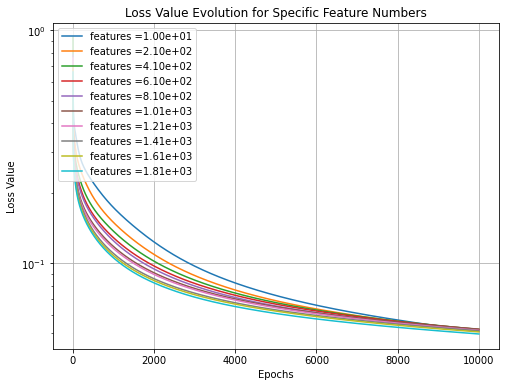

In [12]:
min_val = 10
#max_val = 6000
max_val = 2010
stepsize = 10
assert ((max_val-min_val) % stepsize == 0), "Wrong step size!"
test = run_out_features(min_val,max_val,stepsize)

lable_targets = [((max_val - min_val)/stepsize)*i+min_val for i in range(stepsize)]
formatted_labels = [f'{label:.2e}' for label in lable_targets]

plt.figure(figsize=(8, 6))

for y,label in zip(test,formatted_labels):
    plt.plot(y,label="features ="+label)
    
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss Value")
plt.legend(loc='upper left')  # Add a legend to identify the lines
plt.title("Loss Value Evolution for Specific Feature Numbers")

#plt.ylim(0, 0.2)
plt.grid(True)